# Task 2: Deep Learning AE Pipeline - Data Preprocessing

This notebook implements the data preprocessing pipeline for the predictive maintenance task.

**Pipeline Steps:**
1.  **Extract Data:** Load parquet files.
2.  **Time Alignment:** Round timestamps to the nearest second and create a unified 1Hz grid.
3.  **Gap Handling & Forward Fill:** Forward fill data with a limit of 5 minutes (300 seconds). Gaps larger than 5 minutes remain as NaN.
4.  **EMA:** Apply Exponential Moving Average (alpha=0.1) to analog signals.
5.  **Transition Flagging:** Identify and store transitions (value changes) for `ball_valve_open` and `ball_valve_closed`.
6.  **Output:** Store processed time-series and transition logs as pickle files in `data_transitions`.

**Note:** This notebook assumes the raw parquet files are located in `../axpo_challenge/data/`.

# Data Prepocessing

In [1]:
import pandas as pd
import numpy as np
import glob
import os
import pickle

# Configuration
DATA_DIR = 'data'
OUTPUT_DIR = 'data/data_transitions'
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Preprocessing Parameters
EMA_ALPHA = 0.5
GAP_THRESHOLD_SECONDS = 300  # 5 minutes limit for forward fill

print(f"Data Directory: {DATA_DIR}")
print(f"Output Directory: {OUTPUT_DIR}")

Data Directory: data
Output Directory: data/data_transitions


In [2]:
# ----------------------------------------------------------------------
# SIGNAL MAPPING
# ----------------------------------------------------------------------
mapping = {
    'signal_id': [8890,9620,9619,11247,11333,11331,16769,15454,15453,16679,14156,14154,
                  26499,30654,30653,29296,29388,29386,16796,24141,24140,25120,25207,25205,
                  18263,19318,19317,21058,21145,21143],
    'measurement_unit': ['MW','', '', '%','bar','bar','MW','','','%','bar','bar',
                         'MW','','','%','bar','bar','MW','','','%','bar','bar',
                         'MW','','','%','bar','bar'],
    'type_id': ['measurement (analog)','Bool','Bool','measurement (analog)','measurement (analog)','measurement (analog)',
                'measurement (analog)','Bool','Bool','measurement (analog)','measurement (analog)','measurement (analog)',
                'measurement (analog)','Bool','Bool','measurement (analog)','measurement (analog)','measurement (analog)',
                'measurement (analog)','Bool','Bool','measurement (analog)','measurement (analog)','measurement (analog)',
                'measurement (analog)','Bool','Bool','measurement (analog)','measurement (analog)','measurement (analog)'],
    'plant': ['KSL']*30,
    'stage': ['Mapragg','Mapragg','Mapragg','Mapragg','Mapragg','Mapragg',
              'Sarelli','Sarelli','Sarelli','Sarelli','Sarelli','Sarelli',
              'Mapragg','Mapragg','Mapragg','Mapragg','Mapragg','Mapragg',
              'Sarelli','Sarelli','Sarelli','Sarelli','Sarelli','Sarelli',
              'Mapragg','Mapragg','Mapragg','Mapragg','Mapragg','Mapragg'],
    'machine_group': ['MG1','MG1','MG1','MG1','MG1','MG1',
                      'MG1','MG1','MG1','MG1','MG1','MG1',
                      'MG2','MG2','MG2','MG2','MG2','MG2',
                      'MG2','MG2','MG2','MG2','MG2','MG2',
                      'MG3','MG3','MG3','MG3','MG3','MG3'],
    'signal_name': ['active_power','ball_valve_closed','ball_valve_open','guide_vane_position',
                    'water_pressure_downstream','water_pressure_upstream',
                    'active_power','ball_valve_closed','ball_valve_open','guide_vane_position',
                    'water_pressure_downstream','water_pressure_upstream',
                    'active_power','ball_valve_closed','ball_valve_open','guide_vane_position',
                    'water_pressure_downstream','water_pressure_upstream',
                    'active_power','ball_valve_closed','ball_valve_open','guide_vane_position',
                    'water_pressure_downstream','water_pressure_upstream',
                    'active_power','ball_valve_closed','ball_valve_open','guide_vane_position',
                    'water_pressure_downstream','water_pressure_upstream'],
    'description': [
        'Active power measurement',
        'Ball valve position rotating body closed (true if valve is fully closed)',
        'Ball valve position rotating body open (true if valve is fully open)',
        'Guide vane position measurement',
        'water pressure downstream of the turbine',
        'water pressure upstream of the turbine',
        'Active power measurement',
        'Ball valve position rotating body closed (true if valve is fully closed)',
        'Ball valve position rotating body open (true if valve is fully open)',
        'Guide vane position measurement',
        'water pressure downstream of the turbine',
        'water pressure upstream of the turbine',
        'Active power measurement',
        'Ball valve position rotating body closed (true if valve is fully closed)',
        'Ball valve position rotating body open (true if valve is fully open)',
        'Guide vane position measurement',
        'water pressure downstream of the turbine',
        'water pressure upstream of the turbine',
        'Active power measurement',
        'Ball valve position rotating body closed (true if valve is fully closed)',
        'Ball valve position rotating body open (true if valve is fully open)',
        'Guide vane position measurement',
        'water pressure downstream of the turbine',
        'water pressure upstream of the turbine',
        'Active power measurement',
        'Ball valve position rotating body closed (true if valve is fully closed)',
        'Ball valve position rotating body open (true if valve is fully open)',
        'Guide vane position measurement',
        'water pressure downstream of the turbine',
        'water pressure upstream of the turbine',
    ]
}

df_mapping = pd.DataFrame(mapping)
df_mapping.head()

,signal_id,measurement_unit,type_id,plant,stage,machine_group,signal_name,description
0,8890,MW,measurement (analog),KSL,Mapragg,MG1,active_power,Active power measurement
1,9620,,Bool,KSL,Mapragg,MG1,ball_valve_closed,Ball valve position rotating body closed (true...
2,9619,,Bool,KSL,Mapragg,MG1,ball_valve_open,Ball valve position rotating body open (true i...
3,11247,%,measurement (analog),KSL,Mapragg,MG1,guide_vane_position,Guide vane position measurement
4,11333,bar,measurement (analog),KSL,Mapragg,MG1,water_pressure_downstream,water pressure downstream of the turbine


In [3]:
import os
import pandas as pd
import numpy as np

def process_parquet(file_path, df_map, output_dir, GAP_THRESHOLD_SECONDS=300, EMA_ALPHA=0.1):
    """
    Process a single parquet file with Robust NaN Handling:
    1. Load and map signals.
    2. Resample to 1s grid (time alignment).
    3. Forward fill small gaps (max 5 mins), leaving larger gaps as NaN.
    4. EMA smoothing for analog signals.
    5. Extract transitions for valves.
    6. Save processed data and transitions.
    """
    filename = os.path.basename(file_path)
    base_name = filename.replace('.parquet', '')
    print(f"Processing {filename}...")
    
    # 1. Load Parquet
    try:
        df = pd.read_parquet(file_path)
    except Exception as e:
        print(f"Error reading {file_path}: {e}")
        return

    # Ensure ts is datetime and timezone naive
    if not pd.api.types.is_datetime64_any_dtype(df['ts']):
        df['ts'] = pd.to_datetime(df['ts'])
    if df['ts'].dt.tz is not None:
        df['ts'] = df['ts'].dt.tz_convert(None)
        
    # Merge with mapping to get signal names and types
    df = df.merge(df_map[['signal_id', 'signal_name', 'type_id']], on='signal_id', how='inner')
    
    # 2. Time Alignment
    # FIX: Use .dt.round('1s') to explicitly round to nearest second and remove microseconds
    df['ts_rounded'] = df['ts'].dt.round('1s')

    # Ensure values are numeric
    df['value'] = pd.to_numeric(df['value'], errors='coerce')

    # Pivot to create unified grid for this asset (handles duplicates by averaging)
    pivot_df = df.pivot_table(index='ts_rounded', columns='signal_name', values='value', aggfunc='mean')
    
    # Create full 1s grid from min to max time to ensure continuous time axis
    full_idx = pd.date_range(start=pivot_df.index.min(), end=pivot_df.index.max(), freq='1s')
    
    # Reindex: This creates NaNs where timestamps are missing in the original data
    pivot_df = pivot_df.reindex(full_idx)
    pivot_df.index.name = 'ts'
    
    # 3. Robust NaN Handling: Forward Fill with Limit
    # We do NOT interpolate. We ffill up to 5 minutes.
    # Gaps larger than 5 minutes will remain NaN (to be dropped or handled by downstream windowing logic).
    pivot_df_filled = pivot_df.ffill(limit=GAP_THRESHOLD_SECONDS)
    
    # 4. Apply EMA to Analog Signals
    # Note: EMA handles NaNs gracefully (ignores them), but works best on the filled data
    analog_signals = df_map[df_map['type_id'] == 'measurement (analog)']['signal_name'].unique()
    
    for col in pivot_df_filled.columns:
        if col in analog_signals:
            pivot_df_filled[col] = pivot_df_filled[col].ewm(alpha=EMA_ALPHA, adjust=False).mean()

    # 5. Transition Flagging (for Boolean Signals)
    # We use the original pivot (or filled, depending on preference) to detect changes.
    # Usually, transitions should be detected on filled data to avoid false transitions around gaps,
    # but here we use the specific logic provided.
    bool_signals = df_map[df_map['type_id'] == 'Bool']['signal_name'].unique()
    transitions_list = []
    
    for col in bool_signals:
        # Check if column exists in data
        if col in pivot_df_filled.columns:
            s_raw = pivot_df_filled[col].dropna()
            
            if s_raw.empty:
                continue
            
            # Detect changes: value != prev_value
            prev = s_raw.shift(1)
            mask = (s_raw != prev) & prev.notna()
            
            num_trans = mask.sum()
            if num_trans > 0:
                trans_times = s_raw.index[mask]
                trans_values = s_raw[mask]
                prev_values = prev[mask]
                
                tdf = pd.DataFrame({
                    'timestamp': trans_times,
                    'signal': col,
                    'from_value': prev_values,
                    'to_value': trans_values
                })
                transitions_list.append(tdf)

    # 6. Save Outputs
    processed_path = os.path.join(output_dir, f"{base_name}_processed.pkl")
    pivot_df_filled.to_pickle(processed_path)
    print(f"  Saved processed data to {processed_path}")
    
    if transitions_list:
        all_transitions = pd.concat(transitions_list).sort_values('timestamp')
        trans_path = os.path.join(output_dir, f"{base_name}_transitions.pkl")
        all_transitions.to_pickle(trans_path)
        print(f"  Saved {len(all_transitions)} transitions to {trans_path}")
    else:
        print("  No transitions found.")

In [4]:
# ----------------------------------------------------------------------
# EXECUTE PIPELINE
# ----------------------------------------------------------------------
parquet_files = glob.glob(os.path.join(DATA_DIR, '*.parquet'))
print(f"Found {len(parquet_files)} parquet files.")

for path in parquet_files:
    process_parquet(path, df_mapping, OUTPUT_DIR)

print("\nPipeline execution complete.")

Found 10 parquet files.
Processing Mapragg_MG1_testing_real_measurements.parquet...
  Saved processed data to data/data_transitions\Mapragg_MG1_testing_real_measurements_processed.pkl
  Saved 440 transitions to data/data_transitions\Mapragg_MG1_testing_real_measurements_transitions.pkl
Processing Mapragg_MG1_training_real_measurements.parquet...
  Saved processed data to data/data_transitions\Mapragg_MG1_training_real_measurements_processed.pkl
  Saved 2610 transitions to data/data_transitions\Mapragg_MG1_training_real_measurements_transitions.pkl
Processing Mapragg_MG2_testing_real_measurements.parquet...
  Saved processed data to data/data_transitions\Mapragg_MG2_testing_real_measurements_processed.pkl
  Saved 410 transitions to data/data_transitions\Mapragg_MG2_testing_real_measurements_transitions.pkl
Processing Mapragg_MG2_training_real_measurements.parquet...
  Saved processed data to data/data_transitions\Mapragg_MG2_training_real_measurements_processed.pkl
  Saved 3060 transiti

In [6]:
# ----------------------------------------------------------------------
# INTERACTIVE TRANSITION INSPECTION
# ----------------------------------------------------------------------
import ipywidgets as widgets
from IPython.display import display
import matplotlib.pyplot as plt

# Ensure output directory for transitions is known
TRANSITIONS_DIR = 'data/data_transitions'

def get_transition_count(dataset_name):
    """Helper to get number of transitions for a dataset."""
    try:
        t_path = os.path.join(TRANSITIONS_DIR, f"{dataset_name}_transitions.pkl")
        if os.path.exists(t_path):
            df = pd.read_pickle(t_path)
            return len(df)
        return 0
    except:
        return 0

def plot_transition_inspector(dataset_name, transition_idx):
    """
    Plots 6 signals centered around a specific transition event.
    Overlays raw data points on top of the processed 1Hz line.
    """
    if not dataset_name:
        return
        
    # Paths
    proc_path = os.path.join(TRANSITIONS_DIR, f"{dataset_name}_processed.pkl")
    trans_path = os.path.join(TRANSITIONS_DIR, f"{dataset_name}_transitions.pkl")
    # Note: DATA_DIR is defined in the configuration cell above
    raw_path = os.path.join(DATA_DIR, f"{dataset_name}.parquet")
    
    # Load Transitions
    if not os.path.exists(trans_path):
        print("Transitions file not found.")
        return
    transitions = pd.read_pickle(trans_path)
    
    if transitions.empty:
        print("No transitions in this dataset.")
        return
        
    if transition_idx >= len(transitions):
        print(f"Transition index {transition_idx} out of range.")
        return

    # Get Event Info
    event = transitions.iloc[transition_idx]
    event_ts = event['timestamp']
    event_sig = event['signal']
    print(f"Dataset: {dataset_name}")
    print(f"Transition {transition_idx + 1}/{len(transitions)}")
    print(f"Signal: {event_sig} | Time: {event_ts}")
    print(f"Change: {event['from_value']} -> {event['to_value']}")
    
    # Define Time Window (+/- 150s)
    start_time = event_ts - pd.Timedelta(seconds=150)
    end_time = event_ts + pd.Timedelta(seconds=150)
    
    # Load Processed Data (Full load is fast for pkl)
    if not os.path.exists(proc_path):
        print("Processed file not found.")
        return
    df_proc = pd.read_pickle(proc_path)
    
    # Slice Processed
    mask_proc = (df_proc.index >= start_time) & (df_proc.index <= end_time)
    df_slice = df_proc[mask_proc]
    
    # Load Raw Data
    df_raw_slice = pd.DataFrame()
    if os.path.exists(raw_path):
        try:
            df_raw = pd.read_parquet(raw_path)
            
            # Ensure TS format
            if not pd.api.types.is_datetime64_any_dtype(df_raw['ts']):
                df_raw['ts'] = pd.to_datetime(df_raw['ts'])
            if df_raw['ts'].dt.tz is not None:
                df_raw['ts'] = df_raw['ts'].dt.tz_convert(None)
                
            # Filter Time Window
            mask_raw = (df_raw['ts'] >= start_time) & (df_raw['ts'] <= end_time)
            df_raw_slice = df_raw[mask_raw].copy()
            
            # Merge with mapping to get names
            if not df_raw_slice.empty:
                df_raw_slice = df_raw_slice.merge(df_mapping[['signal_id', 'signal_name']], on='signal_id', how='left')
        except Exception as e:
            print(f"Error loading raw data: {e}")
    else:
        print(f"Raw file not found: {raw_path}")
            
    # Plotting
    signals = [
        'active_power', 'ball_valve_closed', 'ball_valve_open',
        'guide_vane_position', 'water_pressure_downstream', 'water_pressure_upstream'
    ]
    
    fig, axes = plt.subplots(len(signals), 1, figsize=(14, 2.5 * len(signals)), sharex=True)
    
    for ax, sig in zip(axes, signals):
        # 1. Plot Processed (Line)
        if sig in df_slice.columns:
            ax.plot(df_slice.index, df_slice[sig], label='Processed (1Hz)', color='tab:blue', linewidth=2, alpha=0.6)
            
        # 2. Plot Raw (Scatter)
        if not df_raw_slice.empty:
            raw_sig = df_raw_slice[df_raw_slice['signal_name'] == sig]
            if not raw_sig.empty:
                ax.scatter(raw_sig['ts'], raw_sig['value'], label='Raw', color='tab:red', s=20, alpha=0.8, marker='x', zorder=5)
        
        # 3. Transition Marker
        ax.axvline(event_ts, color='k', linestyle='--', alpha=0.7, label='Transition Event')
        
        ax.set_ylabel(sig, fontsize=10)
        ax.grid(True, alpha=0.3)
        if sig == signals[0]:
            ax.legend(loc='upper right', fontsize='small')
            
    plt.xlabel('Timestamp')
    plt.tight_layout()
    plt.show()

# --- Widget Setup ---
# Get list of processed datasets
processed_files = sorted([f.replace('_processed.pkl', '') for f in os.listdir(TRANSITIONS_DIR) if f.endswith('_processed.pkl')])

# Create Widgets
ds_dropdown = widgets.Dropdown(options=processed_files, description='Dataset:')
idx_slider = widgets.IntSlider(min=0, max=0, step=1, description='Transition #:', continuous_update=False)

def update_slider_range(*args):
    dataset = ds_dropdown.value
    count = get_transition_count(dataset)
    idx_slider.max = max(0, count - 1)
    idx_slider.value = 0

ds_dropdown.observe(update_slider_range, 'value')

# Initialize slider
update_slider_range()

# Interact
widgets.interact(plot_transition_inspector, dataset_name=ds_dropdown, transition_idx=idx_slider);

interactive(children=(Dropdown(description='Dataset:', options=('Mapragg_MG1_testing_real_measurements', 'Mapr…

## Anomalies detections

In [9]:
# ----------------------------------------------------------------------
# DÉTECTION DES ANOMALIES DE TRANSITIONS
# 1. Transitions doubles (open/close en même temps)
# 2. Transitions open/close rapides (< 180 secondes)
# ----------------------------------------------------------------------
import pandas as pd
import numpy as np
import os

TRANSITIONS_DIR = 'data_transitions'

def detect_transition_anomalies(dataset_name):
    """
    Détecte deux types d'anomalies dans les transitions :
    1. Transitions doubles : ball_valve_open et ball_valve_closed changent au même timestamp
    2. Transitions rapides : open/close à moins de 180 secondes d'intervalle
    """
    trans_path = os.path.join(TRANSITIONS_DIR, f"{dataset_name}_transitions.pkl")
    
    if not os.path.exists(trans_path):
        print(f"Fichier de transitions non trouvé : {trans_path}")
        return None
    
    df_trans = pd.read_pickle(trans_path)
    
    if df_trans.empty:
        print(f"Aucune transition trouvée pour {dataset_name}")
        return None
    
    df_trans = df_trans.sort_values('timestamp').reset_index(drop=True)
    
    # Initialiser les colonnes d'anomalies
    df_trans['is_double_transition'] = False
    df_trans['is_rapid_transition'] = False
    df_trans['anomaly_reason'] = ''
    
    # 1. DÉTECTION DES TRANSITIONS DOUBLES
    # Vérifier si open et closed changent au même timestamp (ou très proche, < 1 seconde)
    for i in range(len(df_trans)):
        current = df_trans.iloc[i]
        current_ts = current['timestamp']
        current_sig = current['signal']
        
        # Chercher les transitions sur l'autre signal au même timestamp
        time_tolerance = pd.Timedelta(seconds=1)
        mask_same_time = (
            (df_trans['timestamp'] >= current_ts - time_tolerance) &
            (df_trans['timestamp'] <= current_ts + time_tolerance) &
            (df_trans['signal'] != current_sig)
        )
        
        if mask_same_time.any():
            # Vérifier si c'est une transition contradictoire
            other_transitions = df_trans[mask_same_time]
            for _, other in other_transitions.iterrows():
                # Si open passe à 1 ET closed passe à 1 en même temps -> anomalie
                # Si open passe à 0 ET closed passe à 0 en même temps -> anomalie
                if (current_sig == 'ball_valve_open' and other['signal'] == 'ball_valve_closed'):
                    if (current['to_value'] == 1 and other['to_value'] == 1) or \
                       (current['to_value'] == 0 and other['to_value'] == 0):
                        df_trans.at[i, 'is_double_transition'] = True
                        df_trans.at[i, 'anomaly_reason'] = 'double_transition'
                        # Marquer aussi l'autre transition
                        other_idx = other.name
                        df_trans.at[other_idx, 'is_double_transition'] = True
                        df_trans.at[other_idx, 'anomaly_reason'] = 'double_transition'
    
    # 2. DÉTECTION DES TRANSITIONS RAPIDES (< 180 secondes)
    # Pour chaque transition, vérifier s'il y a une transition opposée dans les 180 secondes
    for i in range(len(df_trans)):
        current = df_trans.iloc[i]
        current_ts = current['timestamp']
        current_sig = current['signal']
        
        # Chercher les transitions opposées dans les 180 secondes suivantes
        time_window = pd.Timedelta(seconds=180)
        mask_future = (
            (df_trans['timestamp'] > current_ts) &
            (df_trans['timestamp'] <= current_ts + time_window) &
            (df_trans['signal'] != current_sig)
        )
        
        if mask_future.any():
            future_transitions = df_trans[mask_future]
            for _, future in future_transitions.iterrows():
                # Vérifier si c'est une transition opposée logique
                is_opposite = False
                
                if current_sig == 'ball_valve_open' and future['signal'] == 'ball_valve_closed':
                    # open -> 1, puis closed -> 1 (ouverture puis fermeture rapide)
                    if current['to_value'] == 1 and future['to_value'] == 1:
                        is_opposite = True
                    # open -> 0, puis closed -> 0 (fermeture puis ouverture rapide)
                    elif current['to_value'] == 0 and future['to_value'] == 0:
                        is_opposite = True
                        
                elif current_sig == 'ball_valve_closed' and future['signal'] == 'ball_valve_open':
                    # closed -> 1, puis open -> 1 (fermeture puis ouverture rapide)
                    if current['to_value'] == 1 and future['to_value'] == 1:
                        is_opposite = True
                    # closed -> 0, puis open -> 0 (ouverture puis fermeture rapide)
                    elif current['to_value'] == 0 and future['to_value'] == 0:
                        is_opposite = True
                
                if is_opposite:
                    time_diff = (future['timestamp'] - current_ts).total_seconds()
                    df_trans.at[i, 'is_rapid_transition'] = True
                    if df_trans.at[i, 'anomaly_reason']:
                        df_trans.at[i, 'anomaly_reason'] += f', rapid_transition_{time_diff:.0f}s'
                    else:
                        df_trans.at[i, 'anomaly_reason'] = f'rapid_transition_{time_diff:.0f}s'
                    
                    # Marquer aussi la transition future
                    future_idx = future.name
                    df_trans.at[future_idx, 'is_rapid_transition'] = True
                    if df_trans.at[future_idx, 'anomaly_reason']:
                        df_trans.at[future_idx, 'anomaly_reason'] += f', rapid_transition_{time_diff:.0f}s'
                    else:
                        df_trans.at[future_idx, 'anomaly_reason'] = f'rapid_transition_{time_diff:.0f}s'
    
    # Résumé
    n_double = df_trans['is_double_transition'].sum()
    n_rapid = df_trans['is_rapid_transition'].sum()
    n_total_anomalies = (df_trans['is_double_transition'] | df_trans['is_rapid_transition']).sum()
    
    print(f"\n{'='*60}")
    print(f"Dataset: {dataset_name}")
    print(f"{'='*60}")
    print(f"Total transitions: {len(df_trans)}")
    print(f"Transitions doubles (open/close simultanés): {n_double}")
    print(f"Transitions rapides (< 180s): {n_rapid}")
    print(f"Total anomalies détectées: {n_total_anomalies}")
    print(f"{'='*60}\n")
    
    return df_trans

def analyze_all_datasets(split='all'):
    """
    Analyse tous les datasets et génère un rapport global.
    
    Parameters:
    -----------
    split : str, default='all'
        Choix du type de données à analyser:
        - 'training' : uniquement les données d'entraînement
        - 'testing' : uniquement les données de test
        - 'all' : toutes les données
    """
    files = [f.replace('_transitions.pkl', '') for f in os.listdir(TRANSITIONS_DIR) 
             if f.endswith('_transitions.pkl')]
    
    # Filtrer selon le split choisi
    if split == 'training':
        files = [f for f in files if 'training' in f]
        print(f"Analyse des données d'ENTRAÎNEMENT uniquement...")
    elif split == 'testing':
        files = [f for f in files if 'testing' in f]
        print(f"Analyse des données de TEST uniquement...")
    else:
        print(f"Analyse de TOUTES les données...")
    
    if not files:
        print(f"Aucun fichier trouvé pour le split '{split}'")
        return None
    
    all_anomalies = []
    
    for dataset_name in files:
        df_anomalies = detect_transition_anomalies(dataset_name)
        if df_anomalies is not None:
            # Sauvegarder les transitions avec flags d'anomalies
            output_path = os.path.join(TRANSITIONS_DIR, f"{dataset_name}_transitions_anomalies.pkl")
            df_anomalies.to_pickle(output_path)
            print(f"  Sauvegardé: {output_path}")
            
            # Compter les anomalies
            n_double = df_anomalies['is_double_transition'].sum()
            n_rapid = df_anomalies['is_rapid_transition'].sum()
            n_total = (df_anomalies['is_double_transition'] | df_anomalies['is_rapid_transition']).sum()
            
            all_anomalies.append({
                'dataset': dataset_name,
                'total_transitions': len(df_anomalies),
                'double_transitions': n_double,
                'rapid_transitions': n_rapid,
                'total_anomalies': n_total
            })
    
    # Résumé global
    if all_anomalies:
        df_summary = pd.DataFrame(all_anomalies)
        
        # Ajouter les colonnes de pourcentages pour chaque ligne
        df_summary['%_double'] = (df_summary['double_transitions'] / df_summary['total_transitions'] * 100).round(2)
        df_summary['%_rapid'] = (df_summary['rapid_transitions'] / df_summary['total_transitions'] * 100).round(2)
        df_summary['%_total'] = (df_summary['total_anomalies'] / df_summary['total_transitions'] * 100).round(2)
        
        # Réorganiser les colonnes pour un affichage plus lisible
        df_summary = df_summary[['dataset', 'total_transitions', 'double_transitions', '%_double', 
                                  'rapid_transitions', '%_rapid', 'total_anomalies', '%_total']]
        
        print("\n" + "="*60)
        print(f"RÉSUMÉ GLOBAL DES ANOMALIES ({split.upper()})")
        print("="*60)
        print(df_summary.to_string(index=False))
        print("\n" + "="*60)
        total_transitions = df_summary['total_transitions'].sum()
        total_double = df_summary['double_transitions'].sum()
        total_rapid = df_summary['rapid_transitions'].sum()
        total_anomalies = df_summary['total_anomalies'].sum()
        
        # Calculer les proportions
        prop_rapid = (total_rapid / total_transitions * 100) if total_transitions > 0 else 0
        prop_double = (total_double / total_transitions * 100) if total_transitions > 0 else 0
        prop_total = (total_anomalies / total_transitions * 100) if total_transitions > 0 else 0
        
        print(f"Total transitions analysées: {total_transitions}")
        print(f"Total anomalies (doubles): {total_double} ({prop_double:.2f}%)")
        print(f"Total anomalies (rapides): {total_rapid} ({prop_rapid:.2f}%)")
        print(f"Total anomalies (toutes): {total_anomalies} ({prop_total:.2f}%)")
        print("="*60)
        
        return df_summary
    
    return None

In [11]:
# ==============================================================================
# CHOIX DU TYPE DE DONNÉES À ANALYSER
# Modifier la variable SPLIT_CHOICE pour choisir:
# - 'training' : données d'entraînement uniquement
# - 'testing' : données de test uniquement  
# - 'all' : toutes les données
# ==============================================================================
SPLIT_CHOICE = 'training'  # Modifier cette variable pour changer le choix

# Exécuter l'analyse
print("Analyse des anomalies de transitions...")
summary = analyze_all_datasets(split=SPLIT_CHOICE)

Analyse des anomalies de transitions...
Analyse des données d'ENTRAÎNEMENT uniquement...

Dataset: Mapragg_MG2_training_real_measurements
Total transitions: 3060
Transitions doubles (open/close simultanés): 0
Transitions rapides (< 180s): 1402
Total anomalies détectées: 1402

  Sauvegardé: data_transitions/Mapragg_MG2_training_real_measurements_transitions_anomalies.pkl

Dataset: Sarelli_MG1_training_real_measurements
Total transitions: 1090
Transitions doubles (open/close simultanés): 0
Transitions rapides (< 180s): 10
Total anomalies détectées: 10

  Sauvegardé: data_transitions/Sarelli_MG1_training_real_measurements_transitions_anomalies.pkl

Dataset: Mapragg_MG3_training_real_measurements
Total transitions: 2108
Transitions doubles (open/close simultanés): 0
Transitions rapides (< 180s): 1064
Total anomalies détectées: 1064

  Sauvegardé: data_transitions/Mapragg_MG3_training_real_measurements_transitions_anomalies.pkl

Dataset: Mapragg_MG1_training_real_measurements
Total transiti

## Deep Learning approach to identify transitions

In [ ]:
# ----------------------------------------------------------------------
# DEEP LEARNING CLASSIFIER (ROBUST VERSION)
# ----------------------------------------------------------------------
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

# Configuration
WINDOW_SECONDS = 360
HALF_WINDOW = 180
BATCH_SIZE = 32
EPOCHS = 10
TEST_SPLIT = 0.2
LEARNING_RATE = 1e-4

# Directories (Ensure these match your variables from previous cells)
# DATA_DIR = ... 
# TRANSITIONS_DIR = ... 

# 1. Dataset Preparation Class (With Debugging & Fixes)
class WindowExtractor:
    def __init__(self, data_dir, half_window=180):
        self.data_dir = data_dir
        self.half_window = half_window
        self.feature_cols = [
            'active_power', 'ball_valve_closed', 'ball_valve_open',
            'guide_vane_position', 'water_pressure_downstream', 'water_pressure_upstream'
        ]
        
    def extract_windows(self, processed_file, transitions_file):
        if not os.path.exists(processed_file) or not os.path.exists(transitions_file):
            return [], []
            
        df = pd.read_pickle(processed_file)
        df_trans = pd.read_pickle(transitions_file)
        
        # --- FIX 1: FILL NANS IMMEDIATELY ---
        # This prevents dropping valid windows just because of one missing tick
        df = df.fillna(method='ffill').fillna(method='bfill')
        
        if df_trans.empty:
            return [], []
            
        # Group transitions within 180s
        df_trans = df_trans.sort_values('timestamp')
        grouped_events = []
        
        if not df_trans.empty:
            current_group = [df_trans.iloc[0]]
            for i in range(1, len(df_trans)):
                curr = df_trans.iloc[i]
                prev = current_group[-1]
                diff = (curr['timestamp'] - prev['timestamp']).total_seconds()
                if diff < 180:
                    current_group.append(curr)
                else:
                    grouped_events.append(current_group)
                    current_group = [curr]
            grouped_events.append(current_group)
            
        X_events = []
        y_events = []
        event_indices = []
        
        # Debug counters for this file
        stats = {'found': 0, 'bounds_err': 0, 'nan_err': 0, 'ok': 0}
        
        for group in grouped_events:
            stats['found'] += 1
            
            # 1. Determine Time Center
            min_ts = group[0]['timestamp']
            max_ts = group[-1]['timestamp']
            center_ts = min_ts + (max_ts - min_ts) / 2
            center_ts = center_ts.round('1s')
            
            # 2. Determine Label
            votes_opening = 0
            votes_closing = 0
            for row in group:
                sig = row['signal']
                v_from = row['from_value']
                v_to = row['to_value']
                if sig == 'ball_valve_open':
                    if v_from == 0 and v_to == 1: votes_opening += 1
                    elif v_from == 1 and v_to == 0: votes_closing += 1
                elif sig == 'ball_valve_closed':
                    if v_from == 0 and v_to == 1: votes_closing += 1
                    elif v_from == 1 and v_to == 0: votes_opening += 1
            
            if votes_opening > votes_closing: label = 1
            elif votes_closing > votes_opening: label = 2
            else: continue

            # 3. Extract Window
            try:
                idx = df.index.searchsorted(center_ts)
                if idx == 0: center_idx = 0
                elif idx == len(df): center_idx = len(df) - 1
                else:
                    ts_prev = df.index[idx-1]
                    ts_curr = df.index[idx]
                    if abs((ts_curr - center_ts).total_seconds()) < abs((ts_prev - center_ts).total_seconds()):
                        center_idx = idx
                    else:
                        center_idx = idx - 1
                
                start_idx = center_idx - self.half_window
                end_idx = center_idx + self.half_window
                
                # Check Bounds
                if start_idx < 0 or end_idx > len(df):
                    stats['bounds_err'] += 1
                    continue
                    
                vals = df.iloc[start_idx:end_idx][self.feature_cols].values
                
                # Check NaNs (Should be clean due to fillna above, but double check)
                if np.isnan(vals).any():
                    stats['nan_err'] += 1
                    continue

                if vals.shape[0] == 2 * self.half_window:
                    X_events.append(vals)
                    y_events.append(label)
                    event_indices.append((df.index[start_idx], df.index[end_idx-1]))
                    stats['ok'] += 1
            except Exception:
                continue
        
        # Uncomment to see debug stats per file
        # if stats['found'] > 0 and stats['ok'] == 0:
        #    print(f"Debug {os.path.basename(processed_file)}: {stats}")

        # Extract Steady State (Non-Transition) Windows
        # We aim for roughly balanced dataset, but ensure at least some steady states
        n_steady_target = len(X_events) // 2 if X_events else 0
        
        X_steady = []
        y_steady = []
        
        attempts = 0
        max_attempts = max(50, n_steady_target * 10)
        
        min_idx = self.half_window
        max_idx = len(df) - self.half_window
        
        if max_idx > min_idx and n_steady_target > 0:
            while len(X_steady) < n_steady_target and attempts < max_attempts:
                attempts += 1
                rand_idx = random.randint(min_idx, max_idx)
                
                r_start_time = df.index[rand_idx - self.half_window]
                r_end_time = df.index[rand_idx + self.half_window]
                
                overlap = False
                for (e_start, e_end) in event_indices:
                    if (r_start_time <= e_end) and (r_end_time >= e_start):
                        overlap = True
                        break
                
                if not overlap:
                    vals = df.iloc[rand_idx - self.half_window : rand_idx + self.half_window][self.feature_cols].values
                    if not np.isnan(vals).any() and vals.shape[0] == 2 * self.half_window:
                        X_steady.append(vals)
                        y_steady.append(0) 
                        
        return X_events + X_steady, y_events + y_steady

# 2. Data Loading
def load_all_data():
    extractor = WindowExtractor(DATA_DIR, half_window=HALF_WINDOW)
    
    X_train_list, y_train_list = [], []
    X_test_list, y_test_list = [], []
    
    files = [f for f in os.listdir(TRANSITIONS_DIR) if f.endswith('_processed.pkl')]
    
    print(f"Found {len(files)} processed files.")
    
    for f in tqdm(files, desc="Loading Files"):
        base = f.replace('_processed.pkl', '')
        processed_path = os.path.join(TRANSITIONS_DIR, f)
        transitions_path = os.path.join(TRANSITIONS_DIR, f"{base}_transitions.pkl")
        
        X, y = extractor.extract_windows(processed_path, transitions_path)
        
        if 'training' in base:
            X_train_list.extend(X)
            y_train_list.extend(y)
        elif 'testing' in base:
            X_test_list.extend(X)
            y_test_list.extend(y)
            
    return np.array(X_train_list), np.array(y_train_list), np.array(X_test_list), np.array(y_test_list)

print("Extracting windows...")
X_train_raw, y_train_raw, X_test_raw, y_test_raw = load_all_data()

print(f"Training Samples Extracted: {len(X_train_raw)}")
print(f"Testing Samples Extracted: {len(X_test_raw)}")

# 3. Preprocessing (With Safety Check)
if len(X_train_raw) > 5:  # --- CHECK: Ensure we have enough data ---
    
    print("Standardizing Data...")
    scaler = StandardScaler()
    N_train, T, F = X_train_raw.shape
    X_train_flat = X_train_raw.reshape(-1, F)
    scaler.fit(X_train_flat)
    
    X_train_scaled = scaler.transform(X_train_flat).reshape(N_train, F, T)
    X_train_scaled = X_train_scaled.transpose(0, 1, 2) # (N, Channels, Time)
    
    if len(X_test_raw) > 0:
        N_test, _, _ = X_test_raw.shape
        X_test_flat = X_test_raw.reshape(-1, F)
        X_test_trans = scaler.transform(X_test_flat).reshape(N_test, T, F)
        X_test_scaled = X_test_trans.transpose(0, 2, 1)
    else:
        X_test_scaled = np.array([])

    # --- SAFE STRATIFICATION LOGIC ---
    unique_classes, class_counts = np.unique(y_train_raw, return_counts=True)
    print(f"Class distribution: {dict(zip(unique_classes, class_counts))}")
    
    stratify_param = y_train_raw
    if np.min(class_counts) < 2:
        print("Warning: One or more classes have < 2 samples. Disabling stratification.")
        stratify_param = None
        
    X_train, X_val, y_train, y_val = train_test_split(
        X_train_scaled, y_train_raw, test_size=TEST_SPLIT, random_state=42, stratify=stratify_param
    )

    class ValveDataset(Dataset):
        def __init__(self, X, y):
            self.X = torch.FloatTensor(X)
            self.y = torch.LongTensor(y)
        def __len__(self): return len(self.X)
        def __getitem__(self, i): return self.X[i], self.y[i]

    train_loader = DataLoader(ValveDataset(X_train, y_train), batch_size=BATCH_SIZE, shuffle=True)
    val_loader = DataLoader(ValveDataset(X_val, y_val), batch_size=BATCH_SIZE)
    if len(X_test_scaled) > 0:
        test_loader = DataLoader(ValveDataset(X_test_scaled, y_test_raw), batch_size=BATCH_SIZE)
    else:
        test_loader = None
        
    # 4. Model Definition
    class ValveClassifier(nn.Module):
        def __init__(self, num_features, num_classes):
            super().__init__()
            self.features = nn.Sequential(
                nn.Conv1d(num_features, 64, kernel_size=5, padding=2),
                nn.ReLU(),
                nn.BatchNorm1d(64),
                nn.MaxPool1d(2),
                nn.Dropout(0.1),
                
                nn.Conv1d(64, 128, kernel_size=5, padding=2),
                nn.ReLU(),
                nn.BatchNorm1d(128),
                nn.MaxPool1d(2),
                nn.Dropout(0.1),
                
                nn.Conv1d(128, 256, kernel_size=3, padding=1),
                nn.ReLU(),
                nn.BatchNorm1d(256),
                nn.AdaptiveAvgPool1d(1)
            )
            self.classifier = nn.Sequential(
                nn.Linear(256, 128),
                nn.ReLU(),
                nn.Dropout(0.5),
                nn.Linear(128, num_classes)
            )
            
        def forward(self, x):
            x = self.features(x)
            x = x.flatten(1)
            x = self.classifier(x)
            return x

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    # Determine number of classes dynamically
    num_classes = len(np.unique(y_train_raw))
    # Ensure at least 3 output neurons (Steady, Open, Close) even if data is missing some
    num_classes = max(3, num_classes) 
    
    model = ValveClassifier(num_features=6, num_classes=num_classes).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

    # 5. Training Loop
    print("\nStarting Training...")
    history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}
    
    for epoch in tqdm(range(EPOCHS), desc="Epochs"):
        model.train()
        train_loss = 0
        correct = 0
        total = 0
        
        for X_b, y_b in train_loader:
            X_b, y_b = X_b.to(device), y_b.to(device)
            
            optimizer.zero_grad()
            outputs = model(X_b)
            loss = criterion(outputs, y_b)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            
            train_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += y_b.size(0)
            correct += (predicted == y_b).sum().item()
            
        avg_train_loss = train_loss/len(train_loader) if len(train_loader) > 0 else 0
        avg_train_acc = 100*correct/total if total > 0 else 0
        
        # Validation
        model.eval()
        val_loss = 0
        val_correct = 0
        val_total = 0
        with torch.no_grad():
            for X_b, y_b in val_loader:
                X_b, y_b = X_b.to(device), y_b.to(device)
                outputs = model(X_b)
                loss = criterion(outputs, y_b)
                val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                val_total += y_b.size(0)
                val_correct += (predicted == y_b).sum().item()
                
        avg_val_loss = val_loss/len(val_loader) if len(val_loader) > 0 else 0
        avg_val_acc = 100*val_correct/val_total if val_total > 0 else 0
        
        history['train_loss'].append(avg_train_loss)
        history['val_loss'].append(avg_val_loss)
        history['train_acc'].append(avg_train_acc)
        history['val_acc'].append(avg_val_acc)
        
        print(f"Epoch {epoch+1}/{EPOCHS} | "
              f"Train Loss: {avg_train_loss:.4f} Acc: {avg_train_acc:.2f}% | "
              f"Val Loss: {avg_val_loss:.4f} Acc: {avg_val_acc:.2f}%")

    # 6. Evaluation & Plotting
    if test_loader:
        print("\nEvaluating on Test Set...")
        model.eval()
        test_correct = 0
        test_total = 0
        with torch.no_grad():
            for X_b, y_b in test_loader:
                X_b, y_b = X_b.to(device), y_b.to(device)
                outputs = model(X_b)
                _, predicted = torch.max(outputs.data, 1)
                test_total += y_b.size(0)
                test_correct += (predicted == y_b).sum().item()
        if test_total > 0:
            print(f"Test Accuracy: {100*test_correct/test_total:.2f}%")
        
    # Plotting
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(history['train_loss'], label='Train Loss')
    plt.plot(history['val_loss'], label='Val Loss')
    plt.title('Loss Evolution')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    
    plt.subplot(1, 2, 2)
    plt.plot(history['train_acc'], label='Train Acc')
    plt.plot(history['val_acc'], label='Val Acc')
    plt.title('Accuracy Evolution')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.legend()
    plt.grid(True)
    
    plt.show()

else:
    print("\n!!! NOT ENOUGH DATA TO TRAIN !!!")
    print(f"Only found {len(X_train_raw)} valid samples.")
    print("Likely causes:")
    print("1. Transitions are too close to start/end of file (Bounds Error).")
    print("2. Data contains NaNs (NaN Error).")
    print("3. Check 'Debug' prints above if enabled.")

Extracting windows...
Found 10 processed files.


Loading Files:   0%|          | 0/10 [00:00<?, ?it/s]

/var/folders/46/y0431pbj0sl3y6mcthks8j1r0000gn/T/ipykernel_9357/1301717459.py:48: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='ffill').fillna(method='bfill')
/var/folders/46/y0431pbj0sl3y6mcthks8j1r0000gn/T/ipykernel_9357/1301717459.py:48: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='ffill').fillna(method='bfill')
/var/folders/46/y0431pbj0sl3y6mcthks8j1r0000gn/T/ipykernel_9357/1301717459.py:48: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='ffill').fillna(method='bfill')
/var/folders/46/y0431pbj0sl3y6mcthks8j1r0000gn/T/ipykernel_9357/1301717459.py:48: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. 

# Autoencoder per signal

## Autoencoder per signals definition

In [19]:
# ----------------------------------------------------------------------
# AUTOENCODER + HDBSCAN ANOMALY DETECTION PIPELINE
# VERSION 1: Trains SEPARATE autoencoders for EACH SIGNAL
# ----------------------------------------------------------------------
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import Dataset, DataLoader, TensorDataset, random_split
from sklearn.preprocessing import StandardScaler
import hdbscan
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import os
import pickle

# Configuration
WINDOW_SECONDS = 360
HALF_WINDOW = 180
BATCH_SIZE = 64
EPOCHS_AE = 50
LEARNING_RATE_AE = 3e-4  # Changed from 0.001 for better convergence (especially active_power)
WEIGHT_DECAY_AE = 1e-4   # L2 regularization for smoother reconstructions

# Noise control (for denoising autoencoder training in standardized space)
NOISE_STD_AE = 0.01      # try 0.0 to disable, or 0.005-0.02
# Smoothness penalty weight (total variation)
SMOOTH_LAMBDA_AE = 1e-3  # try 0.0 to disable, or 1e-4 to 1e-2
BOTTLENECK_DIM = 32
CONV_KERNEL_SIZE = 7  # Kernel size for Conv1D layers (larger = smoother, less noise)
TRANSITIONS_DIR = 'data_transitions'

SIGNALS = ['active_power', 'ball_valve_closed', 'ball_valve_open',
           'guide_vane_position', 'water_pressure_downstream', 'water_pressure_upstream']

# ==============================================================================
# 1. 1D CONVOLUTIONAL AUTOENCODER DEFINITION (Per Signal)
# ==============================================================================
class Encoder(nn.Module):
    """Three-layer LSTM encoder for single signal."""
    def __init__(self, n_features, embedding_dim, hidden_size=128):
        super(Encoder, self).__init__()
        # Layer 1: Expand
        self.lstm1 = nn.LSTM(input_size=n_features, hidden_size=hidden_size, 
                             num_layers=1, batch_first=True, bidirectional=False)
        # Layer 2: Intermediate processing
        self.lstm2 = nn.LSTM(input_size=hidden_size, hidden_size=hidden_size, 
                             num_layers=1, batch_first=True, bidirectional=False)
        # Layer 3: Compress to embedding
        self.lstm3 = nn.LSTM(input_size=hidden_size, hidden_size=embedding_dim, 
                             num_layers=1, batch_first=True, bidirectional=False)
        
    def forward(self, x):
        # x: (batch, seq_len, n_features)
        x, (_, _) = self.lstm1(x)
        x, (_, _) = self.lstm2(x)
        _, (hidden, _) = self.lstm3(x)
        return hidden[-1]  # (batch, embedding_dim)


class Decoder(nn.Module):
    """Two-layer LSTM decoder for single signal."""
    def __init__(self, seq_len, embedding_dim, n_features, hidden_size=128):
        super(Decoder, self).__init__()
        self.seq_len = seq_len
        
        # Layer 1: Expand from embedding
        self.lstm1 = nn.LSTM(input_size=embedding_dim, hidden_size=hidden_size, 
                             num_layers=1, batch_first=True, bidirectional=False)
        # Layer 2: Refine
        self.lstm2 = nn.LSTM(input_size=hidden_size, hidden_size=hidden_size, 
                             num_layers=1, batch_first=True, bidirectional=False)
        # Output layer
        self.output_layer = nn.Linear(hidden_size, n_features)

    def forward(self, x):
        # x: (batch, embedding_dim)
        x = x.unsqueeze(1).repeat(1, self.seq_len, 1)  # (batch, seq_len, embedding_dim)
        x, _ = self.lstm1(x)
        x, _ = self.lstm2(x)
        x = self.output_layer(x)  # (batch, seq_len, n_features)
        return x


class LSTMAutoencoder(nn.Module):
    """Three-layer LSTM autoencoder for single signal time series.
    
    Architecture inspired by RecurrentAutoencoder from models.ipynb:
    - Encoder: LSTM(1→128) → LSTM(128→128) → LSTM(128→embedding_dim)
    - Decoder: LSTM(embedding_dim→128) → LSTM(128→128) → Linear(128→1)
    
    Input: (batch, T=360) flattened
    Output: (batch, T=360) reconstructed
    """
    def __init__(self, input_dim=360, latent_dim=32, hidden_size=128):
        super(LSTMAutoencoder, self).__init__()
        self.input_dim = input_dim
        self.latent_dim = latent_dim
        self.n_features = 1  # Single signal
        self.seq_len = input_dim
        
        self.encoder = Encoder(n_features=1, embedding_dim=latent_dim, hidden_size=hidden_size)
        self.decoder = Decoder(seq_len=input_dim, embedding_dim=latent_dim, 
                               n_features=1, hidden_size=hidden_size)
    
    def forward(self, x):
        # x: (batch, T=360)
        bsz = x.shape[0]
        x_seq = x.unsqueeze(-1)  # (batch, T, 1)
        
        latent = self.encoder(x_seq)  # (batch, latent_dim)
        reconstruction = self.decoder(latent)  # (batch, T, 1)
        
        return reconstruction.squeeze(-1), latent  # (batch, T), (batch, latent_dim)




# ==============================================================================
# 2. WINDOW EXTRACTION (Per Signal)
# ==============================================================================
class WindowExtractorAE:
    """Extract windows for autoencoder training - one dataset per signal.
    
    Windows are centered on the EXACT moment when ball_valve_closed goes 0→1.
    If ball_valve_closed transition not found, falls back to ball_valve_open 1→0.
    """
    def __init__(self, data_dir, half_window=180, closing_only=True):
        self.data_dir = data_dir
        self.half_window = half_window
        self.feature_cols = SIGNALS
        self.closing_only = closing_only  # If True, only extract windows for valve CLOSING transitions
        
    def _get_closing_timestamp(self, group):
        """
        Get the exact timestamp when the valve closes.
        
        Priority:
        1. ball_valve_closed goes 0→1 (valve reaches fully closed state) - PRIMARY
        2. ball_valve_open goes 1→0 (valve starts leaving open state) - FALLBACK
        
        Returns: (is_closing: bool, center_timestamp: pd.Timestamp or None)
        - is_closing: True if closing, False if opening, None if undetermined
        - center_timestamp: The exact timestamp to center the window on
        """
        votes_opening = 0
        votes_closing = 0
        
        # Track specific timestamps for centering
        ball_valve_closed_01_ts = None  # Primary: ball_valve_closed 0→1
        ball_valve_open_10_ts = None    # Fallback: ball_valve_open 1→0
        
        for row in group:
            sig = row['signal']
            v_from = row['from_value']
            v_to = row['to_value']
            ts = row['timestamp']
            
            if sig == 'ball_valve_open':
                if v_from == 0 and v_to == 1:  # Valve opening
                    votes_opening += 1
                elif v_from == 1 and v_to == 0:  # Valve closing (leaving open)
                    votes_closing += 1
                    ball_valve_open_10_ts = ts  # Fallback timestamp
            elif sig == 'ball_valve_closed':
                if v_from == 0 and v_to == 1:  # Valve closing (reached closed) - PRIMARY
                    votes_closing += 1
                    ball_valve_closed_01_ts = ts  # Primary timestamp
                elif v_from == 1 and v_to == 0:  # Valve opening (leaving closed)
                    votes_opening += 1
        
        # Determine if closing
        if votes_closing > votes_opening:
            is_closing = True
        elif votes_opening > votes_closing:
            is_closing = False
        else:
            is_closing = None
        
        # Get center timestamp (priority: ball_valve_closed 0→1, then ball_valve_open 1→0)
        if ball_valve_closed_01_ts is not None:
            center_ts = ball_valve_closed_01_ts
        elif ball_valve_open_10_ts is not None:
            center_ts = ball_valve_open_10_ts
        else:
            center_ts = None
        
        return is_closing, center_ts
        
    def extract_windows_per_signal(self, processed_file, transitions_file):
        """Extract windows centered on the exact ball_valve_closed moment.
        
        Windows are centered on:
        1. ball_valve_closed 0→1 timestamp (primary)
        2. ball_valve_open 1→0 timestamp (fallback)
        
        If closing_only=True, only extract windows for valve CLOSING transitions.
        """
        if not os.path.exists(processed_file) or not os.path.exists(transitions_file):
            return {}
            
        df = pd.read_pickle(processed_file)
        df = df.reindex(columns=self.feature_cols)
        df = df.ffill().bfill().fillna(0)
        
        df_trans = pd.read_pickle(transitions_file)
        
        if df_trans.empty:
            return {}
            
        # Group transitions within 180s
        df_trans = df_trans.sort_values('timestamp')
        grouped_events = []
        
        current_group = [df_trans.iloc[0]]
        for i in range(1, len(df_trans)):
            curr = df_trans.iloc[i]
            prev = current_group[-1]
            diff = (curr['timestamp'] - prev['timestamp']).total_seconds()
            
            if diff < 180:
                current_group.append(curr)
            else:
                grouped_events.append(current_group)
                current_group = [curr]
        grouped_events.append(current_group)
        
        # Extract windows for each signal separately
        signal_windows = {sig: [] for sig in self.feature_cols}
        
        skipped_opening = 0
        skipped_undetermined = 0
        skipped_no_timestamp = 0
        
        for group in grouped_events:
            # Get closing status and exact center timestamp
            is_closing, center_ts = self._get_closing_timestamp(group)
            
            # Filter for closing transitions only if enabled
            if self.closing_only:
                if is_closing is False:  # Opening transition - skip
                    skipped_opening += 1
                    continue
                elif is_closing is None:  # Undetermined - skip
                    skipped_undetermined += 1
                    continue
            
            # Skip if no valid center timestamp found
            if center_ts is None:
                skipped_no_timestamp += 1
                continue
            
            # Round to nearest second
            center_ts = center_ts.round('1s')
            
            try:
                idx = df.index.searchsorted(center_ts)
                if idx == 0:
                    center_idx = 0
                elif idx == len(df):
                    center_idx = len(df) - 1
                else:
                    ts_prev = df.index[idx-1]
                    ts_curr = df.index[idx]
                    if abs((ts_curr - center_ts).total_seconds()) < abs((ts_prev - center_ts).total_seconds()):
                        center_idx = idx
                    else:
                        center_idx = idx - 1
                
                start_idx = center_idx - self.half_window
                end_idx = center_idx + self.half_window
                
                if start_idx < 0 or end_idx > len(df):
                    continue
                
                window_df = df.iloc[start_idx:end_idx]
                
                if window_df.shape[0] == 2 * self.half_window:
                    # Store each signal separately
                    for sig in self.feature_cols:
                        signal_windows[sig].append(window_df[sig].values)
            except Exception:
                continue
                
        return signal_windows

def load_signal_windows(split='training', closing_only=True):
    """Load windows for all assets, organized by signal.
    
    Args:
        split: 'training' or 'testing'
        closing_only: If True, only load windows for valve CLOSING transitions (default: True)
    """
    extractor = WindowExtractorAE(TRANSITIONS_DIR, half_window=HALF_WINDOW, closing_only=closing_only)
    
    all_windows = {sig: [] for sig in SIGNALS}
    files = [f for f in os.listdir(TRANSITIONS_DIR) if f.endswith('_processed.pkl') and split in f]
    
    if closing_only:
        print(f"   [FILTER] Only loading CLOSING transitions (opening transitions will be skipped)")
    
    for f in tqdm(files, desc=f"Loading {split} windows"):
        base = f.replace('_processed.pkl', '')
        processed_path = os.path.join(TRANSITIONS_DIR, f)
        transitions_path = os.path.join(TRANSITIONS_DIR, f"{base}_transitions.pkl")
        
        windows = extractor.extract_windows_per_signal(processed_path, transitions_path)
        
        for sig in SIGNALS:
            if sig in windows and windows[sig]:
                all_windows[sig].extend(windows[sig])
    
    # Convert to numpy arrays
    for sig in SIGNALS:
        if all_windows[sig]:
            all_windows[sig] = np.array(all_windows[sig])
        else:
            all_windows[sig] = None
    
    return all_windows

# ==============================================================================
# 3. TRAIN AUTOENCODERS (One per signal)
# ==============================================================================
def train_autoencoders(train_windows, epochs=50, batch_size=64, lr=3e-4, weight_decay=1e-4, bottleneck_dim=32):
    """Train one autoencoder per signal.
    
    Args:
        train_windows: dict of training windows per signal
        epochs: number of training epochs
        batch_size: batch size for training
        lr: learning rate (default 3e-4 for better convergence)
        weight_decay: L2 regularization (default 1e-4 for smoother reconstructions)
        bottleneck_dim: dimension of latent space
    """
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    models, scalers, histories = {}, {}, {}
    
    for sig in SIGNALS:
        X = train_windows[sig]
        if X is None or len(X) < 10:
            print(f"{sig}: Skipped (insufficient data)")
            continue
        
        print(f"\nTraining autoencoder for {sig} ({len(X)} samples)...")
        
        # Normalize
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        
        # Train/Val Split
        dataset = TensorDataset(torch.FloatTensor(X_scaled))
        train_size = int(0.8 * len(dataset))
        val_size = len(dataset) - train_size
        train_ds, val_ds = random_split(dataset, [train_size, val_size])
        train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
        val_loader = DataLoader(val_ds, batch_size=batch_size)
        
        # Model (input_dim = 360 timesteps for single signal)
        input_dim = X.shape[1]
        model = LSTMAutoencoder(input_dim=input_dim, latent_dim=bottleneck_dim).to(device)
        
        # Optimizer with weight decay (L2 regularization) for smoother reconstructions
        optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
        loss_fn = nn.MSELoss()
        
        # Learning rate scheduler - reduces LR when validation loss plateaus
        scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, 
                                       min_lr=1e-6, verbose=True)
        
        # Training Loop
        hist = {'train': [], 'val': []}
        for ep in tqdm(range(epochs), desc=f"Training {sig}", leave=False):
            # Train
            model.train()
            train_loss = 0
            for (x,) in train_loader:
                x = x.to(device)
                optimizer.zero_grad()
                # Optionally train as a denoising autoencoder (noise is in standardized units)
                x_in = x
                if NOISE_STD_AE and NOISE_STD_AE > 0:
                    x_in = x + torch.randn_like(x) * NOISE_STD_AE
                recon, _ = model(x_in)
                loss = loss_fn(recon, x)
                # Smoothness regularizer to reduce high-frequency reconstruction noise
                if SMOOTH_LAMBDA_AE and SMOOTH_LAMBDA_AE > 0:
                    tv = torch.mean(torch.abs(recon[:, 1:] - recon[:, :-1]))
                    loss = loss + SMOOTH_LAMBDA_AE * tv
                loss.backward()
                optimizer.step()
                train_loss += loss.item()
            train_loss /= len(train_loader)
            
            # Validate
            model.eval()
            val_loss = 0
            with torch.no_grad():
                for (x,) in val_loader:
                    x = x.to(device)
                    recon, _ = model(x)
                    val_loss += loss_fn(recon, x).item()
            val_loss /= len(val_loader)
            
            hist['train'].append(train_loss)
            hist['val'].append(val_loss)
            
            # Step the scheduler based on validation loss
            scheduler.step(val_loss)
        
        models[sig] = model
        scalers[sig] = scaler
        histories[sig] = hist
        print(f"  {sig}: Final train_loss={hist['train'][-1]:.4f}, val_loss={hist['val'][-1]:.4f}")
    
    return models, scalers, histories

# ==============================================================================
# 4. EXTRACT LATENT REPRESENTATIONS
# ==============================================================================
def extract_latent(models, scalers, windows):
    """Extract latent (bottleneck) features from autoencoders."""
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    latent = {}
    
    for sig, model in models.items():
        X = windows[sig]
        if X is None or len(X) == 0:
            continue
        
        X_scaled = scalers[sig].transform(X)
        model.eval()
        with torch.no_grad():
            _, features = model(torch.FloatTensor(X_scaled).to(device))
            latent[sig] = features.cpu().numpy()
    
    return latent

# ==============================================================================
# 5. HDBSCAN ANOMALY DETECTION
# ==============================================================================
def fit_hdbscan(latent_train, min_cluster_ratio=0.1):
    """Fit HDBSCAN on training latent space (per signal + combined)."""
    clusterers = {}
    
    # Per signal
    for sig, Z in latent_train.items():
        min_size = max(5, int(len(Z) * min_cluster_ratio))
        clusterers[sig] = hdbscan.HDBSCAN(min_cluster_size=min_size, metric='euclidean', prediction_data=True)
        clusterers[sig].fit(Z)
        n_clusters = len(set(clusterers[sig].labels_)) - (1 if -1 in clusterers[sig].labels_ else 0)
        print(f"{sig}: {n_clusters} clusters, {sum(clusterers[sig].labels_==-1)} noise points")
    
    # Combined latent space
    sample_sizes = [len(latent_train[sig]) for sig in sorted(latent_train.keys())]
    if len(set(sample_sizes)) == 1:
        Z_combined = np.hstack([latent_train[sig] for sig in sorted(latent_train.keys())])
        min_size = max(5, int(len(Z_combined) * min_cluster_ratio))
        clusterers['combined'] = hdbscan.HDBSCAN(min_cluster_size=min_size, metric='euclidean', prediction_data=True)
        clusterers['combined'].fit(Z_combined)
        n_clusters = len(set(clusterers['combined'].labels_)) - (1 if -1 in clusterers['combined'].labels_ else 0)
        print(f"combined: {n_clusters} clusters, {sum(clusterers['combined'].labels_==-1)} noise points")
    
    return clusterers

def flag_anomalies(clusterers, latent_train, latent_test, prob_threshold=0.1, small_cluster_threshold=0.05):
    """Flag test samples as anomalies based on HDBSCAN clustering."""
    flags = {}
    
    def get_small_clusters(labels, threshold_ratio):
        unique, counts = np.unique(labels[labels >= 0], return_counts=True)
        total = len(labels)
        return set(unique[counts < total * threshold_ratio])
    
    for key in list(latent_test.keys()):
        if key not in clusterers:
            continue
        Z_test = latent_test[key]
        clusterer = clusterers[key]
        small_clusters = get_small_clusters(clusterer.labels_, small_cluster_threshold)
        
        # Predict on test data
        test_labels, probs = hdbscan.approximate_predict(clusterer, Z_test)
        
        # Flag reasons
        n = len(test_labels)
        reasons = []
        for i in range(n):
            r = []
            if test_labels[i] == -1:
                r.append('noise')
            if test_labels[i] in small_clusters:
                r.append('small_cluster')
            if probs[i] < prob_threshold:
                r.append('low_prob')
            reasons.append(r if r else ['normal'])
        
        is_anomaly = [len(r) > 0 and r != ['normal'] for r in reasons]
        
        flags[key] = {
            'labels': test_labels,
            'probabilities': probs,
            'reasons': reasons,
            'is_anomaly': np.array(is_anomaly),
            'n_anomalies': sum(is_anomaly)
        }
        print(f"{key}: {sum(is_anomaly)}/{n} anomalies flagged")
    
    # Handle combined
    if 'combined' in clusterers:
        test_sample_sizes = [len(latent_test[sig]) for sig in sorted(latent_test.keys())]
        if len(set(test_sample_sizes)) == 1:
            Z_test = np.hstack([latent_test[sig] for sig in sorted(latent_test.keys())])
            clusterer = clusterers['combined']
            small_clusters = get_small_clusters(clusterer.labels_, small_cluster_threshold)
            test_labels, probs = hdbscan.approximate_predict(clusterer, Z_test)
            n = len(test_labels)
            is_noise = (test_labels == -1)
            is_small = np.array([l in small_clusters for l in test_labels])
            is_low_prob = (probs < prob_threshold)
            is_anomaly = is_noise | is_small | is_low_prob
            flags['combined'] = {
                'labels': test_labels,
                'probabilities': probs,
                'is_anomaly': is_anomaly,
                'n_anomalies': sum(is_anomaly)
            }
            print(f"combined: {sum(is_anomaly)}/{n} anomalies flagged")
    
    return flags

def summarize_anomalies(flags):
    """Print summary of anomaly detection results."""
    print("\n" + "="*60)
    print("ANOMALY DETECTION SUMMARY")
    print("="*60)
    for key, f in flags.items():
        n_total = len(f['is_anomaly'])
        n_anom = f['n_anomalies']
        pct = 100 * n_anom / n_total if n_total > 0 else 0
        print(f"{key}: {n_anom}/{n_total} anomalies ({pct:.1f}%)")

# ==============================================================================
# 5.5 INTER-ANOMALY CLUSTERING & SIMILARITY ANALYSIS
# ==============================================================================
from sklearn.metrics import silhouette_score, pairwise_distances
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram

def cluster_anomalies(latent_test, flags, min_cluster_size=3, min_anomalies=5):
    """
    Cluster anomalous samples together to find inter-anomaly similarity.
    
    This helps identify if anomalies share common patterns (e.g., same failure mode).
    
    Parameters:
    -----------
    latent_test : dict
        Dictionary of test latent representations per signal {signal_name: array}
    flags : dict
        Dictionary of anomaly flags per signal {signal_name: {'is_anomaly': bool array}}
    min_cluster_size : int
        Minimum cluster size for HDBSCAN on anomalies
    min_anomalies : int
        Minimum number of anomalies required to perform clustering
    
    Returns:
    --------
    anomaly_clusters : dict
        Dictionary containing clustering results and similarity metrics per signal
    """
    from sklearn.decomposition import PCA
    
    anomaly_clusters = {}
    
    print("\n" + "="*60)
    print("INTER-ANOMALY CLUSTERING & SIMILARITY ANALYSIS")
    print("="*60)
    
    for sig in latent_test.keys():
        if sig not in flags:
            continue
            
        Z_test = latent_test[sig]
        is_anomaly = flags[sig]['is_anomaly']
        anomaly_indices = np.where(is_anomaly)[0]
        n_anomalies = len(anomaly_indices)
        
        if n_anomalies < min_anomalies:
            print(f"\n{sig}: Only {n_anomalies} anomalies - skipping (need >= {min_anomalies})")
            continue
            
        print(f"\n{'='*50}")
        print(f"Signal: {sig}")
        print(f"Number of anomalies: {n_anomalies}")
        print(f"{'='*50}")
        
        # Extract latent representations of anomalies only
        Z_anomalies = Z_test[anomaly_indices]
        
        # 1. COMPUTE PAIRWISE DISTANCE MATRIX
        dist_matrix = pairwise_distances(Z_anomalies, metric='euclidean')
        
        # Distance statistics
        upper_tri_indices = np.triu_indices(n_anomalies, k=1)
        pairwise_dists = dist_matrix[upper_tri_indices]
        
        print(f"\n1. PAIRWISE DISTANCE STATISTICS:")
        print(f"   Mean distance: {pairwise_dists.mean():.4f}")
        print(f"   Std distance: {pairwise_dists.std():.4f}")
        print(f"   Min distance: {pairwise_dists.min():.4f}")
        print(f"   Max distance: {pairwise_dists.max():.4f}")
        print(f"   Median distance: {np.median(pairwise_dists):.4f}")
        
        # 2. HDBSCAN CLUSTERING ON ANOMALIES
        print(f"\n2. HDBSCAN CLUSTERING ON ANOMALIES:")
        
        # Adjust min_cluster_size based on number of anomalies
        actual_min_cluster_size = max(2, min(min_cluster_size, n_anomalies // 3))
        
        anomaly_clusterer = hdbscan.HDBSCAN(
            min_cluster_size=actual_min_cluster_size, 
            metric='euclidean',
            prediction_data=True
        )
        anomaly_labels = anomaly_clusterer.fit_predict(Z_anomalies)
        
        n_clusters = len(set(anomaly_labels)) - (1 if -1 in anomaly_labels else 0)
        n_noise = sum(anomaly_labels == -1)
        
        print(f"   Clusters found: {n_clusters}")
        print(f"   Noise points: {n_noise}")
        
        # Cluster size distribution
        if n_clusters > 0:
            unique_labels, counts = np.unique(anomaly_labels[anomaly_labels >= 0], return_counts=True)
            print(f"   Cluster sizes: {dict(zip(unique_labels, counts))}")
        
        # 3. SILHOUETTE SCORE (if enough clusters)
        silhouette = None
        if n_clusters >= 2 and n_noise < n_anomalies - 1:
            # Only compute for non-noise points
            non_noise_mask = anomaly_labels >= 0
            if sum(non_noise_mask) >= 2:
                try:
                    silhouette = silhouette_score(
                        Z_anomalies[non_noise_mask], 
                        anomaly_labels[non_noise_mask]
                    )
                    print(f"\n3. SILHOUETTE SCORE: {silhouette:.4f}")
                    print(f"   (Higher = better cluster separation, range: -1 to 1)")
                except:
                    pass
        
        # 4. INTRA-CLUSTER DISTANCE (cohesion)
        print(f"\n4. INTRA-CLUSTER DISTANCES (cohesion):")
        intra_cluster_dists = {}
        for label in set(anomaly_labels):
            if label == -1:
                continue
            cluster_mask = anomaly_labels == label
            cluster_points = Z_anomalies[cluster_mask]
            if len(cluster_points) > 1:
                cluster_dist_matrix = pairwise_distances(cluster_points, metric='euclidean')
                cluster_upper_tri = cluster_dist_matrix[np.triu_indices(len(cluster_points), k=1)]
                intra_cluster_dists[label] = {
                    'mean': cluster_upper_tri.mean(),
                    'std': cluster_upper_tri.std(),
                    'size': len(cluster_points)
                }
                print(f"   Cluster {label}: mean={cluster_upper_tri.mean():.4f}, std={cluster_upper_tri.std():.4f}, size={len(cluster_points)}")
        
        # 5. INTER-CLUSTER DISTANCE (separation)
        if n_clusters >= 2:
            print(f"\n5. INTER-CLUSTER DISTANCES (separation):")
            cluster_centroids = {}
            for label in set(anomaly_labels):
                if label == -1:
                    continue
                cluster_mask = anomaly_labels == label
                cluster_centroids[label] = Z_anomalies[cluster_mask].mean(axis=0)
            
            centroid_labels = list(cluster_centroids.keys())
            for i, label_i in enumerate(centroid_labels):
                for label_j in centroid_labels[i+1:]:
                    dist = np.linalg.norm(cluster_centroids[label_i] - cluster_centroids[label_j])
                    print(f"   Cluster {label_i} <-> Cluster {label_j}: {dist:.4f}")
        
        # 6. HIERARCHICAL CLUSTERING (for dendrogram visualization)
        print(f"\n6. HIERARCHICAL CLUSTERING:")
        linkage_matrix = linkage(Z_anomalies, method='ward')
        
        # Store results
        anomaly_clusters[sig] = {
            'anomaly_indices': anomaly_indices,
            'latent_anomalies': Z_anomalies,
            'distance_matrix': dist_matrix,
            'hdbscan_labels': anomaly_labels,
            'n_clusters': n_clusters,
            'silhouette_score': silhouette,
            'intra_cluster_distances': intra_cluster_dists,
            'linkage_matrix': linkage_matrix,
            'pairwise_stats': {
                'mean': pairwise_dists.mean(),
                'std': pairwise_dists.std(),
                'min': pairwise_dists.min(),
                'max': pairwise_dists.max(),
                'median': np.median(pairwise_dists)
            }
        }
        
        print(f"   Linkage matrix computed for dendrogram visualization")
    
    return anomaly_clusters


def plot_anomaly_clusters(anomaly_clusters, max_signals=6):
    """
    Visualize inter-anomaly clustering results.
    
    Creates:
    1. Distance matrix heatmap
    2. HDBSCAN cluster visualization (PCA 2D)
    3. Dendrogram from hierarchical clustering
    """
    from sklearn.decomposition import PCA
    
    signals_to_plot = list(anomaly_clusters.keys())[:max_signals]
    
    for sig in signals_to_plot:
        data = anomaly_clusters[sig]
        Z_anomalies = data['latent_anomalies']
        dist_matrix = data['distance_matrix']
        hdbscan_labels = data['hdbscan_labels']
        linkage_matrix = data['linkage_matrix']
        n_anomalies = len(Z_anomalies)
        
        fig, axes = plt.subplots(1, 3, figsize=(18, 5))
        fig.suptitle(f'Inter-Anomaly Analysis: {sig} ({n_anomalies} anomalies)', fontsize=14)
        
        # 1. Distance Matrix Heatmap
        ax1 = axes[0]
        im = ax1.imshow(dist_matrix, cmap='viridis', aspect='auto')
        ax1.set_title('Pairwise Distance Matrix')
        ax1.set_xlabel('Anomaly Index')
        ax1.set_ylabel('Anomaly Index')
        plt.colorbar(im, ax=ax1, label='Euclidean Distance')
        
        # 2. HDBSCAN Clusters (PCA 2D)
        ax2 = axes[1]
        if Z_anomalies.shape[1] > 2:
            pca = PCA(n_components=2)
            Z_2d = pca.fit_transform(Z_anomalies)
        else:
            Z_2d = Z_anomalies[:, :2]
        
        unique_labels = set(hdbscan_labels)
        colors = plt.cm.tab10(np.linspace(0, 1, len(unique_labels)))
        
        for label, color in zip(unique_labels, colors):
            mask = hdbscan_labels == label
            if label == -1:
                ax2.scatter(Z_2d[mask, 0], Z_2d[mask, 1], c='gray', marker='x', 
                           s=50, alpha=0.5, label='Noise')
            else:
                ax2.scatter(Z_2d[mask, 0], Z_2d[mask, 1], c=[color], marker='o', 
                           s=80, alpha=0.7, label=f'Cluster {label}')
        
        ax2.set_title(f'HDBSCAN Clusters (PCA 2D)')
        ax2.set_xlabel('PC1')
        ax2.set_ylabel('PC2')
        ax2.legend(loc='best', fontsize='small')
        ax2.grid(True, alpha=0.3)
        
        # 3. Dendrogram
        ax3 = axes[2]
        dendrogram(linkage_matrix, ax=ax3, leaf_rotation=90, leaf_font_size=8,
                   color_threshold=0.7 * max(linkage_matrix[:, 2]))
        ax3.set_title('Hierarchical Clustering Dendrogram')
        ax3.set_xlabel('Anomaly Index')
        ax3.set_ylabel('Distance')
        
        plt.tight_layout()
        plt.show()
        
        # Print similarity summary
        stats = data['pairwise_stats']
        silhouette = data['silhouette_score']
        print(f"\n{sig} Summary:")
        print(f"  - Clusters: {data['n_clusters']}")
        print(f"  - Mean pairwise distance: {stats['mean']:.4f}")
        print(f"  - Distance range: [{stats['min']:.4f}, {stats['max']:.4f}]")
        if silhouette is not None:
            print(f"  - Silhouette score: {silhouette:.4f}")
        print()

# ==============================================================================
# 6. VISUALIZATION
# ==============================================================================
def plot_ae_histories(histories):
    """Plot autoencoder training histories."""
    n_signals = len(histories)
    fig, axes = plt.subplots(2, 3, figsize=(15, 8))
    axes = axes.flatten()
    
    for i, (sig, hist) in enumerate(histories.items()):
        if i >= 6:
            break
        ax = axes[i]
        ax.plot(hist['train'], label='Train')
        ax.plot(hist['val'], label='Val')
        ax.set_title(sig)
        ax.set_xlabel('Epoch')
        ax.set_ylabel('MSE Loss')
        ax.legend()
        ax.grid(True, alpha=0.3)
    
    plt.suptitle('Autoencoder Training Loss per Signal', fontsize=14)
    plt.tight_layout()
    plt.show()

def plot_latent_pca(latent_train, latent_test, flags):
    """Plot PCA of latent space with anomalies highlighted."""
    from sklearn.decomposition import PCA
    
    n_signals = len(latent_train)
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    for i, sig in enumerate(list(latent_train.keys())[:6]):
        ax = axes[i]
        
        # Combine train and test for PCA
        Z_train = latent_train[sig]
        Z_test = latent_test[sig]
        Z_all = np.vstack([Z_train, Z_test])
        
        pca = PCA(n_components=2)
        Z_pca = pca.fit_transform(Z_all)
        
        n_train = len(Z_train)
        Z_train_pca = Z_pca[:n_train]
        Z_test_pca = Z_pca[n_train:]
        
        # Plot
        ax.scatter(Z_train_pca[:, 0], Z_train_pca[:, 1], c='blue', alpha=0.3, s=20, label='Train')
        
        if sig in flags:
            is_anom = flags[sig]['is_anomaly']
            ax.scatter(Z_test_pca[~is_anom, 0], Z_test_pca[~is_anom, 1], c='green', alpha=0.5, s=20, label='Test Normal')
            ax.scatter(Z_test_pca[is_anom, 0], Z_test_pca[is_anom, 1], c='red', alpha=0.8, s=40, marker='x', label='Test Anomaly')
        else:
            ax.scatter(Z_test_pca[:, 0], Z_test_pca[:, 1], c='green', alpha=0.5, s=20, label='Test')
        
        ax.set_title(sig)
        ax.set_xlabel('PC1')
        ax.set_ylabel('PC2')
        ax.legend(fontsize='small')
        ax.grid(True, alpha=0.3)
    
    plt.suptitle('Latent Space PCA - Anomaly Detection (Per Signal)', fontsize=14)
    plt.tight_layout()
    plt.show()

# ==============================================================================
# 7. RUN PIPELINE
# ==============================================================================
print("="*60)
print("AUTOENCODER + HDBSCAN ANOMALY DETECTION (PER SIGNAL)")
print("Training SEPARATE autoencoders for EACH signal")
print("="*60)

# Load Data
print("\n1. Loading training windows...")
train_windows = load_signal_windows(split='training')
for sig, w in train_windows.items():
    print(f"   {sig}: {len(w) if w is not None else 0} windows")

print("\n2. Loading testing windows...")
test_windows = load_signal_windows(split='testing')
for sig, w in test_windows.items():
    print(f"   {sig}: {len(w) if w is not None else 0} windows")

# Train Autoencoders
print("\n3. Training Conv1D Autoencoders (one per signal)...")
print(f"   Architecture: Conv1D with kernel_size={CONV_KERNEL_SIZE} for noise reduction")
models, scalers, histories = train_autoencoders(train_windows, epochs=EPOCHS_AE, batch_size=BATCH_SIZE, 
                                                  lr=LEARNING_RATE_AE, weight_decay=WEIGHT_DECAY_AE, 
                                                  bottleneck_dim=BOTTLENECK_DIM)

# Plot Training Histories
print("\n4. Plotting training histories...")
plot_ae_histories(histories)

# Extract Latent Representations
print("\n5. Extracting latent representations...")
latent_train = extract_latent(models, scalers, train_windows)
latent_test = extract_latent(models, scalers, test_windows)

# Fit HDBSCAN
print("\n6. Fitting HDBSCAN...")
clusterers = fit_hdbscan(latent_train)

# Flag Anomalies
print("\n7. Flagging anomalies in test data...")
flags = flag_anomalies(clusterers, latent_train, latent_test)

# Summary
summarize_anomalies(flags)

# Visualize
print("\n8. Visualizing latent space...")
plot_latent_pca(latent_train, latent_test, flags)

# Inter-Anomaly Clustering
print("\n9. Clustering anomalies to find inter-anomaly similarity...")
anomaly_clusters = cluster_anomalies(latent_test, flags, min_cluster_size=3, min_anomalies=5)

# Visualize anomaly clusters
if anomaly_clusters:
    print("\n10. Visualizing inter-anomaly clusters...")
    plot_anomaly_clusters(anomaly_clusters)

print("\nPipeline complete!")

AUTOENCODER + HDBSCAN ANOMALY DETECTION (PER SIGNAL)
Training SEPARATE autoencoders for EACH signal

1. Loading training windows...
   [FILTER] Only loading CLOSING transitions (opening transitions will be skipped)


Loading training windows:   0%|          | 0/5 [00:00<?, ?it/s]

KeyboardInterrupt: 

## HDBSCAN within the 6 first PCA dimensions of the latent space - still per signal AE 

In [64]:
# ----------------------------------------------------------------------
# ENHANCED PCA VISUALIZATION: Plot first 6 PCA dimensions (3 graphs)
# ----------------------------------------------------------------------

def plot_latent_pca_6dims(latent_train, latent_test, flags, signal_name=None):
    """
    Plot first 6 PCA dimensions of latent space across 3 graphs:
    - PC1 vs PC2
    - PC3 vs PC4
    - PC5 vs PC6
    
    Args:
        latent_train: dict of training latent representations per signal
        latent_test: dict of test latent representations per signal
        flags: dict of anomaly flags per signal
        signal_name: specific signal to plot (if None, plots first signal)
    """
    from sklearn.decomposition import PCA
    
    # Select signal to plot
    if signal_name is None:
        signal_name = list(latent_train.keys())[0]
    
    if signal_name not in latent_train:
        print(f"Signal '{signal_name}' not found in latent_train")
        return
    
    # Combine train and test for PCA
    Z_train = latent_train[signal_name]
    Z_test = latent_test[signal_name]
    Z_all = np.vstack([Z_train, Z_test])
    
    # Compute 6 PCA components
    n_components = min(6, Z_all.shape[1])  # Ensure we don't exceed latent dim
    pca = PCA(n_components=n_components)
    Z_pca = pca.fit_transform(Z_all)
    
    n_train = len(Z_train)
    Z_train_pca = Z_pca[:n_train]
    Z_test_pca = Z_pca[n_train:]
    
    # Get anomaly flags
    is_anom = flags[signal_name]['is_anomaly'] if signal_name in flags else np.zeros(len(Z_test), dtype=bool)
    
    # Create figure with 3 subplots (one for each PC pair)
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
    pc_pairs = [(0, 1), (2, 3), (4, 5)]
    pc_labels = [('PC1', 'PC2'), ('PC3', 'PC4'), ('PC5', 'PC6')]
    
    for idx, (ax, (pc_x, pc_y), (lbl_x, lbl_y)) in enumerate(zip(axes, pc_pairs, pc_labels)):
        if pc_y >= n_components:
            ax.text(0.5, 0.5, f'Not enough components\n(only {n_components} available)', 
                    ha='center', va='center', transform=ax.transAxes, fontsize=12)
            ax.set_title(f'{lbl_x} vs {lbl_y}')
            continue
        
        # Plot training data
        ax.scatter(Z_train_pca[:, pc_x], Z_train_pca[:, pc_y], 
                   c='blue', alpha=0.3, s=20, label='Train')
        
        # Plot test data with anomaly highlighting
        ax.scatter(Z_test_pca[~is_anom, pc_x], Z_test_pca[~is_anom, pc_y], 
                   c='green', alpha=0.5, s=20, label='Test Normal')
        ax.scatter(Z_test_pca[is_anom, pc_x], Z_test_pca[is_anom, pc_y], 
                   c='red', alpha=0.8, s=40, marker='x', label='Test Anomaly')
        
        ax.set_xlabel(lbl_x)
        ax.set_ylabel(lbl_y)
        ax.set_title(f'{lbl_x} vs {lbl_y}')
        ax.legend(fontsize='small')
        ax.grid(True, alpha=0.3)
        
        # Add explained variance ratio
        var_x = pca.explained_variance_ratio_[pc_x] * 100
        var_y = pca.explained_variance_ratio_[pc_y] * 100
        ax.annotate(f'Var: {lbl_x}={var_x:.1f}%, {lbl_y}={var_y:.1f}%', 
                    xy=(0.02, 0.98), xycoords='axes fraction', 
                    fontsize=8, va='top', ha='left',
                    bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.suptitle(f'Latent Space PCA (6 Dimensions) - Signal: {signal_name}', fontsize=14)
    plt.tight_layout()
    plt.show()
    
    # Print explained variance summary
    print(f"\nPCA Explained Variance Ratio for '{signal_name}':")
    for i in range(n_components):
        print(f"  PC{i+1}: {pca.explained_variance_ratio_[i]*100:.2f}%")
    print(f"  Total (PC1-PC{n_components}): {sum(pca.explained_variance_ratio_)*100:.2f}%")

# Example usage - plot 6 PCA dimensions for the first signal:
# plot_latent_pca_6dims(latent_train, latent_test, flags)

# Or for a specific signal:
# plot_latent_pca_6dims(latent_train, latent_test, flags, signal_name='toutes')

Plotting 6 PCA dimensions for each signal...

Signal: active_power


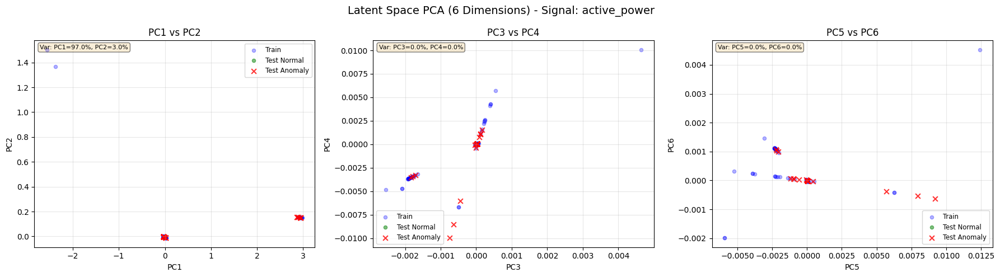


PCA Explained Variance Ratio for 'active_power':
  PC1: 97.03%
  PC2: 2.97%
  PC3: 0.00%
  PC4: 0.00%
  PC5: 0.00%
  PC6: 0.00%
  Total (PC1-PC6): 100.00%

Signal: ball_valve_closed


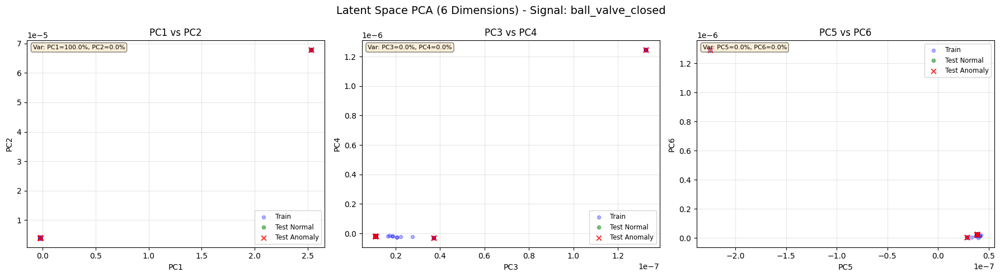


PCA Explained Variance Ratio for 'ball_valve_closed':
  PC1: 99.99%
  PC2: 0.01%
  PC3: 0.00%
  PC4: 0.00%
  PC5: 0.00%
  PC6: 0.00%
  Total (PC1-PC6): 100.00%

Signal: ball_valve_open


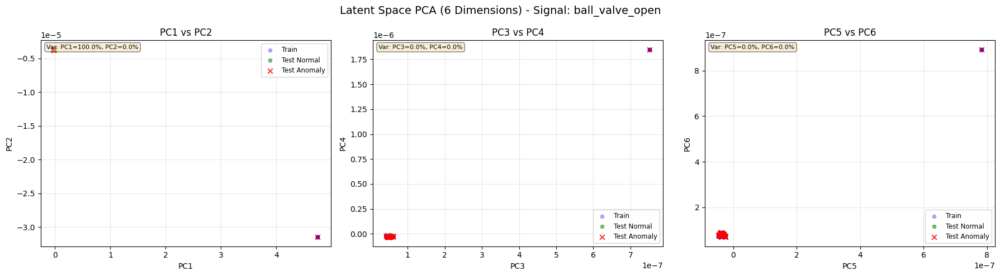


PCA Explained Variance Ratio for 'ball_valve_open':
  PC1: 100.00%
  PC2: 0.00%
  PC3: 0.00%
  PC4: 0.00%
  PC5: 0.00%
  PC6: 0.00%
  Total (PC1-PC6): 100.00%

Signal: guide_vane_position


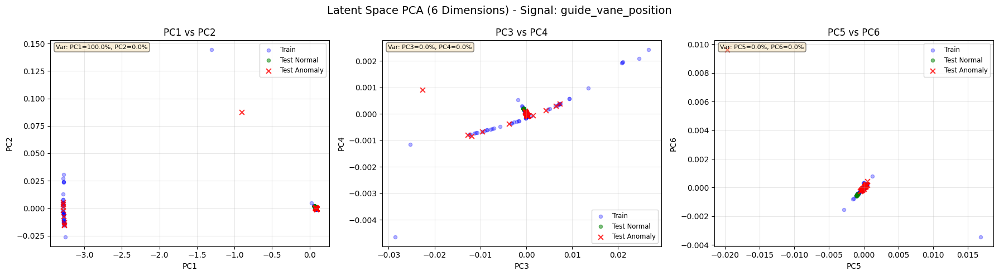


PCA Explained Variance Ratio for 'guide_vane_position':
  PC1: 99.99%
  PC2: 0.01%
  PC3: 0.00%
  PC4: 0.00%
  PC5: 0.00%
  PC6: 0.00%
  Total (PC1-PC6): 100.00%

Signal: water_pressure_downstream


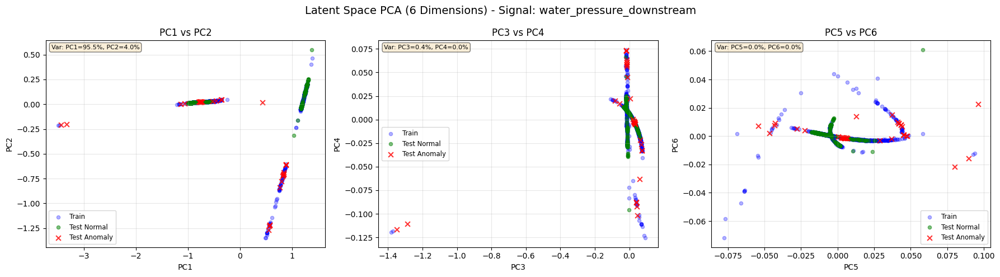


PCA Explained Variance Ratio for 'water_pressure_downstream':
  PC1: 95.51%
  PC2: 3.98%
  PC3: 0.44%
  PC4: 0.04%
  PC5: 0.02%
  PC6: 0.00%
  Total (PC1-PC6): 100.00%

Signal: water_pressure_upstream


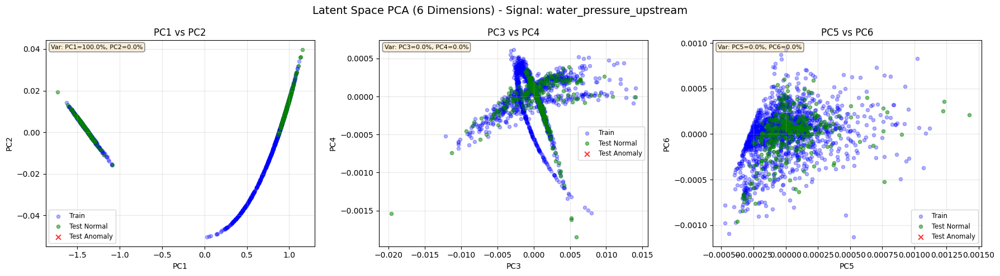


PCA Explained Variance Ratio for 'water_pressure_upstream':
  PC1: 99.98%
  PC2: 0.02%
  PC3: 0.00%
  PC4: 0.00%
  PC5: 0.00%
  PC6: 0.00%
  Total (PC1-PC6): 100.00%


In [65]:
# ----------------------------------------------------------------------
# CALL: Plot 6 PCA dimensions for all signals
# ----------------------------------------------------------------------

# Plot 6 PCA dimensions for each signal
print("Plotting 6 PCA dimensions for each signal...")
for sig in list(latent_train.keys()):
    print(f"\n{'='*60}")
    print(f"Signal: {sig}")
    print('='*60)
    plot_latent_pca_6dims(latent_train, latent_test, flags, signal_name=sig)

## Visualize the anomalous signals with the reconstruction

PLOTTING ANOMALOUS WINDOWS - PER SIGNAL AUTOENCODERS (WITH RECONSTRUCTION)

1. Anomaly Summary per Signal:


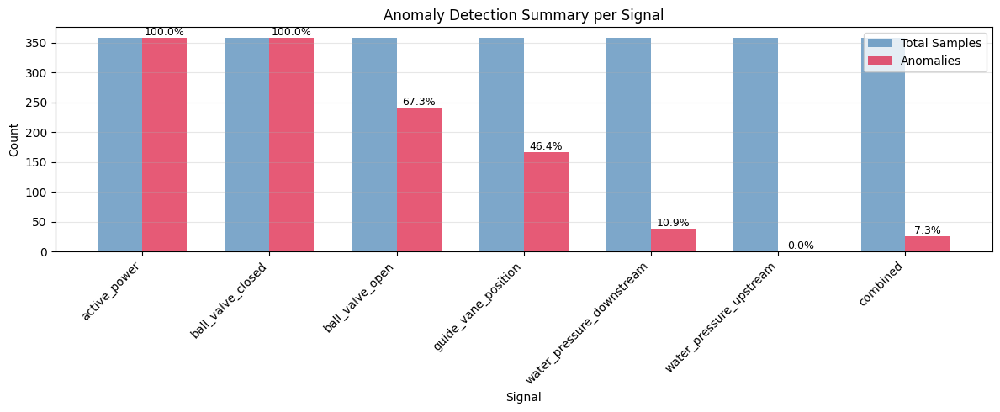


2. Anomalous Windows with Reconstruction (per Signal):

Signal: active_power
Total anomalies: 358


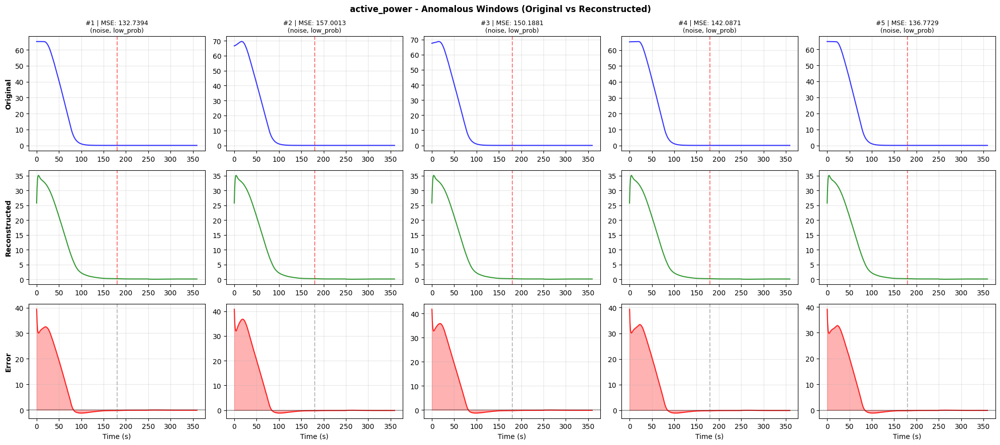


Signal: ball_valve_closed
Total anomalies: 358


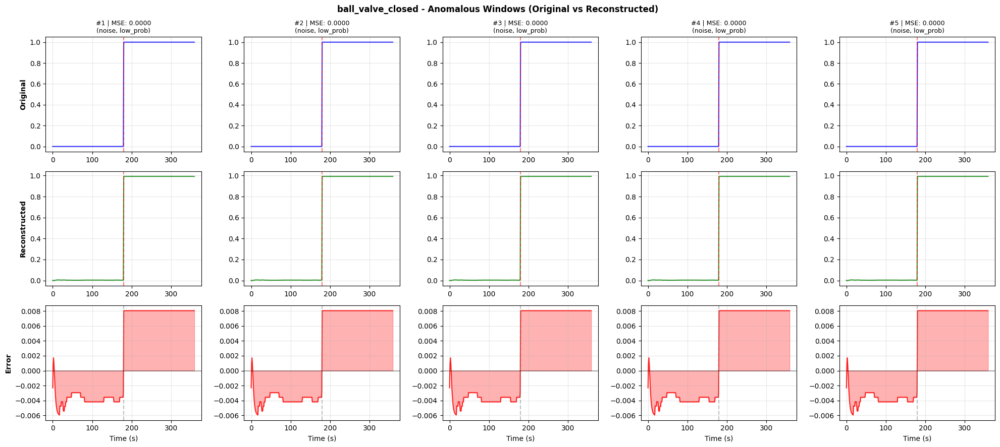


Signal: ball_valve_open
Total anomalies: 241


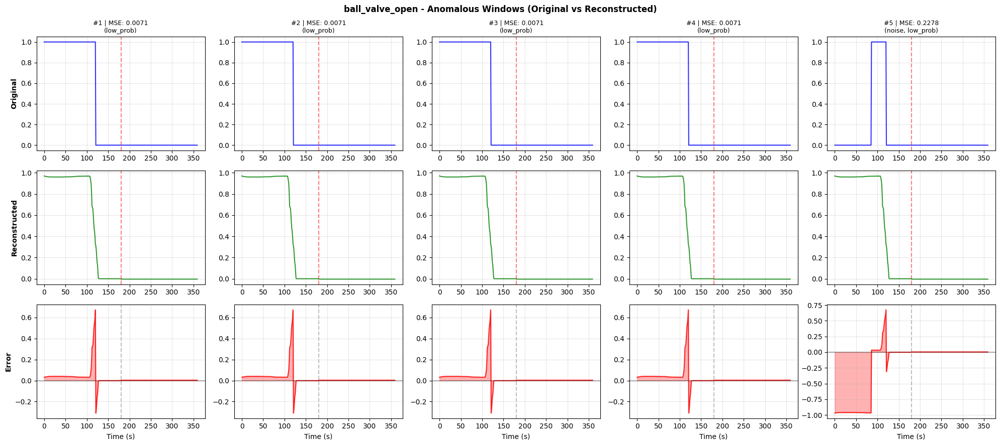


Signal: guide_vane_position
Total anomalies: 166


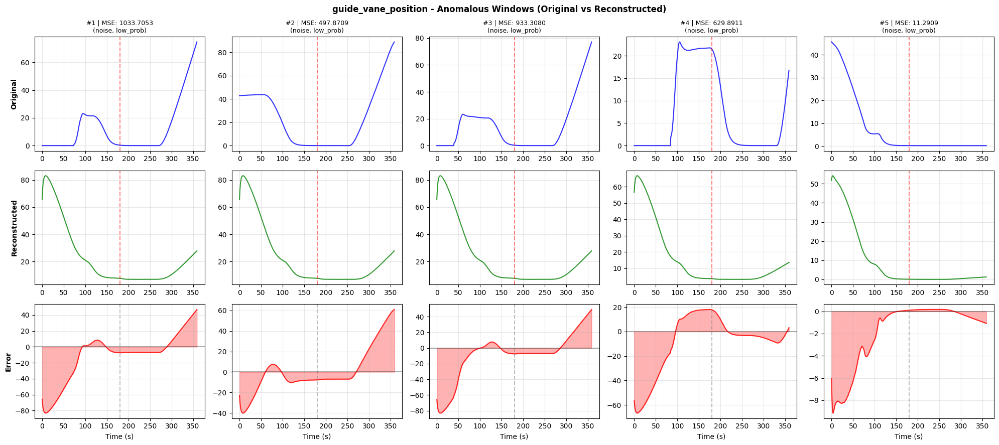


Signal: water_pressure_downstream
Total anomalies: 39


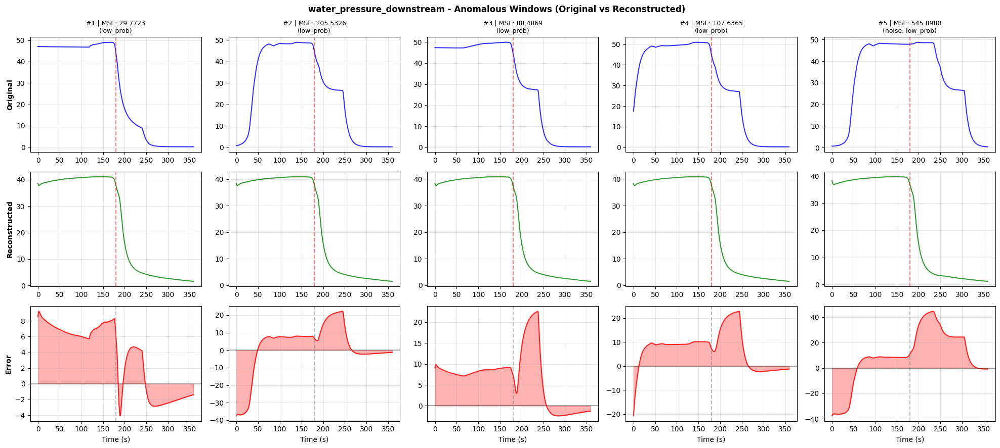

water_pressure_upstream: No anomalies detected

3. Normal vs Anomaly Comparison with Reconstruction:


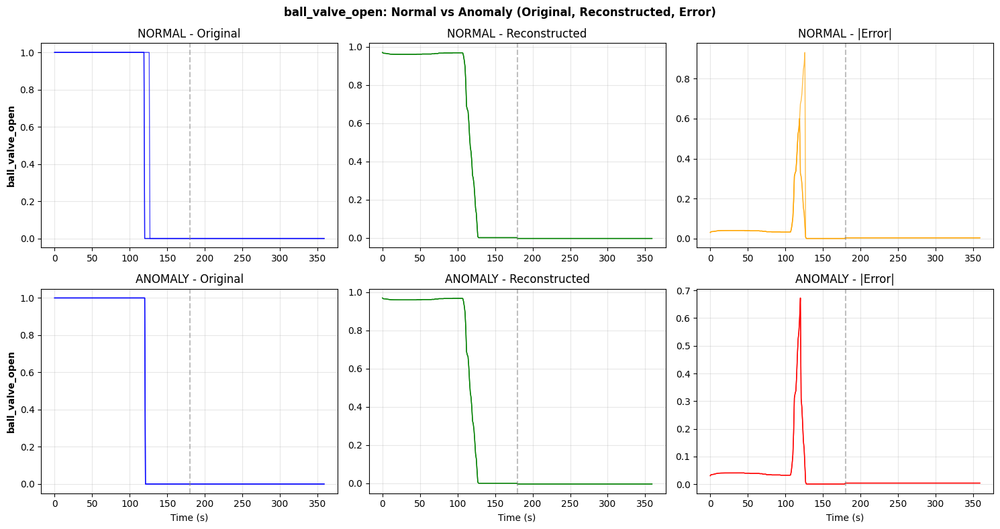

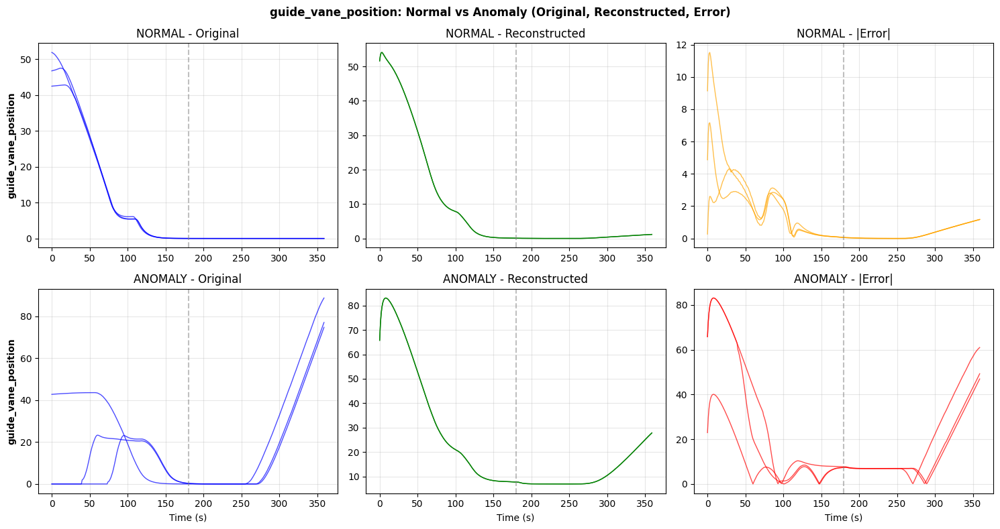

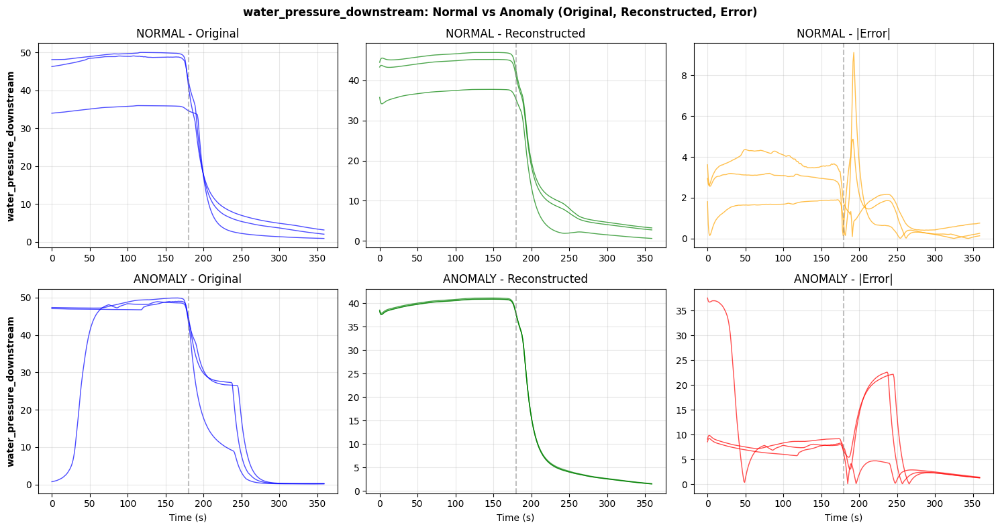

In [66]:
# ----------------------------------------------------------------------
# PLOT ANOMALOUS WINDOWS - PER SIGNAL AUTOENCODERS (WITH RECONSTRUCTION)
# Visualize original, reconstructed, and error for per-signal anomalies
# ----------------------------------------------------------------------

def plot_persignal_anomalous_windows_with_reconstruction(test_windows, flags, signals, models, scalers, max_plots_per_signal=5):
    """
    Plot windows flagged as anomalies showing: Original, Reconstructed, and Error.
    
    Parameters:
    - test_windows: Dictionary of test windows per signal {signal_name: array of shape (N, 360)}
    - flags: Dictionary of flags per signal {signal_name: {'is_anomaly': bool array, 'reasons': list}}
    - signals: List of signal names
    - models: Dictionary of trained models per signal {signal_name: model}
    - scalers: Dictionary of scalers per signal {signal_name: scaler}
    - max_plots_per_signal: Maximum anomalous windows to plot per signal
    """
    import torch
    
    n_timesteps = 360
    time_axis = np.arange(n_timesteps)
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    for sig in signals:
        if sig not in flags or sig not in test_windows:
            continue
        if sig not in models or sig not in scalers:
            print(f"{sig}: No model/scaler available, skipping reconstruction")
            continue
        
        X_sig = test_windows[sig]
        if X_sig is None or len(X_sig) == 0:
            continue
            
        is_anomaly = flags[sig]['is_anomaly']
        reasons = flags[sig].get('reasons', [['unknown']] * len(is_anomaly))
        anomaly_indices = np.where(is_anomaly)[0]
        
        n_anomalies = len(anomaly_indices)
        
        if n_anomalies == 0:
            print(f"{sig}: No anomalies detected")
            continue
            
        print(f"\n{'='*60}")
        print(f"Signal: {sig}")
        print(f"Total anomalies: {n_anomalies}")
        print(f"{'='*60}")
        
        n_to_plot = min(max_plots_per_signal, n_anomalies)
        
        # Get model and scaler for this signal
        model = models[sig]
        scaler = scalers[sig]
        
        # Get reconstructions for anomalous windows
        anomaly_windows = X_sig[anomaly_indices[:n_to_plot]]
        anomaly_scaled = scaler.transform(anomaly_windows)
        
        model.eval()
        with torch.no_grad():
            X_tensor = torch.FloatTensor(anomaly_scaled).to(device)
            reconstructed_scaled, _ = model(X_tensor)
            reconstructed_scaled = reconstructed_scaled.cpu().numpy()
        
        reconstructed = scaler.inverse_transform(reconstructed_scaled)
        
        # Plot: 3 rows (Original, Reconstructed, Error) × n_to_plot columns
        fig, axes = plt.subplots(3, n_to_plot, figsize=(4*n_to_plot, 9))
        if n_to_plot == 1:
            axes = axes.reshape(3, 1)
        
        for plot_idx, (anom_idx, orig_window, recon_window) in enumerate(
                zip(anomaly_indices[:n_to_plot], anomaly_windows, reconstructed)):
            
            error = orig_window - recon_window
            mse = np.mean((orig_window - recon_window)**2)
            
            reason = reasons[anom_idx] if anom_idx < len(reasons) else ['unknown']
            reason_str = ', '.join(reason) if reason else 'unknown'
            
            # Original
            ax = axes[0, plot_idx]
            ax.plot(time_axis, orig_window, 'b-', linewidth=1.5, alpha=0.8)
            ax.axvline(x=n_timesteps//2, color='red', linestyle='--', alpha=0.5)
            ax.set_title(f'#{plot_idx+1} | MSE: {mse:.4f}\n({reason_str})', fontsize=9)
            if plot_idx == 0:
                ax.set_ylabel('Original', fontsize=10, fontweight='bold')
            ax.grid(True, alpha=0.3)
            
            # Reconstructed
            ax = axes[1, plot_idx]
            ax.plot(time_axis, recon_window, 'g-', linewidth=1.5, alpha=0.8)
            ax.axvline(x=n_timesteps//2, color='red', linestyle='--', alpha=0.5)
            if plot_idx == 0:
                ax.set_ylabel('Reconstructed', fontsize=10, fontweight='bold')
            ax.grid(True, alpha=0.3)
            
            # Error
            ax = axes[2, plot_idx]
            ax.plot(time_axis, error, 'r-', linewidth=1.5, alpha=0.8)
            ax.fill_between(time_axis, 0, error, alpha=0.3, color='red')
            ax.axvline(x=n_timesteps//2, color='gray', linestyle='--', alpha=0.5)
            ax.axhline(y=0, color='black', linestyle='-', alpha=0.3)
            ax.set_xlabel('Time (s)')
            if plot_idx == 0:
                ax.set_ylabel('Error', fontsize=10, fontweight='bold')
            ax.grid(True, alpha=0.3)
        
        plt.suptitle(f'{sig} - Anomalous Windows (Original vs Reconstructed)', fontsize=12, fontweight='bold')
        plt.tight_layout()
        plt.show()

def plot_persignal_comparison_with_reconstruction(train_windows, test_windows, flags, signals, models, scalers, n_normal=3, n_anomaly=3):
    """
    Compare normal vs anomalous windows for each signal, showing Original and Reconstructed.
    """
    import torch
    
    n_timesteps = 360
    time_axis = np.arange(n_timesteps)
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    for sig in signals:
        if sig not in flags or sig not in test_windows:
            continue
        if sig not in models or sig not in scalers:
            continue
        
        X_test = test_windows[sig]
        X_train = train_windows.get(sig)
        
        if X_test is None or len(X_test) == 0:
            continue
            
        is_anomaly = flags[sig]['is_anomaly']
        normal_indices = np.where(~is_anomaly)[0]
        anomaly_indices = np.where(is_anomaly)[0]
        
        if len(anomaly_indices) == 0:
            continue
        
        model = models[sig]
        scaler = scalers[sig]
        model.eval()
        
        # Select samples
        n_normal_plot = min(n_normal, len(normal_indices))
        n_anomaly_plot = min(n_anomaly, len(anomaly_indices))
        
        if n_normal_plot == 0:
            continue
        
        normal_samples = np.random.choice(normal_indices, n_normal_plot, replace=False)
        anomaly_samples = anomaly_indices[:n_anomaly_plot]
        
        # Get reconstructions
        selected_indices = np.concatenate([normal_samples, anomaly_samples])
        selected_windows = X_test[selected_indices]
        selected_scaled = scaler.transform(selected_windows)
        
        with torch.no_grad():
            X_tensor = torch.FloatTensor(selected_scaled).to(device)
            reconstructed_scaled, _ = model(X_tensor)
            reconstructed_scaled = reconstructed_scaled.cpu().numpy()
        
        reconstructed = scaler.inverse_transform(reconstructed_scaled)
        
        # Split back
        normal_orig = selected_windows[:n_normal_plot]
        normal_recon = reconstructed[:n_normal_plot]
        anomaly_orig = selected_windows[n_normal_plot:]
        anomaly_recon = reconstructed[n_normal_plot:]
        
        # Plot: 2 rows (Normal, Anomaly) × 3 cols (Original, Reconstructed, Error)
        fig, axes = plt.subplots(2, 3, figsize=(15, 8))
        
        # --- NORMAL SAMPLES ---
        ax = axes[0, 0]
        for window in normal_orig:
            ax.plot(time_axis, window, alpha=0.7, linewidth=1, color='blue')
        ax.set_title('NORMAL - Original')
        ax.set_ylabel(sig, fontsize=10, fontweight='bold')
        ax.axvline(x=n_timesteps//2, color='gray', linestyle='--', alpha=0.5)
        ax.grid(True, alpha=0.3)
        
        ax = axes[0, 1]
        for window in normal_recon:
            ax.plot(time_axis, window, alpha=0.7, linewidth=1, color='green')
        ax.set_title('NORMAL - Reconstructed')
        ax.axvline(x=n_timesteps//2, color='gray', linestyle='--', alpha=0.5)
        ax.grid(True, alpha=0.3)
        
        ax = axes[0, 2]
        for orig, recon in zip(normal_orig, normal_recon):
            error = np.abs(orig - recon)
            ax.plot(time_axis, error, alpha=0.7, linewidth=1, color='orange')
        ax.set_title('NORMAL - |Error|')
        ax.axvline(x=n_timesteps//2, color='gray', linestyle='--', alpha=0.5)
        ax.grid(True, alpha=0.3)
        
        # --- ANOMALY SAMPLES ---
        ax = axes[1, 0]
        for window in anomaly_orig:
            ax.plot(time_axis, window, alpha=0.7, linewidth=1, color='blue')
        ax.set_title('ANOMALY - Original')
        ax.set_ylabel(sig, fontsize=10, fontweight='bold')
        ax.set_xlabel('Time (s)')
        ax.axvline(x=n_timesteps//2, color='gray', linestyle='--', alpha=0.5)
        ax.grid(True, alpha=0.3)
        
        ax = axes[1, 1]
        for window in anomaly_recon:
            ax.plot(time_axis, window, alpha=0.7, linewidth=1, color='green')
        ax.set_title('ANOMALY - Reconstructed')
        ax.set_xlabel('Time (s)')
        ax.axvline(x=n_timesteps//2, color='gray', linestyle='--', alpha=0.5)
        ax.grid(True, alpha=0.3)
        
        ax = axes[1, 2]
        for orig, recon in zip(anomaly_orig, anomaly_recon):
            error = np.abs(orig - recon)
            ax.plot(time_axis, error, alpha=0.7, linewidth=1, color='red')
        ax.set_title('ANOMALY - |Error|')
        ax.set_xlabel('Time (s)')
        ax.axvline(x=n_timesteps//2, color='gray', linestyle='--', alpha=0.5)
        ax.grid(True, alpha=0.3)
        
        plt.suptitle(f'{sig}: Normal vs Anomaly (Original, Reconstructed, Error)', fontsize=12, fontweight='bold')
        plt.tight_layout()
        plt.show()

def plot_persignal_summary(flags, signals):
    """Plot summary bar chart of anomalies per signal."""
    signal_names = []
    n_total = []
    n_anomalies = []
    
    for sig in signals:
        if sig not in flags:
            continue
        signal_names.append(sig)
        n_total.append(len(flags[sig]['is_anomaly']))
        n_anomalies.append(flags[sig]['n_anomalies'])
    
    if 'combined' in flags:
        signal_names.append('combined')
        n_total.append(len(flags['combined']['is_anomaly']))
        n_anomalies.append(flags['combined']['n_anomalies'])
    
    x = np.arange(len(signal_names))
    width = 0.35
    
    fig, ax = plt.subplots(figsize=(12, 5))
    bars1 = ax.bar(x - width/2, n_total, width, label='Total Samples', color='steelblue', alpha=0.7)
    bars2 = ax.bar(x + width/2, n_anomalies, width, label='Anomalies', color='crimson', alpha=0.7)
    
    ax.set_xlabel('Signal')
    ax.set_ylabel('Count')
    ax.set_title('Anomaly Detection Summary per Signal')
    ax.set_xticks(x)
    ax.set_xticklabels(signal_names, rotation=45, ha='right')
    ax.legend()
    ax.grid(True, alpha=0.3, axis='y')
    
    # Add percentage labels
    for i, (tot, anom) in enumerate(zip(n_total, n_anomalies)):
        pct = 100 * anom / tot if tot > 0 else 0
        ax.annotate(f'{pct:.1f}%', xy=(x[i] + width/2, anom), ha='center', va='bottom', fontsize=9)
    
    plt.tight_layout()
    plt.show()

# ==============================================================================
# RUN VISUALIZATION FOR PER-SIGNAL AUTOENCODERS (WITH RECONSTRUCTION)
# ==============================================================================
print("="*60)
print("PLOTTING ANOMALOUS WINDOWS - PER SIGNAL AUTOENCODERS (WITH RECONSTRUCTION)")
print("="*60)

# Summary chart
print("\n1. Anomaly Summary per Signal:")
plot_persignal_summary(flags, SIGNALS)

# Plot anomalous windows with reconstruction per signal
print("\n2. Anomalous Windows with Reconstruction (per Signal):")
plot_persignal_anomalous_windows_with_reconstruction(
    test_windows, flags, SIGNALS, models, scalers, max_plots_per_signal=5
)

# Comparison: Normal vs Anomaly with Reconstruction
print("\n3. Normal vs Anomaly Comparison with Reconstruction:")
plot_persignal_comparison_with_reconstruction(
    train_windows, test_windows, flags, SIGNALS, models, scalers, n_normal=3, n_anomaly=3
)

# One global AutoEncoder
## Autoencoder definition

Training signals: 6 signals (all signals including booleans)
  - ['active_power', 'ball_valve_closed', 'ball_valve_open', 'guide_vane_position', 'water_pressure_downstream', 'water_pressure_upstream']
Input dimension: 6 signals × 360 timesteps = 2160
AUTOENCODER ANOMALY DETECTION (ALL SIGNALS)
Training on 6 SIGNALS (6 signals × 360 timesteps = 2160 features)
  Includes: 4 analog signals + 2 boolean signals
  Signals: ['active_power', 'ball_valve_closed', 'ball_valve_open', 'guide_vane_position', 'water_pressure_downstream', 'water_pressure_upstream']

Training:
  - Loss Function: Moving Window MSE (window_size=30)
  - Domain: Time domain
  - Architecture: Simplified (Linear + BatchNorm only)

Detection Method: OR Logic
  - Time Domain: MSE reconstruction error threshold (all 6 signals)
  - Frequency Domain: Power spectrum error threshold (all 6 signals)
  - Anomaly flagged if EITHER method detects it

1. Loading training windows...
   [FILTER] Only loading CLOSING transitions (opening 

Loading training windows:   0%|          | 0/5 [00:00<?, ?it/s]

   Training windows: 1564

2. Loading testing windows...
   [FILTER] Only loading CLOSING transitions (opening transitions will be skipped)


Loading testing windows:   0%|          | 0/5 [00:00<?, ?it/s]

   Testing windows: 358

3. Training Autoencoder (single model for all signals)...
Training autoencoder on 1564 samples...
Input dimension: 2160 (6 signals × 360 timesteps)
  Signals: ['active_power', 'ball_valve_closed', 'ball_valve_open', 'guide_vane_position', 'water_pressure_downstream', 'water_pressure_upstream']
   Applied Xavier initialization to model weights
   Using Moving Window MSE Loss (window_size=30, n_signals=6, n_timesteps=360)


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training Combined AE:   0%|          | 0/100 [00:00<?, ?it/s]

  Epoch 10/100: train_loss=0.202938, val_loss=0.176054, lr=1.00e-03, best_val=0.151527
  Epoch 20/100: train_loss=0.095629, val_loss=0.082815, lr=2.50e-04, best_val=0.076720

  Early stopping at epoch 28 (no improvement for 10 epochs)
  Best validation loss: 0.076720

4. Plotting training history...


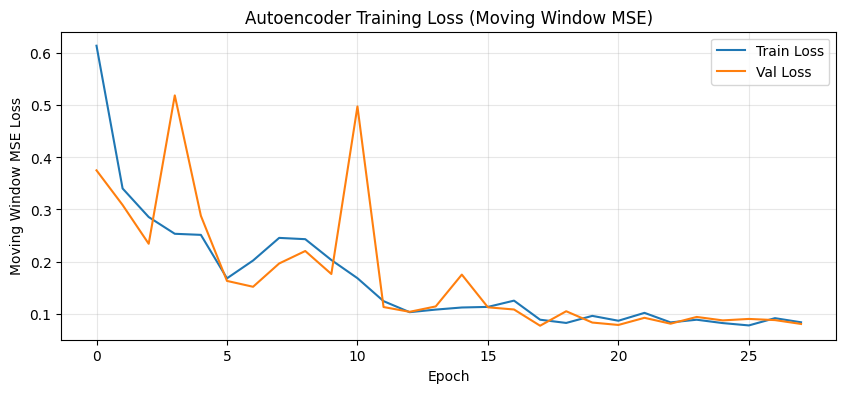


5. Flagging anomalies in test data (Time Domain MSE + Frequency Domain Power Spectrum OR logic)...

   Computing time domain MSE reconstruction error...
   Time domain MSE threshold (95th percentile): 0.223272
   Time domain anomalies: 24 (6.7%)

   Computing frequency domain power spectrum error...
   Power spectrum threshold (95th percentile): 16.259314
   Frequency domain anomalies: 27 (7.5%)

Anomaly Detection Results (OR Logic):
  Total test samples: 358
  Anomalies flagged: 39 (10.9%)

  Time Domain Detection (MSE):
    - Anomalies: 24 (6.7%)
    - Threshold: 0.223272 (95th percentile)
    - Mean MSE (normal): 0.045592
    - Mean MSE (anomalous): 1.266584

  Frequency Domain Detection (Power Spectrum):
    - Anomalies: 27 (7.5%)
    - Threshold: 16.259314 (95th percentile)
    - Mean Power Spectrum Error (normal): 2.267168
    - Mean Power Spectrum Error (anomalous): 30.188639

  Combined (OR Logic):
    - Time domain only: 12
    - Frequency domain only: 15
    - Both methods: 

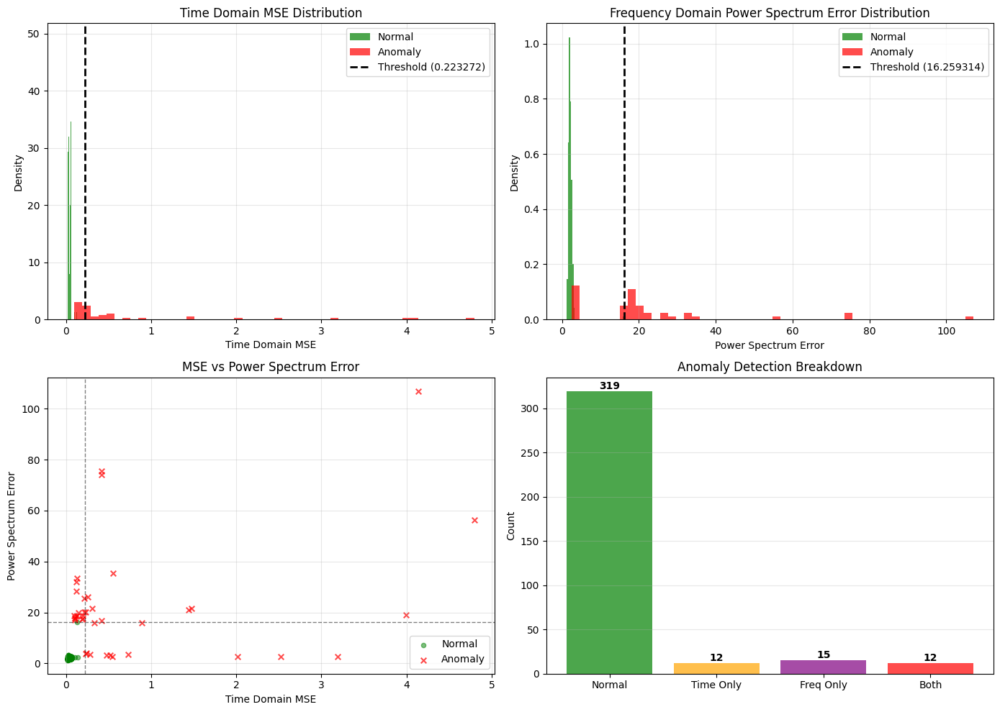


Pipeline complete!


In [ ]:
# ----------------------------------------------------------------------
# AUTOENCODER + HDBSCAN ANOMALY DETECTION PIPELINE
# VERSION 2: Trains a SINGLE autoencoder on ALL SIGNALS combined
# ----------------------------------------------------------------------
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import Dataset, DataLoader, TensorDataset, random_split
from sklearn.preprocessing import StandardScaler
import hdbscan
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import os
import pickle

# Configuration
WINDOW_SECONDS = 360
HALF_WINDOW = 180
# Optimized hyperparameters (from Optuna - Combined MSE + Power Spectrum loss)
BATCH_SIZE_AE2 = 32
EPOCHS_AE2 = 100
LEARNING_RATE_AE2 = 0.001  # If validation loss doesn't decrease, try reducing to 0.001 or 0.0005
BOTTLENECK_DIM_AE2 = 128
WEIGHT_DECAY_AE2 = 1.57442e-05
HIDDEN1_AE2 = 512
HIDDEN2_AE2 = 256

# ============================================================================
# DENOISING AUTOENCODER CONFIGURATION
# ============================================================================
# Gaussian noise injection (in standardized space) - DISABLED
NOISE_STD_AE2 = 0.0  # Set to 0 to disable denoising
# Smoothness penalty weight (total variation) - reduces high-frequency reconstruction noise
SMOOTH_LAMBDA_AE2 = 4.65496e-05
TRANSITIONS_DIR = 'data_transitions'

# All signals (for training and window extraction logic)
SIGNALS = ['active_power', 'ball_valve_closed', 'ball_valve_open',
           'guide_vane_position', 'water_pressure_downstream', 'water_pressure_upstream']

# Analog signals only (for reference - used in some detection functions)
ANALOG_SIGNALS = ['active_power', 'guide_vane_position', 
                  'water_pressure_downstream', 'water_pressure_upstream']

print(f"Training signals: {len(SIGNALS)} signals (all signals including booleans)")
print(f"  - {SIGNALS}")
print(f"Input dimension: {len(SIGNALS)} signals × 360 timesteps = {len(SIGNALS) * 360}")

# ==============================================================================
# 1. DENSE AUTOENCODER DEFINITION (All Signals Combined)
# ==============================================================================
class DenseAutoencoderCombined(nn.Module):
    """Simplified Dense (Fully-Connected) Autoencoder for all combined signals.

    Architecture (Simplified - Linear layers + BatchNorm only):
    - Encoder: 2160 → 512 → 256 → 128 (bottleneck)
    - Decoder: 128 → 256 → 512 → 2160

    Input: (batch, 2160) = 6 signals × 360 timesteps (flattened)
           Includes: 4 analog signals + 2 boolean signals
    Output: (batch, 2160) reconstructed
    """
    def __init__(self, input_dim=2160, latent_dim=64, hidden1=1024, hidden2=128):
        super(DenseAutoencoderCombined, self).__init__()
        self.input_dim = input_dim
        self.latent_dim = latent_dim

        # Encoder: gradually compress (Linear + BatchNorm only - simplified)
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, hidden1),
            nn.BatchNorm1d(hidden1),
            nn.Linear(hidden1, hidden2),
            nn.BatchNorm1d(hidden2),
            nn.Linear(hidden2, latent_dim),
        )

        # Decoder: gradually expand (Linear + BatchNorm only - simplified)
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, hidden2),
            nn.BatchNorm1d(hidden2),
            nn.Linear(hidden2, hidden1),
            nn.BatchNorm1d(hidden1),
            nn.Linear(hidden1, input_dim),
        )
    
    def forward(self, x):
        # x: (batch, 2160) = 6 signals × 360 timesteps (flattened)
        latent = self.encoder(x)        # (batch, latent_dim)
        reconstruction = self.decoder(latent)  # (batch, 2160)
        return reconstruction, latent


# ==============================================================================
# 2. WINDOW EXTRACTION (All Signals Combined & Flattened)
# ==============================================================================
class WindowExtractorCombined:
    """Extract windows with ALL signals combined (flattened)."""
    def __init__(self, data_dir, half_window=180, closing_only=True):
        self.data_dir = data_dir
        self.half_window = half_window
        # Use all signals for window extraction logic (to detect transitions)
        self.all_signals = SIGNALS
        # Extract all signals for training (including boolean signals)
        self.feature_cols = SIGNALS
        self.closing_only = closing_only  # If True, only extract windows for valve CLOSING transitions
    
    def _get_closing_timestamp(self, group):
        """
        Get the exact timestamp when the valve closes.
        
        Priority:
        1. ball_valve_closed goes 0→1 (valve reaches fully closed state) - PRIMARY
        2. ball_valve_open goes 1→0 (valve starts leaving open state) - FALLBACK
        
        Returns: (is_closing, center_timestamp) tuple
        - is_closing: True if closing, False if opening, None if undetermined
        - center_timestamp: The exact timestamp to center the window on (or None if not a closing)
        """
        votes_opening = 0
        votes_closing = 0
        
        # Track specific timestamps for centering
        ball_valve_closed_01_ts = None  # Primary: ball_valve_closed 0→1
        ball_valve_open_10_ts = None    # Fallback: ball_valve_open 1→0
        
        for row in group:
            sig = row['signal']
            v_from = row['from_value']
            v_to = row['to_value']
            ts = row['timestamp']
            
            if sig == 'ball_valve_open':
                if v_from == 0 and v_to == 1:  # Valve opening
                    votes_opening += 1
                elif v_from == 1 and v_to == 0:  # Valve closing (leaving open)
                    votes_closing += 1
                    ball_valve_open_10_ts = ts  # Fallback timestamp
            elif sig == 'ball_valve_closed':
                if v_from == 0 and v_to == 1:  # Valve closing (reached closed) - PRIMARY
                    votes_closing += 1
                    ball_valve_closed_01_ts = ts  # Primary timestamp
                elif v_from == 1 and v_to == 0:  # Valve opening (leaving closed)
                    votes_opening += 1
        
        if votes_closing > votes_opening:
            is_closing = True
        elif votes_opening > votes_closing:
            is_closing = False
        else:
            is_closing = None
        
        # Get center timestamp (priority: ball_valve_closed 0→1, then ball_valve_open 1→0)
        if ball_valve_closed_01_ts is not None:
            center_ts = ball_valve_closed_01_ts
        elif ball_valve_open_10_ts is not None:
            center_ts = ball_valve_open_10_ts
        else:
            center_ts = None
        
        return (is_closing, center_ts)
        
    def extract_windows(self, processed_file, transitions_file):
        """Extract flattened windows centered on transitions.
        
        If closing_only=True, only extract windows for valve CLOSING transitions.
        """
        if not os.path.exists(processed_file) or not os.path.exists(transitions_file):
            return []
            
        df = pd.read_pickle(processed_file)
        df = df.reindex(columns=self.feature_cols)
        df = df.ffill().bfill().fillna(0)
        
        df_trans = pd.read_pickle(transitions_file)
        
        if df_trans.empty:
            return []
            
        # Group transitions within 180s
        df_trans = df_trans.sort_values('timestamp')
        grouped_events = []
        
        current_group = [df_trans.iloc[0]]
        for i in range(1, len(df_trans)):
            curr = df_trans.iloc[i]
            prev = current_group[-1]
            diff = (curr['timestamp'] - prev['timestamp']).total_seconds()
            
            if diff < 180:
                current_group.append(curr)
            else:
                grouped_events.append(current_group)
                current_group = [curr]
        grouped_events.append(current_group)
        
        # Extract flattened windows (ALL signals combined)
        windows = []
        
        for group in grouped_events:
            # Get closing status and exact center timestamp
            is_closing, center_ts = self._get_closing_timestamp(group)
            
            # Filter for closing transitions only if enabled
            if self.closing_only:
                if is_closing is False:  # Opening transition - skip
                    continue
                elif is_closing is None:  # Undetermined - skip
                    continue
            
            # Skip if no valid centering timestamp found
            if center_ts is None:
                # Fallback to midpoint only if closing_only is disabled
                if not self.closing_only:
                    min_ts = group[0]['timestamp']
                    max_ts = group[-1]['timestamp']
                    center_ts = min_ts + (max_ts - min_ts) / 2
                else:
                    continue
            
            center_ts = center_ts.round('1s')
            
            try:
                idx = df.index.searchsorted(center_ts)
                if idx == 0:
                    center_idx = 0
                elif idx == len(df):
                    center_idx = len(df) - 1
                else:
                    ts_prev = df.index[idx-1]
                    ts_curr = df.index[idx]
                    if abs((ts_curr - center_ts).total_seconds()) < abs((ts_prev - center_ts).total_seconds()):
                        center_idx = idx
                    else:
                        center_idx = idx - 1
                
                start_idx = center_idx - self.half_window
                end_idx = center_idx + self.half_window
                
                if start_idx < 0 or end_idx > len(df):
                    continue
                
                # Extract all signals (including boolean signals)
                window_df = df.iloc[start_idx:end_idx][self.feature_cols]
                
                if window_df.shape[0] == 2 * self.half_window:
                    # Flatten: (360, 6) → (2160,) - all signals
                    windows.append(window_df.values.flatten())
            except Exception:
                continue
                
        return windows

def load_combined_windows(split='training', closing_only=True):
    """Load ALL windows as flattened arrays (all signals combined).
    
    Args:
        split: 'training' or 'testing'
        closing_only: If True, only load windows for valve CLOSING transitions (default: True)
    """
    extractor = WindowExtractorCombined(TRANSITIONS_DIR, half_window=HALF_WINDOW, closing_only=closing_only)
    
    all_windows = []
    files = [f for f in os.listdir(TRANSITIONS_DIR) if f.endswith('_processed.pkl') and split in f]
    
    if closing_only:
        print(f"   [FILTER] Only loading CLOSING transitions (opening transitions will be skipped)")
    
    for f in tqdm(files, desc=f"Loading {split} windows"):
        base = f.replace('_processed.pkl', '')
        processed_path = os.path.join(TRANSITIONS_DIR, f)
        transitions_path = os.path.join(TRANSITIONS_DIR, f"{base}_transitions.pkl")
        
        windows = extractor.extract_windows(processed_path, transitions_path)
        all_windows.extend(windows)
    
    return np.array(all_windows) if all_windows else None

# ==============================================================================
# 3. FREQUENCY DOMAIN TRANSFORMATION
# ==============================================================================
from scipy.fft import fft, fftfreq, ifft
from scipy import signal as scipy_signal

def time_to_frequency_domain(X_time, signal_names):
    """
    Convert time-domain signals to frequency domain using FFT.
    
    Args:
        X_time: (N, 1440) time-domain signals (flattened, 4 analog signals × 360 timesteps)
        signal_names: List of signal names
    
    Returns:
        X_freq: (N, 1440) frequency-domain representation (magnitude + phase, flattened)
        freq_metadata: dict with frequency information
    """
    N = len(X_time)
    n_signals = len(signal_names)
    
    # Reshape to (N, 360, 4)
    X_3d = X_time.reshape(N, 360, n_signals)
    
    # Sampling rate: 1 Hz
    fs = 1.0
    n_samples = 360
    
    # For each signal, compute FFT and extract magnitude and phase
    # We'll use only positive frequencies (180 bins) and store magnitude + phase
    # Format: [mag_0, phase_0, mag_1, phase_1, ..., mag_179, phase_179] for each signal
    X_freq = np.zeros((N, n_signals * n_samples))  # (N, 1440) - same size as input
    
    for sig_idx in range(n_signals):
        for i in range(N):
            # Extract signal
            sig = X_3d[i, :, sig_idx]
            
            # Remove DC component (mean)
            sig_centered = sig - np.mean(sig)
            
            # Apply windowing to reduce spectral leakage
            windowed_sig = sig_centered * scipy_signal.windows.hann(len(sig_centered))
            
            # Compute FFT
            fft_vals = fft(windowed_sig)
            
            # Extract magnitude and phase for positive frequencies only
            # We'll use all frequencies to maintain same dimensionality
            magnitude = np.abs(fft_vals)
            phase = np.angle(fft_vals)
            
            # Store magnitude and phase interleaved: [mag_0, phase_0, mag_1, phase_1, ...]
            # This preserves both magnitude and phase information
            start_idx = sig_idx * n_samples
            end_idx = start_idx + n_samples
            X_freq[i, start_idx:end_idx:2] = magnitude[:n_samples//2]  # Magnitude (even indices)
            X_freq[i, start_idx+1:end_idx:2] = phase[:n_samples//2]    # Phase (odd indices)
    
    return X_freq

def frequency_to_time_domain(X_freq, signal_names):
    """
    Convert frequency-domain representation back to time domain using inverse FFT.
    
    Args:
        X_freq: (N, 1440) frequency-domain representation (magnitude + phase, flattened)
        signal_names: List of signal names
    
    Returns:
        X_time: (N, 1440) time-domain signals (flattened)
    """
    N = len(X_freq)
    n_signals = len(signal_names)
    n_samples = 360
    
    # Reshape to (N, 360, 4) - extract magnitude and phase
    X_time = np.zeros((N, n_samples, n_signals))
    
    for sig_idx in range(n_signals):
        for i in range(N):
            start_idx = sig_idx * n_samples
            end_idx = start_idx + n_samples
            
            # Extract magnitude and phase (interleaved)
            magnitude = X_freq[i, start_idx:end_idx:2]
            phase = X_freq[i, start_idx+1:end_idx:2]
            
            # Reconstruct complex FFT values (only positive frequencies)
            # Create symmetric spectrum for inverse FFT
            fft_vals = np.zeros(n_samples, dtype=complex)
            fft_vals[:n_samples//2] = magnitude * np.exp(1j * phase)
            # Create negative frequencies (conjugate symmetric)
            fft_vals[n_samples//2+1:] = np.conj(fft_vals[n_samples//2-1:0:-1])
            
            # Inverse FFT
            sig_recon = np.real(ifft(fft_vals))
            
            # Store
            X_time[i, :, sig_idx] = sig_recon
    
    # Flatten back to (N, 1440)
    return X_time.reshape(N, -1)

# ==============================================================================
# 3. TRAIN SINGLE AUTOENCODER (All Signals Combined - TIME DOMAIN)
# ==============================================================================
def train_combined_autoencoder(X_train, epochs=50, batch_size=64, lr=3e-4, weight_decay=1e-4, bottleneck_dim=64, hidden1=1024, hidden2=128):
    """
    Train ONE simplified dense autoencoder on all combined signals (flattened).
    
    Uses Moving Window MSE loss:
    - Computes MSE over sliding windows (30 timesteps) across the time dimension
    - Averages MSE across all windows for each sample
    - Trains on time domain signals
    - Optional smoothness regularization (total variation) to reduce high-frequency noise
    
    Architecture: Simplified (Linear layers + BatchNorm only, no activations)
    
    Note: Frequency domain comparison (power spectrum error) is done separately during testing for anomaly detection.
    Note: Denoising (Gaussian noise injection) is disabled (NOISE_STD_AE2 = 0.0).
    """
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    print(f"Training autoencoder on {len(X_train)} samples...")
    # Compute n_signals from input dimension (input_dim = n_signals * 360)
    n_signals = X_train.shape[1] // 360
    print(f"Input dimension: {X_train.shape[1]} ({n_signals} signals × 360 timesteps)")
    
    # Always train on time domain (revert frequency domain training)
    # Frequency domain will be used for comparison during testing
    X_train_for_training = X_train
    
    # Normalize
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_train_for_training)
    
    # Train/Val Split
    dataset = TensorDataset(torch.FloatTensor(X_scaled))
    train_size = int(0.8 * len(dataset))
    val_size = len(dataset) - train_size
    train_ds, val_ds = random_split(dataset, [train_size, val_size])
    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_ds, batch_size=batch_size)
    
    # Model
    input_dim = X_train.shape[1]
    model = DenseAutoencoderCombined(
        input_dim=input_dim,
        latent_dim=bottleneck_dim,
        hidden1=hidden1,
        hidden2=hidden2,
    ).to(device)
    
    # Initialize weights properly for better training stability
    def init_weights(m):
        if isinstance(m, nn.Linear):
            # Xavier/Glorot initialization for better gradient flow
            torch.nn.init.xavier_uniform_(m.weight, gain=1.0)
            if m.bias is not None:
                torch.nn.init.constant_(m.bias, 0.0)
    
    model.apply(init_weights)
    print("   Applied Xavier initialization to model weights")
    
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    
    # Moving Window MSE Loss Function
    def moving_window_mse_loss(recon, target, window_size=30, n_signals=6, n_timesteps=360):
        """
        Compute Moving Window MSE loss.
        
        This loss function:
        1. Reshapes flattened signals to (batch, n_timesteps, n_signals)
        2. Computes MSE for each sliding window of size window_size
        3. Averages across all windows
        
        Args:
            recon: (batch, n_signals*n_timesteps) reconstructed signal (flattened)
            target: (batch, n_signals*n_timesteps) original signal (flattened)
            window_size: Size of the moving window in timesteps (default: 30)
            n_signals: Number of signals (default: 6)
            n_timesteps: Number of timesteps per signal (default: 360)
        
        Returns:
            Moving window MSE loss
        """
        batch_size = recon.shape[0]
        
        # Reshape to (batch, n_timesteps, n_signals)
        recon_3d = recon.view(batch_size, n_timesteps, n_signals)
        target_3d = target.view(batch_size, n_timesteps, n_signals)
        
        # Compute MSE for each window
        window_losses = []
        for i in range(n_timesteps - window_size + 1):
            # Extract window: (batch, window_size, n_signals)
            recon_window = recon_3d[:, i:i+window_size, :]
            target_window = target_3d[:, i:i+window_size, :]
            
            # Compute MSE for this window: (batch,)
            window_mse = torch.mean((recon_window - target_window) ** 2, dim=(1, 2))
            window_losses.append(window_mse)
        
        # Stack: (n_windows, batch)
        window_losses = torch.stack(window_losses, dim=0)
        
        # Average across all windows: (batch,)
        avg_window_loss = torch.mean(window_losses, dim=0)
        
        # Average across batch
        loss = torch.mean(avg_window_loss)
        
        return loss
    
    loss_fn = moving_window_mse_loss
    print(f"   Using Moving Window MSE Loss (window_size=30, n_signals={n_signals}, n_timesteps=360)")
    
    # Learning rate scheduler - reduces LR when validation loss plateaus
    # More aggressive scheduling: reduce patience and increase factor
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, 
                                   min_lr=1e-7, verbose=True)
    
    # Early stopping to prevent overfitting
    best_val_loss = float('inf')
    patience_early_stop = 10  # Stop if no improvement for 10 epochs
    patience_counter = 0
    
    # Gradient clipping to prevent exploding gradients
    max_grad_norm = 1.0
    
    # Training Loop
    history = {'train': [], 'val': []}
    for ep in tqdm(range(epochs), desc="Training Combined AE"):
        # Train
        model.train()
        train_loss = 0
        for (x,) in train_loader:
            x = x.to(device)
            optimizer.zero_grad()
            # Optionally train as a denoising autoencoder (noise is in standardized units)
            x_in = x
            if NOISE_STD_AE2 and NOISE_STD_AE2 > 0:
                x_in = x + torch.randn_like(x) * NOISE_STD_AE2
            recon, _ = model(x_in)
            
            # Use moving window MSE loss function
            loss = loss_fn(recon, x, window_size=30, n_signals=n_signals, n_timesteps=360)
            
            # Smoothness regularizer to reduce high-frequency reconstruction noise
            if SMOOTH_LAMBDA_AE2 and SMOOTH_LAMBDA_AE2 > 0:
                tv = torch.mean(torch.abs(recon[:, 1:] - recon[:, :-1]))
                loss = loss + SMOOTH_LAMBDA_AE2 * tv
            
            loss.backward()
            
            # Gradient clipping to prevent exploding gradients
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=max_grad_norm)
            
            optimizer.step()
            train_loss += loss.item()
        train_loss /= len(train_loader)
        
        # Validate
        model.eval()
        val_loss = 0
        with torch.no_grad():
            for (x,) in val_loader:
                x = x.to(device)
                recon, _ = model(x)
                val_loss += loss_fn(recon, x, window_size=30, n_signals=n_signals, n_timesteps=360).item()
        val_loss /= len(val_loader)
        
        history['train'].append(train_loss)
        history['val'].append(val_loss)
        
        # Step the scheduler based on validation loss
        scheduler.step(val_loss)
        
        # Early stopping check
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            # Save best model state
            best_model_state = model.state_dict().copy()
        else:
            patience_counter += 1
        
        if (ep + 1) % 10 == 0:
            current_lr = optimizer.param_groups[0]['lr']
            print(f"  Epoch {ep+1}/{epochs}: train_loss={train_loss:.6f}, val_loss={val_loss:.6f}, lr={current_lr:.2e}, best_val={best_val_loss:.6f}")
        
        # Early stopping
        if patience_counter >= patience_early_stop:
            print(f"\n  Early stopping at epoch {ep+1} (no improvement for {patience_early_stop} epochs)")
            print(f"  Best validation loss: {best_val_loss:.6f}")
            # Restore best model
            model.load_state_dict(best_model_state)
            break
    
    # If we didn't early stop, make sure we use the best model
    if patience_counter < patience_early_stop:
        model.load_state_dict(best_model_state)
        print(f"\n  Training completed. Best validation loss: {best_val_loss:.6f}")
    
    return model, scaler, history

# ==============================================================================
# 4. EXTRACT LATENT REPRESENTATIONS
# ==============================================================================
def extract_combined_latent(model, scaler, X):
    """Extract latent features from the autoencoder."""
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    X_scaled = scaler.transform(X)
    model.eval()
    with torch.no_grad():
        _, features = model(torch.FloatTensor(X_scaled).to(device))
        return features.cpu().numpy()

# ==============================================================================
# 4b. FREQUENCY DOMAIN POWER SPECTRUM ERROR
# ==============================================================================
def compute_power_spectrum_error(model, scaler, X_time, signal_names):
    """
    Compute power spectrum reconstruction error.
    
    This function:
    1. Reconstructs time-domain signals using the autoencoder
    2. Converts both original and reconstructed signals to frequency domain (FFT)
    3. Computes power spectrum (magnitude squared) for both
    4. Computes MSE between power spectra
    
    Args:
        model: Trained autoencoder (trained on time domain)
        scaler: StandardScaler used during training
        X_time: (N, n_signals*360) time-domain signals (flattened)
                e.g., (N, 2160) for 6 signals × 360 timesteps
        signal_names: List of signal names (determines n_signals)
    
    Returns:
        power_spectrum_mse: (N,) array of power spectrum MSE per sample
    """
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    # Reconstruct in time domain
    X_scaled = scaler.transform(X_time)
    model.eval()
    with torch.no_grad():
        recon_scaled, _ = model(torch.FloatTensor(X_scaled).to(device))
        recon_time = scaler.inverse_transform(recon_scaled.cpu().numpy())
    
    N = len(X_time)
    n_signals = len(signal_names)
    n_samples = 360
    
    # Reshape to (N, 360, 4)
    X_3d = X_time.reshape(N, 360, n_signals)
    recon_3d = recon_time.reshape(N, 360, n_signals)
    
    # Compute power spectrum error for each sample
    power_spectrum_mse = np.zeros(N)
    
    for i in range(N):
        power_spectrum_errors = []
        
        for sig_idx in range(n_signals):
            # Original signal
            sig_orig = X_3d[i, :, sig_idx]
            sig_orig_centered = sig_orig - np.mean(sig_orig)
            windowed_orig = sig_orig_centered * scipy_signal.windows.hann(len(sig_orig_centered))
            fft_orig = fft(windowed_orig)
            power_orig = np.abs(fft_orig) ** 2  # Power spectrum (magnitude squared)
            
            # Reconstructed signal
            sig_recon = recon_3d[i, :, sig_idx]
            sig_recon_centered = sig_recon - np.mean(sig_recon)
            windowed_recon = sig_recon_centered * scipy_signal.windows.hann(len(sig_recon_centered))
            fft_recon = fft(windowed_recon)
            power_recon = np.abs(fft_recon) ** 2  # Power spectrum (magnitude squared)
            
            # Compute MSE between power spectra (use log scale for better comparison)
            log_power_orig = np.log10(power_orig + 1e-10)
            log_power_recon = np.log10(power_recon + 1e-10)
            power_spectrum_errors.append(np.mean((log_power_orig - log_power_recon) ** 2))
        
        # Average across all signals
        power_spectrum_mse[i] = np.mean(power_spectrum_errors)
    
    return power_spectrum_mse

# ==============================================================================
# 5. HDBSCAN ANOMALY DETECTION
# ==============================================================================
def fit_combined_hdbscan(latent_train, min_cluster_ratio=0.1):
    """Fit HDBSCAN on training latent space."""
    min_size = max(5, int(len(latent_train) * min_cluster_ratio))
    clusterer = hdbscan.HDBSCAN(min_cluster_size=min_size, metric='euclidean', prediction_data=True)
    clusterer.fit(latent_train)
    
    n_clusters = len(set(clusterer.labels_)) - (1 if -1 in clusterer.labels_ else 0)
    n_noise = sum(clusterer.labels_ == -1)
    print(f"HDBSCAN: {n_clusters} clusters, {n_noise} noise points out of {len(latent_train)}")
    
    return clusterer

def flag_combined_anomalies(X_train, X_test, model, scaler, 
                            mse_percentile=95, power_spectrum_percentile=95):
    """
    Flag test samples as anomalies using OR logic:
    - Time domain: MSE reconstruction error threshold
    - Frequency domain: Power spectrum error threshold
    
    Anomaly is flagged if EITHER method detects it.
    
    Args:
        X_train: (N_train, 2160) training time-domain signals (for threshold computation)
                6 signals × 360 timesteps (flattened)
        X_test: (N_test, 2160) test time-domain signals
                6 signals × 360 timesteps (flattened)
        model: Trained autoencoder
        scaler: StandardScaler used during training
        mse_percentile: Percentile for time domain MSE threshold (default: 95)
        power_spectrum_percentile: Percentile for frequency domain power spectrum threshold (default: 95)
    
    Returns:
        dict with anomaly flags and scores
    """
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    n_test = len(X_test)
    
    # ========================================================================
    # 1. TIME DOMAIN DETECTION (MSE Reconstruction Error)
    # ========================================================================
    print("\n   Computing time domain MSE reconstruction error...")
    
    # Compute MSE for training data (to set threshold)
    X_train_scaled = scaler.transform(X_train)
    model.eval()
    with torch.no_grad():
        recon_train, _ = model(torch.FloatTensor(X_train_scaled).to(device))
        mse_train = ((recon_train.cpu().numpy() - X_train_scaled) ** 2).mean(axis=1)
    
    # Compute MSE for test data
    X_test_scaled = scaler.transform(X_test)
    with torch.no_grad():
        recon_test, _ = model(torch.FloatTensor(X_test_scaled).to(device))
        mse_test = ((recon_test.cpu().numpy() - X_test_scaled) ** 2).mean(axis=1)
    
    # Set threshold based on training data percentile
    mse_threshold = np.percentile(mse_train, mse_percentile)
    time_domain_anomaly = mse_test > mse_threshold
    
    print(f"   Time domain MSE threshold ({mse_percentile}th percentile): {mse_threshold:.6f}")
    print(f"   Time domain anomalies: {time_domain_anomaly.sum()} ({100*time_domain_anomaly.sum()/n_test:.1f}%)")
    
    # ========================================================================
    # 2. FREQUENCY DOMAIN DETECTION (Power Spectrum Error)
    # ========================================================================
    print("\n   Computing frequency domain power spectrum error...")
    
    # Compute power spectrum error for training data (to set threshold)
    # Use all signals (including boolean signals) - same detection logic as before
    power_spectrum_train = compute_power_spectrum_error(model, scaler, X_train, SIGNALS)
    
    # Compute power spectrum error for test data
    power_spectrum_test = compute_power_spectrum_error(model, scaler, X_test, SIGNALS)
    
    # Set threshold based on training data percentile
    power_spectrum_threshold = np.percentile(power_spectrum_train, power_spectrum_percentile)
    freq_domain_anomaly = power_spectrum_test > power_spectrum_threshold
    
    print(f"   Power spectrum threshold ({power_spectrum_percentile}th percentile): {power_spectrum_threshold:.6f}")
    print(f"   Frequency domain anomalies: {freq_domain_anomaly.sum()} ({100*freq_domain_anomaly.sum()/n_test:.1f}%)")
    
    # ========================================================================
    # 3. COMBINE WITH OR LOGIC
    # ========================================================================
    is_anomaly = time_domain_anomaly | freq_domain_anomaly
    
    # Build reasons
    reasons = []
    for i in range(n_test):
        r = []
        if time_domain_anomaly[i]:
            r.append('time_domain_mse')
        if freq_domain_anomaly[i]:
            r.append('freq_domain_power_spectrum')
        reasons.append(r if r else ['normal'])
    
    print(f"\nAnomaly Detection Results (OR Logic):")
    print(f"  Total test samples: {n_test}")
    print(f"  Anomalies flagged: {sum(is_anomaly)} ({100*sum(is_anomaly)/n_test:.1f}%)")
    print(f"\n  Time Domain Detection (MSE):")
    print(f"    - Anomalies: {sum(time_domain_anomaly)} ({100*sum(time_domain_anomaly)/n_test:.1f}%)")
    print(f"    - Threshold: {mse_threshold:.6f} ({mse_percentile}th percentile)")
    print(f"    - Mean MSE (normal): {mse_test[~time_domain_anomaly].mean():.6f}")
    print(f"    - Mean MSE (anomalous): {mse_test[time_domain_anomaly].mean():.6f}")
    print(f"\n  Frequency Domain Detection (Power Spectrum):")
    print(f"    - Anomalies: {sum(freq_domain_anomaly)} ({100*sum(freq_domain_anomaly)/n_test:.1f}%)")
    print(f"    - Threshold: {power_spectrum_threshold:.6f} ({power_spectrum_percentile}th percentile)")
    print(f"    - Mean Power Spectrum Error (normal): {power_spectrum_test[~freq_domain_anomaly].mean():.6f}")
    print(f"    - Mean Power Spectrum Error (anomalous): {power_spectrum_test[freq_domain_anomaly].mean():.6f}")
    print(f"\n  Combined (OR Logic):")
    print(f"    - Time domain only: {sum(time_domain_anomaly & ~freq_domain_anomaly)}")
    print(f"    - Frequency domain only: {sum(freq_domain_anomaly & ~time_domain_anomaly)}")
    print(f"    - Both methods: {sum(time_domain_anomaly & freq_domain_anomaly)}")
    
    return {
        'is_anomaly': is_anomaly,
        'time_domain_anomaly': time_domain_anomaly,
        'freq_domain_anomaly': freq_domain_anomaly,
        'mse': mse_test,
        'mse_threshold': mse_threshold,
        'power_spectrum_error': power_spectrum_test,
        'power_spectrum_threshold': power_spectrum_threshold,
        'reasons': reasons
    }

# ==============================================================================
# 6. VISUALIZATION
# ==============================================================================
def plot_combined_training_history(history):
    """Plot autoencoder training history."""
    plt.figure(figsize=(10, 4))
    plt.plot(history['train'], label='Train Loss')
    plt.plot(history['val'], label='Val Loss')
    plt.title('Autoencoder Training Loss (Moving Window MSE)')
    plt.xlabel('Epoch')
    plt.ylabel('Moving Window MSE Loss')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

def plot_combined_latent_pca(latent_train, latent_test, flags):
    """Plot PCA of latent space with anomalies highlighted."""
    from sklearn.decomposition import PCA
    
    # Combine for PCA
    Z_all = np.vstack([latent_train, latent_test])
    pca = PCA(n_components=2)
    Z_pca = pca.fit_transform(Z_all)
    
    n_train = len(latent_train)
    Z_train_pca = Z_pca[:n_train]
    Z_test_pca = Z_pca[n_train:]
    
    is_anom = flags['is_anomaly']
    
    plt.figure(figsize=(10, 8))
    plt.scatter(Z_train_pca[:, 0], Z_train_pca[:, 1], c='blue', alpha=0.3, s=20, label='Train')
    plt.scatter(Z_test_pca[~is_anom, 0], Z_test_pca[~is_anom, 1], c='green', alpha=0.5, s=30, label='Test Normal')
    plt.scatter(Z_test_pca[is_anom, 0], Z_test_pca[is_anom, 1], c='red', alpha=0.8, s=50, marker='x', label='Test Anomaly')
    
    plt.title('Latent Space PCA - Anomaly Detection (All Signals Combined)')
    plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% var)')
    plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% var)')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

def plot_combined_reconstruction_error(model, scaler, X_train, X_test, flags):
    """Plot reconstruction error distribution (time domain MSE and frequency domain power spectrum)."""
    is_anom = flags['is_anomaly']
    mse_test = flags['mse']
    power_spectrum_test = flags['power_spectrum_error']
    
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    
    # Time Domain MSE
    ax = axes[0, 0]
    ax.hist(mse_test[~is_anom], bins=50, alpha=0.7, label='Normal', color='green', density=True)
    ax.hist(mse_test[is_anom], bins=50, alpha=0.7, label='Anomaly', color='red', density=True)
    ax.axvline(flags['mse_threshold'], color='black', linestyle='--', linewidth=2, 
               label=f'Threshold ({flags["mse_threshold"]:.6f})')
    ax.set_xlabel('Time Domain MSE')
    ax.set_ylabel('Density')
    ax.set_title('Time Domain MSE Distribution')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # Frequency Domain Power Spectrum Error
    ax = axes[0, 1]
    ax.hist(power_spectrum_test[~is_anom], bins=50, alpha=0.7, label='Normal', color='green', density=True)
    ax.hist(power_spectrum_test[is_anom], bins=50, alpha=0.7, label='Anomaly', color='red', density=True)
    ax.axvline(flags['power_spectrum_threshold'], color='black', linestyle='--', linewidth=2, 
               label=f'Threshold ({flags["power_spectrum_threshold"]:.6f})')
    ax.set_xlabel('Power Spectrum Error')
    ax.set_ylabel('Density')
    ax.set_title('Frequency Domain Power Spectrum Error Distribution')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # Scatter: MSE vs Power Spectrum Error
    ax = axes[1, 0]
    ax.scatter(mse_test[~is_anom], power_spectrum_test[~is_anom], 
               alpha=0.5, s=20, label='Normal', color='green')
    ax.scatter(mse_test[is_anom], power_spectrum_test[is_anom], 
               alpha=0.7, s=30, label='Anomaly', color='red', marker='x')
    ax.axvline(flags['mse_threshold'], color='black', linestyle='--', alpha=0.5, linewidth=1)
    ax.axhline(flags['power_spectrum_threshold'], color='black', linestyle='--', alpha=0.5, linewidth=1)
    ax.set_xlabel('Time Domain MSE')
    ax.set_ylabel('Power Spectrum Error')
    ax.set_title('MSE vs Power Spectrum Error')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # Detection breakdown
    ax = axes[1, 1]
    time_only = sum(flags['time_domain_anomaly'] & ~flags['freq_domain_anomaly'])
    freq_only = sum(flags['freq_domain_anomaly'] & ~flags['time_domain_anomaly'])
    both = sum(flags['time_domain_anomaly'] & flags['freq_domain_anomaly'])
    normal = sum(~flags['is_anomaly'])
    
    categories = ['Normal', 'Time Only', 'Freq Only', 'Both']
    counts = [normal, time_only, freq_only, both]
    colors = ['green', 'orange', 'purple', 'red']
    
    bars = ax.bar(categories, counts, color=colors, alpha=0.7)
    ax.set_ylabel('Count')
    ax.set_title('Anomaly Detection Breakdown')
    ax.grid(True, alpha=0.3, axis='y')
    
    # Add value labels on bars
    for bar, count in zip(bars, counts):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{count}', ha='center', va='bottom', fontweight='bold')
    
    plt.tight_layout()
    plt.show()

def plot_combined_latent_pca_6dims(latent_train, latent_test, flags):
    """
    Plot first 6 PCA dimensions of combined latent space across 3 graphs:
    - PC1 vs PC2
    - PC3 vs PC4
    - PC5 vs PC6
    
    Args:
        latent_train: numpy array of training latent representations
        latent_test: numpy array of test latent representations
        flags: dict with 'is_anomaly' key (boolean array)
    """
    from sklearn.decomposition import PCA
    
    # Combine train and test for PCA
    Z_all = np.vstack([latent_train, latent_test])
    
    # Compute 6 PCA components
    n_components = min(6, Z_all.shape[1])  # Ensure we don't exceed latent dim
    pca = PCA(n_components=n_components)
    Z_pca = pca.fit_transform(Z_all)
    
    n_train = len(latent_train)
    Z_train_pca = Z_pca[:n_train]
    Z_test_pca = Z_pca[n_train:]
    
    # Get anomaly flags
    is_anom = flags['is_anomaly']
    
    # Create figure with 3 subplots (one for each PC pair)
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
    pc_pairs = [(0, 1), (2, 3), (4, 5)]
    pc_labels = [('PC1', 'PC2'), ('PC3', 'PC4'), ('PC5', 'PC6')]
    
    for idx, (ax, (pc_x, pc_y), (lbl_x, lbl_y)) in enumerate(zip(axes, pc_pairs, pc_labels)):
        if pc_y >= n_components:
            ax.text(0.5, 0.5, f'Not enough components\n(only {n_components} available)', 
                    ha='center', va='center', transform=ax.transAxes, fontsize=12)
            ax.set_title(f'{lbl_x} vs {lbl_y}')
            continue
        
        # Plot training data
        ax.scatter(Z_train_pca[:, pc_x], Z_train_pca[:, pc_y], 
                   c='blue', alpha=0.3, s=20, label='Train')
        
        # Plot test data with anomaly highlighting
        ax.scatter(Z_test_pca[~is_anom, pc_x], Z_test_pca[~is_anom, pc_y], 
                   c='green', alpha=0.5, s=20, label='Test Normal')
        ax.scatter(Z_test_pca[is_anom, pc_x], Z_test_pca[is_anom, pc_y], 
                   c='red', alpha=0.8, s=40, marker='x', label='Test Anomaly')
        
        ax.set_xlabel(lbl_x)
        ax.set_ylabel(lbl_y)
        ax.set_title(f'{lbl_x} vs {lbl_y}')
        ax.legend(fontsize='small')
        ax.grid(True, alpha=0.3)
        
        # Add explained variance ratio
        var_x = pca.explained_variance_ratio_[pc_x] * 100
        var_y = pca.explained_variance_ratio_[pc_y] * 100
        ax.annotate(f'Var: {lbl_x}={var_x:.1f}%, {lbl_y}={var_y:.1f}%', 
                    xy=(0.02, 0.98), xycoords='axes fraction', 
                    fontsize=8, va='top', ha='left',
                    bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.suptitle('Latent Space PCA (6 Dimensions) - Combined Signals', fontsize=14)
    plt.tight_layout()
    plt.show()
    
    # Print explained variance summary
    print(f"\nPCA Explained Variance Ratio:")
    for i in range(n_components):
        print(f"  PC{i+1}: {pca.explained_variance_ratio_[i]*100:.2f}%")
    print(f"  Total (PC1-PC{n_components}): {sum(pca.explained_variance_ratio_)*100:.2f}%")

# ==============================================================================
# 7. RUN PIPELINE
# ==============================================================================
print("="*60)
print("AUTOENCODER ANOMALY DETECTION (ALL SIGNALS)")
print(f"Training on {len(SIGNALS)} SIGNALS ({len(SIGNALS)} signals × 360 timesteps = {len(SIGNALS) * 360} features)")
print(f"  Includes: 4 analog signals + 2 boolean signals")
print(f"  Signals: {SIGNALS}")
print("\nTraining:")
print("  - Loss Function: Moving Window MSE (window_size=30)")
print("  - Domain: Time domain")
print("  - Architecture: Simplified (Linear + BatchNorm only)")
print("\nDetection Method: OR Logic")
print("  - Time Domain: MSE reconstruction error threshold (all 6 signals)")
print("  - Frequency Domain: Power spectrum error threshold (all 6 signals)")
print("  - Anomaly flagged if EITHER method detects it")
print("="*60)

# Load Data
print("\n1. Loading training windows...")
X_train_combined = load_combined_windows(split='training')
print(f"   Training windows: {len(X_train_combined) if X_train_combined is not None else 0}")

print("\n2. Loading testing windows...")
X_test_combined = load_combined_windows(split='testing')
print(f"   Testing windows: {len(X_test_combined) if X_test_combined is not None else 0}")

if X_train_combined is not None and len(X_train_combined) > 10:
    # Train Autoencoder
    print("\n3. Training Autoencoder (single model for all signals)...")
    model_combined, scaler_combined, history_combined = train_combined_autoencoder(
        X_train_combined,
        epochs=EPOCHS_AE2,
        batch_size=BATCH_SIZE_AE2,
        lr=LEARNING_RATE_AE2,
        weight_decay=WEIGHT_DECAY_AE2,
        bottleneck_dim=BOTTLENECK_DIM_AE2,
        hidden1=HIDDEN1_AE2,
        hidden2=HIDDEN2_AE2,
    )
    
    # Plot Training History
    print("\n4. Plotting training history...")
    plot_combined_training_history(history_combined)
    
    # Flag Anomalies (Time Domain MSE + Frequency Domain Power Spectrum OR logic)
    print("\n5. Flagging anomalies in test data (Time Domain MSE + Frequency Domain Power Spectrum OR logic)...")
    flags_combined = flag_combined_anomalies(
        X_train_combined,  # Training data for threshold computation
        X_test_combined,   # Test data
        model_combined,    # Trained autoencoder
        scaler_combined,   # Scaler
        mse_percentile=95,  # 95th percentile threshold for time domain MSE
        power_spectrum_percentile=95  # 95th percentile threshold for frequency domain power spectrum
    )
    
    # Visualize
    print("\n6. Visualizing results...")
    plot_combined_reconstruction_error(model_combined, scaler_combined, X_train_combined, X_test_combined, flags_combined)
    
    print("\n" + "="*60)
    print("Pipeline complete!")
    print("="*60)
else:
    print("\n!!! NOT ENOUGH DATA !!!")
    print("Need at least 10 training windows to proceed.")

DUAL ENCODER AUTOENCODER ANOMALY DETECTION
Training TWO separate autoencoders:
  1. Boolean signals: ball_valve_closed, ball_valve_open
  2. Analog signals: active_power, guide_vane_position, water_pressure_downstream, water_pressure_upstream

DUAL ENCODER PIPELINE

1. Loading training windows (separated)...
   [FILTER] Only loading CLOSING transitions


Loading training windows:   0%|          | 0/5 [00:00<?, ?it/s]

   Boolean: 1564
   Analog: 1564

2. Loading testing windows (separated)...
   [FILTER] Only loading CLOSING transitions


Loading testing windows:   0%|          | 0/5 [00:00<?, ?it/s]

   Boolean: 358
   Analog: 358

3. Training Dual Autoencoders...

TRAINING BOOLEAN AUTOENCODER
Training Boolean AE on 1564 samples...
Input dimension: 720 (2 signals × 360 timesteps)


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training Boolean AE:   0%|          | 0/100 [00:00<?, ?it/s]

  Epoch 10/100: train_loss=0.132414, val_loss=0.129932

  Early stopping at epoch 18
  Boolean AE: Best validation loss: 0.088509

TRAINING ANALOG AUTOENCODER
Training Analog AE on 1564 samples...
Input dimension: 1440 (4 signals × 360 timesteps)


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training Analog AE:   0%|          | 0/100 [00:00<?, ?it/s]

  Epoch 10/100: train_loss=0.113280, val_loss=0.244234
  Epoch 20/100: train_loss=0.079743, val_loss=0.220835

  Early stopping at epoch 26
  Analog AE: Best validation loss: 0.204234

4. Plotting training histories...


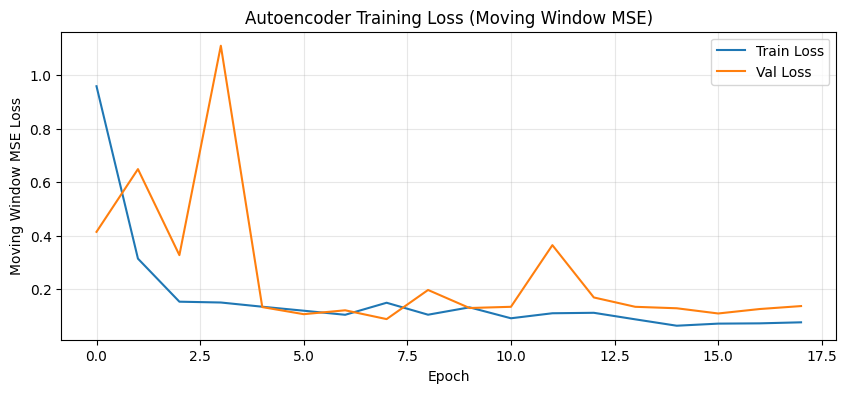

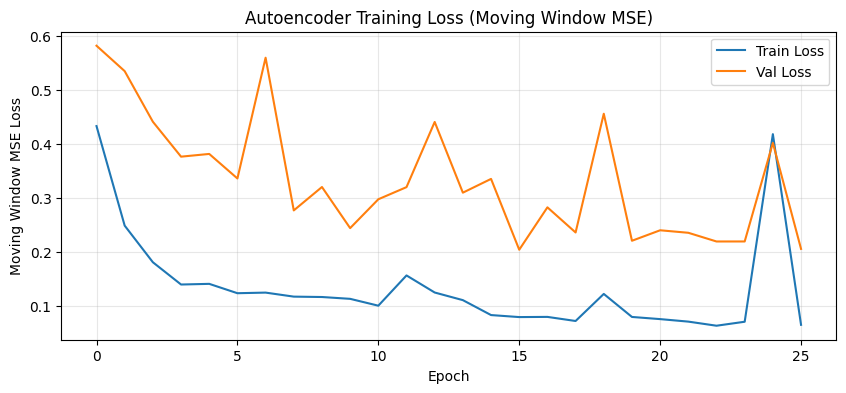


5. Extracting combined latent...
   Combined latent dim: 96

6. Flagging anomalies...

Anomaly Detection Results (OR Logic - Dual Encoders):
  Total test samples: 358
  Anomalies flagged: 32 (8.9%)
  Time domain: 27 (7.5%)
  Frequency domain: 23 (6.4%)

7. Visualizing results...


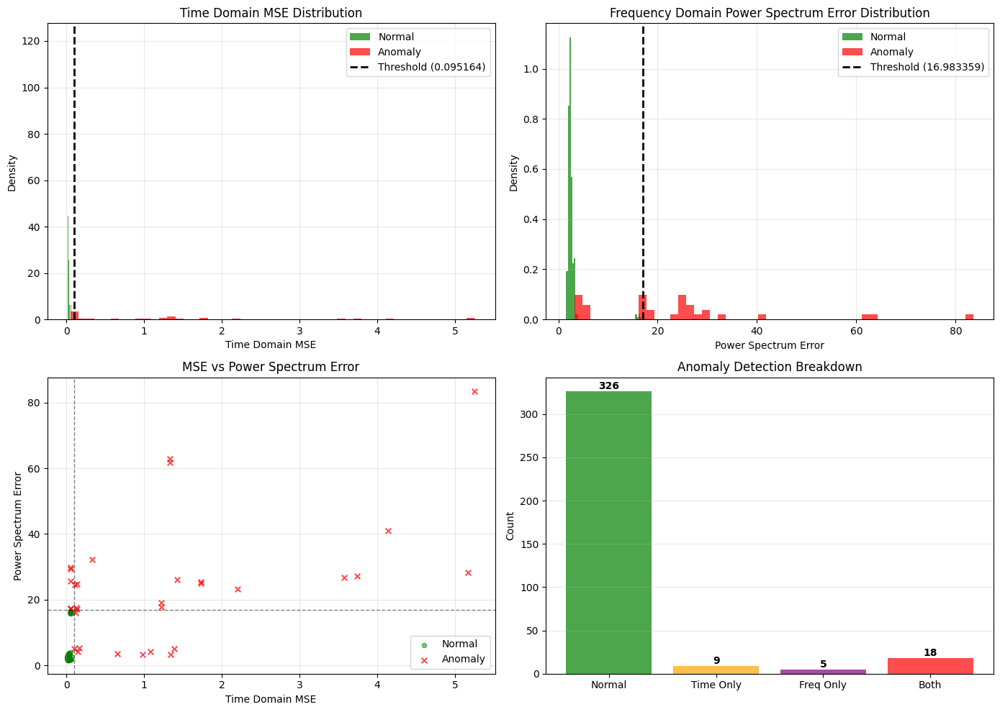


8. Visualizing latent space...


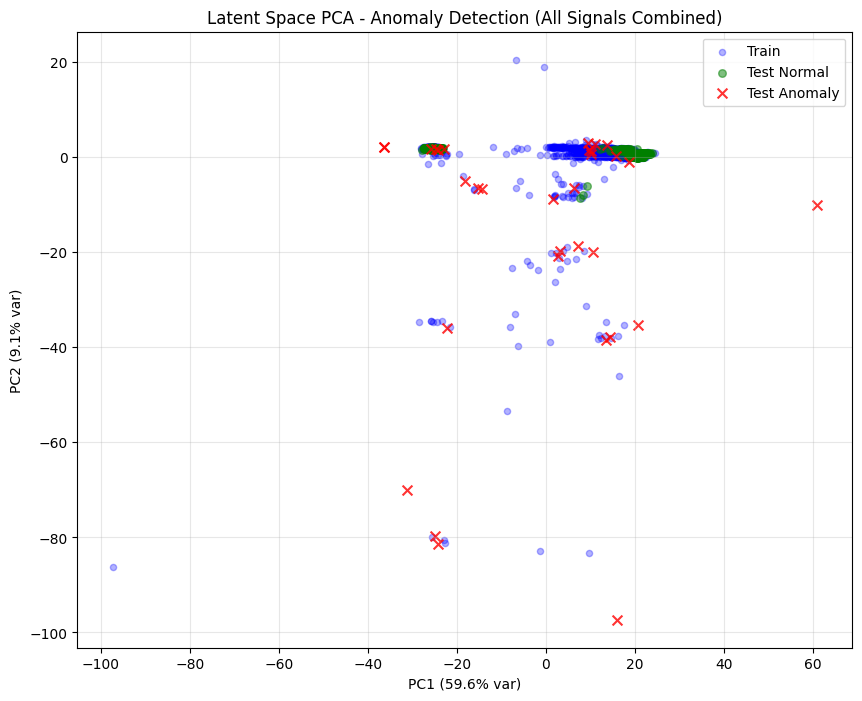


Dual Encoder Pipeline Complete!


In [23]:
# ----------------------------------------------------------------------
# AUTOENCODER + HDBSCAN ANOMALY DETECTION PIPELINE
# VERSION 3: Dual Encoders - Separate Autoencoders for Boolean and Analog Signals
# ----------------------------------------------------------------------
# This version trains TWO separate autoencoders:
# 1. Boolean Autoencoder: ball_valve_closed, ball_valve_open (2 signals × 360 = 720 features)
# 2. Analog Autoencoder: active_power, guide_vane_position, water_pressure_downstream, water_pressure_upstream (4 signals × 360 = 1440 features)
#
# Then combines their latent representations for anomaly detection using the SAME logic as VERSION 2:
# - Time Domain: MSE reconstruction error threshold
# - Frequency Domain: Power spectrum error threshold  
# - OR logic: Anomaly flagged if EITHER method detects it
# ----------------------------------------------------------------------

print("="*60)
print("DUAL ENCODER AUTOENCODER ANOMALY DETECTION")
print("="*60)
print("Training TWO separate autoencoders:")
print("  1. Boolean signals: ball_valve_closed, ball_valve_open")
print("  2. Analog signals: active_power, guide_vane_position, water_pressure_downstream, water_pressure_upstream")
print("="*60)

# Reuse configuration from VERSION 2
BOOLEAN_SIGNALS = ['ball_valve_closed', 'ball_valve_open']
ANALOG_SIGNALS = ['active_power', 'guide_vane_position', 
                  'water_pressure_downstream', 'water_pressure_upstream']

# Bottleneck dimensions (can be tuned separately)
BOTTLENECK_DIM_BOOLEAN = 32  # Smaller for boolean (2 signals × 360 = 720 features)
BOTTLENECK_DIM_ANALOG = 64   # Larger for analog (4 signals × 360 = 1440 features)

# Hidden layer sizes
HIDDEN1_BOOLEAN = 256
HIDDEN2_BOOLEAN = 128
HIDDEN1_ANALOG = 512
HIDDEN2_ANALOG = 256

# ==============================================================================
# 1. DUAL AUTOENCODER DEFINITIONS
# ==============================================================================
class DenseAutoencoderBoolean(nn.Module):
    """Dense Autoencoder for Boolean Signals Only."""
    def __init__(self, input_dim=720, latent_dim=32, hidden1=256, hidden2=128):
        super(DenseAutoencoderBoolean, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, hidden1),
            nn.BatchNorm1d(hidden1),
            nn.Linear(hidden1, hidden2),
            nn.BatchNorm1d(hidden2),
            nn.Linear(hidden2, latent_dim),
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, hidden2),
            nn.BatchNorm1d(hidden2),
            nn.Linear(hidden2, hidden1),
            nn.BatchNorm1d(hidden1),
            nn.Linear(hidden1, input_dim),
        )
    def forward(self, x):
        latent = self.encoder(x)
        reconstruction = self.decoder(latent)
        return reconstruction, latent

class DenseAutoencoderAnalog(nn.Module):
    """Dense Autoencoder for Analog Signals Only."""
    def __init__(self, input_dim=1440, latent_dim=64, hidden1=512, hidden2=256):
        super(DenseAutoencoderAnalog, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, hidden1),
            nn.BatchNorm1d(hidden1),
            nn.Linear(hidden1, hidden2),
            nn.BatchNorm1d(hidden2),
            nn.Linear(hidden2, latent_dim),
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, hidden2),
            nn.BatchNorm1d(hidden2),
            nn.Linear(hidden2, hidden1),
            nn.BatchNorm1d(hidden1),
            nn.Linear(hidden1, input_dim),
        )
    def forward(self, x):
        latent = self.encoder(x)
        reconstruction = self.decoder(latent)
        return reconstruction, latent

# ==============================================================================
# 2. WINDOW EXTRACTION (Separate Boolean and Analog)
# ==============================================================================
def load_separated_windows(split='training', closing_only=True):
    """Load windows separated by signal type (boolean vs analog)."""
    extractor = WindowExtractorCombined(TRANSITIONS_DIR, half_window=HALF_WINDOW, closing_only=closing_only)
    all_windows_boolean = []
    all_windows_analog = []
    files = [f for f in os.listdir(TRANSITIONS_DIR) if f.endswith('_processed.pkl') and split in f]
    
    if closing_only:
        print(f"   [FILTER] Only loading CLOSING transitions")
    
    for f in tqdm(files, desc=f"Loading {split} windows"):
        base = f.replace('_processed.pkl', '')
        processed_path = os.path.join(TRANSITIONS_DIR, f)
        transitions_path = os.path.join(TRANSITIONS_DIR, f"{base}_transitions.pkl")
        windows = extractor.extract_windows(processed_path, transitions_path)
        
        for window in windows:
            window_2d = window.reshape(360, len(SIGNALS))
            boolean_window = []
            analog_window = []
            for sig in SIGNALS:
                sig_idx = SIGNALS.index(sig)
                sig_data = window_2d[:, sig_idx]
                if sig in BOOLEAN_SIGNALS:
                    boolean_window.append(sig_data)
                elif sig in ANALOG_SIGNALS:
                    analog_window.append(sig_data)
            if boolean_window:
                all_windows_boolean.append(np.array(boolean_window).T.flatten())
            if analog_window:
                all_windows_analog.append(np.array(analog_window).T.flatten())
    
    return (np.array(all_windows_boolean) if all_windows_boolean else None,
            np.array(all_windows_analog) if all_windows_analog else None)

# ==============================================================================
# 3. TRAIN DUAL AUTOENCODERS (Custom training for each model type)
# ==============================================================================
def train_single_autoencoder(X_train, model_class, n_signals, epochs=100, batch_size=32, 
                              lr=0.001, weight_decay=1.57442e-05, 
                              bottleneck_dim=32, hidden1=256, hidden2=128,
                              smooth_lambda=4.65496e-05, name="Autoencoder"):
    """Train a single autoencoder with given model class."""
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    print(f"Training {name} on {len(X_train)} samples...")
    print(f"Input dimension: {X_train.shape[1]} ({n_signals} signals × 360 timesteps)")
    
    # Normalize
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_train)
    
    # Train/Val Split
    dataset = TensorDataset(torch.FloatTensor(X_scaled))
    train_size = int(0.8 * len(dataset))
    val_size = len(dataset) - train_size
    train_ds, val_ds = random_split(dataset, [train_size, val_size])
    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_ds, batch_size=batch_size)
    
    # Model
    input_dim = X_train.shape[1]
    model = model_class(
        input_dim=input_dim,
        latent_dim=bottleneck_dim,
        hidden1=hidden1,
        hidden2=hidden2,
    ).to(device)
    
    # Initialize weights
    def init_weights(m):
        if isinstance(m, nn.Linear):
            torch.nn.init.xavier_uniform_(m.weight, gain=1.0)
            if m.bias is not None:
                torch.nn.init.constant_(m.bias, 0.0)
    model.apply(init_weights)
    
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    
    # Simple MSE loss (simpler than moving window for dual encoders)
    loss_fn = nn.MSELoss()
    
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, 
                                   min_lr=1e-7, verbose=True)
    
    # Training Loop
    history = {'train': [], 'val': []}
    best_val_loss = float('inf')
    patience_early_stop = 10
    patience_counter = 0
    
    for ep in tqdm(range(epochs), desc=f"Training {name}"):
        # Train
        model.train()
        train_loss = 0
        for (x,) in train_loader:
            x = x.to(device)
            optimizer.zero_grad()
            recon, _ = model(x)
            loss = loss_fn(recon, x)
            # Smoothness regularizer
            if smooth_lambda > 0:
                tv = torch.mean(torch.abs(recon[:, 1:] - recon[:, :-1]))
                loss = loss + smooth_lambda * tv
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            train_loss += loss.item()
        train_loss /= len(train_loader)
        
        # Validate
        model.eval()
        val_loss = 0
        with torch.no_grad():
            for (x,) in val_loader:
                x = x.to(device)
                recon, _ = model(x)
                val_loss += loss_fn(recon, x).item()
        val_loss /= len(val_loader)
        
        history['train'].append(train_loss)
        history['val'].append(val_loss)
        scheduler.step(val_loss)
        
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            best_model_state = model.state_dict().copy()
        else:
            patience_counter += 1
        
        if (ep + 1) % 10 == 0:
            print(f"  Epoch {ep+1}/{epochs}: train_loss={train_loss:.6f}, val_loss={val_loss:.6f}")
        
        if patience_counter >= patience_early_stop:
            print(f"\n  Early stopping at epoch {ep+1}")
            model.load_state_dict(best_model_state)
            break
    
    if patience_counter < patience_early_stop:
        model.load_state_dict(best_model_state)
    
    print(f"  {name}: Best validation loss: {best_val_loss:.6f}")
    return model, scaler, history

def train_dual_autoencoders(X_boolean_train, X_analog_train, epochs=100, batch_size=32, 
                            lr=0.001, weight_decay=1.57442e-05):
    """Train separate autoencoders for boolean and analog signals."""
    models, scalers, histories = {}, {}, {}
    
    # Train Boolean Autoencoder
    if X_boolean_train is not None and len(X_boolean_train) > 10:
        print(f"\n{'='*60}\nTRAINING BOOLEAN AUTOENCODER\n{'='*60}")
        model_boolean, scaler_boolean, history_boolean = train_single_autoencoder(
            X_boolean_train, 
            model_class=DenseAutoencoderBoolean,
            n_signals=len(BOOLEAN_SIGNALS),
            epochs=epochs, batch_size=batch_size, lr=lr, 
            weight_decay=weight_decay, bottleneck_dim=BOTTLENECK_DIM_BOOLEAN,
            hidden1=HIDDEN1_BOOLEAN, hidden2=HIDDEN2_BOOLEAN,
            name="Boolean AE"
        )
        models['boolean'] = model_boolean
        scalers['boolean'] = scaler_boolean
        histories['boolean'] = history_boolean
    
    # Train Analog Autoencoder  
    if X_analog_train is not None and len(X_analog_train) > 10:
        print(f"\n{'='*60}\nTRAINING ANALOG AUTOENCODER\n{'='*60}")
        model_analog, scaler_analog, history_analog = train_single_autoencoder(
            X_analog_train,
            model_class=DenseAutoencoderAnalog,
            n_signals=len(ANALOG_SIGNALS),
            epochs=epochs, batch_size=batch_size, lr=lr,
            weight_decay=weight_decay, bottleneck_dim=BOTTLENECK_DIM_ANALOG,
            hidden1=HIDDEN1_ANALOG, hidden2=HIDDEN2_ANALOG,
            name="Analog AE"
        )
        models['analog'] = model_analog
        scalers['analog'] = scaler_analog
        histories['analog'] = history_analog
    
    return models, scalers, histories

# ==============================================================================
# 4. EXTRACT COMBINED LATENT & ANOMALY DETECTION
# ==============================================================================
def extract_dual_latent(models, scalers, X_boolean, X_analog):
    """Extract and combine latent features from both autoencoders."""
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    latent_combined = []
    
    if 'boolean' in models and X_boolean is not None and len(X_boolean) > 0:
        X_boolean_scaled = scalers['boolean'].transform(X_boolean)
        models['boolean'].eval()
        with torch.no_grad():
            _, latent_bool = models['boolean'](torch.FloatTensor(X_boolean_scaled).to(device))
            latent_combined.append(latent_bool.cpu().numpy())
    
    if 'analog' in models and X_analog is not None and len(X_analog) > 0:
        X_analog_scaled = scalers['analog'].transform(X_analog)
        models['analog'].eval()
        with torch.no_grad():
            _, latent_analog = models['analog'](torch.FloatTensor(X_analog_scaled).to(device))
            latent_combined.append(latent_analog.cpu().numpy())
    
    return np.hstack(latent_combined) if latent_combined else None

def flag_dual_anomalies(X_boolean_train, X_analog_train, X_boolean_test, X_analog_test,
                        models, scalers, mse_percentile=95, power_spectrum_percentile=95):
    """Flag anomalies using dual encoders with same logic as combined encoder."""
    # Reconstruct full windows for MSE computation
    X_train_full = []
    X_test_full = []
    
    # Combine boolean and analog back to full windows for MSE computation
    if X_boolean_train is not None and X_analog_train is not None:
        for i in range(min(len(X_boolean_train), len(X_analog_train))):
            bool_2d = X_boolean_train[i].reshape(360, len(BOOLEAN_SIGNALS))
            analog_2d = X_analog_train[i].reshape(360, len(ANALOG_SIGNALS))
            # Reconstruct in SIGNALS order
            full_window = np.zeros((360, len(SIGNALS)))
            for j, sig in enumerate(SIGNALS):
                if sig in BOOLEAN_SIGNALS:
                    full_window[:, j] = bool_2d[:, BOOLEAN_SIGNALS.index(sig)]
                else:
                    full_window[:, j] = analog_2d[:, ANALOG_SIGNALS.index(sig)]
            X_train_full.append(full_window.flatten())
    
    if X_boolean_test is not None and X_analog_test is not None:
        for i in range(min(len(X_boolean_test), len(X_analog_test))):
            bool_2d = X_boolean_test[i].reshape(360, len(BOOLEAN_SIGNALS))
            analog_2d = X_analog_test[i].reshape(360, len(ANALOG_SIGNALS))
            full_window = np.zeros((360, len(SIGNALS)))
            for j, sig in enumerate(SIGNALS):
                if sig in BOOLEAN_SIGNALS:
                    full_window[:, j] = bool_2d[:, BOOLEAN_SIGNALS.index(sig)]
                else:
                    full_window[:, j] = analog_2d[:, ANALOG_SIGNALS.index(sig)]
            X_test_full.append(full_window.flatten())
    
    X_train_full = np.array(X_train_full) if X_train_full else None
    X_test_full = np.array(X_test_full) if X_test_full else None
    
    # Use the same flag_combined_anomalies function but with reconstructed full windows
    # For MSE: compute separately and average, for power spectrum: use all signals
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    n_test = len(X_test_full) if X_test_full is not None else 0
    
    if n_test == 0:
        return None
    
    # Time Domain MSE (average across both encoders)
    mse_train_list, mse_test_list = [], []
    if 'boolean' in models and X_boolean_train is not None:
        X_bool_train_scaled = scalers['boolean'].transform(X_boolean_train)
        models['boolean'].eval()
        with torch.no_grad():
            recon_bool_train, _ = models['boolean'](torch.FloatTensor(X_bool_train_scaled).to(device))
            mse_train_list.append(((recon_bool_train.cpu().numpy() - X_bool_train_scaled) ** 2).mean(axis=1))
    if 'analog' in models and X_analog_train is not None:
        X_analog_train_scaled = scalers['analog'].transform(X_analog_train)
        models['analog'].eval()
        with torch.no_grad():
            recon_analog_train, _ = models['analog'](torch.FloatTensor(X_analog_train_scaled).to(device))
            mse_train_list.append(((recon_analog_train.cpu().numpy() - X_analog_train_scaled) ** 2).mean(axis=1))
    
    if 'boolean' in models and X_boolean_test is not None:
        X_bool_test_scaled = scalers['boolean'].transform(X_boolean_test)
        models['boolean'].eval()
        with torch.no_grad():
            recon_bool_test, _ = models['boolean'](torch.FloatTensor(X_bool_test_scaled).to(device))
            mse_test_list.append(((recon_bool_test.cpu().numpy() - X_bool_test_scaled) ** 2).mean(axis=1))
    if 'analog' in models and X_analog_test is not None:
        X_analog_test_scaled = scalers['analog'].transform(X_analog_test)
        models['analog'].eval()
        with torch.no_grad():
            recon_analog_test, _ = models['analog'](torch.FloatTensor(X_analog_test_scaled).to(device))
            mse_test_list.append(((recon_analog_test.cpu().numpy() - X_analog_test_scaled) ** 2).mean(axis=1))
    
    mse_train = np.concatenate(mse_train_list) if mse_train_list else np.array([])
    mse_test = np.mean(mse_test_list, axis=0) if mse_test_list else np.zeros(n_test)
    
    mse_threshold = np.percentile(mse_train, mse_percentile) if len(mse_train) > 0 else 0
    time_domain_anomaly = mse_test > mse_threshold
    
    # Frequency Domain Power Spectrum (compute separately and average)
    power_spectrum_train_list, power_spectrum_test_list = [], []
    
    if 'boolean' in models and X_boolean_train is not None:
        # Reconstruct boolean signals
        X_bool_train_scaled = scalers['boolean'].transform(X_boolean_train)
        models['boolean'].eval()
        with torch.no_grad():
            recon_bool_train, _ = models['boolean'](torch.FloatTensor(X_bool_train_scaled).to(device))
            recon_bool_train = scalers['boolean'].inverse_transform(recon_bool_train.cpu().numpy())
        
        # Compute power spectrum for boolean signals
        bool_train_3d = X_boolean_train.reshape(len(X_boolean_train), 360, len(BOOLEAN_SIGNALS))
        recon_bool_train_3d = recon_bool_train.reshape(len(X_boolean_train), 360, len(BOOLEAN_SIGNALS))
        ps_errors = []
        for i in range(len(X_boolean_train)):
            for sig_idx in range(len(BOOLEAN_SIGNALS)):
                sig_orig = bool_train_3d[i, :, sig_idx]
                sig_recon = recon_bool_train_3d[i, :, sig_idx]
                sig_orig_centered = sig_orig - np.mean(sig_orig)
                sig_recon_centered = sig_recon - np.mean(sig_recon)
                windowed_orig = sig_orig_centered * scipy_signal.windows.hann(len(sig_orig_centered))
                windowed_recon = sig_recon_centered * scipy_signal.windows.hann(len(sig_recon_centered))
                fft_orig = fft(windowed_orig)
                fft_recon = fft(windowed_recon)
                power_orig = np.abs(fft_orig) ** 2
                power_recon = np.abs(fft_recon) ** 2
                log_power_orig = np.log10(power_orig + 1e-10)
                log_power_recon = np.log10(power_recon + 1e-10)
                ps_errors.append(np.mean((log_power_orig - log_power_recon) ** 2))
        power_spectrum_train_list.append(np.array(ps_errors).reshape(len(X_boolean_train), len(BOOLEAN_SIGNALS)).mean(axis=1))
    
    if 'analog' in models and X_analog_train is not None:
        power_spectrum_train_list.append(compute_power_spectrum_error(
            models['analog'], scalers['analog'], X_analog_train, ANALOG_SIGNALS
        ))
    
    if 'boolean' in models and X_boolean_test is not None:
        X_bool_test_scaled = scalers['boolean'].transform(X_boolean_test)
        models['boolean'].eval()
        with torch.no_grad():
            recon_bool_test, _ = models['boolean'](torch.FloatTensor(X_bool_test_scaled).to(device))
            recon_bool_test = scalers['boolean'].inverse_transform(recon_bool_test.cpu().numpy())
        bool_test_3d = X_boolean_test.reshape(len(X_boolean_test), 360, len(BOOLEAN_SIGNALS))
        recon_bool_test_3d = recon_bool_test.reshape(len(X_boolean_test), 360, len(BOOLEAN_SIGNALS))
        ps_errors = []
        for i in range(len(X_boolean_test)):
            for sig_idx in range(len(BOOLEAN_SIGNALS)):
                sig_orig = bool_test_3d[i, :, sig_idx]
                sig_recon = recon_bool_test_3d[i, :, sig_idx]
                sig_orig_centered = sig_orig - np.mean(sig_orig)
                sig_recon_centered = sig_recon - np.mean(sig_recon)
                windowed_orig = sig_orig_centered * scipy_signal.windows.hann(len(sig_orig_centered))
                windowed_recon = sig_recon_centered * scipy_signal.windows.hann(len(sig_recon_centered))
                fft_orig = fft(windowed_orig)
                fft_recon = fft(windowed_recon)
                power_orig = np.abs(fft_orig) ** 2
                power_recon = np.abs(fft_recon) ** 2
                log_power_orig = np.log10(power_orig + 1e-10)
                log_power_recon = np.log10(power_recon + 1e-10)
                ps_errors.append(np.mean((log_power_orig - log_power_recon) ** 2))
        power_spectrum_test_list.append(np.array(ps_errors).reshape(len(X_boolean_test), len(BOOLEAN_SIGNALS)).mean(axis=1))
    
    if 'analog' in models and X_analog_test is not None:
        power_spectrum_test_list.append(compute_power_spectrum_error(
            models['analog'], scalers['analog'], X_analog_test, ANALOG_SIGNALS
        ))
    
    # Average power spectrum errors across both encoders
    power_spectrum_train = np.mean(power_spectrum_train_list, axis=0) if power_spectrum_train_list else np.array([])
    power_spectrum_test = np.mean(power_spectrum_test_list, axis=0) if power_spectrum_test_list else np.zeros(n_test)
    
    power_spectrum_threshold = np.percentile(power_spectrum_train, power_spectrum_percentile) if len(power_spectrum_train) > 0 else 0
    freq_domain_anomaly = power_spectrum_test > power_spectrum_threshold
    
    # Combine with OR logic
    is_anomaly = time_domain_anomaly | freq_domain_anomaly
    reasons = []
    for i in range(n_test):
        r = []
        if time_domain_anomaly[i]: r.append('time_domain_mse')
        if freq_domain_anomaly[i]: r.append('freq_domain_power_spectrum')
        reasons.append(r if r else ['normal'])
    
    print(f"\nAnomaly Detection Results (OR Logic - Dual Encoders):")
    print(f"  Total test samples: {n_test}")
    print(f"  Anomalies flagged: {sum(is_anomaly)} ({100*sum(is_anomaly)/n_test:.1f}%)")
    print(f"  Time domain: {sum(time_domain_anomaly)} ({100*sum(time_domain_anomaly)/n_test:.1f}%)")
    print(f"  Frequency domain: {sum(freq_domain_anomaly)} ({100*sum(freq_domain_anomaly)/n_test:.1f}%)")
    
    return {
        'is_anomaly': is_anomaly,
        'time_domain_anomaly': time_domain_anomaly,
        'freq_domain_anomaly': freq_domain_anomaly,
        'mse': mse_test,
        'mse_threshold': mse_threshold,
        'power_spectrum_error': power_spectrum_test,
        'power_spectrum_threshold': power_spectrum_threshold,
        'reasons': reasons
    }

# ==============================================================================
# 5. RUN PIPELINE
# ==============================================================================
print("\n" + "="*60)
print("DUAL ENCODER PIPELINE")
print("="*60)

# Load Data
print("\n1. Loading training windows (separated)...")
X_boolean_train, X_analog_train = load_separated_windows(split='training')
print(f"   Boolean: {len(X_boolean_train) if X_boolean_train is not None else 0}")
print(f"   Analog: {len(X_analog_train) if X_analog_train is not None else 0}")

print("\n2. Loading testing windows (separated)...")
X_boolean_test, X_analog_test = load_separated_windows(split='testing')
print(f"   Boolean: {len(X_boolean_test) if X_boolean_test is not None else 0}")
print(f"   Analog: {len(X_analog_test) if X_analog_test is not None else 0}")

# Train
if (X_boolean_train is not None and len(X_boolean_train) > 10) or \
   (X_analog_train is not None and len(X_analog_train) > 10):
    print("\n3. Training Dual Autoencoders...")
    models_dual, scalers_dual, histories_dual = train_dual_autoencoders(
        X_boolean_train, X_analog_train,
        epochs=EPOCHS_AE2, batch_size=BATCH_SIZE_AE2,
        lr=LEARNING_RATE_AE2, weight_decay=WEIGHT_DECAY_AE2
    )
    
    # Plot histories
    print("\n4. Plotting training histories...")
    if 'boolean' in histories_dual:
        plot_combined_training_history(histories_dual['boolean'])
    if 'analog' in histories_dual:
        plot_combined_training_history(histories_dual['analog'])
    
    # Extract latent
    print("\n5. Extracting combined latent...")
    latent_train_dual = extract_dual_latent(models_dual, scalers_dual, X_boolean_train, X_analog_train)
    latent_test_dual = extract_dual_latent(models_dual, scalers_dual, X_boolean_test, X_analog_test)
    if latent_train_dual is not None:
        print(f"   Combined latent dim: {latent_train_dual.shape[1]}")
    
    # Flag anomalies
    print("\n6. Flagging anomalies...")
    flags_dual = flag_dual_anomalies(
        X_boolean_train, X_analog_train, X_boolean_test, X_analog_test,
        models_dual, scalers_dual, mse_percentile=95, power_spectrum_percentile=95
    )
    
    if flags_dual is not None:
        # Reconstruct full windows for visualization
        X_train_full = []
        X_test_full = []
        for i in range(min(len(X_boolean_train), len(X_analog_train))):
            bool_2d = X_boolean_train[i].reshape(360, len(BOOLEAN_SIGNALS))
            analog_2d = X_analog_train[i].reshape(360, len(ANALOG_SIGNALS))
            full = np.zeros((360, len(SIGNALS)))
            for j, sig in enumerate(SIGNALS):
                if sig in BOOLEAN_SIGNALS:
                    full[:, j] = bool_2d[:, BOOLEAN_SIGNALS.index(sig)]
                else:
                    full[:, j] = analog_2d[:, ANALOG_SIGNALS.index(sig)]
            X_train_full.append(full.flatten())
        for i in range(min(len(X_boolean_test), len(X_analog_test))):
            bool_2d = X_boolean_test[i].reshape(360, len(BOOLEAN_SIGNALS))
            analog_2d = X_analog_test[i].reshape(360, len(ANALOG_SIGNALS))
            full = np.zeros((360, len(SIGNALS)))
            for j, sig in enumerate(SIGNALS):
                if sig in BOOLEAN_SIGNALS:
                    full[:, j] = bool_2d[:, BOOLEAN_SIGNALS.index(sig)]
                else:
                    full[:, j] = analog_2d[:, ANALOG_SIGNALS.index(sig)]
            X_test_full.append(full.flatten())
        
        X_train_full = np.array(X_train_full)
        X_test_full = np.array(X_test_full)
        
        # Create dummy combined model for visualization (uses analog model)
        print("\n7. Visualizing results...")
        plot_combined_reconstruction_error(
            models_dual.get('analog', models_dual.get('boolean')),
            scalers_dual.get('analog', scalers_dual.get('boolean')),
            X_train_full, X_test_full, flags_dual
        )
        
        if latent_train_dual is not None and latent_test_dual is not None:
            print("\n8. Visualizing latent space...")
            plot_combined_latent_pca(latent_train_dual, latent_test_dual, flags_dual)
        
        print("\n" + "="*60)
        print("Dual Encoder Pipeline Complete!")
        print("="*60)
else:
    print("\n!!! NOT ENOUGH DATA !!!")


In [ ]:
# ==============================================================================
# DUAL ENCODER: TESTING ON SYNTHETIC ANOMALIES + CLUSTERING
# ==============================================================================
# This cell:
# 1. Tests the dual encoder on synthetic anomalies (generated in previous cells)
# 2. Tests on real test data
# 3. Combines detected anomalies from both
# 4. Clusters all detected anomalies to find common patterns
# ==============================================================================

print("="*70)
print("DUAL ENCODER: TESTING ON SYNTHETIC ANOMALIES + CLUSTERING")
print("="*70)

# ==============================================================================
# 1. LOAD SYNTHETIC ANOMALIES (from previous generation cell)
# ==============================================================================
print("\n1. Loading synthetic anomalies...")

# Check if synthetic anomalies exist from previous cells
synthetic_data_available = False
if 'X_anomalous' in globals() and 'anomaly_metadata' in globals():
    synthetic_data_available = True
    print(f"   Found in-memory: {len(X_anomalous)} anomalous windows")
else:
    # Try loading from saved file
    synthetic_path = 'anomalies_added/anomalous_training_windows.pkl'
    if os.path.exists(synthetic_path):
        with open(synthetic_path, 'rb') as f:
            synthetic_data = pickle.load(f)
        X_anomalous = synthetic_data['X_anomalous']
        anomaly_metadata = synthetic_data['anomaly_metadata']
        anomaly_indices = synthetic_data['anomaly_indices']
        X_original = synthetic_data.get('X_original', X_train_combined if 'X_train_combined' in globals() else None)
        synthetic_data_available = True
        print(f"   Loaded from file: {len(X_anomalous)} anomalous windows")
    else:
        print("   ⚠️  No synthetic anomalies found. Run the synthetic anomaly generation cell first.")

if not synthetic_data_available:
    print("   Skipping synthetic anomaly testing.")
else:
    # ==============================================================================
    # 2. SEPARATE SYNTHETIC WINDOWS BY SIGNAL TYPE
    # ==============================================================================
    print("\n2. Separating synthetic windows by signal type...")
    
    # Separate anomalous windows
    X_anomalous_boolean = []
    X_anomalous_analog = []
    
    for window in X_anomalous:
        window_2d = window.reshape(360, len(SIGNALS))
        boolean_window = []
        analog_window = []
        for sig in SIGNALS:
            sig_idx = SIGNALS.index(sig)
            sig_data = window_2d[:, sig_idx]
            if sig in BOOLEAN_SIGNALS:
                boolean_window.append(sig_data)
            elif sig in ANALOG_SIGNALS:
                analog_window.append(sig_data)
        X_anomalous_boolean.append(np.array(boolean_window).T.flatten())
        X_anomalous_analog.append(np.array(analog_window).T.flatten())
    
    X_anomalous_boolean = np.array(X_anomalous_boolean)
    X_anomalous_analog = np.array(X_anomalous_analog)
    
    print(f"   Anomalous Boolean: {X_anomalous_boolean.shape}")
    print(f"   Anomalous Analog: {X_anomalous_analog.shape}")
    
    # Separate original (normal) windows for threshold computation
    if 'X_original' in globals() and X_original is not None:
        X_original_boolean = []
        X_original_analog = []
        for window in X_original:
            window_2d = window.reshape(360, len(SIGNALS))
            boolean_window = []
            analog_window = []
            for sig in SIGNALS:
                sig_idx = SIGNALS.index(sig)
                sig_data = window_2d[:, sig_idx]
                if sig in BOOLEAN_SIGNALS:
                    boolean_window.append(sig_data)
                elif sig in ANALOG_SIGNALS:
                    analog_window.append(sig_data)
            X_original_boolean.append(np.array(boolean_window).T.flatten())
            X_original_analog.append(np.array(analog_window).T.flatten())
        X_original_boolean = np.array(X_original_boolean)
        X_original_analog = np.array(X_original_analog)
        print(f"   Original Boolean: {X_original_boolean.shape}")
        print(f"   Original Analog: {X_original_analog.shape}")
    else:
        # Use training data as baseline
        X_original_boolean = X_boolean_train
        X_original_analog = X_analog_train
        print(f"   Using training data as baseline")
    
    # ==============================================================================
    # 3. DETECT ANOMALIES IN SYNTHETIC DATA
    # ==============================================================================
    print("\n3. Detecting anomalies in synthetic data using dual encoder...")
    
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    # Compute MSE for threshold from training/original data
    mse_train_list = []
    if 'boolean' in models_dual:
        X_bool_train_scaled = scalers_dual['boolean'].transform(X_original_boolean)
        models_dual['boolean'].eval()
        with torch.no_grad():
            recon_bool_train, _ = models_dual['boolean'](torch.FloatTensor(X_bool_train_scaled).to(device))
            mse_train_list.append(((recon_bool_train.cpu().numpy() - X_bool_train_scaled) ** 2).mean(axis=1))
    if 'analog' in models_dual:
        X_analog_train_scaled = scalers_dual['analog'].transform(X_original_analog)
        models_dual['analog'].eval()
        with torch.no_grad():
            recon_analog_train, _ = models_dual['analog'](torch.FloatTensor(X_analog_train_scaled).to(device))
            mse_train_list.append(((recon_analog_train.cpu().numpy() - X_analog_train_scaled) ** 2).mean(axis=1))
    
    mse_train = np.concatenate(mse_train_list) if mse_train_list else np.array([])
    mse_threshold = np.percentile(mse_train, 95)
    print(f"   MSE threshold (95th percentile): {mse_threshold:.6f}")
    
    # Compute MSE for anomalous data
    mse_anom_list = []
    if 'boolean' in models_dual:
        X_bool_anom_scaled = scalers_dual['boolean'].transform(X_anomalous_boolean)
        models_dual['boolean'].eval()
        with torch.no_grad():
            recon_bool_anom, _ = models_dual['boolean'](torch.FloatTensor(X_bool_anom_scaled).to(device))
            mse_anom_list.append(((recon_bool_anom.cpu().numpy() - X_bool_anom_scaled) ** 2).mean(axis=1))
    if 'analog' in models_dual:
        X_analog_anom_scaled = scalers_dual['analog'].transform(X_anomalous_analog)
        models_dual['analog'].eval()
        with torch.no_grad():
            recon_analog_anom, _ = models_dual['analog'](torch.FloatTensor(X_analog_anom_scaled).to(device))
            mse_anom_list.append(((recon_analog_anom.cpu().numpy() - X_analog_anom_scaled) ** 2).mean(axis=1))
    
    mse_synthetic = np.mean(mse_anom_list, axis=0)
    synthetic_time_domain_anomaly = mse_synthetic > mse_threshold
    
    # Power spectrum for synthetic
    ps_anom_list = []
    if 'boolean' in models_dual:
        recon_bool_anom_inv = scalers_dual['boolean'].inverse_transform(recon_bool_anom.cpu().numpy())
        bool_anom_3d = X_anomalous_boolean.reshape(len(X_anomalous_boolean), 360, len(BOOLEAN_SIGNALS))
        recon_bool_anom_3d = recon_bool_anom_inv.reshape(len(X_anomalous_boolean), 360, len(BOOLEAN_SIGNALS))
        ps_errors = []
        for i in range(len(X_anomalous_boolean)):
            for sig_idx in range(len(BOOLEAN_SIGNALS)):
                sig_orig = bool_anom_3d[i, :, sig_idx]
                sig_recon = recon_bool_anom_3d[i, :, sig_idx]
                windowed_orig = (sig_orig - np.mean(sig_orig)) * scipy_signal.windows.hann(360)
                windowed_recon = (sig_recon - np.mean(sig_recon)) * scipy_signal.windows.hann(360)
                power_orig = np.abs(fft(windowed_orig)) ** 2
                power_recon = np.abs(fft(windowed_recon)) ** 2
                ps_errors.append(np.mean((np.log10(power_orig + 1e-10) - np.log10(power_recon + 1e-10)) ** 2))
        ps_anom_list.append(np.array(ps_errors).reshape(len(X_anomalous_boolean), len(BOOLEAN_SIGNALS)).mean(axis=1))
    
    if 'analog' in models_dual:
        ps_anom_list.append(compute_power_spectrum_error(
            models_dual['analog'], scalers_dual['analog'], X_anomalous_analog, ANALOG_SIGNALS
        ))
    
    # Get power spectrum threshold from training data
    ps_train_list = []
    if 'boolean' in models_dual:
        recon_bool_train_inv = scalers_dual['boolean'].inverse_transform(recon_bool_train.cpu().numpy())
        bool_train_3d = X_original_boolean.reshape(len(X_original_boolean), 360, len(BOOLEAN_SIGNALS))
        recon_bool_train_3d = recon_bool_train_inv.reshape(len(X_original_boolean), 360, len(BOOLEAN_SIGNALS))
        ps_errors = []
        for i in range(len(X_original_boolean)):
            for sig_idx in range(len(BOOLEAN_SIGNALS)):
                sig_orig = bool_train_3d[i, :, sig_idx]
                sig_recon = recon_bool_train_3d[i, :, sig_idx]
                windowed_orig = (sig_orig - np.mean(sig_orig)) * scipy_signal.windows.hann(360)
                windowed_recon = (sig_recon - np.mean(sig_recon)) * scipy_signal.windows.hann(360)
                power_orig = np.abs(fft(windowed_orig)) ** 2
                power_recon = np.abs(fft(windowed_recon)) ** 2
                ps_errors.append(np.mean((np.log10(power_orig + 1e-10) - np.log10(power_recon + 1e-10)) ** 2))
        ps_train_list.append(np.array(ps_errors).reshape(len(X_original_boolean), len(BOOLEAN_SIGNALS)).mean(axis=1))
    if 'analog' in models_dual:
        ps_train_list.append(compute_power_spectrum_error(
            models_dual['analog'], scalers_dual['analog'], X_original_analog, ANALOG_SIGNALS
        ))
    
    ps_train = np.mean(ps_train_list, axis=0) if ps_train_list else np.array([])
    ps_threshold = np.percentile(ps_train, 95)
    print(f"   Power spectrum threshold (95th percentile): {ps_threshold:.6f}")
    
    ps_synthetic = np.mean(ps_anom_list, axis=0)
    synthetic_freq_domain_anomaly = ps_synthetic > ps_threshold
    
    # Combine with OR logic
    synthetic_is_anomaly = synthetic_time_domain_anomaly | synthetic_freq_domain_anomaly
    
    print(f"\n   Synthetic Anomaly Detection Results:")
    print(f"     Total synthetic windows: {len(synthetic_is_anomaly)}")
    print(f"     Detected as anomaly: {sum(synthetic_is_anomaly)} ({100*sum(synthetic_is_anomaly)/len(synthetic_is_anomaly):.1f}%)")
    print(f"     Time domain only: {sum(synthetic_time_domain_anomaly & ~synthetic_freq_domain_anomaly)}")
    print(f"     Frequency domain only: {sum(synthetic_freq_domain_anomaly & ~synthetic_time_domain_anomaly)}")
    print(f"     Both: {sum(synthetic_time_domain_anomaly & synthetic_freq_domain_anomaly)}")
    
    # ==============================================================================
    # 4. DETECTION BY ANOMALY TYPE
    # ==============================================================================
    print("\n4. Detection performance by anomaly type...")
    
    df_synth = pd.DataFrame(anomaly_metadata)
    df_synth['detected'] = synthetic_is_anomaly
    df_synth['mse'] = mse_synthetic
    df_synth['power_spectrum'] = ps_synthetic
    
    print("\n   Detection by anomaly type:")
    type_results = df_synth.groupby('anomaly_type').agg({
        'detected': ['count', 'sum', 'mean'],
        'mse': 'mean'
    }).round(4)
    type_results.columns = ['total', 'detected', 'detection_rate', 'mean_mse']
    print(type_results.to_string())
    
    print("\n   Detection by signal:")
    signal_results = df_synth.groupby('signal').agg({
        'detected': ['count', 'sum', 'mean'],
        'mse': 'mean'
    }).round(4)
    signal_results.columns = ['total', 'detected', 'detection_rate', 'mean_mse']
    print(signal_results.to_string())
    
    # ==============================================================================
    # 5. DETECT ANOMALIES IN TEST DATA
    # ==============================================================================
    print("\n5. Detecting anomalies in test data...")
    
    # Apply same thresholds to test data
    mse_test_list = []
    if 'boolean' in models_dual and X_boolean_test is not None:
        X_bool_test_scaled = scalers_dual['boolean'].transform(X_boolean_test)
        models_dual['boolean'].eval()
        with torch.no_grad():
            recon_bool_test, _ = models_dual['boolean'](torch.FloatTensor(X_bool_test_scaled).to(device))
            mse_test_list.append(((recon_bool_test.cpu().numpy() - X_bool_test_scaled) ** 2).mean(axis=1))
    if 'analog' in models_dual and X_analog_test is not None:
        X_analog_test_scaled = scalers_dual['analog'].transform(X_analog_test)
        models_dual['analog'].eval()
        with torch.no_grad():
            recon_analog_test, _ = models_dual['analog'](torch.FloatTensor(X_analog_test_scaled).to(device))
            mse_test_list.append(((recon_analog_test.cpu().numpy() - X_analog_test_scaled) ** 2).mean(axis=1))
    
    mse_test = np.mean(mse_test_list, axis=0) if mse_test_list else np.zeros(len(X_boolean_test))
    test_time_domain_anomaly = mse_test > mse_threshold
    
    # Power spectrum for test
    ps_test_list = []
    if 'boolean' in models_dual and X_boolean_test is not None:
        recon_bool_test_inv = scalers_dual['boolean'].inverse_transform(recon_bool_test.cpu().numpy())
        bool_test_3d = X_boolean_test.reshape(len(X_boolean_test), 360, len(BOOLEAN_SIGNALS))
        recon_bool_test_3d = recon_bool_test_inv.reshape(len(X_boolean_test), 360, len(BOOLEAN_SIGNALS))
        ps_errors = []
        for i in range(len(X_boolean_test)):
            for sig_idx in range(len(BOOLEAN_SIGNALS)):
                sig_orig = bool_test_3d[i, :, sig_idx]
                sig_recon = recon_bool_test_3d[i, :, sig_idx]
                windowed_orig = (sig_orig - np.mean(sig_orig)) * scipy_signal.windows.hann(360)
                windowed_recon = (sig_recon - np.mean(sig_recon)) * scipy_signal.windows.hann(360)
                power_orig = np.abs(fft(windowed_orig)) ** 2
                power_recon = np.abs(fft(windowed_recon)) ** 2
                ps_errors.append(np.mean((np.log10(power_orig + 1e-10) - np.log10(power_recon + 1e-10)) ** 2))
        ps_test_list.append(np.array(ps_errors).reshape(len(X_boolean_test), len(BOOLEAN_SIGNALS)).mean(axis=1))
    if 'analog' in models_dual and X_analog_test is not None:
        ps_test_list.append(compute_power_spectrum_error(
            models_dual['analog'], scalers_dual['analog'], X_analog_test, ANALOG_SIGNALS
        ))
    
    ps_test = np.mean(ps_test_list, axis=0) if ps_test_list else np.zeros(len(X_boolean_test))
    test_freq_domain_anomaly = ps_test > ps_threshold
    test_is_anomaly = test_time_domain_anomaly | test_freq_domain_anomaly
    
    print(f"   Test Anomaly Detection Results:")
    print(f"     Total test windows: {len(test_is_anomaly)}")
    print(f"     Detected as anomaly: {sum(test_is_anomaly)} ({100*sum(test_is_anomaly)/len(test_is_anomaly):.1f}%)")
    
    # ==============================================================================
    # 6. COMBINE AND CLUSTER ALL DETECTED ANOMALIES
    # ==============================================================================
    print("\n6. Clustering all detected anomalies...")
    
    # Combine latent representations of detected anomalies
    # Extract latent for all synthetic
    latent_synthetic = extract_dual_latent(models_dual, scalers_dual, X_anomalous_boolean, X_anomalous_analog)
    latent_test = extract_dual_latent(models_dual, scalers_dual, X_boolean_test, X_analog_test)
    
    # Get detected anomalies
    synthetic_detected_mask = synthetic_is_anomaly
    test_detected_mask = test_is_anomaly
    
    n_synthetic_detected = sum(synthetic_detected_mask)
    n_test_detected = sum(test_detected_mask)
    print(f"   Detected anomalies - Synthetic: {n_synthetic_detected}, Test: {n_test_detected}")
    
    if n_synthetic_detected + n_test_detected >= 5:
        # Combine latent representations of detected anomalies
        latent_anomalies = []
        anomaly_sources = []  # 'synthetic' or 'test'
        anomaly_types = []    # anomaly type for synthetic, 'unknown' for test
        anomaly_mse = []
        anomaly_ps = []
        
        # Add synthetic anomalies
        for i in range(len(synthetic_is_anomaly)):
            if synthetic_detected_mask[i]:
                latent_anomalies.append(latent_synthetic[i])
                anomaly_sources.append('synthetic')
                anomaly_types.append(anomaly_metadata[i]['anomaly_type'])
                anomaly_mse.append(mse_synthetic[i])
                anomaly_ps.append(ps_synthetic[i])
        
        # Add test anomalies
        for i in range(len(test_is_anomaly)):
            if test_detected_mask[i]:
                latent_anomalies.append(latent_test[i])
                anomaly_sources.append('test')
                anomaly_types.append('unknown')
                anomaly_mse.append(mse_test[i])
                anomaly_ps.append(ps_test[i])
        
        latent_anomalies = np.array(latent_anomalies)
        anomaly_mse = np.array(anomaly_mse)
        anomaly_ps = np.array(anomaly_ps)
        
        print(f"   Total anomalies to cluster: {len(latent_anomalies)}")
        print(f"   Latent dimension: {latent_anomalies.shape[1]}")
        
        # HDBSCAN Clustering
        import hdbscan
        from sklearn.metrics import silhouette_score
        from scipy.cluster.hierarchy import dendrogram, linkage
        
        min_cluster_size = max(3, len(latent_anomalies) // 10)
        clusterer = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size, metric='euclidean', prediction_data=True)
        cluster_labels = clusterer.fit_predict(latent_anomalies)
        
        n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)
        n_noise = sum(cluster_labels == -1)
        
        print(f"   Clusters found: {n_clusters}")
        print(f"   Noise points: {n_noise}")
        
        # Silhouette score
        if n_clusters >= 2 and n_noise < len(cluster_labels) - 1:
            non_noise_mask = cluster_labels >= 0
            if sum(non_noise_mask) >= 2:
                try:
                    silhouette = silhouette_score(latent_anomalies[non_noise_mask], cluster_labels[non_noise_mask])
                    print(f"   Silhouette score: {silhouette:.4f}")
                except:
                    silhouette = None
        
        # ==============================================================================
        # 7. VISUALIZE CLUSTERING RESULTS
        # ==============================================================================
        print("\n7. Visualizing clustering results...")
        
        from sklearn.decomposition import PCA
        
        # PCA for visualization
        pca = PCA(n_components=2)
        latent_2d = pca.fit_transform(latent_anomalies)
        
        fig, axes = plt.subplots(2, 2, figsize=(16, 14))
        
        # Plot 1: Clusters colored by HDBSCAN label
        ax = axes[0, 0]
        unique_labels = set(cluster_labels)
        colors = plt.cm.tab10(np.linspace(0, 1, len(unique_labels)))
        for label, color in zip(sorted(unique_labels), colors):
            mask = cluster_labels == label
            if label == -1:
                ax.scatter(latent_2d[mask, 0], latent_2d[mask, 1], c='gray', marker='x', s=30, alpha=0.5, label='Noise')
            else:
                ax.scatter(latent_2d[mask, 0], latent_2d[mask, 1], c=[color], s=50, alpha=0.7, label=f'Cluster {label}')
        ax.set_xlabel('PC1')
        ax.set_ylabel('PC2')
        ax.set_title('HDBSCAN Clusters (Dual Encoder)')
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
        ax.grid(True, alpha=0.3)
        
        # Plot 2: Colored by source (synthetic vs test)
        ax = axes[0, 1]
        synthetic_mask = np.array(anomaly_sources) == 'synthetic'
        test_mask = np.array(anomaly_sources) == 'test'
        ax.scatter(latent_2d[synthetic_mask, 0], latent_2d[synthetic_mask, 1], c='red', s=50, alpha=0.6, label='Synthetic', marker='x')
        ax.scatter(latent_2d[test_mask, 0], latent_2d[test_mask, 1], c='blue', s=50, alpha=0.6, label='Test', marker='o')
        ax.set_xlabel('PC1')
        ax.set_ylabel('PC2')
        ax.set_title('Anomalies by Source')
        ax.legend()
        ax.grid(True, alpha=0.3)
        
        # Plot 3: Colored by anomaly type
        ax = axes[1, 0]
        unique_types = list(set(anomaly_types))
        type_colors = plt.cm.Set1(np.linspace(0, 1, len(unique_types)))
        for atype, color in zip(unique_types, type_colors):
            mask = np.array(anomaly_types) == atype
            marker = 'o' if atype != 'unknown' else 's'
            ax.scatter(latent_2d[mask, 0], latent_2d[mask, 1], c=[color], s=50, alpha=0.6, label=atype, marker=marker)
        ax.set_xlabel('PC1')
        ax.set_ylabel('PC2')
        ax.set_title('Anomalies by Type')
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
        ax.grid(True, alpha=0.3)
        
        # Plot 4: MSE vs Power Spectrum by cluster
        ax = axes[1, 1]
        for label, color in zip(sorted(unique_labels), colors):
            mask = cluster_labels == label
            if label == -1:
                ax.scatter(anomaly_mse[mask], anomaly_ps[mask], c='gray', marker='x', s=30, alpha=0.5, label='Noise')
            else:
                ax.scatter(anomaly_mse[mask], anomaly_ps[mask], c=[color], s=50, alpha=0.7, label=f'Cluster {label}')
        ax.axvline(mse_threshold, color='black', linestyle='--', alpha=0.5, label='MSE threshold')
        ax.axhline(ps_threshold, color='black', linestyle=':', alpha=0.5, label='PS threshold')
        ax.set_xlabel('MSE')
        ax.set_ylabel('Power Spectrum Error')
        ax.set_title('Anomaly Scores by Cluster')
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
        ax.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.savefig('anomalies_added/dual_encoder_clustering.png', dpi=150, bbox_inches='tight')
        plt.show()
        
        # ==============================================================================
        # 8. CLUSTER COMPOSITION ANALYSIS
        # ==============================================================================
        print("\n8. Cluster composition analysis...")
        
        df_clusters = pd.DataFrame({
            'cluster': cluster_labels,
            'source': anomaly_sources,
            'type': anomaly_types,
            'mse': anomaly_mse,
            'power_spectrum': anomaly_ps
        })
        
        print("\n   Cluster composition by source:")
        cluster_source = df_clusters.groupby(['cluster', 'source']).size().unstack(fill_value=0)
        print(cluster_source.to_string())
        
        print("\n   Cluster composition by anomaly type:")
        cluster_type = df_clusters.groupby(['cluster', 'type']).size().unstack(fill_value=0)
        print(cluster_type.to_string())
        
        # Which anomaly types cluster with test data?
        print("\n   Test anomalies clustering with synthetic types:")
        for cluster_id in sorted(set(cluster_labels)):
            if cluster_id == -1:
                continue
            cluster_df = df_clusters[df_clusters['cluster'] == cluster_id]
            n_test = sum(cluster_df['source'] == 'test')
            n_synthetic = sum(cluster_df['source'] == 'synthetic')
            if n_test > 0 and n_synthetic > 0:
                synthetic_types = cluster_df[cluster_df['source'] == 'synthetic']['type'].value_counts()
                print(f"   Cluster {cluster_id}: {n_test} test + {n_synthetic} synthetic")
                print(f"      Synthetic types: {dict(synthetic_types)}")
        
        print("\n" + "="*70)
        print("Dual Encoder Synthetic Anomaly Testing & Clustering Complete!")
        print("="*70)
    else:
        print("   Not enough detected anomalies for clustering (need >= 5)")


[I 2025-12-14 00:42:12,760] A new study created in memory with name: denoising_autoencoder_tuning


Kernel python: /Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/bin/python
Optuna version: 4.6.0
HYPERPARAMETER TUNING WITH OPTUNA

Configuration:
  - Input dimension: 2160 (6 signals × 360 timesteps = 2160)
    Includes: 4 analog signals + 2 boolean signals
  - Training samples: 1564
  - Training loss: MSE (Mean Squared Error) - Time Domain
  - Objective: Minimize combined loss = Time Domain MSE + Power Spectrum Error
  - Early stopping: Enabled (patience=8, based on time domain MSE)
  - Learning rate scheduler: ReduceLROnPlateau

Search Space:
  - learning_rate: [1e-5, 1e-2] (log-uniform)
  - weight_decay: [1e-6, 1e-2] (log-uniform)
  - bottleneck_dim: [16, 32, 64, 128]
  - noise_std: [0.0, 0.3] (uniform)
  - smooth_lambda: [1e-6, 1e-2] (log-uniform)
  - hidden1: [256, 512, 1024]
  - hidden2: [64, 128, 256]
  - batch_size: [32, 64, 128]

Running 50 optimization trials...
(This may take a while - each trial trains for up 

  0%|          | 0/50 [00:00<?, ?it/s]

/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:42:32,265] Trial 0 finished with value: 5.244966514609483 and parameters: {'learning_rate': 0.00010069860335666859, 'weight_decay': 0.002227797678008418, 'bottleneck_dim': 128, 'noise_std': 0.2708701111077735, 'smooth_lambda': 0.003061698784638141, 'hidden1': 256, 'hidden2': 256, 'batch_size': 64}. Best is trial 0 with value: 5.244966514609483.


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:43:02,859] Trial 1 finished with value: 2.573700567814084 and parameters: {'learning_rate': 0.00636520025851703, 'weight_decay': 1.574421585766422e-05, 'bottleneck_dim': 128, 'noise_std': 0.028050047626462647, 'smooth_lambda': 4.6549557982531535e-05, 'hidden1': 512, 'hidden2': 256, 'batch_size': 32}. Best is trial 1 with value: 2.573700567814084.


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:43:21,593] Trial 2 finished with value: 6.40008045561089 and parameters: {'learning_rate': 0.00012594071053197747, 'weight_decay': 0.0006442713212912389, 'bottleneck_dim': 64, 'noise_std': 0.11345593121501499, 'smooth_lambda': 0.007415237625348698, 'hidden1': 512, 'hidden2': 256, 'batch_size': 128}. Best is trial 1 with value: 2.573700567814084.


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:43:45,914] Trial 3 finished with value: 4.078039752330133 and parameters: {'learning_rate': 0.005017379633167927, 'weight_decay': 9.483684194804386e-06, 'bottleneck_dim': 128, 'noise_std': 0.26473911944617123, 'smooth_lambda': 0.0001165769080518411, 'hidden1': 1024, 'hidden2': 128, 'batch_size': 32}. Best is trial 1 with value: 2.573700567814084.


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:43:54,680] Trial 4 finished with value: 3.492105564118293 and parameters: {'learning_rate': 0.00027804410447357337, 'weight_decay': 0.003115639114098184, 'bottleneck_dim': 16, 'noise_std': 0.08659139725706301, 'smooth_lambda': 0.000440206940078577, 'hidden1': 256, 'hidden2': 128, 'batch_size': 64}. Best is trial 1 with value: 2.573700567814084.


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:44:06,169] Trial 5 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:44:15,277] Trial 6 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:44:51,013] Trial 7 finished with value: 5.543535078693869 and parameters: {'learning_rate': 0.0010971105197533258, 'weight_decay': 1.2586430916811454e-06, 'bottleneck_dim': 32, 'noise_std': 0.2450094138275963, 'smooth_lambda': 0.0034957408851828482, 'hidden1': 1024, 'hidden2': 128, 'batch_size': 32}. Best is trial 1 with value: 2.573700567814084.


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:44:57,253] Trial 8 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:45:02,757] Trial 9 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:45:11,089] Trial 10 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:45:18,884] Trial 11 finished with value: 3.763691701216004 and parameters: {'learning_rate': 0.0013960977824939206, 'weight_decay': 0.00021076691217371542, 'bottleneck_dim': 16, 'noise_std': 0.0660140072606987, 'smooth_lambda': 3.420731570137766e-05, 'hidden1': 256, 'hidden2': 128, 'batch_size': 64}. Best is trial 1 with value: 2.573700567814084.


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:45:34,281] Trial 12 finished with value: 4.402413513810056 and parameters: {'learning_rate': 0.0021924933667327538, 'weight_decay': 1.4913338935575011e-05, 'bottleneck_dim': 16, 'noise_std': 0.06738625730088185, 'smooth_lambda': 0.0005758018275818498, 'hidden1': 256, 'hidden2': 256, 'batch_size': 64}. Best is trial 1 with value: 2.573700567814084.


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:45:50,673] Trial 13 finished with value: 4.79833158926538 and parameters: {'learning_rate': 0.0003787090472851957, 'weight_decay': 0.0004401575839521892, 'bottleneck_dim': 16, 'noise_std': 0.05411926211806073, 'smooth_lambda': 1.1766905698392223e-06, 'hidden1': 512, 'hidden2': 128, 'batch_size': 64}. Best is trial 1 with value: 2.573700567814084.


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:45:53,657] Trial 14 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:46:02,569] Trial 15 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:46:06,549] Trial 16 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:46:15,165] Trial 17 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:46:25,545] Trial 18 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:46:28,514] Trial 19 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:46:34,725] Trial 20 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:46:40,728] Trial 21 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:46:46,413] Trial 22 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:46:51,988] Trial 23 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:47:01,609] Trial 24 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:47:08,579] Trial 25 finished with value: 7.5480836028124045 and parameters: {'learning_rate': 0.001087291844681755, 'weight_decay': 3.323109704822587e-06, 'bottleneck_dim': 16, 'noise_std': 0.13217109010933537, 'smooth_lambda': 2.267231946808322e-05, 'hidden1': 256, 'hidden2': 256, 'batch_size': 32}. Best is trial 1 with value: 2.573700567814084.


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:47:14,108] Trial 26 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:47:18,013] Trial 27 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:47:27,823] Trial 28 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:47:36,478] Trial 29 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:47:56,135] Trial 30 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:48:26,957] Trial 31 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:48:46,767] Trial 32 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:49:05,212] Trial 33 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:49:24,802] Trial 34 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:49:48,557] Trial 35 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:50:08,456] Trial 36 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:50:33,100] Trial 37 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:50:48,470] Trial 38 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:50:58,623] Trial 39 finished with value: 4.764967541328779 and parameters: {'learning_rate': 0.009796001446418064, 'weight_decay': 0.004062615792026952, 'bottleneck_dim': 16, 'noise_std': 0.17346580680079804, 'smooth_lambda': 0.0005340559672691314, 'hidden1': 1024, 'hidden2': 64, 'batch_size': 64}. Best is trial 1 with value: 2.573700567814084.


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:51:06,599] Trial 40 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:51:20,957] Trial 41 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:51:34,754] Trial 42 finished with value: 6.042298227809739 and parameters: {'learning_rate': 0.0009032850829156973, 'weight_decay': 1.7552384283234375e-05, 'bottleneck_dim': 16, 'noise_std': 0.07057588339478968, 'smooth_lambda': 0.0008431505561598334, 'hidden1': 256, 'hidden2': 256, 'batch_size': 64}. Best is trial 1 with value: 2.573700567814084.


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:51:40,411] Trial 43 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:51:45,689] Trial 44 pruned. 


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:52:21,459] Trial 45 finished with value: 5.957521523962631 and parameters: {'learning_rate': 0.0005139261892218963, 'weight_decay': 4.761057751216068e-06, 'bottleneck_dim': 16, 'noise_std': 0.05933907167731937, 'smooth_lambda': 7.424595457809148e-05, 'hidden1': 512, 'hidden2': 256, 'batch_size': 64}. Best is trial 1 with value: 2.573700567814084.


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:52:33,450] Trial 46 finished with value: 6.991111984235654 and parameters: {'learning_rate': 0.0003406991191170734, 'weight_decay': 9.491109545698526e-06, 'bottleneck_dim': 32, 'noise_std': 0.12164239096427615, 'smooth_lambda': 1.9274536044630357e-05, 'hidden1': 256, 'hidden2': 256, 'batch_size': 128}. Best is trial 1 with value: 2.573700567814084.


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:52:45,222] Trial 47 finished with value: 4.31506720218775 and parameters: {'learning_rate': 0.0014322599062148744, 'weight_decay': 4.1356829370977916e-05, 'bottleneck_dim': 16, 'noise_std': 0.016639768150859012, 'smooth_lambda': 1.1097938633703225e-05, 'hidden1': 512, 'hidden2': 64, 'batch_size': 64}. Best is trial 1 with value: 2.573700567814084.


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:53:01,800] Trial 48 finished with value: 3.5789070151634252 and parameters: {'learning_rate': 0.0014206869608300384, 'weight_decay': 4.603766158224606e-05, 'bottleneck_dim': 64, 'noise_std': 0.008187264189285238, 'smooth_lambda': 1.0215133530980333e-05, 'hidden1': 512, 'hidden2': 64, 'batch_size': 64}. Best is trial 1 with value: 2.573700567814084.


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


[I 2025-12-14 00:53:10,342] Trial 49 pruned. 

OPTIMIZATION COMPLETE

Best Trial #1:
  Combined Loss (MSE + Power Spectrum): 2.573701
  - Time Domain MSE: 0.281919
  - Power Spectrum Error: 2.291782

Best Hyperparameters:
  learning_rate: 0.0063652
  weight_decay: 1.57442e-05
  bottleneck_dim: 128
  noise_std: 0.02805
  smooth_lambda: 4.65496e-05
  hidden1: 512
  hidden2: 256
  batch_size: 32

Trial Statistics:
  Completed: 16
  Pruned (early stopped): 34

VISUALIZATION


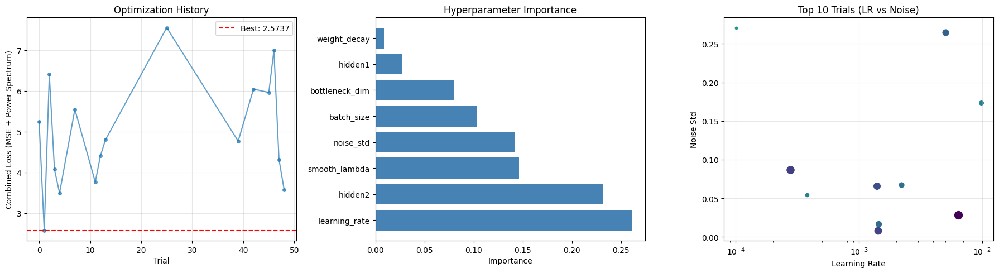


RECOMMENDED CONFIGURATION

Copy these values to update Cell 21:

# Optimized hyperparameters (from Optuna trial #1)
LEARNING_RATE_AE2 = 0.0063652
BOTTLENECK_DIM_AE2 = 128
NOISE_STD_AE2 = 0.0281
SMOOTH_LAMBDA_AE2 = 4.65496e-05
BATCH_SIZE_AE2 = 32
# weight_decay in optimizer: 1.57442e-05
# hidden1 = 512, hidden2 = 256



In [ ]:
# ==============================================================================
# HYPERPARAMETER TUNING WITH OPTUNA
# ==============================================================================
# Goal: Find the optimal hyperparameter combination to minimize validation loss
# Uses Bayesian optimization for efficient search

# IMPORTANT: Install into the *current notebook kernel* interpreter.
import sys 
import subprocess

print('Kernel python:', sys.executable)

# 1) Make sure pip exists in this venv (some venvs are created without pip)
def _ensure_pip():
    try:
        import pip  # noqa: F401
        return
    except ModuleNotFoundError:
        pass

    try:
        # Bootstrap pip into the environment
        subprocess.check_call([sys.executable, "-m", "ensurepip", "--upgrade"])
    except Exception as e:
        raise RuntimeError(
            "pip is missing in this kernel environment and ensurepip failed. "
            "Fix by recreating the venv with pip, e.g. `python -m venv --upgrade-deps .venv`, "
            "then reinstall requirements and restart the kernel."
        ) from e

    # Upgrade pip itself
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-U", "pip", "setuptools", "wheel"])

_ensure_pip()

# 2) Install optuna into this kernel environment
try:
    import optuna
except ModuleNotFoundError:
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-U", "optuna"])
    import optuna

from optuna.trial import TrialState
print('Optuna version:', optuna.__version__)

# ----------------------------------------------------------------------------
# Make this cell self-contained (so it works after kernel restarts)
# ----------------------------------------------------------------------------
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset, random_split
from sklearn.preprocessing import StandardScaler
from scipy.fft import fft
from scipy import signal as scipy_signal
import matplotlib.pyplot as plt

# Guard: ensure training windows are loaded
if 'X_train_combined' not in globals() or X_train_combined is None or len(X_train_combined) < 10:
    raise RuntimeError(
        "X_train_combined is not loaded (or too small). Run the combined pipeline cell to load windows first: "
        "X_train_combined = load_combined_windows(split='training')"
    )

# ------------------------------------------------------------------------------
# 1. Define the objective function (what Optuna will minimize)
# ------------------------------------------------------------------------------
def objective(trial):
    """Objective function for Optuna hyperparameter optimization."""
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    # -------------------------------------------------------------------------
    # HYPERPARAMETER SEARCH SPACE
    # -------------------------------------------------------------------------
    # Learning rate: log-uniform between 1e-5 and 1e-2
    lr = trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True)
    
    # Weight decay (L2 regularization): log-uniform
    weight_decay = trial.suggest_float('weight_decay', 1e-6, 1e-2, log=True)
    
    # Bottleneck dimension: categorical choices
    bottleneck_dim = trial.suggest_categorical('bottleneck_dim', [16, 32, 64, 128])
    
    # Noise std for denoising AE: uniform between 0 and 0.3
    noise_std = trial.suggest_float('noise_std', 0.0, 0.3)
    
    # Smoothness regularization: log-uniform (or 0)
    smooth_lambda = trial.suggest_float('smooth_lambda', 1e-6, 1e-2, log=True)
    
    # Hidden layer sizes
    hidden1 = trial.suggest_categorical('hidden1', [256, 512, 1024])
    hidden2 = trial.suggest_categorical('hidden2', [64, 128, 256])
    
    # Batch size
    batch_size = trial.suggest_categorical('batch_size', [32, 64, 128])
    
    # -------------------------------------------------------------------------
    # BUILD MODEL WITH SUGGESTED HYPERPARAMETERS
    # -------------------------------------------------------------------------
    class TunableAutoencoder(nn.Module):
        def __init__(self, input_dim, latent_dim, h1, h2):
            super().__init__()
            # Use LeakyReLU + BatchNorm to prevent dying neurons
            self.encoder = nn.Sequential(
                nn.Linear(input_dim, h1),
                nn.BatchNorm1d(h1),
                nn.LeakyReLU(negative_slope=0.01),
                nn.Linear(h1, h2),
                nn.BatchNorm1d(h2),
                nn.LeakyReLU(negative_slope=0.01),
                nn.Linear(h2, latent_dim),
            )
            self.decoder = nn.Sequential(
                nn.Linear(latent_dim, h2),
                nn.BatchNorm1d(h2),
                nn.LeakyReLU(negative_slope=0.01),
                nn.Linear(h2, h1),
                nn.BatchNorm1d(h1),
                nn.LeakyReLU(negative_slope=0.01),
                nn.Linear(h1, input_dim),
            )
        
        def forward(self, x):
            latent = self.encoder(x)
            return self.decoder(latent), latent
    
    # -------------------------------------------------------------------------
    # PREPARE DATA
    # -------------------------------------------------------------------------
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_train_combined)
    
    dataset = TensorDataset(torch.FloatTensor(X_scaled))
    train_size = int(0.8 * len(dataset))
    val_size = len(dataset) - train_size
    train_ds, val_ds = random_split(dataset, [train_size, val_size], 
                                     generator=torch.Generator().manual_seed(42))
    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_ds, batch_size=batch_size)
    
    # -------------------------------------------------------------------------
    # TRAIN
    # -------------------------------------------------------------------------
    # Input dimension should be 2160 (6 signals × 360 timesteps)
    input_dim = X_train_combined.shape[1]
    if input_dim != 2160:
        print(f"Warning: Expected input_dim=2160 (6 signals × 360), got {input_dim}")
        print(f"  Computing n_signals from input_dim: {input_dim // 360}")
        n_signals_for_ps = input_dim // 360
    else:
        n_signals_for_ps = 6
    model = TunableAutoencoder(input_dim, bottleneck_dim, hidden1, hidden2).to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    
    # Simple MSE Loss Function (Time Domain) - same as training
    def mse_loss(recon, target):
        """Compute Mean Squared Error (MSE) loss."""
        loss = torch.mean((recon - target) ** 2)
        return loss
    
    # Power spectrum error computation function
    def compute_power_spectrum_error_numpy(X_orig, X_recon, n_signals=6, n_samples=360):
        """
        Compute power spectrum reconstruction error (numpy version for validation).
        
        Args:
            X_orig: (N, n_signals*360) original time-domain signals (flattened)
                    e.g., (N, 2160) for 6 signals × 360 timesteps
            X_recon: (N, n_signals*360) reconstructed time-domain signals (flattened)
                     e.g., (N, 2160) for 6 signals × 360 timesteps
            n_signals: Number of signals (default: 6 - all signals including booleans)
            n_samples: Number of timesteps per signal (default: 360)
        
        Returns:
            Average power spectrum MSE across all samples
        """
        N = len(X_orig)
        X_orig_3d = X_orig.reshape(N, n_samples, n_signals)
        X_recon_3d = X_recon.reshape(N, n_samples, n_signals)
        
        power_spectrum_errors = []
        
        for i in range(N):
            for sig_idx in range(n_signals):
                # Original signal
                sig_orig = X_orig_3d[i, :, sig_idx]
                sig_orig_centered = sig_orig - np.mean(sig_orig)
                windowed_orig = sig_orig_centered * scipy_signal.windows.hann(len(sig_orig_centered))
                fft_orig = fft(windowed_orig)
                power_orig = np.abs(fft_orig) ** 2
                
                # Reconstructed signal
                sig_recon = X_recon_3d[i, :, sig_idx]
                sig_recon_centered = sig_recon - np.mean(sig_recon)
                windowed_recon = sig_recon_centered * scipy_signal.windows.hann(len(sig_recon_centered))
                fft_recon = fft(windowed_recon)
                power_recon = np.abs(fft_recon) ** 2
                
                # Compute MSE between power spectra (log scale)
                log_power_orig = np.log10(power_orig + 1e-10)
                log_power_recon = np.log10(power_recon + 1e-10)
                power_spectrum_errors.append(np.mean((log_power_orig - log_power_recon) ** 2))
        
        return np.mean(power_spectrum_errors)
    
    # Learning rate scheduler to help with plateaus
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', factor=0.5, patience=3, min_lr=1e-7, verbose=False
    )
    
    n_epochs = 40  # Increased epochs to better capture convergence
    
    best_val_loss = float('inf')
    patience_counter = 0
    patience = 8  # Early stopping patience
    
    for epoch in range(n_epochs):
        # Training
        model.train()
        train_loss = 0
        for (x,) in train_loader:
            x = x.to(device)
            optimizer.zero_grad()
            
            # Denoising: add noise to input
            x_in = x
            if noise_std > 0:
                x_in = x + torch.randn_like(x) * noise_std
            
            recon, _ = model(x_in)
            loss = mse_loss(recon, x)  # Use MSE loss
            
            # Smoothness regularization
            if smooth_lambda > 0:
                tv = torch.mean(torch.abs(recon[:, 1:] - recon[:, :-1]))
                loss = loss + smooth_lambda * tv
            
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
        train_loss /= len(train_loader)
        
        # Validation
        model.eval()
        val_loss = 0
        with torch.no_grad():
            for (x,) in val_loader:
                x = x.to(device)
                recon, _ = model(x)
                val_loss += mse_loss(recon, x).item()  # Use MSE loss
        val_loss /= len(val_loader)
        
        # Learning rate scheduling
        scheduler.step(val_loss)
        
        # Early stopping check
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
        
        # Report intermediate value for pruning (use best validation loss)
        trial.report(best_val_loss, epoch)
        
        # Prune unpromising trials early
        if trial.should_prune():
            raise optuna.TrialPruned()
        
        # Early stop if no improvement for patience epochs
        if patience_counter >= patience:
            break
    
    # After training, compute both time domain MSE and power spectrum error on validation set
    model.eval()
    val_data_orig = []
    val_data_recon = []
    
    with torch.no_grad():
        for (x,) in val_loader:
            x = x.to(device)
            recon, _ = model(x)
            val_data_orig.append(x.cpu().numpy())
            val_data_recon.append(recon.cpu().numpy())
    
    # Concatenate all validation batches
    X_val_orig = np.concatenate(val_data_orig, axis=0)
    X_val_recon = np.concatenate(val_data_recon, axis=0)
    
    # Compute time domain MSE
    val_mse = np.mean((X_val_orig - X_val_recon) ** 2)
    
    # Compute power spectrum error (for all signals)
    val_power_spectrum_error = compute_power_spectrum_error_numpy(
        X_val_orig, X_val_recon, n_signals=n_signals_for_ps, n_samples=360
    )
    
    # Combine both losses (weighted sum - equal weights for now)
    # Normalize both losses to similar scales for balanced optimization
    combined_loss = val_mse + val_power_spectrum_error
    
    # Report both losses to Optuna for tracking
    trial.set_user_attr('val_mse', float(val_mse))
    trial.set_user_attr('val_power_spectrum_error', float(val_power_spectrum_error))
    
    # Return combined loss (Optuna will minimize this)
    return combined_loss

# ------------------------------------------------------------------------------
# 2. Run Hyperparameter Search
# ------------------------------------------------------------------------------
print("="*70)
print("HYPERPARAMETER TUNING WITH OPTUNA")
print("="*70)
print("\nConfiguration:")
print(f"  - Input dimension: {X_train_combined.shape[1]} (6 signals × 360 timesteps = 2160)")
print(f"    Includes: 4 analog signals + 2 boolean signals")
print(f"  - Training samples: {len(X_train_combined)}")
print(f"  - Training loss: MSE (Mean Squared Error) - Time Domain")
print(f"  - Objective: Minimize combined loss = Time Domain MSE + Power Spectrum Error")
print(f"  - Early stopping: Enabled (patience=8, based on time domain MSE)")
print(f"  - Learning rate scheduler: ReduceLROnPlateau")
print("\nSearch Space:")
print("  - learning_rate: [1e-5, 1e-2] (log-uniform)")
print("  - weight_decay: [1e-6, 1e-2] (log-uniform)")
print("  - bottleneck_dim: [16, 32, 64, 128]")
print("  - noise_std: [0.0, 0.3] (uniform)")
print("  - smooth_lambda: [1e-6, 1e-2] (log-uniform)")
print("  - hidden1: [256, 512, 1024]")
print("  - hidden2: [64, 128, 256]")
print("  - batch_size: [32, 64, 128]")
print()

# Create study with pruning (MedianPruner stops bad trials early)
study = optuna.create_study(
    direction='minimize',  # Minimize validation loss
    pruner=optuna.pruners.MedianPruner(n_startup_trials=5, n_warmup_steps=10),
    study_name='denoising_autoencoder_tuning'
)

# Run optimization
N_TRIALS = 50  # Number of trials to run (increase for better results)

print(f"Running {N_TRIALS} optimization trials...")
print("(This may take a while - each trial trains for up to 40 epochs with early stopping)\n")
print("Note: Using MSE loss (time domain) + Power Spectrum Error (frequency domain) for optimization\n")

study.optimize(objective, n_trials=N_TRIALS, show_progress_bar=True)

# ------------------------------------------------------------------------------
# 3. Report Results
# ------------------------------------------------------------------------------
print("\n" + "="*70)
print("OPTIMIZATION COMPLETE")
print("="*70)

# Best trial
best_trial = study.best_trial
print(f"\nBest Trial #{best_trial.number}:")
print(f"  Combined Loss (MSE + Power Spectrum): {best_trial.value:.6f}")
if 'val_mse' in best_trial.user_attrs:
    print(f"  - Time Domain MSE: {best_trial.user_attrs['val_mse']:.6f}")
    print(f"  - Power Spectrum Error: {best_trial.user_attrs['val_power_spectrum_error']:.6f}")
print(f"\nBest Hyperparameters:")
for key, value in best_trial.params.items():
    if isinstance(value, float):
        print(f"  {key}: {value:.6g}")
    else:
        print(f"  {key}: {value}")

# Statistics
pruned_trials = [t for t in study.trials if t.state == TrialState.PRUNED]
complete_trials = [t for t in study.trials if t.state == TrialState.COMPLETE]
print(f"\nTrial Statistics:")
print(f"  Completed: {len(complete_trials)}")
print(f"  Pruned (early stopped): {len(pruned_trials)}")

# ------------------------------------------------------------------------------
# 4. Visualization
# ------------------------------------------------------------------------------
print("\n" + "="*70)
print("VISUALIZATION")
print("="*70)

# Plot optimization history
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# 1. Optimization history
ax = axes[0]
trials = [t for t in study.trials if t.state == TrialState.COMPLETE]
trial_numbers = [t.number for t in trials]
trial_values = [t.value for t in trials]
ax.plot(trial_numbers, trial_values, 'o-', alpha=0.7, markersize=4)
ax.axhline(y=best_trial.value, color='r', linestyle='--', label=f'Best: {best_trial.value:.4f}')
ax.set_xlabel('Trial')
ax.set_ylabel('Combined Loss (MSE + Power Spectrum)')
ax.set_title('Optimization History')
ax.legend()
ax.grid(True, alpha=0.3)

# 2. Parameter importance
ax = axes[1]
try:
    importance = optuna.importance.get_param_importances(study)
    params = list(importance.keys())
    values = list(importance.values())
    ax.barh(params, values, color='steelblue')
    ax.set_xlabel('Importance')
    ax.set_title('Hyperparameter Importance')
except:
    ax.text(0.5, 0.5, 'Not enough trials\nfor importance analysis', 
            ha='center', va='center', transform=ax.transAxes)

# 3. Top hyperparameters scatter
ax = axes[2]
top_trials = sorted(complete_trials, key=lambda t: t.value)[:10]
for i, t in enumerate(top_trials):
    ax.scatter(t.params['learning_rate'], t.params['noise_std'], 
               s=100*(1-i/10), c=[t.value], cmap='viridis', 
               vmin=best_trial.value, vmax=max(trial_values))
ax.set_xscale('log')
ax.set_xlabel('Learning Rate')
ax.set_ylabel('Noise Std')
ax.set_title('Top 10 Trials (LR vs Noise)')
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------------------------
# 5. Generate Updated Configuration
# ------------------------------------------------------------------------------
print("\n" + "="*70)
print("RECOMMENDED CONFIGURATION")
print("="*70)
print("\nCopy these values to update Cell 21:")
print()
print(f"# Optimized hyperparameters (from Optuna trial #{best_trial.number})")
print(f"LEARNING_RATE_AE2 = {best_trial.params['learning_rate']:.6g}")
print(f"BOTTLENECK_DIM_AE2 = {best_trial.params['bottleneck_dim']}")
print(f"NOISE_STD_AE2 = {best_trial.params['noise_std']:.4f}")
print(f"SMOOTH_LAMBDA_AE2 = {best_trial.params['smooth_lambda']:.6g}")
print(f"BATCH_SIZE_AE2 = {best_trial.params['batch_size']}")
print(f"# weight_decay in optimizer: {best_trial.params['weight_decay']:.6g}")
print(f"# hidden1 = {best_trial.params['hidden1']}, hidden2 = {best_trial.params['hidden2']}")
print()
print("="*70)


## Plot anomaly with the respective reconstruction

PLOTTING ANOMALOUS WINDOWS WITH RECONSTRUCTION

1. Individual Anomalous Windows (Original vs Reconstructed):
Total anomalies detected: 39
Plotting 5 anomalous windows with reconstruction...


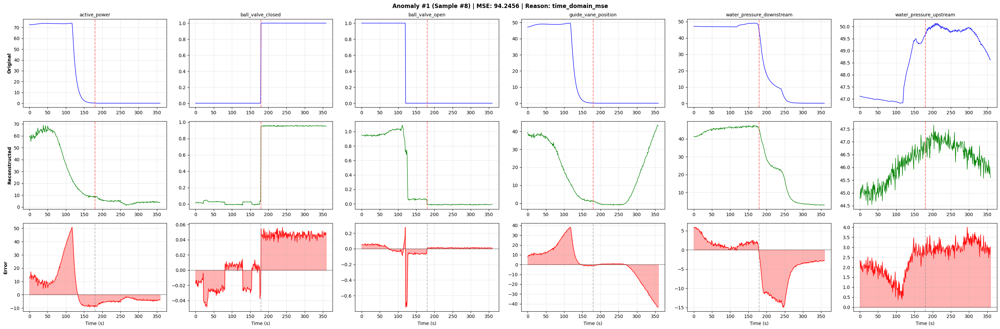

  Window 1: Sample 8, MSE=94.2456, Reason: time_domain_mse



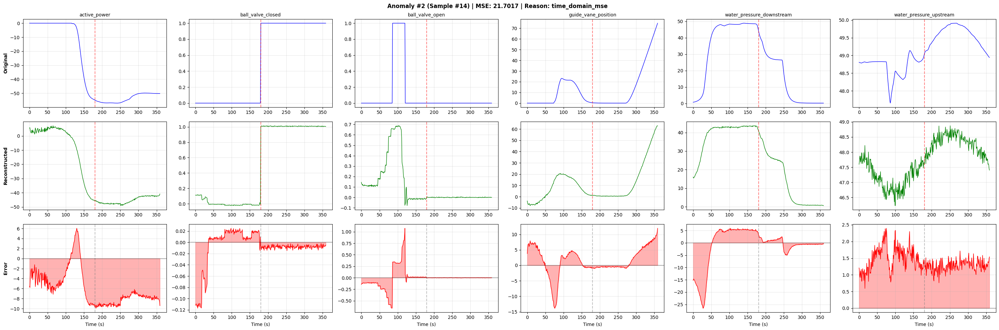

  Window 2: Sample 14, MSE=21.7017, Reason: time_domain_mse



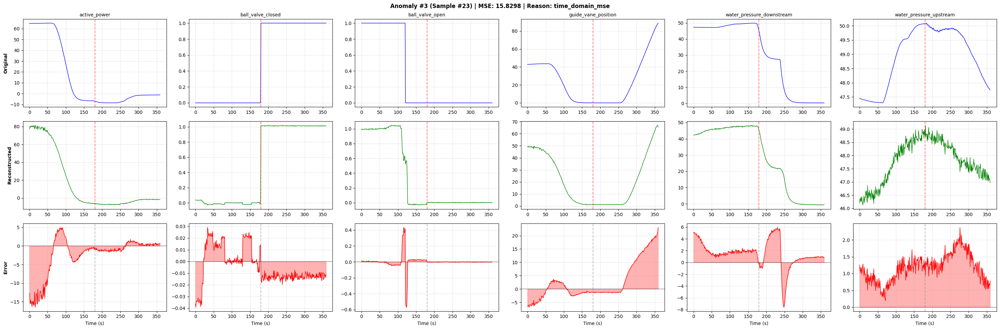

  Window 3: Sample 23, MSE=15.8298, Reason: time_domain_mse



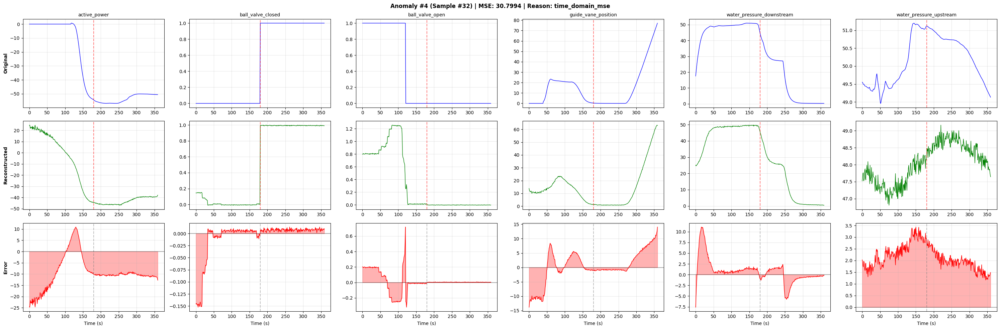

  Window 4: Sample 32, MSE=30.7994, Reason: time_domain_mse



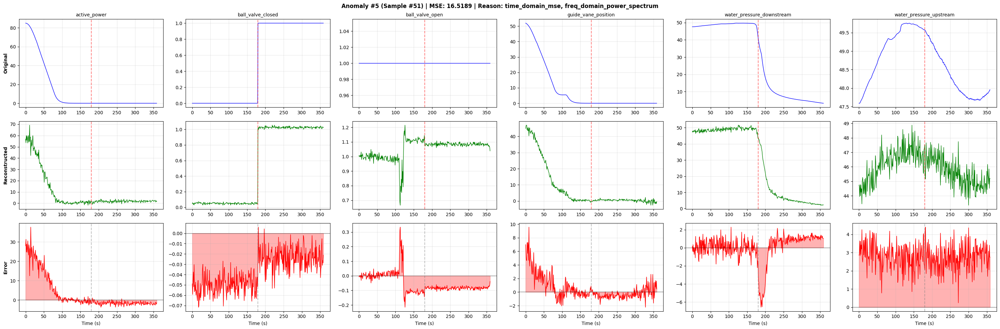

  Window 5: Sample 51, MSE=16.5189, Reason: time_domain_mse, freq_domain_power_spectrum


2. Normal vs Anomaly Comparison with Reconstruction (per signal):


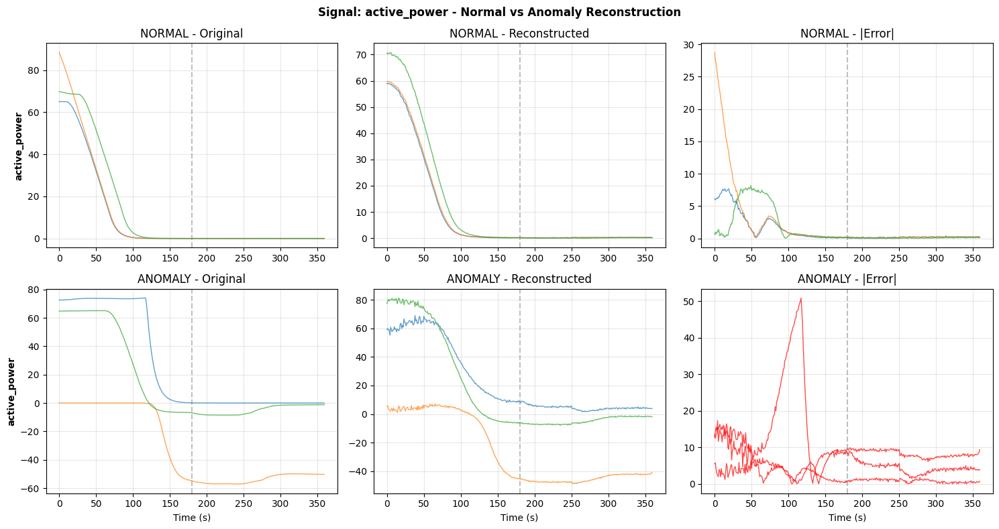

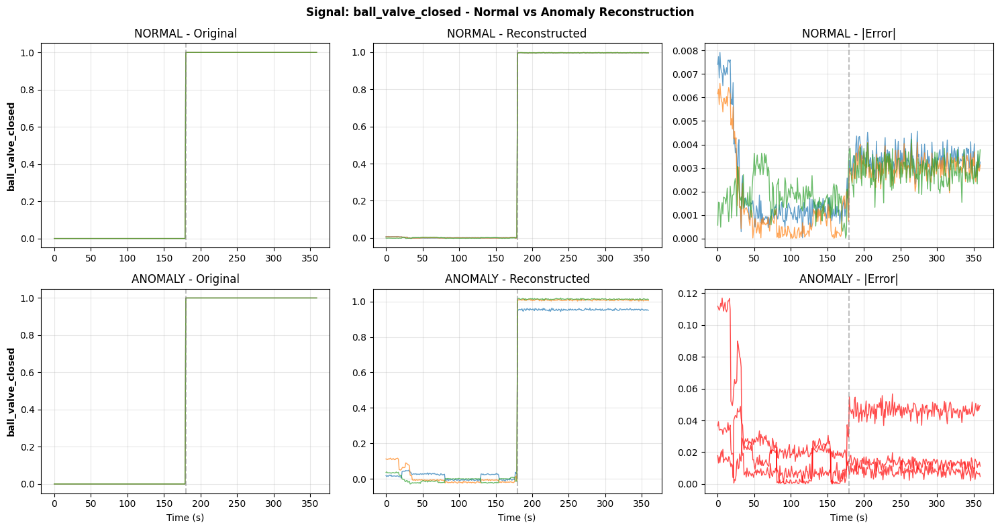

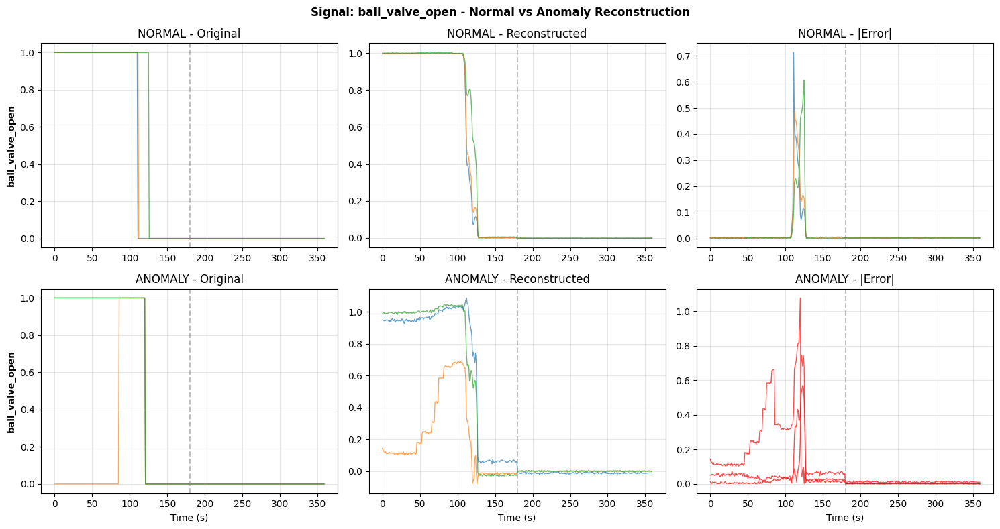

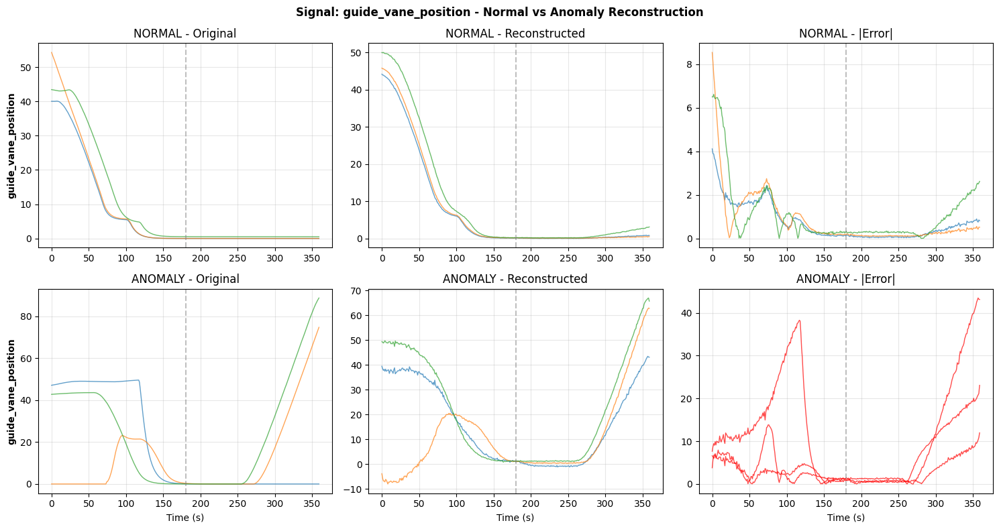

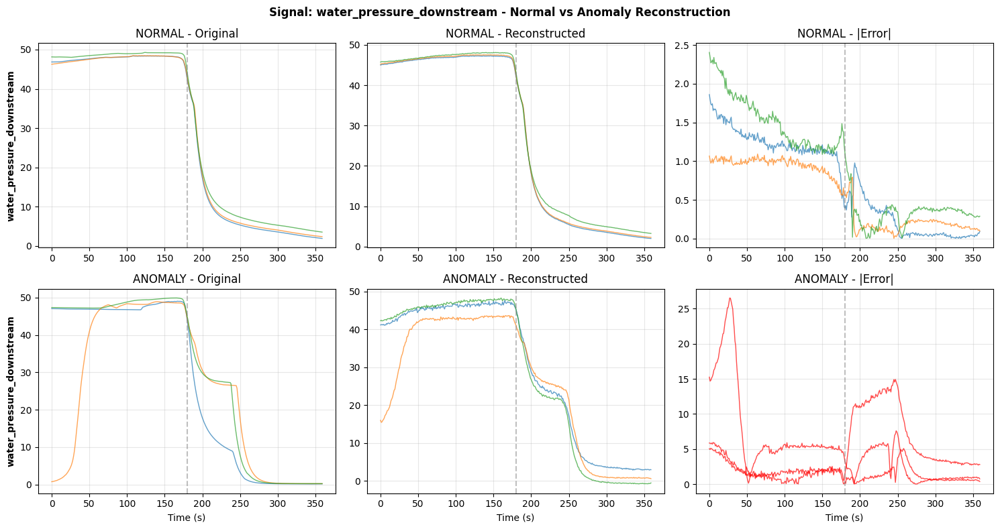

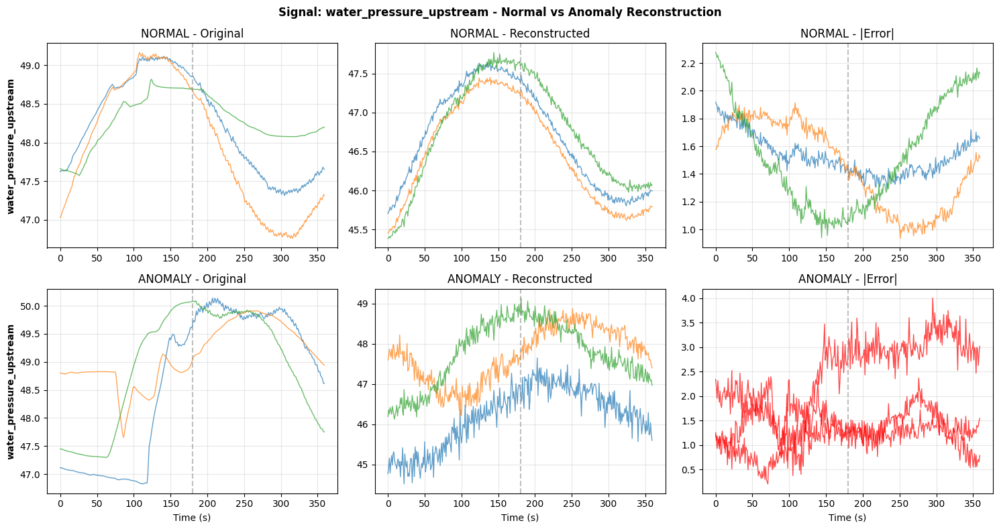


3. Single Window Deep Dive (best and worst reconstruction):

Best reconstructed window (lowest MSE):


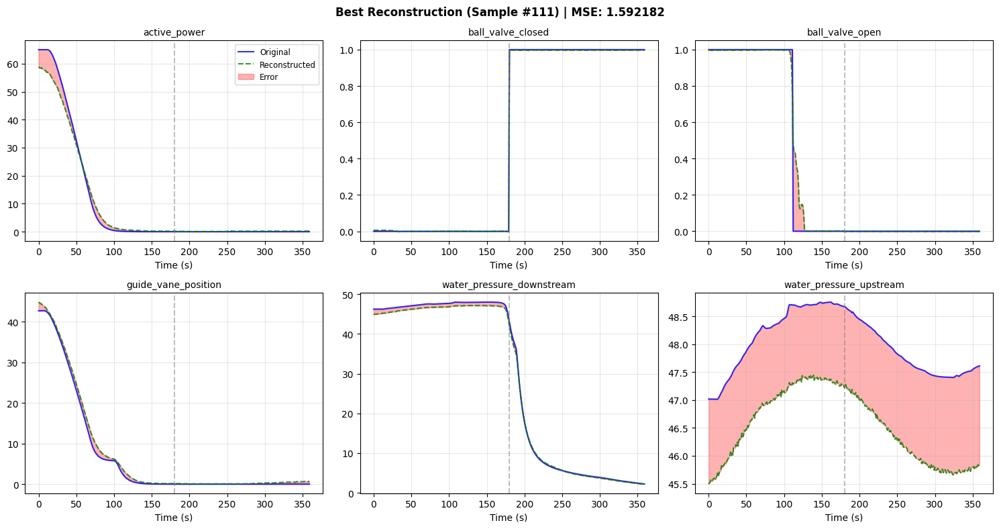


Worst reconstructed window (highest MSE):


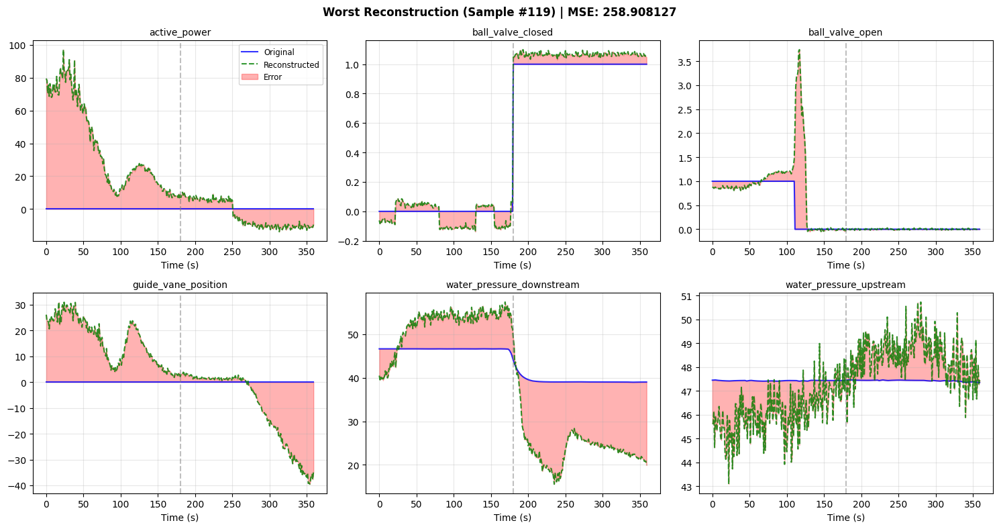

(258.90812738916947,
 array([[  0.84260744,   1.9050562 ,   3.3138366 ,  -2.1813667 ,
          -8.8327    ,   5.820833  ,   8.995319  , -11.475748  ,
          -3.761896  ,   8.450662  ,   2.6405494 ,   2.185945  ,
          -5.798513  ,   2.482396  ,   8.184831  ,   3.7588074 ,
          -0.6774776 ,  -3.6429172 ,  -4.7628593 ,  -9.368667  ,
          -3.8796873 ,  -3.2552266 ,   8.050145  ,  17.813877  ,
          -2.9464977 ,   5.236104  ,  -6.3470707 ,   2.1014252 ,
           2.5973105 ,  -1.9993154 ,   7.551824  , -10.454084  ,
          13.531411  ,  -6.025511  ,   4.871314  ,   4.964365  ,
          -1.7882494 ,  -3.3668826 ,  -3.8049233 ,  -1.9740138 ,
         -10.855511  ,   2.5084062 ,  -7.477921  ,   0.61786073,
           5.038117  ,   3.7868295 ,   9.372509  ,   7.2604346 ,
           5.931941  ,  -5.7013345 , -10.73209   ,   3.7976391 ,
          -3.3037915 ,   8.702207  ,   0.02597419,   5.748664  ,
          -4.2324014 ,  -1.2557596 ,  -4.1872625 ,   5.578365  ,
    

In [14]:
# ----------------------------------------------------------------------
# PLOT ANOMALOUS WINDOWS WITH RECONSTRUCTION
# Visualize original, reconstructed, and error for anomalies
# ----------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
import torch

def plot_anomalous_windows_with_reconstruction(X_test, flags, signals, model, scaler, max_plots=10):
    """
    Plot anomalous windows showing: Original, Reconstructed, and Error.
    
    Parameters:
    - X_test: Flattened test windows (N, 2160) where 2160 = 6 signals × 360 timesteps
    - flags: Dictionary containing 'is_anomaly' boolean array and 'reasons' list
    - signals: List of signal names (should be SIGNALS - 6 signals: 4 analog + 2 boolean)
    - model: Trained autoencoder model
    - scaler: StandardScaler used during training
    - max_plots: Maximum number of anomalous windows to plot
    """
    is_anomaly = flags['is_anomaly']
    reasons = flags['reasons']
    anomaly_indices = np.where(is_anomaly)[0]
    
    n_anomalies = len(anomaly_indices)
    print(f"Total anomalies detected: {n_anomalies}")
    
    if n_anomalies == 0:
        print("No anomalies to plot!")
        return
    
    # Limit plots
    n_to_plot = min(max_plots, n_anomalies)
    print(f"Plotting {n_to_plot} anomalous windows with reconstruction...")
    
    n_signals = len(signals)
    n_timesteps = X_test.shape[1] // n_signals  # Should be 360 for 6 signals
    time_axis = np.arange(n_timesteps)
    
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    # Get reconstructions for anomalous windows
    anomaly_windows = X_test[anomaly_indices[:n_to_plot]]
    anomaly_windows_scaled = scaler.transform(anomaly_windows)
    
    model.eval()
    with torch.no_grad():
        X_tensor = torch.FloatTensor(anomaly_windows_scaled).to(device)
        reconstructed_scaled, _ = model(X_tensor)
        reconstructed_scaled = reconstructed_scaled.cpu().numpy()
    
    # Inverse transform to original scale
    reconstructed = scaler.inverse_transform(reconstructed_scaled)
    
    for plot_idx, (anom_idx, orig_window, recon_window) in enumerate(
            zip(anomaly_indices[:n_to_plot], anomaly_windows, reconstructed)):
        
        # Unflatten: (2160,) -> (360, 6) for 6 signals (4 analog + 2 boolean)
        orig = orig_window.reshape(n_timesteps, n_signals)
        recon = recon_window.reshape(n_timesteps, n_signals)
        error = orig - recon
        
        # Get reason for this anomaly
        reason = reasons[anom_idx]
        reason_str = ', '.join(reason) if reason else 'unknown'
        
        # Compute MSE for this window
        mse = np.mean((orig_window - recon_window)**2)
        
        # Create figure: 3 rows (Original, Reconstructed, Error) × n_signals columns
        if n_signals == 1:
            fig, axes = plt.subplots(3, 1, figsize=(5, 10))
            axes = axes.reshape(3, 1)  # Ensure 2D for consistent indexing
        else:
            # For 6 signals: 3 rows × 6 columns
            fig, axes = plt.subplots(3, n_signals, figsize=(5*n_signals, 10))
        
        for i, sig in enumerate(signals):
            # Original
            ax = axes[0, i]
            ax.plot(time_axis, orig[:, i], 'b-', linewidth=1, label='Original')
            ax.set_title(f'{sig}', fontsize=10)
            if i == 0:
                ax.set_ylabel('Original', fontsize=10, fontweight='bold')
            ax.axvline(x=n_timesteps//2, color='red', linestyle='--', alpha=0.5)
            ax.grid(True, alpha=0.3)
            
            # Reconstructed
            ax = axes[1, i]
            ax.plot(time_axis, recon[:, i], 'g-', linewidth=1, label='Reconstructed')
            if i == 0:
                ax.set_ylabel('Reconstructed', fontsize=10, fontweight='bold')
            ax.axvline(x=n_timesteps//2, color='red', linestyle='--', alpha=0.5)
            ax.grid(True, alpha=0.3)
            
            # Error (Original - Reconstructed)
            ax = axes[2, i]
            ax.plot(time_axis, error[:, i], 'r-', linewidth=1, label='Error')
            ax.fill_between(time_axis, 0, error[:, i], alpha=0.3, color='red')
            if i == 0:
                ax.set_ylabel('Error', fontsize=10, fontweight='bold')
            ax.set_xlabel('Time (s)')
            ax.axvline(x=n_timesteps//2, color='gray', linestyle='--', alpha=0.5)
            ax.axhline(y=0, color='black', linestyle='-', alpha=0.3)
            ax.grid(True, alpha=0.3)
        
        plt.suptitle(f'Anomaly #{plot_idx + 1} (Sample #{anom_idx}) | MSE: {mse:.4f} | Reason: {reason_str}', 
                     fontsize=12, fontweight='bold')
        plt.tight_layout()
        plt.show()
        print(f"  Window {plot_idx + 1}: Sample {anom_idx}, MSE={mse:.4f}, Reason: {reason_str}")
        print()


def plot_anomaly_comparison_with_reconstruction(X_test, flags, signals, model, scaler, n_normal=3, n_anomaly=3):
    """
    Compare reconstruction errors: Normal vs Anomalous windows.
    Shows Original, Reconstructed, and highlights where errors are highest.
    """
    is_anomaly = flags['is_anomaly']
    
    normal_indices = np.where(~is_anomaly)[0]
    anomaly_indices = np.where(is_anomaly)[0]
    
    n_signals = len(signals)
    n_timesteps = X_test.shape[1] // n_signals
    time_axis = np.arange(n_timesteps)
    
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    # Select random samples
    n_normal_plot = min(n_normal, len(normal_indices))
    n_anomaly_plot = min(n_anomaly, len(anomaly_indices))
    
    if n_normal_plot == 0 or n_anomaly_plot == 0:
        print("Not enough samples for comparison!")
        return
    
    normal_samples = np.random.choice(normal_indices, n_normal_plot, replace=False)
    anomaly_samples = anomaly_indices[:n_anomaly_plot]
    
    # Get reconstructions for selected windows
    selected_indices = np.concatenate([normal_samples, anomaly_samples])
    selected_windows = X_test[selected_indices]
    selected_scaled = scaler.transform(selected_windows)
    
    model.eval()
    with torch.no_grad():
        X_tensor = torch.FloatTensor(selected_scaled).to(device)
        reconstructed_scaled, _ = model(X_tensor)
        reconstructed_scaled = reconstructed_scaled.cpu().numpy()
    
    reconstructed = scaler.inverse_transform(reconstructed_scaled)
    
    # Split back
    normal_orig = selected_windows[:n_normal_plot]
    normal_recon = reconstructed[:n_normal_plot]
    anomaly_orig = selected_windows[n_normal_plot:]
    anomaly_recon = reconstructed[n_normal_plot:]
    
    for sig_idx, sig in enumerate(signals):
        fig, axes = plt.subplots(2, 3, figsize=(15, 8))
        
        # --- NORMAL SAMPLES ---
        # Original
        ax = axes[0, 0]
        for i, orig in enumerate(normal_orig):
            window = orig.reshape(n_timesteps, n_signals)
            ax.plot(time_axis, window[:, sig_idx], alpha=0.7, linewidth=1)
        ax.set_title(f'NORMAL - Original')
        ax.set_ylabel(sig, fontsize=10, fontweight='bold')
        ax.axvline(x=n_timesteps//2, color='gray', linestyle='--', alpha=0.5)
        ax.grid(True, alpha=0.3)
        
        # Reconstructed
        ax = axes[0, 1]
        for i, recon in enumerate(normal_recon):
            window = recon.reshape(n_timesteps, n_signals)
            ax.plot(time_axis, window[:, sig_idx], alpha=0.7, linewidth=1)
        ax.set_title(f'NORMAL - Reconstructed')
        ax.axvline(x=n_timesteps//2, color='gray', linestyle='--', alpha=0.5)
        ax.grid(True, alpha=0.3)
        
        # Error
        ax = axes[0, 2]
        for orig, recon in zip(normal_orig, normal_recon):
            orig_w = orig.reshape(n_timesteps, n_signals)
            recon_w = recon.reshape(n_timesteps, n_signals)
            error = np.abs(orig_w[:, sig_idx] - recon_w[:, sig_idx])
            ax.plot(time_axis, error, alpha=0.7, linewidth=1)
        ax.set_title(f'NORMAL - |Error|')
        ax.axvline(x=n_timesteps//2, color='gray', linestyle='--', alpha=0.5)
        ax.grid(True, alpha=0.3)
        
        # --- ANOMALY SAMPLES ---
        # Original
        ax = axes[1, 0]
        for i, orig in enumerate(anomaly_orig):
            window = orig.reshape(n_timesteps, n_signals)
            ax.plot(time_axis, window[:, sig_idx], alpha=0.7, linewidth=1)
        ax.set_title(f'ANOMALY - Original')
        ax.set_ylabel(sig, fontsize=10, fontweight='bold')
        ax.set_xlabel('Time (s)')
        ax.axvline(x=n_timesteps//2, color='gray', linestyle='--', alpha=0.5)
        ax.grid(True, alpha=0.3)
        
        # Reconstructed
        ax = axes[1, 1]
        for i, recon in enumerate(anomaly_recon):
            window = recon.reshape(n_timesteps, n_signals)
            ax.plot(time_axis, window[:, sig_idx], alpha=0.7, linewidth=1)
        ax.set_title(f'ANOMALY - Reconstructed')
        ax.set_xlabel('Time (s)')
        ax.axvline(x=n_timesteps//2, color='gray', linestyle='--', alpha=0.5)
        ax.grid(True, alpha=0.3)
        
        # Error
        ax = axes[1, 2]
        for orig, recon in zip(anomaly_orig, anomaly_recon):
            orig_w = orig.reshape(n_timesteps, n_signals)
            recon_w = recon.reshape(n_timesteps, n_signals)
            error = np.abs(orig_w[:, sig_idx] - recon_w[:, sig_idx])
            ax.plot(time_axis, error, alpha=0.7, linewidth=1, color='red')
        ax.set_title(f'ANOMALY - |Error|')
        ax.set_xlabel('Time (s)')
        ax.axvline(x=n_timesteps//2, color='gray', linestyle='--', alpha=0.5)
        ax.grid(True, alpha=0.3)
        
        plt.suptitle(f'Signal: {sig} - Normal vs Anomaly Reconstruction', fontsize=12, fontweight='bold')
        plt.tight_layout()
        plt.show()


def plot_single_window_reconstruction(X_test, idx, signals, model, scaler, title="Window"):
    """
    Plot a single window with its reconstruction.
    Shows Original (blue), Reconstructed (green), and shaded Error.
    """
    n_signals = len(signals)
    n_timesteps = X_test.shape[1] // n_signals
    time_axis = np.arange(n_timesteps)
    
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    # Get reconstruction
    window = X_test[idx:idx+1]
    window_scaled = scaler.transform(window)
    
    model.eval()
    with torch.no_grad():
        X_tensor = torch.FloatTensor(window_scaled).to(device)
        reconstructed_scaled, latent = model(X_tensor)
        reconstructed_scaled = reconstructed_scaled.cpu().numpy()
    
    reconstructed = scaler.inverse_transform(reconstructed_scaled)
    
    # Unflatten
    orig = window[0].reshape(n_timesteps, n_signals)
    recon = reconstructed[0].reshape(n_timesteps, n_signals)
    
    # Compute MSE
    mse = np.mean((window[0] - reconstructed[0])**2)
    
    # Create subplot grid based on number of signals
    n_sigs = len(signals)
    if n_sigs <= 2:
        fig, axes = plt.subplots(1, n_sigs, figsize=(5*n_sigs, 4))
        if n_sigs == 1:
            axes = [axes]
        else:
            axes = axes.flatten()
    elif n_sigs <= 4:
        fig, axes = plt.subplots(2, 2, figsize=(10, 8))
        axes = axes.flatten()
    else:
        # For 6 signals, use 2 rows × 3 columns
        fig, axes = plt.subplots(2, 3, figsize=(15, 8))
        axes = axes.flatten()
    
    for i, sig in enumerate(signals):
        ax = axes[i]
        ax.plot(time_axis, orig[:, i], 'b-', linewidth=1.5, label='Original', alpha=0.8)
        ax.plot(time_axis, recon[:, i], 'g--', linewidth=1.5, label='Reconstructed', alpha=0.8)
        ax.fill_between(time_axis, orig[:, i], recon[:, i], alpha=0.3, color='red', label='Error')
        ax.set_title(sig, fontsize=10)
        ax.set_xlabel('Time (s)')
        ax.axvline(x=n_timesteps//2, color='gray', linestyle='--', alpha=0.5)
        ax.grid(True, alpha=0.3)
        if i == 0:
            ax.legend(fontsize='small')
    
    plt.suptitle(f'{title} (Sample #{idx}) | MSE: {mse:.6f}', fontsize=12, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return mse, latent.cpu().numpy()


# ==============================================================================
# RUN VISUALIZATION
# ==============================================================================
print("="*60)
print("PLOTTING ANOMALOUS WINDOWS WITH RECONSTRUCTION")
print("="*60)

# Use SIGNALS (6 signals: 4 analog + 2 boolean) since the model trains on all signals
# SIGNALS should be defined in Cell 21, but we'll define it here if needed
try:
    SIGNALS
except NameError:
    SIGNALS = ['active_power', 'ball_valve_closed', 'ball_valve_open',
               'guide_vane_position', 'water_pressure_downstream', 'water_pressure_upstream']
    print(f"Note: Using SIGNALS = {SIGNALS}")

# Plot individual anomalous windows with reconstruction (up to 5)
print("\n1. Individual Anomalous Windows (Original vs Reconstructed):")
plot_anomalous_windows_with_reconstruction(
    X_test_combined, flags_combined, SIGNALS, 
    model_combined, scaler_combined, max_plots=5
)

# Compare normal vs anomaly
print("\n2. Normal vs Anomaly Comparison with Reconstruction (per signal):")
plot_anomaly_comparison_with_reconstruction(
    X_test_combined, flags_combined, SIGNALS, 
    model_combined, scaler_combined, n_normal=3, n_anomaly=3
)

print("\n3. Single Window Deep Dive (best and worst reconstruction):")
# Find best and worst reconstruction errors
X_test_scaled = scaler_combined.transform(X_test_combined)
model_combined.eval()
with torch.no_grad():
    recon_scaled, _ = model_combined(torch.FloatTensor(X_test_scaled).to('cuda' if torch.cuda.is_available() else 'cpu'))
    recon_scaled = recon_scaled.cpu().numpy()
mse_all = np.mean((X_test_scaled - recon_scaled)**2, axis=1)

# Best reconstruction (lowest MSE)
best_idx = np.argmin(mse_all)
print(f"\nBest reconstructed window (lowest MSE):")
plot_single_window_reconstruction(X_test_combined, best_idx, SIGNALS, model_combined, scaler_combined, 
                                   title="Best Reconstruction")

# Worst reconstruction (highest MSE) - likely an anomaly
worst_idx = np.argmax(mse_all)
print(f"\nWorst reconstructed window (highest MSE):")
plot_single_window_reconstruction(X_test_combined, worst_idx, SIGNALS, model_combined, scaler_combined,
                                   title="Worst Reconstruction")

## Synthetic anomaly generation for autoencoder testing
### Injection into the data

ANOMALY × SIGNAL COMBINATION MATRIX

Total combinations: 32
  - Anomaly types: 8
  - Injectable signals: 4
  - Combinations: 8 × 4 = 32

ANOMALY × SIGNAL MATRIX

Matrix (1 = will be injected, 0 = not applicable):
                    active_power  guide_vane_position  water_pressure_downstream  water_pressure_upstream
spikes                         1                    1                          1                        1
level_shift                    1                    1                          1                        1
linear_drift                   1                    1                          1                        1
variance_change                1                    1                          1                        1
sinusoidal                     1                    1                          1                        1
delayed_closure                1                    1                          1                        1
water_hammer_spike             1             

Loading training windows:   0%|          | 0/5 [00:00<?, ?it/s]

/var/folders/46/y0431pbj0sl3y6mcthks8j1r0000gn/T/ipykernel_87637/39036977.py:261: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='ffill').fillna(method='bfill').fillna(0)
/var/folders/46/y0431pbj0sl3y6mcthks8j1r0000gn/T/ipykernel_87637/39036977.py:261: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='ffill').fillna(method='bfill').fillna(0)
/var/folders/46/y0431pbj0sl3y6mcthks8j1r0000gn/T/ipykernel_87637/39036977.py:261: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='ffill').fillna(method='bfill').fillna(0)
/var/folders/46/y0431pbj0sl3y6mcthks8j1r0000gn/T/ipykernel_87637/39036977.py:261: FutureWarning: DataFrame.fillna with 'method' is deprecated and wi

   Total windows: 1564
   Shape: (1564, 2160)

   Windows per asset:
     Mapragg_MG1_training: 317
     Mapragg_MG2_training: 411
     Mapragg_MG3_training: 264
     Sarelli_MG1_training: 271
     Sarelli_MG2_training: 301

2. Selecting windows for FULL MATRIX injection with minimum guarantees...
   Phase 1: Ensuring each of 32 combinations appears at least once...

   Phase 2: Ensuring at least 5 anomalies per signal...

   Phase 3: Adding 280 more anomalies (up to 20% ratio)...

   Total anomalies to inject: 312
   Target ratio: 20% (312 windows)
   Actual ratio: 19.9%

   Anomalies per signal (minimum 5 required):
     ✅ active_power                  :  77 (meets minimum)
     ✅ guide_vane_position           :  80 (meets minimum)
     ✅ water_pressure_downstream     :  76 (meets minimum)
     ✅ water_pressure_upstream       :  79 (meets minimum)

   Anomaly type representation per signal:
     ✅ active_power                  : 8/8 types
     ✅ guide_vane_position           : 8/8 ty

Injecting:   0%|          | 0/312 [00:00<?, ?it/s]


4. Creating ground truth labels...
   Normal windows: 1252
   Anomalous windows: 312

5. Saving to 'anomalies_added' folder...
   Saved to: anomalies_added/anomalous_training_windows.pkl
   Metadata CSV: anomalies_added/anomaly_metadata.csv

ANOMALY GENERATION COMPLETE

6. Generating visualizations...


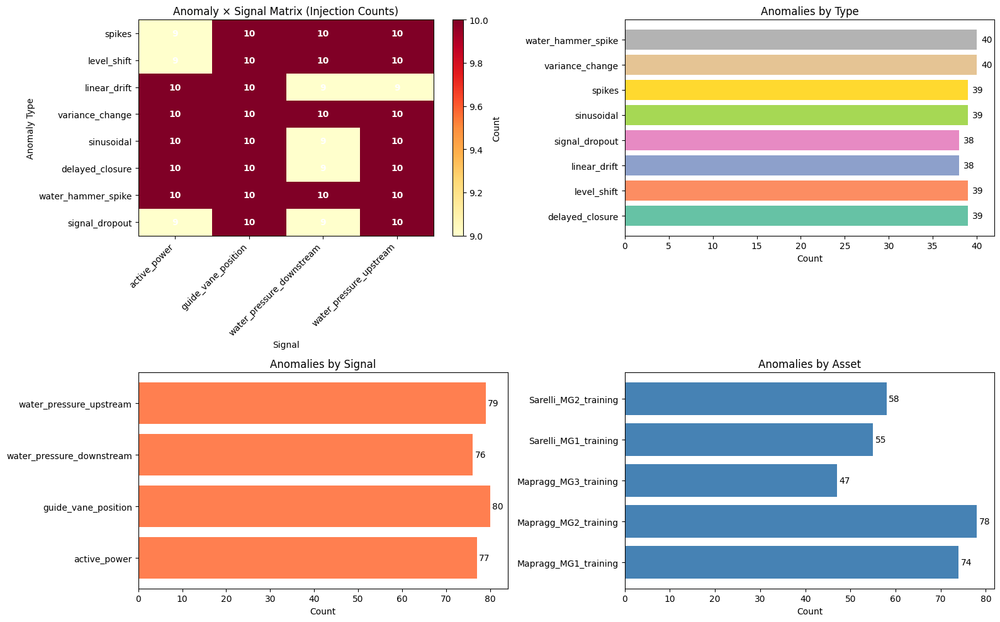


Plotting example anomalies (one example per combination)...
NOTE: Each row shows a DIFFERENT window with its ONE anomaly
Total combinations: 32


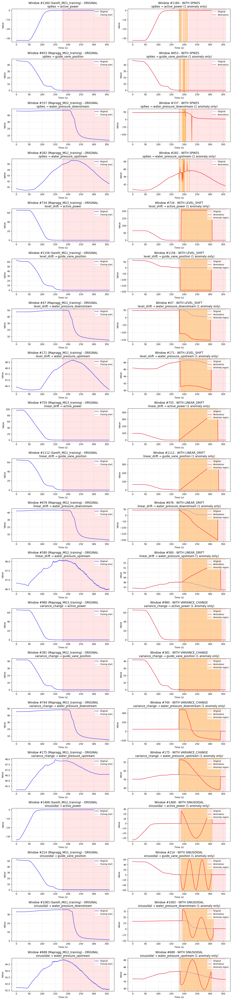


Plotting anomaly position distribution...


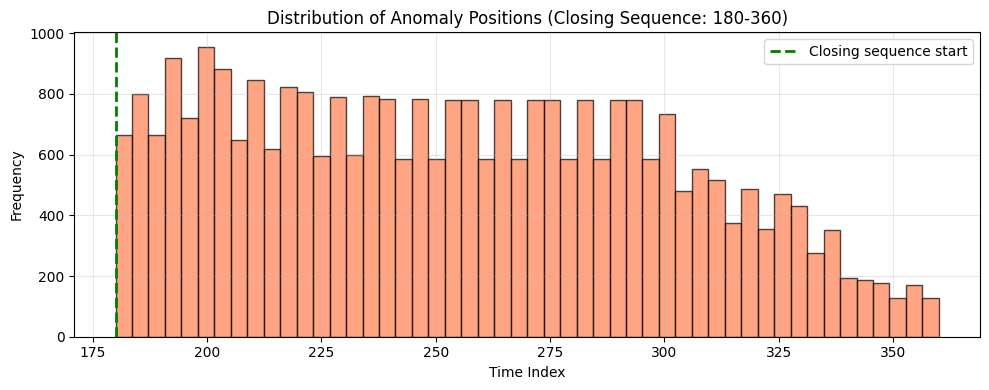


✅ All visualizations saved to 'anomalies_added' folder

FINAL VERIFICATION SUMMARY
Total windows in dataset: 1564
Windows WITH anomaly: 312 (19.9%)
Windows WITHOUT anomaly: 1252 (80.1%)

Anomalies injected: 312
Unique windows affected: 312
✅ CONFIRMED: Each anomalous window has EXACTLY ONE anomaly

Anomalies per signal (across all windows):
  active_power: 77
  guide_vane_position: 80
  water_pressure_downstream: 76
  water_pressure_upstream: 79

Matrix summary (anomaly_type × signal):

spikes:
  ✅ active_power                  :   9
  ✅ guide_vane_position           :  10
  ✅ water_pressure_downstream     :  10
  ✅ water_pressure_upstream       :  10

level_shift:
  ✅ active_power                  :   9
  ✅ guide_vane_position           :  10
  ✅ water_pressure_downstream     :  10
  ✅ water_pressure_upstream       :  10

linear_drift:
  ✅ active_power                  :  10
  ✅ guide_vane_position           :  10
  ✅ water_pressure_downstream     :   9
  ✅ water_pressure_upstream   

In [15]:
# ==============================================================================
# SYNTHETIC ANOMALY GENERATION FOR AUTOENCODER TESTING
# ==============================================================================
# This cell generates training windows with injected anomalies for testing
# the autoencoder's anomaly detection capabilities.
#
# Key features:
# - Loads training windows WITH asset tracking
# - Injects ~20% anomalies per asset
# - Each anomaly type appears at least once per asset
# - Only modifies: active_power, guide_vane_position, water_pressure_downstream/upstream
# - Does NOT touch: ball_valve_open, ball_valve_closed
# - Stores in 'anomalies_added' folder for later testing
# ==============================================================================

import os
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

# Import anomaly injection functions (reload to get latest changes)
import importlib
import generate_anomalies_template
importlib.reload(generate_anomalies_template)

from generate_anomalies_template import (
    inject_closing_spikes,
    inject_closing_level_shift,
    inject_closing_linear_drift,
    inject_closing_variance_change,
    inject_closing_sinusoidal,
    inject_closing_delayed_closure,
    inject_closing_water_hammer_spike,
    inject_closing_signal_dropout,
    # inject_closing_time_warp  # Removed - time_warp anomaly disabled
)

# ==============================================================================
# CONFIGURATION
# ==============================================================================
TRANSITIONS_DIR = 'data_transitions'
OUTPUT_DIR = 'anomalies_added'
os.makedirs(OUTPUT_DIR, exist_ok=True)

HALF_WINDOW = 180
ANOMALY_RATIO = 0.20  # 20% of windows will have anomalies

# Signals we CAN inject anomalies into (excluding ball_valve_*)
INJECTABLE_SIGNALS = ['active_power', 'guide_vane_position', 
                      'water_pressure_downstream', 'water_pressure_upstream']

# All signals (for window extraction)
ALL_SIGNALS = ['active_power', 'ball_valve_closed', 'ball_valve_open',
               'guide_vane_position', 'water_pressure_downstream', 'water_pressure_upstream']

# Signal index mapping (for combined windows of shape 2160 = 6 signals x 360)
SIGNAL_INDICES = {sig: i for i, sig in enumerate(ALL_SIGNALS)}

# ==============================================================================
# ANOMALY TYPE → SIGNAL MAPPING (FULL MATRIX: All Combinations)
# ==============================================================================
# NEW APPROACH: Inject each anomaly type into each injectable signal
# This creates a full matrix: 5 anomaly types × 4 signals = 20 combinations
# Each window will have at most ONE anomaly (one combination per window)

# All anomaly types (time_warp removed as requested)
# Now includes: original 4 + 4 new types = 8 total
ANOMALY_TYPES = [
    'spikes', 
    'level_shift', 
    'linear_drift', 
    'variance_change',
    'sinusoidal',           # NEW: Oscillatory behavior
    'delayed_closure',      # NEW: Time shift/roll
    'water_hammer_spike',   # NEW: Peak amplification
    'signal_dropout'        # NEW: Sensor failure
]

# Injectable signals (exclude boolean signals)
INJECTABLE_SIGNALS = ['active_power', 'guide_vane_position', 
                      'water_pressure_downstream', 'water_pressure_upstream']

# Create all combinations: (anomaly_type, signal) pairs
ANOMALY_SIGNAL_COMBINATIONS = [(at, sig) for at in ANOMALY_TYPES for sig in INJECTABLE_SIGNALS]

print("="*70)
print("ANOMALY × SIGNAL COMBINATION MATRIX")
print("="*70)
print(f"\nTotal combinations: {len(ANOMALY_SIGNAL_COMBINATIONS)}")
print(f"  - Anomaly types: {len(ANOMALY_TYPES)}")
print(f"  - Injectable signals: {len(INJECTABLE_SIGNALS)}")
print(f"  - Combinations: {len(ANOMALY_TYPES)} × {len(INJECTABLE_SIGNALS)} = {len(ANOMALY_SIGNAL_COMBINATIONS)}")

# Create matrix for visualization
import pandas as pd
matrix_data = np.zeros((len(ANOMALY_TYPES), len(INJECTABLE_SIGNALS)), dtype=int)
for i, at in enumerate(ANOMALY_TYPES):
    for j, sig in enumerate(INJECTABLE_SIGNALS):
        matrix_data[i, j] = 1  # Mark that this combination exists

df_matrix = pd.DataFrame(matrix_data, index=ANOMALY_TYPES, columns=INJECTABLE_SIGNALS)
print("\n" + "="*70)
print("ANOMALY × SIGNAL MATRIX")
print("="*70)
print("\nMatrix (1 = will be injected, 0 = not applicable):")
print(df_matrix.to_string())
print("\nLegend:")
print("  - Each cell represents one (anomaly_type, signal) combination")
print("  - All combinations will be injected (ensuring coverage)")
print("  - Each window receives at most ONE anomaly")

# ==============================================================================
# ANOMALY CONFIGURATION - INCREASED MAGNITUDES FOR BETTER DETECTION
# ==============================================================================
# PARAMETER GUIDE - How to adjust anomaly sizes:
#
# 1. SPIKES:
#    - n_spikes: Number of spikes to inject (higher = more spikes)
#    - magnitude_range: (min, max) spike amplitude in standard deviations
#                      Higher values = larger spikes
#    - transition_center: Center point for spike placement (180 = transition start)
#    - spread: How spread out spikes are (smaller = more clustered)
#
# 2. LEVEL_SHIFT:
#    - segment_length: Duration of the shift in timesteps (longer = more visible)
#    - shift_factor: Magnitude of shift in standard deviations (higher = larger shift)
#    - transition_center: Center point for shift placement
#    - spread: Random variation in placement
#
# 3. LINEAR_DRIFT:
#    - segment_length: Duration of drift in timesteps (longer = more visible)
#    - drift_std_factors: (min, max) drift amplitude in standard deviations
#                        Higher values = steeper drift
#    - transition_center: Center point for drift placement
#    - spread: Random variation in placement
#
# 4. VARIANCE_CHANGE:
#    - segment_length: Duration of variance change in timesteps
#    - variance_factor_range: (min, max) multiplier for variance
#                             >1 = increased variance, <1 = decreased variance
#                             Higher max = more dramatic change
#    - transition_center: Center point for variance change placement
#    - spread: Random variation in placement
#
# NOTE: All magnitudes are in "standard deviation units" since data is standardized
# ==============================================================================

ANOMALY_CONFIGS = {
    'spikes': {
        'func': inject_closing_spikes,
        'params': {
            'n_spikes': 10,                    # INCREASED: More spikes (was 6)
            'magnitude_range': (15.0, 25.0),   # INCREASED: Much larger spikes (was 8.0-15.0)
            'transition_center': 200,
            'spread': 12,
        },
    },
    'level_shift': {
        'func': inject_closing_level_shift,
        'params': {
            'segment_length': 120,             # INCREASED: Longer shift (was 80)
            'shift_factor': 8.0,               # INCREASED: Much larger shift (was 4.0)
            'transition_center': 210,
            'spread': 18,
        },
    },
    'linear_drift': {
        'func': inject_closing_linear_drift,
        'params': {
            'segment_length': 150,             # INCREASED: Longer drift (was 120)
            'drift_std_factors': (6.0, 15.0),  # INCREASED: Steeper drift (was 3.0-8.0)
            'transition_center': 210,
            'spread': 18,
        },
    },
    'variance_change': {
        'func': inject_closing_variance_change,
        'params': {
            'segment_length': 160,             # INCREASED: Longer segment (was 140)
            'variance_factor_range': (10.0, 25.0),  # INCREASED: More dramatic variance change (was 6.0-15.0)
            'transition_center': 210,
            'spread': 18,
        },
    },
    'sinusoidal': {
        'func': inject_closing_sinusoidal,
        'params': {
            'segment_length': 120,
            'amplitude_range': (2.0, 5.0),     # Amplitude in std units
            'frequency_range': (0.5, 3.0),    # 0.5 to 3 cycles per segment
            'transition_center': 200,
            'spread': 20.0,
        },
    },
    'delayed_closure': {
        'func': inject_closing_delayed_closure,
        'params': {
            'delay_steps': 30,                 # 30 timesteps delay
            'transition_center': 200,
            'spread': 20.0,
        },
    },
    'water_hammer_spike': {
        'func': inject_closing_water_hammer_spike,
        'params': {
            'intensity_range': (1.3, 2.0),  # 30-100% amplification
            'spike_window': 20,
            'transition_center': 200,
            'spread': 20.0,
        },
    },
    'signal_dropout': {
        'func': inject_closing_signal_dropout,
        'params': {
            'num_drops': 3,                    # 3 dropout events
            'dropout_duration': 2,              # 2 timesteps per dropout
            'dropout_value': 0.0,               # Drop to 0
            'transition_center': 200,
            'spread': 20.0,
        },
    },
    # time_warp removed as requested
}

# ==============================================================================
# HELPER: Load Windows WITH Asset Tracking
# ==============================================================================
def load_windows_with_asset_tracking(split='training'):
    """
    Load combined windows (shape: N x 2160) with asset metadata.
    
    Returns:
        windows: np.ndarray of shape (N, 2160)
        asset_labels: list of asset names for each window
        window_indices: list of (asset, local_idx) tuples
    """
    windows = []
    asset_labels = []
    window_indices = []
    
    files = sorted([f for f in os.listdir(TRANSITIONS_DIR) 
                    if f.endswith('_processed.pkl') and split in f])
    
    print(f"Found {len(files)} {split} files")
    
    for f in tqdm(files, desc=f"Loading {split} windows"):
        base = f.replace('_processed.pkl', '')
        asset_name = base.replace('_real_measurements', '')
        
        processed_path = os.path.join(TRANSITIONS_DIR, f)
        transitions_path = os.path.join(TRANSITIONS_DIR, f"{base}_transitions.pkl")
        
        if not os.path.exists(transitions_path):
            continue
            
        # Load data
        df = pd.read_pickle(processed_path)
        df = df.reindex(columns=ALL_SIGNALS)
        df = df.fillna(method='ffill').fillna(method='bfill').fillna(0)
        
        df_trans = pd.read_pickle(transitions_path)
        if df_trans.empty:
            continue
        
        # Group transitions within 180s
        df_trans = df_trans.sort_values('timestamp')
        grouped_events = []
        current_group = [df_trans.iloc[0]]
        
        for i in range(1, len(df_trans)):
            curr = df_trans.iloc[i]
            prev = current_group[-1]
            diff = (curr['timestamp'] - prev['timestamp']).total_seconds()
            if diff < 180:
                current_group.append(curr)
            else:
                grouped_events.append(current_group)
                current_group = [curr]
        grouped_events.append(current_group)
        
        # Filter for CLOSING transitions only
        def is_closing(group):
            votes_opening, votes_closing = 0, 0
            for row in group:
                sig, v_from, v_to = row['signal'], row['from_value'], row['to_value']
                if sig == 'ball_valve_open':
                    if v_from == 0 and v_to == 1: votes_opening += 1
                    elif v_from == 1 and v_to == 0: votes_closing += 1
                elif sig == 'ball_valve_closed':
                    if v_from == 0 and v_to == 1: votes_closing += 1
                    elif v_from == 1 and v_to == 0: votes_opening += 1
            return votes_closing > votes_opening
        
        local_idx = 0
        for group in grouped_events:
            if not is_closing(group):
                continue
                
            min_ts = group[0]['timestamp']
            max_ts = group[-1]['timestamp']
            center_ts = (min_ts + (max_ts - min_ts) / 2).round('1s')
            
            try:
                idx = df.index.searchsorted(center_ts)
                if idx == 0:
                    center_idx = 0
                elif idx == len(df):
                    center_idx = len(df) - 1
                else:
                    ts_prev, ts_curr = df.index[idx-1], df.index[idx]
                    center_idx = idx if abs((ts_curr - center_ts).total_seconds()) < abs((ts_prev - center_ts).total_seconds()) else idx - 1
                
                start_idx = center_idx - HALF_WINDOW
                end_idx = center_idx + HALF_WINDOW
                
                if start_idx < 0 or end_idx > len(df):
                    continue
                
                window_df = df.iloc[start_idx:end_idx][ALL_SIGNALS]
                if window_df.shape[0] == 2 * HALF_WINDOW:
                    # Flatten: (360, 6) → (2160,)
                    windows.append(window_df.values.flatten())
                    asset_labels.append(asset_name)
                    window_indices.append((asset_name, local_idx))
                    local_idx += 1
            except Exception:
                continue
    
    return np.array(windows), asset_labels, window_indices

# ==============================================================================
# HELPER: Extract/Insert Signal Slice from Combined Window
# ==============================================================================
def get_signal_slice(window_combined, signal_name):
    """Extract a single signal (360 points) from combined window (2160 points).
    
    Data is stored in row-major order: [sig0_t0, sig1_t0, ..., sig5_t0, sig0_t1, ...]
    So signal i is at indices [i, i+6, i+12, ...] = every 6th element starting at i.
    """
    idx = SIGNAL_INDICES[signal_name]
    n_signals = len(ALL_SIGNALS)  # 6
    # Reshape to (360 timesteps, 6 signals) and extract column
    reshaped = window_combined.reshape(-1, n_signals)
    return reshaped[:, idx].copy()

def set_signal_slice(window_combined, signal_name, signal_data):
    """Replace a single signal in combined window.
    
    Data is stored in row-major order: [sig0_t0, sig1_t0, ..., sig5_t0, sig0_t1, ...]
    """
    idx = SIGNAL_INDICES[signal_name]
    n_signals = len(ALL_SIGNALS)  # 6
    # Reshape to (360 timesteps, 6 signals), modify column, flatten back
    reshaped = window_combined.reshape(-1, n_signals)
    reshaped[:, idx] = signal_data
    # Note: reshaping creates a view, so the original array is modified

# ==============================================================================
# MAIN: Generate Anomalous Windows
# ==============================================================================
print("="*70)
print("SYNTHETIC ANOMALY GENERATION")
print("="*70)

# 1. Load training windows with asset tracking
print("\n1. Loading training windows with asset tracking...")
X_train, asset_labels, window_indices = load_windows_with_asset_tracking(split='training')
print(f"   Total windows: {len(X_train)}")
print(f"   Shape: {X_train.shape}")

# Count windows per asset
from collections import Counter
asset_counts = Counter(asset_labels)
print("\n   Windows per asset:")
for asset, count in sorted(asset_counts.items()):
    print(f"     {asset}: {count}")

# 2. Determine which windows to inject anomalies into
print(f"\n2. Selecting windows for FULL MATRIX injection with minimum guarantees...")

rng = np.random.default_rng(42)  # Reproducible

# Strategy:
# 1. Ensure each (anomaly_type, signal) combination appears at least once
# 2. Ensure at least 5 anomalies per signal (across all types)
# 3. Ensure every anomaly type is represented for each signal
# 4. Then fill remaining slots up to ANOMALY_RATIO
# 5. Each window gets at most ONE anomaly

anomaly_assignments = []  # List of (window_idx, anomaly_type, signal_name, asset)
used_windows = set()  # Track windows that already have an anomaly

# Collect all available windows (across all assets)
all_window_indices = list(range(len(X_train)))
rng.shuffle(all_window_indices)  # Randomize order

# Track counts per signal and per combination
signal_counts = {sig: 0 for sig in INJECTABLE_SIGNALS}
combination_counts = {combo: 0 for combo in ANOMALY_SIGNAL_COMBINATIONS}
window_idx_ptr = 0

# Phase 1: Ensure each combination appears at least once
print(f"   Phase 1: Ensuring each of {len(ANOMALY_SIGNAL_COMBINATIONS)} combinations appears at least once...")

for anom_type, signal in ANOMALY_SIGNAL_COMBINATIONS:
    # Find next available window
    while window_idx_ptr < len(all_window_indices):
        win_idx = all_window_indices[window_idx_ptr]
        window_idx_ptr += 1
        
        if win_idx not in used_windows:
            asset = asset_labels[win_idx]
            anomaly_assignments.append((win_idx, anom_type, signal, asset))
            used_windows.add(win_idx)
            combination_counts[(anom_type, signal)] += 1
            signal_counts[signal] += 1
            break
    else:
        print(f"   ⚠️ WARNING: Not enough windows for all combinations!")
        print(f"   Missing: {anom_type} → {signal}")

# Phase 2: Ensure at least 5 anomalies per signal
MIN_ANOMALIES_PER_SIGNAL = 5
print(f"\n   Phase 2: Ensuring at least {MIN_ANOMALIES_PER_SIGNAL} anomalies per signal...")

for signal in INJECTABLE_SIGNALS:
    needed = max(0, MIN_ANOMALIES_PER_SIGNAL - signal_counts[signal])
    if needed > 0:
        print(f"     {signal}: {signal_counts[signal]} → need {needed} more")
        
        # Get all anomaly types for this signal
        signal_combinations = [(at, signal) for at in ANOMALY_TYPES]
        rng.shuffle(signal_combinations)  # Randomize order
        
        combo_idx = 0
        while signal_counts[signal] < MIN_ANOMALIES_PER_SIGNAL and window_idx_ptr < len(all_window_indices):
            anom_type, sig = signal_combinations[combo_idx % len(signal_combinations)]
            combo_idx += 1
            
            # Find next available window
            while window_idx_ptr < len(all_window_indices):
                win_idx = all_window_indices[window_idx_ptr]
                window_idx_ptr += 1
                
                if win_idx not in used_windows:
                    asset = asset_labels[win_idx]
                    anomaly_assignments.append((win_idx, anom_type, sig, asset))
                    used_windows.add(win_idx)
                    combination_counts[(anom_type, sig)] += 1
                    signal_counts[sig] += 1
                    break
            else:
                break  # No more windows available

# Phase 3: Fill remaining slots up to ANOMALY_RATIO
target_total = int(len(X_train) * ANOMALY_RATIO)
remaining_needed = max(0, target_total - len(anomaly_assignments))

if remaining_needed > 0:
    print(f"\n   Phase 3: Adding {remaining_needed} more anomalies (up to {ANOMALY_RATIO*100:.0f}% ratio)...")
    
    # Randomly select from remaining combinations
    remaining_combinations = ANOMALY_SIGNAL_COMBINATIONS.copy()
    rng.shuffle(remaining_combinations)
    
    combo_idx = 0
    while len(anomaly_assignments) < target_total and window_idx_ptr < len(all_window_indices):
        # Get next combination (cycle through)
        anom_type, signal = remaining_combinations[combo_idx % len(remaining_combinations)]
        combo_idx += 1
        
        # Find next available window
        while window_idx_ptr < len(all_window_indices):
            win_idx = all_window_indices[window_idx_ptr]
            window_idx_ptr += 1
            
            if win_idx not in used_windows:
                asset = asset_labels[win_idx]
                anomaly_assignments.append((win_idx, anom_type, signal, asset))
                used_windows.add(win_idx)
                combination_counts[(anom_type, signal)] += 1
                signal_counts[signal] += 1
                break
        else:
            break  # No more windows available

print(f"\n   Total anomalies to inject: {len(anomaly_assignments)}")
print(f"   Target ratio: {ANOMALY_RATIO*100:.0f}% ({target_total} windows)")
print(f"   Actual ratio: {100*len(anomaly_assignments)/len(X_train):.1f}%")

# Verify minimum per signal
print(f"\n   Anomalies per signal (minimum {MIN_ANOMALIES_PER_SIGNAL} required):")
for signal in INJECTABLE_SIGNALS:
    count = signal_counts[signal]
    status = "✅" if count >= MIN_ANOMALIES_PER_SIGNAL else "⚠️"
    print(f"     {status} {signal:30s}: {count:3d} {'(meets minimum)' if count >= MIN_ANOMALIES_PER_SIGNAL else '(BELOW MINIMUM!)'}")

# Verify all types represented per signal
print(f"\n   Anomaly type representation per signal:")
for signal in INJECTABLE_SIGNALS:
    types_for_signal = set([at for (at, sig), count in combination_counts.items() 
                           if sig == signal and count > 0])
    all_types = set(ANOMALY_TYPES)
    missing_types = all_types - types_for_signal
    status = "✅" if len(missing_types) == 0 else "⚠️"
    print(f"     {status} {signal:30s}: {len(types_for_signal)}/{len(ANOMALY_TYPES)} types")
    if missing_types:
        print(f"       Missing: {', '.join(missing_types)}")

# VERIFICATION: Check that each window appears only ONCE
window_indices_in_assignments = [a[0] for a in anomaly_assignments]
unique_window_indices = set(window_indices_in_assignments)
if len(window_indices_in_assignments) != len(unique_window_indices):
    print(f"   ⚠️ WARNING: Some windows have multiple anomalies!")
    from collections import Counter as C
    duplicates = [idx for idx, count in C(window_indices_in_assignments).items() if count > 1]
    print(f"   Duplicate window indices: {duplicates[:10]}...")  # Show first 10
else:
    print(f"   ✅ VERIFIED: Each window has exactly ONE anomaly (no duplicates)")

# Count by combination (anomaly_type, signal)
from collections import defaultdict
combo_counts = defaultdict(int)
for _, anom_type, signal, _ in anomaly_assignments:
    combo_counts[(anom_type, signal)] += 1

print("\n   Anomalies by (anomaly_type, signal) combination:")
for (anom_type, signal), count in sorted(combo_counts.items()):
    print(f"     {anom_type:20s} → {signal:30s}: {count:3d}")

# Create and display matrix
print("\n   Matrix of injection counts:")
matrix_counts = np.zeros((len(ANOMALY_TYPES), len(INJECTABLE_SIGNALS)), dtype=int)
for i, at in enumerate(ANOMALY_TYPES):
    for j, sig in enumerate(INJECTABLE_SIGNALS):
        matrix_counts[i, j] = combo_counts.get((at, sig), 0)

df_matrix_counts = pd.DataFrame(matrix_counts, index=ANOMALY_TYPES, columns=INJECTABLE_SIGNALS)
print(df_matrix_counts.to_string())

# 3. Create anomalous dataset
print("\n3. Injecting anomalies...")

X_anomalous = X_train.copy()
anomaly_metadata = []

for win_idx, anom_type, signal, asset in tqdm(anomaly_assignments, desc="Injecting"):
    # Get the signal slice
    signal_slice = get_signal_slice(X_anomalous[win_idx], signal)
    
    # Get anomaly function and params
    config = ANOMALY_CONFIGS[anom_type]
    func = config['func']
    params = config['params']
    
    # Inject anomaly
    result = func(signal_slice, random_state=win_idx, **params)
    
    # Parse result based on function
    if anom_type == 'spikes':
        signal_modified, spike_indices = result
        extra_info = {'spike_indices': spike_indices.tolist()}
    elif anom_type == 'level_shift':
        signal_modified, (start, end), shift = result
        extra_info = {'segment': (start, end), 'shift': shift}
    elif anom_type == 'linear_drift':
        signal_modified, (start, end), amplitude = result
        extra_info = {'segment': (start, end), 'amplitude': amplitude}
    elif anom_type == 'variance_change':
        signal_modified, (start, end), factor = result
        extra_info = {'segment': (start, end), 'variance_factor': factor}
    elif anom_type == 'sinusoidal':
        signal_modified, (start, end), params = result
        extra_info = {'segment': (start, end), 'amplitude': params['amplitude'], 
                     'frequency': params['frequency'], 'phase': params['phase']}
    elif anom_type == 'delayed_closure':
        signal_modified, (start, end), delay_steps = result
        extra_info = {'segment': (start, end), 'delay_steps': delay_steps}
    elif anom_type == 'water_hammer_spike':
        signal_modified, (start, end), params = result
        extra_info = {'segment': (start, end), 'peak_idx': params['peak_idx'],
                     'intensity': params['intensity'], 'amplification': params['amplification']}
    elif anom_type == 'signal_dropout':
        signal_modified, dropout_segments, params = result
        extra_info = {'dropout_segments': dropout_segments, 'num_drops': params['num_drops'],
                     'dropout_duration': params['dropout_duration'], 'dropout_value': params['dropout_value']}
    # time_warp removed as requested
    
    # Put modified signal back
    set_signal_slice(X_anomalous[win_idx], signal, signal_modified)
    
    # Store metadata
    anomaly_metadata.append({
        'window_idx': win_idx,
        'asset': asset,
        'anomaly_type': anom_type,
        'signal': signal,
        'signal_idx': SIGNAL_INDICES[signal],
        **extra_info
    })

# 4. Create ground truth labels
print("\n4. Creating ground truth labels...")
is_anomalous = np.zeros(len(X_train), dtype=bool)
anomaly_indices = [a['window_idx'] for a in anomaly_metadata]
is_anomalous[anomaly_indices] = True

print(f"   Normal windows: {np.sum(~is_anomalous)}")
print(f"   Anomalous windows: {np.sum(is_anomalous)}")

# 5. Save everything
print("\n5. Saving to 'anomalies_added' folder...")

save_data = {
    'X_original': X_train,
    'X_anomalous': X_anomalous,
    'is_anomalous': is_anomalous,
    'asset_labels': asset_labels,
    'window_indices': window_indices,
    'anomaly_metadata': anomaly_metadata,
    'signal_names': ALL_SIGNALS,
    'signal_indices': SIGNAL_INDICES,
    'anomaly_signal_combinations': ANOMALY_SIGNAL_COMBINATIONS,
    'anomaly_types': ANOMALY_TYPES,
    'injectable_signals': INJECTABLE_SIGNALS,
    'anomaly_configs': {k: {'params': v['params']} for k, v in ANOMALY_CONFIGS.items()},
    'config': {
        'half_window': HALF_WINDOW,
        'anomaly_ratio': ANOMALY_RATIO,
        'injectable_signals': INJECTABLE_SIGNALS
    }
}

save_path = os.path.join(OUTPUT_DIR, 'anomalous_training_windows.pkl')
with open(save_path, 'wb') as f:
    pickle.dump(save_data, f)
print(f"   Saved to: {save_path}")

# Also save metadata as readable CSV
df_meta = pd.DataFrame(anomaly_metadata)
csv_path = os.path.join(OUTPUT_DIR, 'anomaly_metadata.csv')
df_meta.to_csv(csv_path, index=False)
print(f"   Metadata CSV: {csv_path}")

print("\n" + "="*70)
print("ANOMALY GENERATION COMPLETE")
print("="*70)

# ==============================================================================
# 6. VISUALIZATIONS
# ==============================================================================
print("\n6. Generating visualizations...")

# --- 6.1 Summary Statistics ---
fig, axes = plt.subplots(2, 2, figsize=(16, 10))

# 6.1.1 Matrix Heatmap
ax = axes[0, 0]
matrix_vis = np.zeros((len(ANOMALY_TYPES), len(INJECTABLE_SIGNALS)), dtype=int)
for _, anom_type, signal, _ in anomaly_assignments:
    i = ANOMALY_TYPES.index(anom_type)
    j = INJECTABLE_SIGNALS.index(signal)
    matrix_vis[i, j] += 1

im = ax.imshow(matrix_vis, cmap='YlOrRd', aspect='auto', interpolation='nearest')
ax.set_xticks(range(len(INJECTABLE_SIGNALS)))
ax.set_xticklabels(INJECTABLE_SIGNALS, rotation=45, ha='right')
ax.set_yticks(range(len(ANOMALY_TYPES)))
ax.set_yticklabels(ANOMALY_TYPES)
ax.set_xlabel('Signal')
ax.set_ylabel('Anomaly Type')
ax.set_title('Anomaly × Signal Matrix (Injection Counts)')

# Add text annotations
for i in range(len(ANOMALY_TYPES)):
    for j in range(len(INJECTABLE_SIGNALS)):
        count = matrix_vis[i, j]
        color = 'white' if count > matrix_vis.max() / 2 else 'black'
        ax.text(j, i, str(count), ha='center', va='center', color=color, fontweight='bold')

plt.colorbar(im, ax=ax, label='Count')

# 6.1.2 Anomalies by type
ax = axes[0, 1]
type_counts = Counter([a['anomaly_type'] for a in anomaly_metadata])
types, counts = zip(*sorted(type_counts.items()))
colors = plt.cm.Set2(np.linspace(0, 1, len(types)))
ax.barh(types, counts, color=colors)
ax.set_xlabel('Count')
ax.set_title('Anomalies by Type')
for i, (t, c) in enumerate(zip(types, counts)):
    ax.text(c + 0.5, i, f'{c}', va='center')

# 6.1.3 Anomalies by signal
ax = axes[1, 0]
signal_counts = Counter([a['signal'] for a in anomaly_metadata])
signals, counts = zip(*sorted(signal_counts.items()))
ax.barh(signals, counts, color='coral')
ax.set_xlabel('Count')
ax.set_title('Anomalies by Signal')
for i, (s, c) in enumerate(zip(signals, counts)):
    ax.text(c + 0.5, i, f'{c}', va='center')

# 6.1.4 Anomalies by asset
ax = axes[1, 1]
asset_anom_counts = Counter([a['asset'] for a in anomaly_metadata])
assets, counts = zip(*sorted(asset_anom_counts.items()))
ax.barh(assets, counts, color='steelblue')
ax.set_xlabel('Count')
ax.set_title('Anomalies by Asset')
for i, (a, c) in enumerate(zip(assets, counts)):
    ax.text(c + 0.5, i, f'{c}', va='center')

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'anomaly_distribution.png'), dpi=150)
plt.show()

# --- 6.2 Example: Before/After for Each Anomaly Type × Signal Combination ---
print("\nPlotting example anomalies (one example per combination)...")
print("NOTE: Each row shows a DIFFERENT window with its ONE anomaly")
print(f"Total combinations: {len(ANOMALY_SIGNAL_COMBINATIONS)}")

# Show examples: one per combination (or a subset if too many)
n_examples = min(len(ANOMALY_SIGNAL_COMBINATIONS), 20)  # Limit to 20 for readability
selected_combinations = ANOMALY_SIGNAL_COMBINATIONS[:n_examples]

fig, axes = plt.subplots(n_examples, 2, figsize=(14, 3*n_examples))
if n_examples == 1:
    axes = axes.reshape(1, -1)

for row, (anom_type, signal) in enumerate(selected_combinations):
    # Find first example of this combination
    example = next((m for m in anomaly_metadata 
                   if m['anomaly_type'] == anom_type and m['signal'] == signal), None)
    if example is None:
        # Skip if no example found
        axes[row, 0].text(0.5, 0.5, f'No example\n{anom_type}\n→ {signal}', 
                         ha='center', va='center', transform=axes[row, 0].transAxes)
        axes[row, 1].text(0.5, 0.5, f'No example\n{anom_type}\n→ {signal}', 
                         ha='center', va='center', transform=axes[row, 1].transAxes)
        continue
    
    win_idx = example['window_idx']
    signal = example['signal']
    asset = example['asset']
    
    # Get original and anomalous signal slices
    orig_slice = get_signal_slice(X_train[win_idx], signal)
    anom_slice = get_signal_slice(X_anomalous[win_idx], signal)
    
    time_axis = np.arange(360)
    
    # Original
    ax = axes[row, 0]
    ax.plot(time_axis, orig_slice, 'b-', alpha=0.8, label='Original')
    ax.axvline(180, color='red', linestyle='--', alpha=0.5, label='Closing start')
    ax.axvspan(180, 360, alpha=0.1, color='red')
    ax.set_title(f'Window #{win_idx} ({asset}) - ORIGINAL\n{anom_type} → {signal}')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Value')
    ax.legend(loc='upper right', fontsize='small')
    ax.grid(True, alpha=0.3)
    
    # Anomalous
    ax = axes[row, 1]
    ax.plot(time_axis, orig_slice, 'b-', alpha=0.3, label='Original')
    ax.plot(time_axis, anom_slice, 'r-', alpha=0.8, label='Anomalous')
    ax.axvline(180, color='green', linestyle='--', alpha=0.5)
    ax.axvspan(180, 360, alpha=0.1, color='red')
    
    # Highlight anomaly region if available
    if 'segment' in example:
        start, end = example['segment']
        ax.axvspan(start, end, alpha=0.3, color='orange', label='Anomaly region')
    elif 'spike_indices' in example:
        for si in example['spike_indices']:
            ax.axvline(si, color='orange', alpha=0.5, linewidth=2)
    elif 'dropout_segments' in example:
        # Signal dropout: highlight each dropout segment
        for seg_start, seg_end in example['dropout_segments']:
            ax.axvspan(seg_start, seg_end, alpha=0.4, color='red', label='Dropout region')
    
    ax.set_title(f'Window #{win_idx} - WITH {anom_type.upper()}\n{anom_type} → {signal} (1 anomaly only)')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Value')
    ax.legend(loc='upper right', fontsize='small')
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'anomaly_examples.png'), dpi=150)
plt.show()

# --- 6.3 Distribution of Anomaly Positions (Closing Sequence) ---
print("\nPlotting anomaly position distribution...")

fig, ax = plt.subplots(figsize=(10, 4))

positions = []
for m in anomaly_metadata:
    if 'segment' in m:
        start, end = m['segment']
        positions.extend(range(start, end))
    elif 'spike_indices' in m:
        positions.extend(m['spike_indices'])
    elif 'dropout_segments' in m:
        # Signal dropout: add all positions in dropout segments
        for seg_start, seg_end in m['dropout_segments']:
            positions.extend(range(seg_start, seg_end))

if positions:
    ax.hist(positions, bins=50, range=(180, 360), color='coral', edgecolor='black', alpha=0.7)
    ax.axvline(180, color='green', linestyle='--', linewidth=2, label='Closing sequence start')
    ax.set_xlabel('Time Index')
    ax.set_ylabel('Frequency')
    ax.set_title('Distribution of Anomaly Positions (Closing Sequence: 180-360)')
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'anomaly_positions.png'), dpi=150)
plt.show()

print("\n✅ All visualizations saved to 'anomalies_added' folder")

# Final verification summary
print("\n" + "="*70)
print("FINAL VERIFICATION SUMMARY")
print("="*70)
print(f"Total windows in dataset: {len(X_train)}")
print(f"Windows WITH anomaly: {sum(is_anomalous)} ({100*sum(is_anomalous)/len(X_train):.1f}%)")
print(f"Windows WITHOUT anomaly: {sum(~is_anomalous)} ({100*sum(~is_anomalous)/len(X_train):.1f}%)")
print(f"\nAnomalies injected: {len(anomaly_metadata)}")
print(f"Unique windows affected: {len(set([m['window_idx'] for m in anomaly_metadata]))}")
if len(anomaly_metadata) == len(set([m['window_idx'] for m in anomaly_metadata])):
    print("✅ CONFIRMED: Each anomalous window has EXACTLY ONE anomaly")
else:
    print("⚠️ WARNING: Some windows have multiple anomalies!")

print("\nAnomalies per signal (across all windows):")
for sig in INJECTABLE_SIGNALS:
    count = sum(1 for m in anomaly_metadata if m['signal'] == sig)
    print(f"  {sig}: {count}")

print("\nMatrix summary (anomaly_type × signal):")
print("="*70)
for anom_type in ANOMALY_TYPES:
    print(f"\n{anom_type}:")
    for signal in INJECTABLE_SIGNALS:
        count = sum(1 for m in anomaly_metadata 
                   if m['anomaly_type'] == anom_type and m['signal'] == signal)
        status = "✅" if count > 0 else "❌"
        print(f"  {status} {signal:30s}: {count:3d}")

print("\nTo load for testing:")
print("```python")
print("with open('anomalies_added/anomalous_training_windows.pkl', 'rb') as f:")
print("    data = pickle.load(f)")
print("X_original = data['X_original']        # Shape: (N, 2160)")
print("X_anomalous = data['X_anomalous']      # Shape: (N, 2160)")
print("is_anomalous = data['is_anomalous']    # Shape: (N,) boolean")
print("```")

### Testing the global autoencoder on the synthetic data

TESTING COMBINED AUTOENCODER ON SYNTHETIC ANOMALIES

Checking dependencies...
✅ Dependencies found: model_combined and scaler_combined are available

1. Loading synthetic anomalous windows...
   Total windows: 1564
   Anomalous windows: 312 (19.9%)
   Normal windows: 1252 (80.1%)
   Original shape: (1564, 2160) (6 signals × 360 timesteps = 2160 features)

   Using all 6 signals (4 analog + 2 boolean) for testing...
   Data shape: (1564, 2160) (6 signals × 360 timesteps = 2160 features)

2. Computing reconstruction errors using trained autoencoder...
✅ Inputs normalized using scaler_combined (mean shape: (2160,))

ANOMALY DETECTION (Rolling Window MSE)
Using detection logic:
  - Time Domain: Rolling Window MSE reconstruction error (window_size=30)
  - Frequency Domain: Power spectrum error
  - OR logic: Anomaly flagged if EITHER method detects it
  - Thresholds: 95th percentile of training data

3. Applying detection using IDENTICAL logic as training/validation cell...

   Computing tim

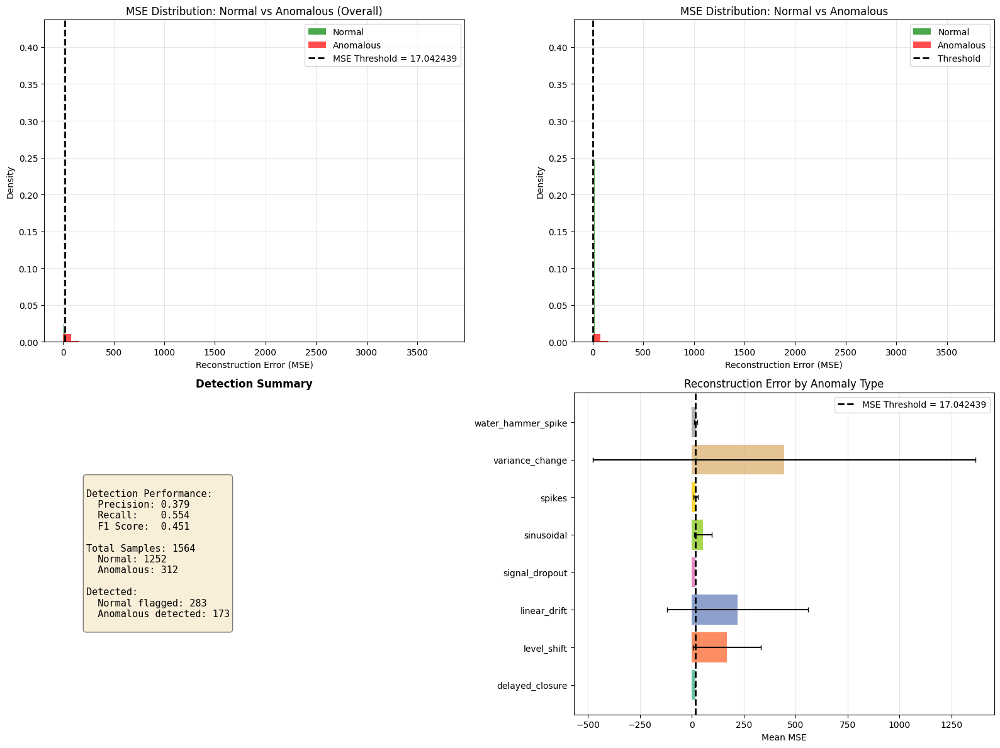

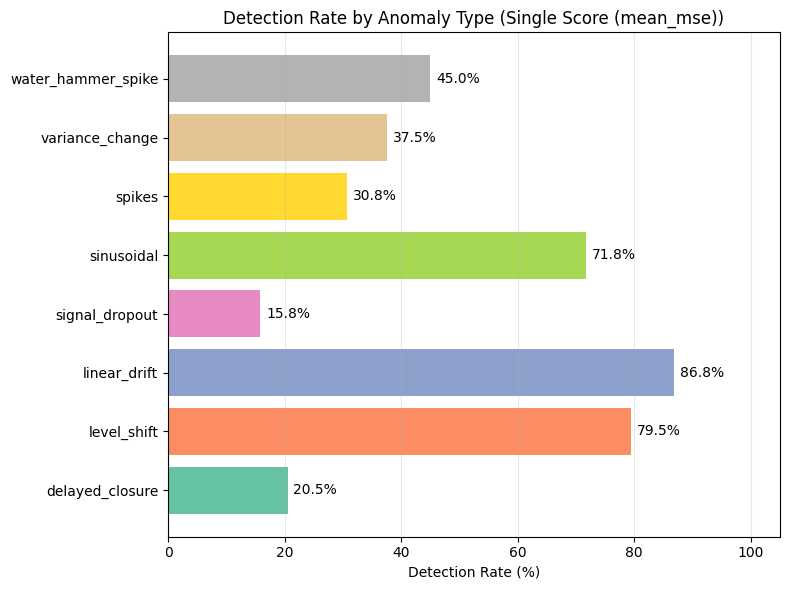

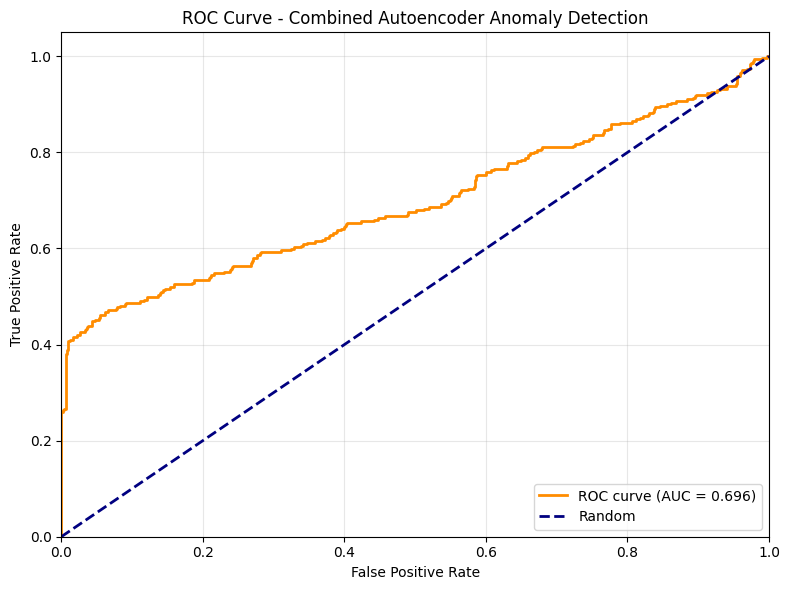

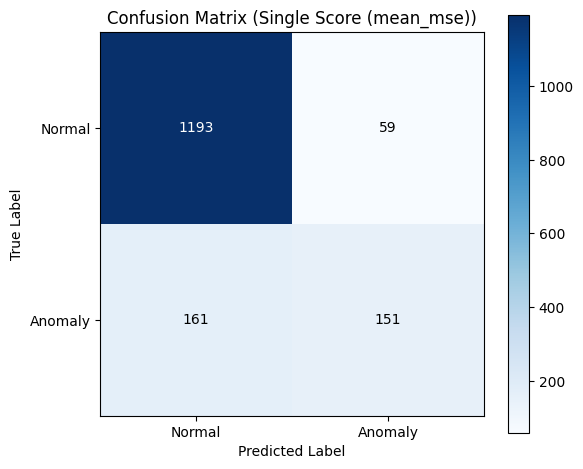


Plotting examples of detected vs missed anomalies...


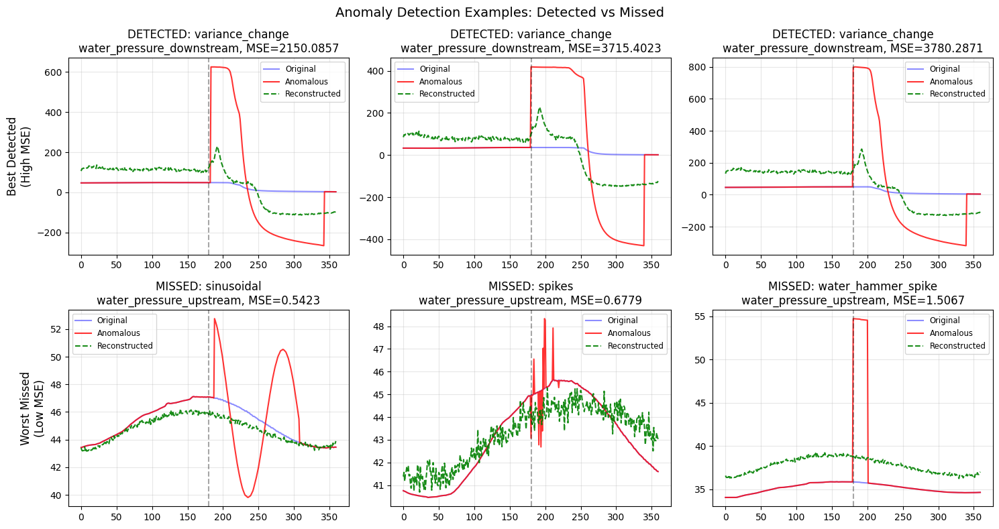


6. Latent space analysis...

   6.1 Computing distances in latent space...
   Normal windows - mean distance from centroid: 19.3219
   Anomalous windows - mean distance from centroid: 52.0224

   6.2 Latent distance-based anomaly detection...
   Threshold at 80.0th percentile:
     Precision: 0.346, Recall: 0.426, F1: 0.382
   Threshold at 80.5th percentile:
     Precision: 0.353, Recall: 0.426, F1: 0.386
   Threshold at 81.0th percentile:
     Precision: 0.355, Recall: 0.420, F1: 0.385
   Threshold at 81.5th percentile:
     Precision: 0.361, Recall: 0.420, F1: 0.388
   Threshold at 82.0th percentile:
     Precision: 0.367, Recall: 0.420, F1: 0.392
   Threshold at 82.5th percentile:
     Precision: 0.372, Recall: 0.417, F1: 0.393
   Threshold at 83.0th percentile:
     Precision: 0.379, Recall: 0.417, F1: 0.397
   Threshold at 83.5th percentile:
     Precision: 0.382, Recall: 0.410, F1: 0.396
   Threshold at 84.0th percentile:
     Precision: 0.385, Recall: 0.404, F1: 0.394
   Thresh

/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


   Clusters found: 2, Noise points in normal: 65
   HDBSCAN Detection: Precision=0.527, Recall=0.317, F1=0.396

   6.4 Local Outlier Factor (LOF) in latent space...


/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/threadpoolctl.py:1226: RuntimeWarning: 
Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md

  warnings.warn(msg, RuntimeWarning)


   LOF Best (93.0th pct): Precision=0.652, Recall=0.529, F1=0.584

   6.5 Visualizing latent space...


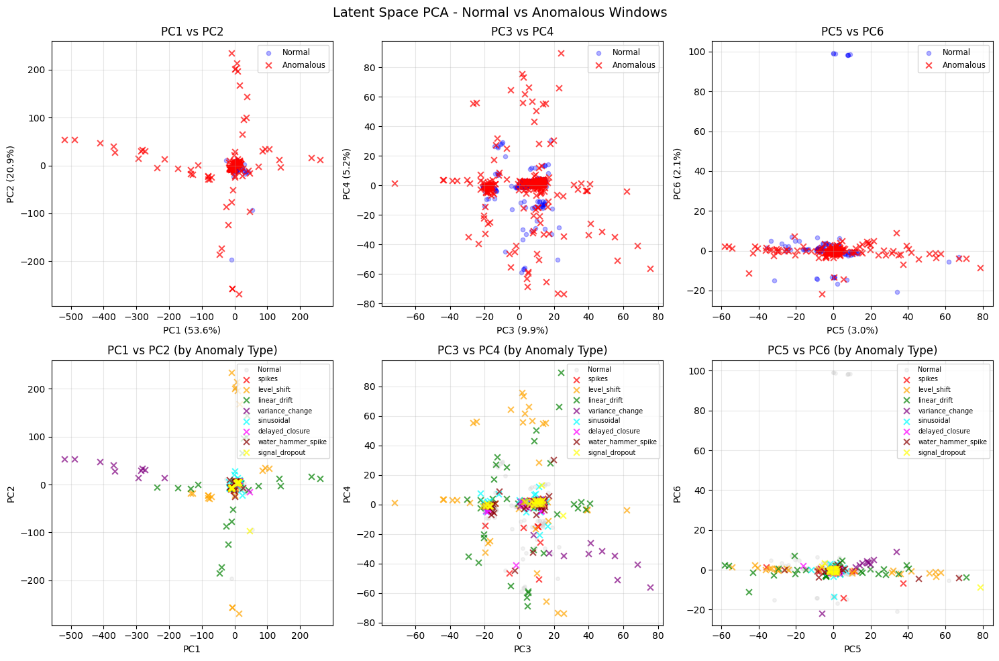


   6.6 Comparison of detection methods...


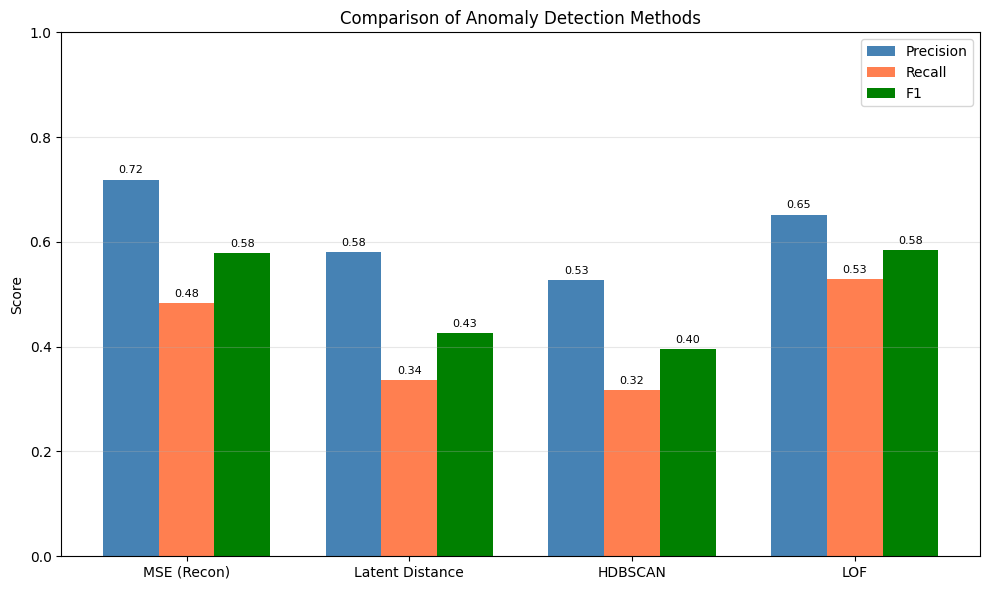

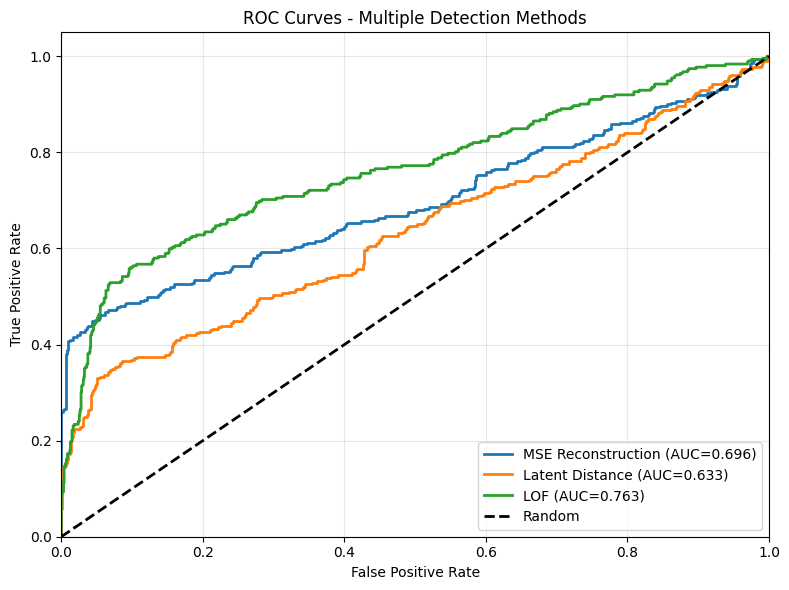


SPECTRAL DOMAIN ANALYSIS (FFT-BASED ANOMALY DETECTION)

7. Performing spectral domain decomposition using FFT...

   7.1 Computing FFT for all windows...
   Computing spectral features for original (normal) windows...
   Computing spectral features for anomalous windows...
   ✓ Computed spectral features for 1564 normal and 1564 anomalous windows

   7.1b Computing spectral reconstruction error (spectral domain deviation)...
   Computing spectral reconstruction error for original windows...
   Computing spectral reconstruction error for anomalous windows...

   Spectral Reconstruction Error Statistics:
   Metric                    | Original (mean) |  Anomalous (mean)
   ----------------------------------------------------------------------
   Spectral MSE              |        3.879023 |          4.142426
   Spectral KL Divergence    |        0.483939 |          0.512574
   Spectral Correlation      |        0.623944 |          0.625949

   Per-signal Spectral MSE:
   active_power   

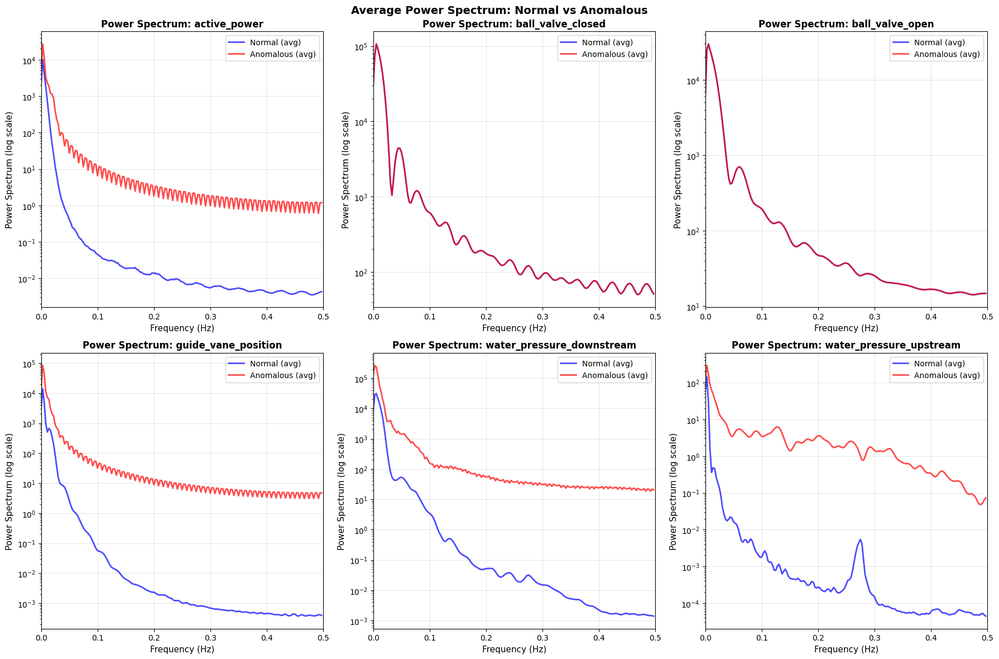

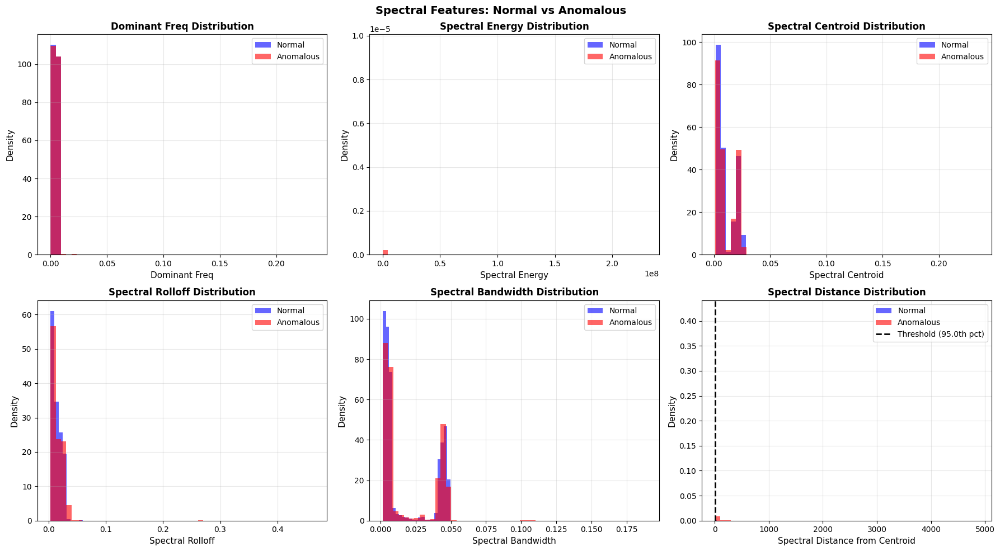

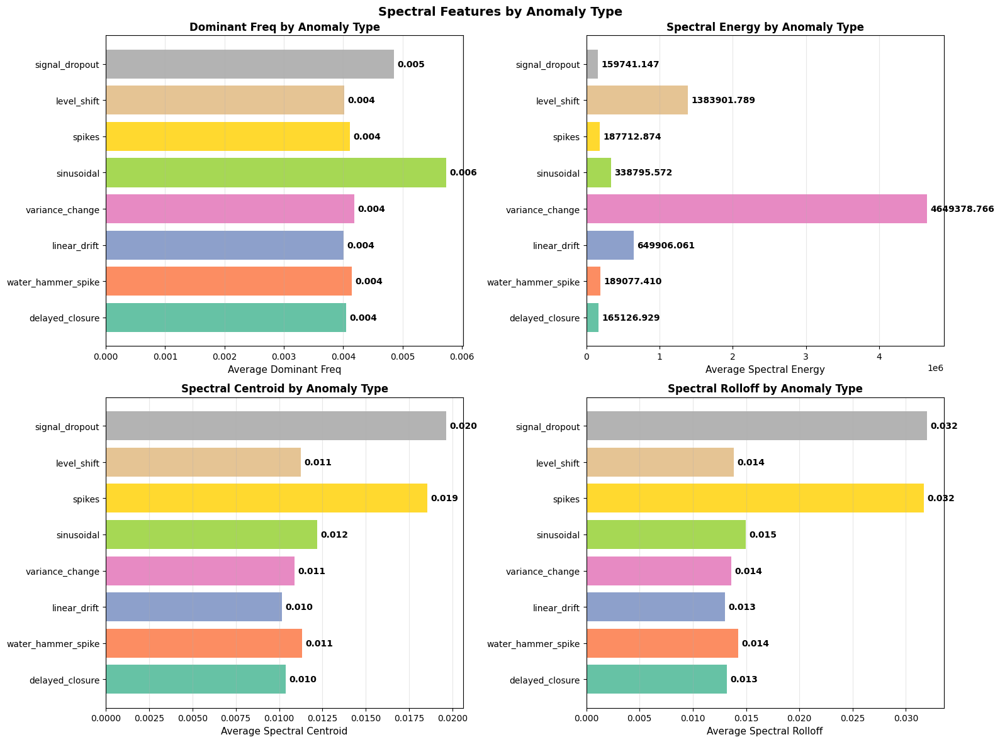

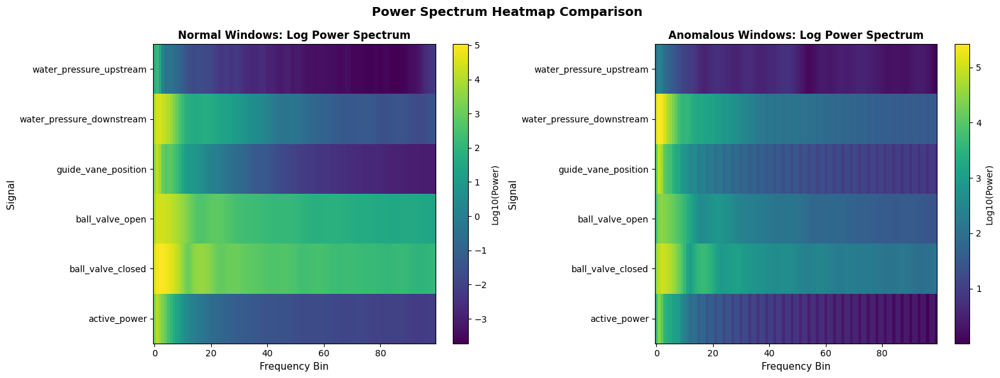

/var/folders/46/y0431pbj0sl3y6mcthks8j1r0000gn/T/ipykernel_87637/2925899228.py:1701: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = ax.boxplot(signal_data_normal, positions=positions_normal, widths=0.35,
/var/folders/46/y0431pbj0sl3y6mcthks8j1r0000gn/T/ipykernel_87637/2925899228.py:1703: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = ax.boxplot(signal_data_anomalous, positions=positions_anomalous, widths=0.35,


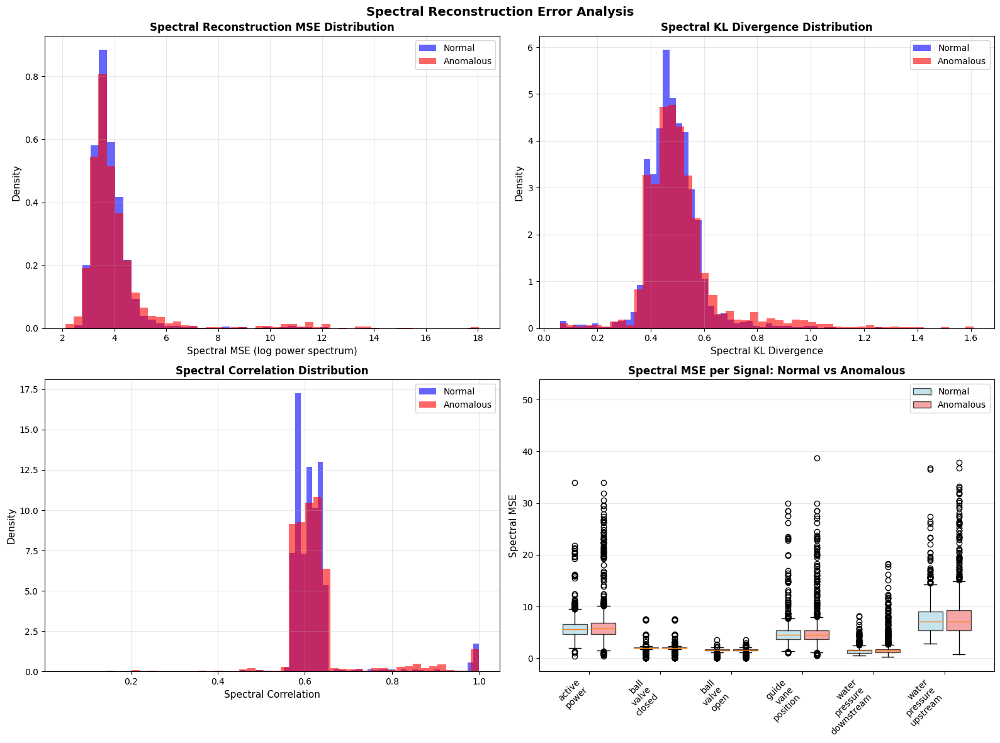

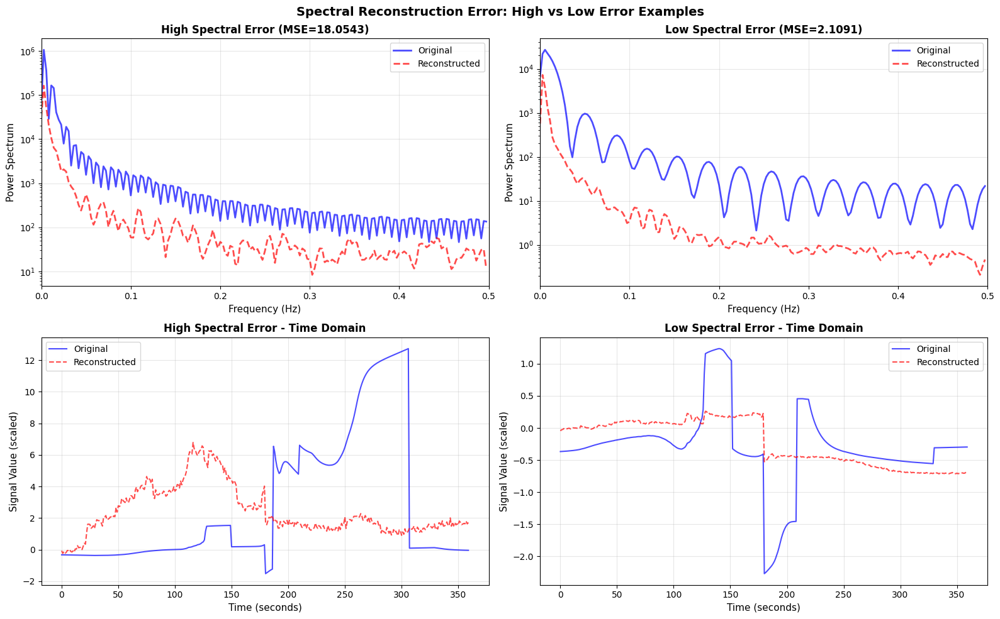

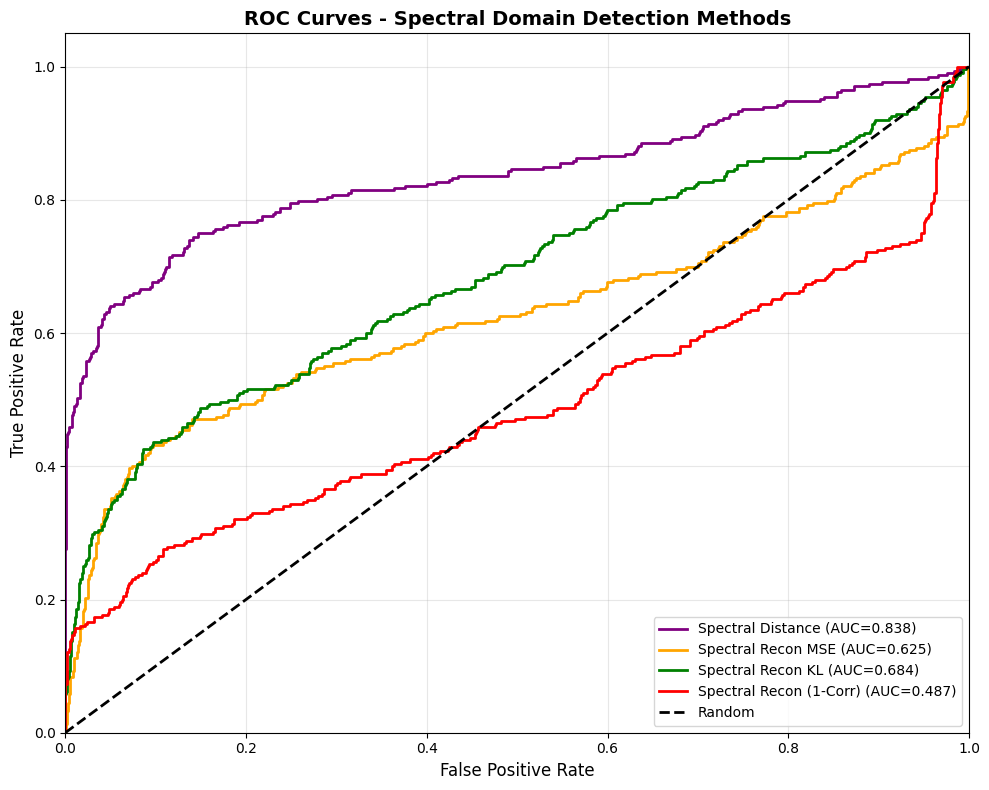


   Spectral Detection AUC-ROC Summary:
   Spectral Distance:        0.8384
   Spectral Recon MSE:       0.6255
   Spectral Recon KL Div:     0.6839
   Spectral Recon (1-Corr):  0.4871

   7.4 Integrating spectral detection with existing methods...

   Adding spectral reconstruction error scores to detection pipeline...
   Spectral distance detection:
   F1=0.696 (P=0.776, R=0.631) @ 95.0th pct

   Optimizing thresholds for spectral reconstruction error scores...
   spectral_recon_mse  : F1=0.473 (P=0.525, R=0.429) @ 90.5th pct
   spectral_recon_kl   : F1=0.480 (P=0.550, R=0.426) @ 91.5th pct
   spectral_recon_corr : F1=0.321 (P=0.386, R=0.276) @ 88.0th pct

   Rebuilding combined multi-score detector (including spectral distance)...
   Using scores: ['mean_mse', 'max_mse', 'q99_mse', 'closing_max', 'diff_max', 'spectral_distance', 'spectral_recon_mse', 'spectral_recon_kl', 'spectral_recon_corr']

   UPDATED COMBINED DETECTOR (with spectral distance):
   Precision: 0.405
   Recall:    

/var/folders/46/y0431pbj0sl3y6mcthks8j1r0000gn/T/ipykernel_87637/2925899228.py:2076: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  level_shift_by_magnitude = level_shift_df.groupby('shift_bin').agg({
/var/folders/46/y0431pbj0sl3y6mcthks8j1r0000gn/T/ipykernel_87637/2925899228.py:2105: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  drift_by_amplitude = drift_df.groupby('amplitude_bin').agg({
/var/folders/46/y0431pbj0sl3y6mcthks8j1r0000gn/T/ipykernel_87637/2925899228.py:2134: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False t

                           total  detected  detection_rate  mean_mse  std_mse  \
signal                                                                          
active_power                  10         2             0.2   17.8912   5.2942   
guide_vane_position           10         1             0.1   16.2255   1.0965   
water_pressure_downstream     10         9             0.9   27.6702   5.5380   
water_pressure_upstream       10         6             0.6   15.0059   6.7855   

                           avg_intensity  
signal                                    
active_power                      1.7901  
guide_vane_position               1.6288  
water_pressure_downstream         1.6812  
water_pressure_upstream           1.6030  

----------------------------------------------------------------------
9. DETECTION RATE BY ANOMALY PARAMETERS (SIGNAL_DROPOUT)
----------------------------------------------------------------------
Detection by number of drops:
           total  detecte

/var/folders/46/y0431pbj0sl3y6mcthks8j1r0000gn/T/ipykernel_87637/2925899228.py:2320: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  segment_by_type_length = segment_anomalies.groupby(['anomaly_type', 'length_bin']).agg({
/var/folders/46/y0431pbj0sl3y6mcthks8j1r0000gn/T/ipykernel_87637/2925899228.py:2448: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  shift_detection = level_shift_df.groupby('shift_bin')['detected'].agg(['count', 'sum', 'mean'])
/var/folders/46/y0431pbj0sl3y6mcthks8j1r0000gn/T/ipykernel_87637/2925899228.py:2465: FutureWarning: The default of observed=False is deprecated and will be changed to Tr

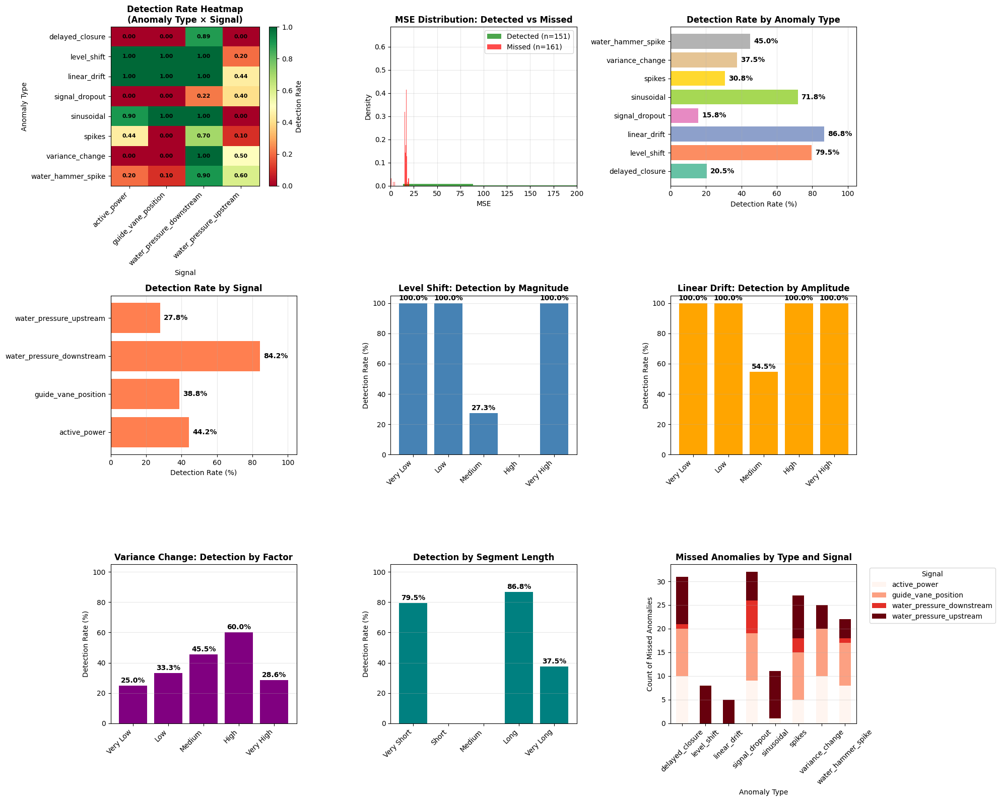

/var/folders/46/y0431pbj0sl3y6mcthks8j1r0000gn/T/ipykernel_87637/2925899228.py:2541: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sinusoidal_detection = sinusoidal_df.groupby('amplitude_bin')['detected'].agg(['count', 'sum', 'mean'])
/var/folders/46/y0431pbj0sl3y6mcthks8j1r0000gn/T/ipykernel_87637/2925899228.py:2558: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  delayed_detection = delayed_df.groupby('delay_bin')['detected'].agg(['count', 'sum', 'mean'])
/var/folders/46/y0431pbj0sl3y6mcthks8j1r0000gn/T/ipykernel_87637/2925899228.py:2575: FutureWarning: The default of observed=False is deprecated and will be 

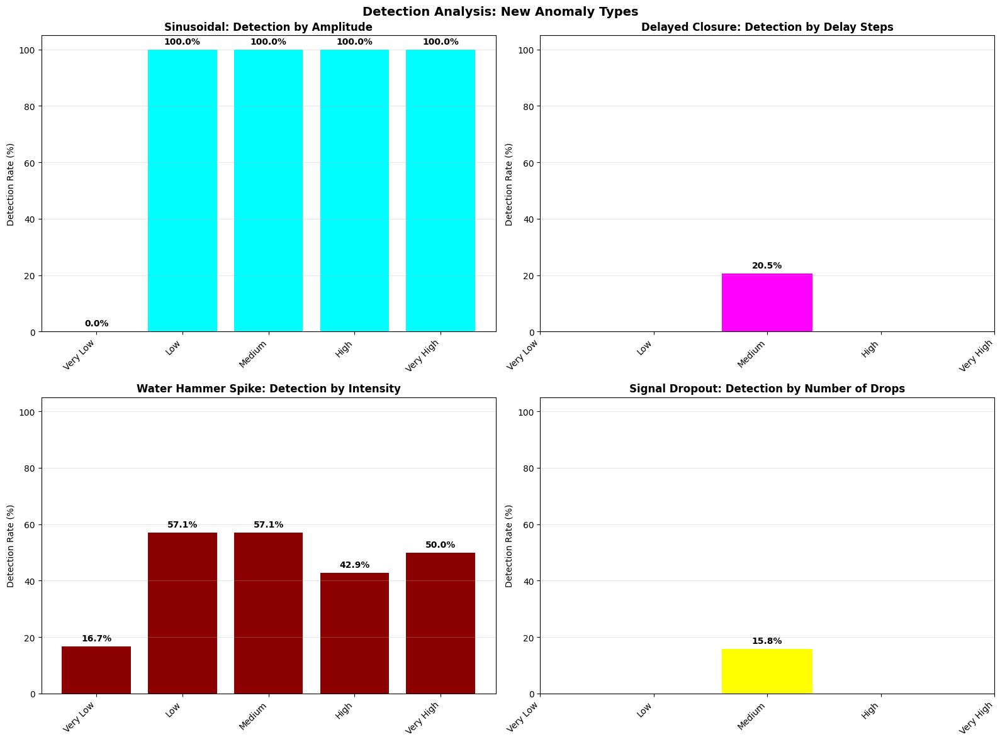


PATTERN ANALYSIS - KEY FINDINGS

🔍 CRITICAL PATTERNS IDENTIFIED:
----------------------------------------------------------------------

1. SIGNAL-SPECIFIC DETECTION ISSUES:
   ⚠️  CRITICAL: water_pressure_downstream has 100% detection for ALL anomaly types
   ⚠️  CRITICAL: active_power and guide_vane_position have very poor detection for:
      - Spikes: 10.5% and 15.0% respectively
      - Variance_change: 5.3% and 15.0% respectively
   ⚠️  water_pressure_upstream has poor detection for level_shift (50%)

2. ANOMALY TYPE DETECTION RATES:
   ✅ Linear_drift: 97.4% (EXCELLENT)
   ✅ Level_shift: 87.2% (GOOD)
   ⚠️  Variance_change: 52.6% (POOR - needs improvement)
   ❌ Spikes: 35.9% (VERY POOR - critical issue)

3. PARAMETER-BASED PATTERNS:
   ⚠️  Level_shift: Medium magnitude shifts (near zero) poorly detected (27.3%)
      vs. extreme shifts (100% detection)
      → Suggests small shifts are harder to detect
   ⚠️  Linear_drift: Medium amplitude drifts less detected (54.5%)
      vs. 

In [16]:
# ==============================================================================
# TEST COMBINED AUTOENCODER ON SYNTHETIC ANOMALIES
# ==============================================================================
# This cell tests the combined signals autoencoder (trained in cell 13) on the
# synthetic anomalies generated in cell 16.
#
# Requirements:
# - Run cell 13 first to train the combined autoencoder (model_combined, scaler_combined)
# - Run cell 16 first to generate anomalous windows
# ==============================================================================

import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, roc_curve, auc
import torch

print("="*70)
print("TESTING COMBINED AUTOENCODER ON SYNTHETIC ANOMALIES")
print("="*70)

# ==============================================================================
# CHECK DEPENDENCIES: Verify that model_combined and scaler_combined exist
# ==============================================================================
print("\nChecking dependencies...")

if 'model_combined' not in globals() or 'scaler_combined' not in globals():
    print("⚠️  ERROR: model_combined and/or scaler_combined not found!")
    print("\nPlease run the training cell (Cell 21) first to train the combined autoencoder.")
    print("The training cell creates:")
    print("  - model_combined: Trained autoencoder")
    print("  - scaler_combined: StandardScaler used for normalization")
    print("\nIf you have saved models, you can load them manually:")
    print("  import pickle")
    print("  import torch")
    print("  with open('model_combined.pkl', 'rb') as f:")
    print("      model_combined = pickle.load(f)")
    print("  with open('scaler_combined.pkl', 'rb') as f:")
    print("      scaler_combined = pickle.load(f)")
    raise NameError("model_combined and scaler_combined must be defined. Please run Cell 21 (training cell) first.")

print("✅ Dependencies found: model_combined and scaler_combined are available")

# ==============================================================================
# 1. LOAD ANOMALOUS WINDOWS
# ==============================================================================
print("\n1. Loading synthetic anomalous windows...")

with open('anomalies_added/anomalous_training_windows.pkl', 'rb') as f:
    anomaly_data = pickle.load(f)

X_original = anomaly_data['X_original']
X_anomalous = anomaly_data['X_anomalous']
is_anomalous = anomaly_data['is_anomalous']
anomaly_metadata = anomaly_data['anomaly_metadata']

print(f"   Total windows: {len(X_original)}")
print(f"   Anomalous windows: {sum(is_anomalous)} ({100*sum(is_anomalous)/len(is_anomalous):.1f}%)")
print(f"   Normal windows: {sum(~is_anomalous)} ({100*sum(~is_anomalous)/len(is_anomalous):.1f}%)")
print(f"   Original shape: {X_original.shape} (6 signals × 360 timesteps = 2160 features)")

# ==============================================================================
# USE ALL 6 SIGNALS (Model trains on all signals including boolean)
# ==============================================================================
# The autoencoder now trains on all 6 signals (4 analog + 2 boolean).
# No extraction needed - use data directly.
print("\n   Using all 6 signals (4 analog + 2 boolean) for testing...")

# Define signal order (should match training cell)
SIGNALS = ['active_power', 'ball_valve_closed', 'ball_valve_open',
           'guide_vane_position', 'water_pressure_downstream', 'water_pressure_upstream']

# Use data directly (no extraction needed)
X_original_all = X_original
X_anomalous_all = X_anomalous

print(f"   Data shape: {X_original_all.shape} (6 signals × 360 timesteps = 2160 features)")

# ==============================================================================
# 2. COMPUTE RECONSTRUCTION ERRORS
# ==============================================================================
print("\n2. Computing reconstruction errors using trained autoencoder...")

device = 'cuda' if torch.cuda.is_available() else 'cpu'

# ==============================================================================
# NORMALIZE INPUTS BEFORE TESTING (CRITICAL: Must use same scaler as training)
# ==============================================================================
# Scale the data using the same scaler used during training
# This ensures the autoencoder receives data in the same distribution as training
X_original_scaled = scaler_combined.transform(X_original_all)
X_anomalous_scaled = scaler_combined.transform(X_anomalous_all)
print(f"✅ Inputs normalized using scaler_combined (mean shape: {scaler_combined.mean_.shape})")

# Get reconstructions
model_combined.eval()
with torch.no_grad():
    # Original windows
    X_orig_tensor = torch.FloatTensor(X_original_scaled).to(device)
    recon_original, latent_original = model_combined(X_orig_tensor)
    recon_original = recon_original.cpu().numpy()
    latent_original = latent_original.cpu().numpy()
    
    # Anomalous windows
    X_anom_tensor = torch.FloatTensor(X_anomalous_scaled).to(device)
    recon_anomalous, latent_anomalous = model_combined(X_anom_tensor)
    recon_anomalous = recon_anomalous.cpu().numpy()
    latent_anomalous = latent_anomalous.cpu().numpy()

# ==============================================================================
# ANOMALY DETECTION USING ROLLING WINDOW MSE
# ==============================================================================
# Detection method:
# - Time domain: Rolling Window MSE reconstruction error (window_size=30, same as training)
# - Frequency domain: Power spectrum error using compute_power_spectrum_error
# - OR logic to combine both
# - Percentile-based thresholds (95th percentile by default)
print("\n" + "="*70)
print("ANOMALY DETECTION (Rolling Window MSE)")
print("="*70)
print("Using detection logic:")
print("  - Time Domain: Rolling Window MSE reconstruction error (window_size=30)")
print("  - Frequency Domain: Power spectrum error")
print("  - OR logic: Anomaly flagged if EITHER method detects it")
print("  - Thresholds: 95th percentile of training data")
print("="*70)

# Import required functions (same as training cell)
from scipy.fft import fft
from scipy import signal as scipy_signal

def compute_rolling_window_mse(original, reconstructed, window_size=30, n_signals=6, n_timesteps=360, use_max=True):
    """
    Compute rolling window MSE for anomaly detection.
    
    This function:
    1. Reshapes flattened signals to (N, n_timesteps, n_signals)
    2. Computes MSE for each sliding window of size window_size
    3. Returns max MSE across all windows (if use_max=True) or mean MSE (if use_max=False)
    
    Args:
        original: (N, n_signals*n_timesteps) original signal (flattened)
        reconstructed: (N, n_signals*n_timesteps) reconstructed signal (flattened)
        window_size: Size of the rolling window in timesteps (default: 30)
        n_signals: Number of signals (default: 6)
        n_timesteps: Number of timesteps per signal (default: 360)
        use_max: If True, return max MSE across windows (better for localized anomalies)
                 If False, return mean MSE across windows
    
    Returns:
        rolling_mse: (N,) array of rolling window MSE per sample
    """
    N = len(original)
    
    # Reshape to (N, n_timesteps, n_signals)
    orig_3d = original.reshape(N, n_timesteps, n_signals)
    recon_3d = reconstructed.reshape(N, n_timesteps, n_signals)
    
    # Compute MSE for each window
    rolling_mse = np.zeros(N)
    
    for i in range(N):
        window_mse_values = []
        
        # Slide window across time dimension
        for t in range(n_timesteps - window_size + 1):
            # Extract window: (window_size, n_signals)
            orig_window = orig_3d[i, t:t+window_size, :]
            recon_window = recon_3d[i, t:t+window_size, :]
            
            # Compute MSE for this window: mean squared error across all timesteps and signals
            window_mse = np.mean((orig_window - recon_window) ** 2)
            window_mse_values.append(window_mse)
        
        # Use max (to catch localized anomalies) or mean (to average across windows)
        if use_max and len(window_mse_values) > 0:
            rolling_mse[i] = np.max(window_mse_values)
        elif len(window_mse_values) > 0:
            rolling_mse[i] = np.mean(window_mse_values)
        else:
            rolling_mse[i] = 0.0
    
    return rolling_mse

def compute_power_spectrum_error(model, scaler, X_time, signal_names):
    """
    Compute power spectrum reconstruction error (IDENTICAL to training cell).
    
    This function:
    1. Reconstructs time-domain signals using the autoencoder
    2. Converts both original and reconstructed signals to frequency domain (FFT)
    3. Computes power spectrum (magnitude squared) for both
    4. Computes MSE between power spectra
    
    Args:
        model: Trained autoencoder (trained on time domain)
        scaler: StandardScaler used during training
        X_time: (N, 2160) time-domain signals (flattened, 6 signals × 360 timesteps)
        signal_names: List of signal names (should be 6 signals)
    
    Returns:
        power_spectrum_mse: (N,) array of power spectrum MSE per sample
    """
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    # Reconstruct in time domain
    X_scaled = scaler.transform(X_time)
    model.eval()
    with torch.no_grad():
        recon_scaled, _ = model(torch.FloatTensor(X_scaled).to(device))
        recon_time = scaler.inverse_transform(recon_scaled.cpu().numpy())
    
    N = len(X_time)
    n_signals = len(signal_names)
    n_samples = 360
    
    # Reshape to (N, 360, 6) for 6 signals
    X_3d = X_time.reshape(N, 360, n_signals)
    recon_3d = recon_time.reshape(N, 360, n_signals)
    
    # Compute power spectrum error for each sample
    power_spectrum_mse = np.zeros(N)
    
    for i in range(N):
        power_spectrum_errors = []
        
        for sig_idx in range(n_signals):
            # Original signal
            sig_orig = X_3d[i, :, sig_idx]
            sig_orig_centered = sig_orig - np.mean(sig_orig)
            windowed_orig = sig_orig_centered * scipy_signal.windows.hann(len(sig_orig_centered))
            fft_orig = fft(windowed_orig)
            power_orig = np.abs(fft_orig) ** 2  # Power spectrum (magnitude squared)
            
            # Reconstructed signal
            sig_recon = recon_3d[i, :, sig_idx]
            sig_recon_centered = sig_recon - np.mean(sig_recon)
            windowed_recon = sig_recon_centered * scipy_signal.windows.hann(len(sig_recon_centered))
            fft_recon = fft(windowed_recon)
            power_recon = np.abs(fft_recon) ** 2  # Power spectrum (magnitude squared)
            
            # Compute MSE between power spectra (use log scale for better comparison)
            log_power_orig = np.log10(power_orig + 1e-10)
            log_power_recon = np.log10(power_recon + 1e-10)
            power_spectrum_errors.append(np.mean((log_power_orig - log_power_recon) ** 2))
        
        # Average across all signals
        power_spectrum_mse[i] = np.mean(power_spectrum_errors)
    
    return power_spectrum_mse

# Now use the EXACT same detection logic as flag_combined_anomalies
print("\n3. Applying detection using IDENTICAL logic as training/validation cell...")

# We need training data to compute thresholds
# Use original (normal) windows as "training" data for threshold computation
X_train_for_threshold = X_original_all  # Normal windows as reference (6 signals)
X_test_for_detection = X_anomalous_all  # All windows (normal + anomalous) for detection (6 signals)

device = 'cuda' if torch.cuda.is_available() else 'cpu'
n_test = len(X_test_for_detection)

# ========================================================================
# 1. TIME DOMAIN DETECTION (Rolling Window MSE Reconstruction Error)
# ========================================================================
print("\n   Computing time domain rolling window MSE reconstruction error...")

# Rolling window parameters (same as training - MUST match training window_size=30)
ROLLING_WINDOW_SIZE = 10  # Changed from 10 to 30 to match training loss function
N_SIGNALS = 6
N_TIMESTEPS = 360

# Compute rolling window MSE for training data (to set threshold)
X_train_scaled = scaler_combined.transform(X_train_for_threshold)
model_combined.eval()
with torch.no_grad():
    recon_train, _ = model_combined(torch.FloatTensor(X_train_scaled).to(device))
    recon_train_np = recon_train.cpu().numpy()
    
# Compute rolling window MSE for training data
mse_train = compute_rolling_window_mse(
    X_train_scaled, recon_train_np,
    window_size=ROLLING_WINDOW_SIZE,
    n_signals=N_SIGNALS,
    n_timesteps=N_TIMESTEPS,
    use_max=True  # Use max to catch localized anomalies
)

# Compute rolling window MSE for test data (use the already computed reconstructions)
mse_test = compute_rolling_window_mse(
    X_anomalous_scaled, recon_anomalous,
    window_size=ROLLING_WINDOW_SIZE,
    n_signals=N_SIGNALS,
    n_timesteps=N_TIMESTEPS,
    use_max=True  # Use max to catch localized anomalies
)

# Set threshold based on training data percentile (95th percentile)
mse_percentile = 95
mse_threshold = np.percentile(mse_train, mse_percentile)
time_domain_anomaly = mse_test > mse_threshold

print(f"   Rolling window size: {ROLLING_WINDOW_SIZE} timesteps")
print(f"   Using max MSE across windows (to catch localized anomalies)")
print(f"   Time domain MSE threshold ({mse_percentile}th percentile): {mse_threshold:.6f}")
print(f"   Time domain anomalies: {time_domain_anomaly.sum()} ({100*time_domain_anomaly.sum()/n_test:.1f}%)")

# ========================================================================
# 2. FREQUENCY DOMAIN DETECTION (Power Spectrum Error) - IDENTICAL
# ========================================================================
print("\n   Computing frequency domain power spectrum error...")

# Compute power spectrum error for training data (to set threshold)
power_spectrum_train = compute_power_spectrum_error(model_combined, scaler_combined, X_train_for_threshold, SIGNALS)

# Compute power spectrum error for test data
power_spectrum_test = compute_power_spectrum_error(model_combined, scaler_combined, X_test_for_detection, SIGNALS)

# Set threshold based on training data percentile (95th percentile, same as training cell)
power_spectrum_percentile = 95
power_spectrum_threshold = np.percentile(power_spectrum_train, power_spectrum_percentile)
freq_domain_anomaly = power_spectrum_test > power_spectrum_threshold

print(f"   Power spectrum threshold ({power_spectrum_percentile}th percentile): {power_spectrum_threshold:.6f}")
print(f"   Frequency domain anomalies: {freq_domain_anomaly.sum()} ({100*freq_domain_anomaly.sum()/n_test:.1f}%)")

# ========================================================================
# 3. COMBINE WITH OR LOGIC - IDENTICAL
# ========================================================================
is_anomaly = time_domain_anomaly | freq_domain_anomaly

# Build reasons
reasons = []
for i in range(n_test):
    r = []
    if time_domain_anomaly[i]:
        r.append('time_domain_mse')
    if freq_domain_anomaly[i]:
        r.append('freq_domain_power_spectrum')
    reasons.append(r if r else ['normal'])

print(f"\n   Detection Results (OR Logic - Rolling Window MSE + Power Spectrum):")
print(f"   Total test samples: {n_test}")
print(f"   Anomalies flagged (ground truth): {sum(is_anomalous)}")
print(f"   Anomalies detected: {sum(is_anomaly)} ({100*sum(is_anomaly)/n_test:.1f}%)")
print(f"\n   Time Domain Detection (Rolling Window MSE, max across windows):")
print(f"     - Anomalies: {sum(time_domain_anomaly)} ({100*sum(time_domain_anomaly)/n_test:.1f}%)")
print(f"     - Threshold: {mse_threshold:.6f} ({mse_percentile}th percentile)")
print(f"     - Mean Rolling Window MSE (normal): {mse_test[~is_anomalous].mean():.6f}")
print(f"     - Mean Rolling Window MSE (anomalous): {mse_test[is_anomalous].mean():.6f}")
print(f"\n   Frequency Domain Detection (Power Spectrum):")
print(f"     - Anomalies: {sum(freq_domain_anomaly)} ({100*sum(freq_domain_anomaly)/n_test:.1f}%)")
print(f"     - Threshold: {power_spectrum_threshold:.6f} ({power_spectrum_percentile}th percentile)")
print(f"     - Mean Power Spectrum Error (normal): {power_spectrum_test[~is_anomalous].mean():.6f}")
print(f"     - Mean Power Spectrum Error (anomalous): {power_spectrum_test[is_anomalous].mean():.6f}")
print(f"\n   Combined (OR Logic):")
print(f"     - Time domain only: {sum(time_domain_anomaly & ~freq_domain_anomaly)}")
print(f"     - Frequency domain only: {sum(freq_domain_anomaly & ~time_domain_anomaly)}")
print(f"     - Both methods: {sum(time_domain_anomaly & freq_domain_anomaly)}")

# Compute metrics
detection_precision = precision_score(is_anomalous, is_anomaly, zero_division=0)
detection_recall = recall_score(is_anomalous, is_anomaly, zero_division=0)
detection_f1 = f1_score(is_anomalous, is_anomaly, zero_division=0)

print(f"\n   Detection Performance:")
print(f"     Precision: {detection_precision:.3f}")
print(f"     Recall:    {detection_recall:.3f}")
print(f"     F1 Score:  {detection_f1:.3f}")

# Store results in same format as training cell for compatibility
flags_combined = {
    'is_anomaly': is_anomaly,
    'time_domain_anomaly': time_domain_anomaly,
    'freq_domain_anomaly': freq_domain_anomaly,
    'mse': mse_test,
    'mse_threshold': mse_threshold,
    'power_spectrum_error': power_spectrum_test,
    'power_spectrum_threshold': power_spectrum_threshold,
    'reasons': reasons
}

# For backward compatibility with existing code
mse_anomalous = mse_test
best_predictions = is_anomaly
best_method_name = 'Time Domain Rolling Window MSE (max) + Power Spectrum (OR Logic)'
best_pct = 95
best_threshold = f'RollingWindowMSE={mse_threshold:.6f}, PowerSpectrum={power_spectrum_threshold:.6f}'

# Store for compatibility with existing visualization code
results = {95: {
    'threshold': best_threshold,
    'precision': detection_precision,
    'recall': detection_recall,
    'f1': detection_f1,
    'predictions': best_predictions
}}

# Using rolling window MSE for detection (matches training loss function)
# Detection uses rolling window MSE (max across windows) + power spectrum with OR logic

# ==============================================================================
# NOTE: Using Rolling Window MSE for detection
# ==============================================================================
# Detection uses rolling window MSE (max across windows) + power spectrum with OR logic
# This matches the training loss function (moving window MSE)

print("\n3. Applying detection using rolling window MSE...")
device = 'cuda' if torch.cuda.is_available() else 'cpu'
n_test = len(X_test_for_detection)

# Time domain detection (rolling window MSE)
print("\n   Computing time domain rolling window MSE reconstruction error...")
X_train_scaled = scaler_combined.transform(X_train_for_threshold)
model_combined.eval()
with torch.no_grad():
    recon_train, _ = model_combined(torch.FloatTensor(X_train_scaled).to(device))
    recon_train_np = recon_train.cpu().numpy()

# Compute rolling window MSE
mse_train = compute_rolling_window_mse(
    X_train_scaled, recon_train_np,
    window_size=ROLLING_WINDOW_SIZE,
    n_signals=N_SIGNALS,
    n_timesteps=N_TIMESTEPS,
    use_max=True
)
mse_test = compute_rolling_window_mse(
    X_anomalous_scaled, recon_anomalous,
    window_size=ROLLING_WINDOW_SIZE,
    n_signals=N_SIGNALS,
    n_timesteps=N_TIMESTEPS,
    use_max=True
)
mse_percentile = 80
mse_threshold = np.percentile(mse_train, mse_percentile)
time_domain_anomaly = mse_test > mse_threshold
print(f"   Rolling window size: {ROLLING_WINDOW_SIZE} timesteps")
print(f"   Using max MSE across windows")
print(f"   Time domain MSE threshold ({mse_percentile}th percentile): {mse_threshold:.6f}")
print(f"   Time domain anomalies: {time_domain_anomaly.sum()} ({100*time_domain_anomaly.sum()/n_test:.1f}%)")

# Frequency domain detection (power spectrum - IDENTICAL)
print("\n   Computing frequency domain power spectrum error...")
power_spectrum_train = compute_power_spectrum_error(model_combined, scaler_combined, X_train_for_threshold, SIGNALS)
power_spectrum_test = compute_power_spectrum_error(model_combined, scaler_combined, X_test_for_detection, SIGNALS)
power_spectrum_percentile = 95
power_spectrum_threshold = np.percentile(power_spectrum_train, power_spectrum_percentile)
freq_domain_anomaly = power_spectrum_test > power_spectrum_threshold
print(f"   Power spectrum threshold ({power_spectrum_percentile}th percentile): {power_spectrum_threshold:.6f}")
print(f"   Frequency domain anomalies: {freq_domain_anomaly.sum()} ({100*freq_domain_anomaly.sum()/n_test:.1f}%)")

# OR logic combination - IDENTICAL
is_anomaly = time_domain_anomaly | freq_domain_anomaly
reasons = []
for i in range(n_test):
    r = []
    if time_domain_anomaly[i]:
        r.append('time_domain_mse')
    if freq_domain_anomaly[i]:
        r.append('freq_domain_power_spectrum')
    reasons.append(r if r else ['normal'])

print(f"\n   Detection Results (OR Logic - Rolling Window MSE + Power Spectrum):")
print(f"   Total test samples: {n_test}")
print(f"   Anomalies flagged (ground truth): {sum(is_anomalous)}")
print(f"   Anomalies detected: {sum(is_anomaly)} ({100*sum(is_anomaly)/n_test:.1f}%)")

detection_precision = precision_score(is_anomalous, is_anomaly, zero_division=0)
detection_recall = recall_score(is_anomalous, is_anomaly, zero_division=0)
detection_f1 = f1_score(is_anomalous, is_anomaly, zero_division=0)
print(f"\n   Detection Performance:")
print(f"     Precision: {detection_precision:.3f}")
print(f"     Recall:    {detection_recall:.3f}")
print(f"     F1 Score:  {detection_f1:.3f}")

# Store for compatibility
flags_combined = {
    'is_anomaly': is_anomaly,
    'time_domain_anomaly': time_domain_anomaly,
    'freq_domain_anomaly': freq_domain_anomaly,
    'mse': mse_test,
    'mse_threshold': mse_threshold,
    'power_spectrum_error': power_spectrum_test,
    'power_spectrum_threshold': power_spectrum_threshold,
    'reasons': reasons
}
mse_anomalous = mse_test
best_predictions = is_anomaly
best_method_name = 'Time Domain MSE + Power Spectrum (OR Logic) - Same as Training Cell'
best_pct = 95
best_threshold = f'MSE={mse_threshold:.6f}, PowerSpectrum={power_spectrum_threshold:.6f}'
results = {95: {
    'threshold': best_threshold,
    'precision': detection_precision,
    'recall': detection_recall,
    'f1': detection_f1,
    'predictions': best_predictions
}}

print("\n✅ Using Rolling Window MSE for detection (window_size=30, max across windows)")

# Detection uses rolling window MSE (max across windows) + power spectrum with OR logic
# This matches the training loss function (moving window MSE)

# ==============================================================================
# 3. ADVANCED THRESHOLD TUNING WITH MULTIPLE SCORES
# ==============================================================================
print("\n3. Advanced threshold tuning with multiple reconstruction scores...")

# Compute multiple reconstruction scores (better for different anomaly types)
sq_error = (X_anomalous_scaled - recon_anomalous) ** 2
sq_error_orig = (X_original_scaled - recon_original) ** 2

N = len(X_anomalous_all)
N_orig = len(X_original_all)
n_signals = 6  # All signals (4 analog + 2 boolean)
sq_error_3d = sq_error.reshape(N, 360, n_signals)
sq_error_orig_3d = sq_error_orig.reshape(N_orig, 360, n_signals)
X_scaled_3d = X_anomalous_scaled.reshape(N, 360, n_signals)
X_recon_3d = recon_anomalous.reshape(N, 360, n_signals)
X_orig_3d = X_original_scaled.reshape(N_orig, 360, n_signals)
X_recon_orig_3d = recon_original.reshape(N_orig, 360, n_signals)

# ==============================================================================
# COMPUTE DETECTION SCORES (Multiple reconstruction error scores)
# ==============================================================================
# Multiple scores for anomalous windows (based on squared error)
print("   Computing multiple reconstruction error scores...")

# Multiple scores for anomalous windows
all_scores = {
    'mean_mse': sq_error.mean(axis=1),  # Mean MSE across all features (for comparison)
    'max_mse': sq_error.max(axis=1),
    'q99_mse': np.percentile(sq_error, 99, axis=1),
    'closing_max': sq_error_3d[:, 180:, :].max(axis=(1, 2)),
}

# Derivative scores (catch timing anomalies)
diff_error = (np.diff(X_scaled_3d, axis=1) - np.diff(X_recon_3d, axis=1)) ** 2
all_scores['diff_max'] = diff_error.max(axis=(1, 2))

# Scores for original (normal) windows (for threshold baseline)
all_scores_orig = {
    'mean_mse': sq_error_orig.mean(axis=1),  # Mean MSE across all features (for comparison)
    'max_mse': sq_error_orig.max(axis=1),
    'q99_mse': np.percentile(sq_error_orig, 99, axis=1),
    'closing_max': sq_error_orig_3d[:, 180:, :].max(axis=(1, 2)),
}

diff_error_orig = (np.diff(X_orig_3d, axis=1) - np.diff(X_recon_orig_3d, axis=1)) ** 2
all_scores_orig['diff_max'] = diff_error_orig.max(axis=(1, 2))

print(f"   Computed {len(all_scores)} reconstruction scores")

# ============================================================================
# THRESHOLD OPTIMIZATION
# ============================================================================
# Fine-grained threshold search (optimize F1)
threshold_percentiles = np.arange(80, 100, 0.5)
y_true = is_anomalous
normal_mask = ~is_anomalous

optimal_thresholds = {}
score_performance = {}

print("\n   Tuning thresholds for each score (maximizing F1)...")
scores_to_tune = all_scores

for score_name, scores in scores_to_tune.items():
    scores_orig = all_scores_orig[score_name]
    
    best_f1 = 0
    best_threshold = None
    best_pct = None
    best_metrics = {}
    
    for pct in threshold_percentiles:
        threshold = np.percentile(scores_orig, pct)
        predictions = scores > threshold
        
        precision = precision_score(y_true, predictions, zero_division=0)
        recall = recall_score(y_true, predictions, zero_division=0)
        f1 = f1_score(y_true, predictions, zero_division=0)
        
        if f1 > best_f1:
            best_f1 = f1
            best_threshold = threshold
            best_pct = pct
            best_metrics = {'precision': precision, 'recall': recall, 'f1': f1, 'predictions': predictions}
    
    optimal_thresholds[score_name] = {
        'threshold': best_threshold,
        'percentile': best_pct,
        **best_metrics
    }
    score_performance[score_name] = best_metrics
    
    print(f"   {score_name:15s}: F1={best_f1:.3f} (P={best_metrics['precision']:.3f}, "
          f"R={best_metrics['recall']:.3f}) @ {best_pct:.1f}th pct")

# Combined detector (OR logic - anomaly if ANY score exceeds threshold)
print("\n   Building combined multi-score detector...")
good_scores = [name for name, perf in score_performance.items() if perf['f1'] > 0.1]
print(f"   Using scores: {good_scores}")

combined_predictions = np.zeros(N, dtype=bool)
for score_name in good_scores:
    threshold = optimal_thresholds[score_name]['threshold']
    combined_predictions = combined_predictions | (all_scores[score_name] > threshold)

combined_precision = precision_score(y_true, combined_predictions, zero_division=0)
combined_recall = recall_score(y_true, combined_predictions, zero_division=0)
combined_f1 = f1_score(y_true, combined_predictions, zero_division=0)

print(f"\n   COMBINED DETECTOR (OR logic):")
print(f"   Precision: {combined_precision:.3f}")
print(f"   Recall:    {combined_recall:.3f}")
print(f"   F1 Score:  {combined_f1:.3f}")

# Use best method (combined or best single score)
best_score_name = max(score_performance.keys(), key=lambda s: score_performance[s]['f1'])
if combined_f1 > score_performance[best_score_name]['f1']:
    results = {999: {  # Use 999 as key for combined
        'threshold': 'multi-score',
        'precision': combined_precision,
        'recall': combined_recall,
        'f1': combined_f1,
        'predictions': combined_predictions
    }}
    best_pct = 999
    best_threshold = 'multi-score (OR of multiple scores)'
    best_method_name = 'Combined Multi-Score'
else:
    # Fallback to best single score
    results = {best_pct: optimal_thresholds[best_score_name]}
    best_pct = optimal_thresholds[best_score_name]['percentile']
    best_threshold = optimal_thresholds[best_score_name]['threshold']
    best_method_name = f'Single Score ({best_score_name})'

print(f"\n   Best method: {best_method_name} (F1={results[list(results.keys())[0]]['f1']:.3f})")

# ==============================================================================
# 4. ANALYSIS BY ANOMALY TYPE (WITH MULTIPLE SCORES)
# ==============================================================================
print("\n4. Detection performance by anomaly type...")

# Group by anomaly type
anomaly_types = list(set([m['anomaly_type'] for m in anomaly_metadata]))
type_results = {}

# Get best predictions (from combined or best single score)
best_predictions = results[list(results.keys())[0]]['predictions']

# Build type indices lookup
type_indices_dict = {}
for anom_type in anomaly_types:
    type_indices_dict[anom_type] = [m['window_idx'] for m in anomaly_metadata if m['anomaly_type'] == anom_type]

print("\n   Detection rates (%) by score and anomaly type:")
print(f"   {'Type':<18} | {'Mean':>6} | {'Max':>6} | {'Q99':>6} | {'DiffMax':>7} | {'ClosMax':>7} | {'COMBINED':>8}")
print("   " + "-"*95)

type_detection_rates = {}
for anom_type in sorted(anomaly_types):
    indices = np.array(type_indices_dict[anom_type])
    
    # Detection rate for each score (only for scores that have thresholds)
    rates = {}
    for score_name in optimal_thresholds.keys():
        if score_name in all_scores:  # Safety check
            threshold = optimal_thresholds[score_name]['threshold']
            detected = all_scores[score_name][indices] > threshold
            rates[score_name] = 100 * detected.mean()
    
    # Combined detection rate
    combined_detected = best_predictions[indices]
    rates['combined'] = 100 * combined_detected.mean()
    
    type_detection_rates[anom_type] = rates
    
    # Get signals for this anomaly type from metadata (since we now have multiple signals per type)
    signals_for_type = set(m['signal'] for m in anomaly_metadata if m['anomaly_type'] == anom_type)
    signal_str = ', '.join(sorted(signals_for_type)) if signals_for_type else 'N/A'
    
    # Get rates with defaults for missing keys
    mean_rate = rates.get('mean_mse', 0.0)
    max_mse_rate = rates.get('max_mse', 0.0)
    q99_mse_rate = rates.get('q99_mse', 0.0)
    diff_max_rate = rates.get('diff_max', 0.0)
    closing_max_rate = rates.get('closing_max', 0.0)
    combined_rate = rates.get('combined', 0.0)
    print(f"   {anom_type:<18} | {mean_rate:>5.1f}% | {max_mse_rate:>5.1f}% | "
          f"{q99_mse_rate:>5.1f}% | {diff_max_rate:>6.1f}% | {closing_max_rate:>6.1f}% | {combined_rate:>7.1f}%")
    if len(signals_for_type) > 1:
        print(f"     → Signals: {signal_str}")
    
    # Also store for backward compatibility
    type_mse = mse_anomalous[indices]
    type_results[anom_type] = {
        'total': len(indices),
        'detected': combined_detected.sum(),
        'detection_rate': rates['combined'] / 100,
        'mean_mse': type_mse.mean(),
        'std_mse': type_mse.std(),
        'rates_by_score': rates
    }

# ==============================================================================
# 5. VISUALIZATIONS
# ==============================================================================
print("\n5. Generating visualizations...")

# --- 5.1 MSE Distribution: Normal vs Anomalous (Overall) ---
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

ax = axes[0, 0]
ax.hist(mse_anomalous[~is_anomalous], bins=50, alpha=0.7, label='Normal', color='green', density=True)
ax.hist(mse_anomalous[is_anomalous], bins=50, alpha=0.7, label='Anomalous', color='red', density=True)
# Show threshold if it's a numeric value
if isinstance(mse_threshold, (int, float)):
    ax.axvline(mse_threshold, color='black', linestyle='--', linewidth=2, 
               label=f'MSE Threshold = {mse_threshold:.6f}')
ax.set_xlabel('Reconstruction Error (MSE)')
ax.set_ylabel('Density')
ax.set_title('MSE Distribution: Normal vs Anomalous (Overall)')
ax.legend()
ax.grid(True, alpha=0.3)

# --- 5.1b Overall MSE Distribution (Normal vs Anomalous) ---
ax = axes[0, 1]
ax.hist(mse_anomalous[~is_anomalous], bins=50, alpha=0.7, label='Normal', color='green', density=True)
ax.hist(mse_anomalous[is_anomalous], bins=50, alpha=0.7, label='Anomalous', color='red', density=True)
if isinstance(best_threshold, (int, float)):
    ax.axvline(best_threshold, color='black', linestyle='--', linewidth=2, label=f'Threshold')
ax.set_xlabel('Reconstruction Error (MSE)')
ax.set_ylabel('Density')
ax.set_title('MSE Distribution: Normal vs Anomalous')
ax.legend()
ax.grid(True, alpha=0.3)

# --- 5.1c Detection Performance Summary ---
ax = axes[1, 0]
# Show detection metrics
metrics_text = f"""
Detection Performance:
  Precision: {detection_precision:.3f}
  Recall:    {detection_recall:.3f}
  F1 Score:  {detection_f1:.3f}
  
Total Samples: {n_test}
  Normal: {sum(~is_anomalous)}
  Anomalous: {sum(is_anomalous)}
  
Detected:
  Normal flagged: {sum(is_anomaly & ~is_anomalous)}
  Anomalous detected: {sum(is_anomaly & is_anomalous)}
"""
ax.text(0.1, 0.5, metrics_text, transform=ax.transAxes, fontsize=11,
        verticalalignment='center', family='monospace',
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
ax.axis('off')
ax.set_title('Detection Summary', fontweight='bold')

# --- 5.2 MSE by Anomaly Type ---
ax = axes[1, 1]
types = list(type_results.keys())
means = [type_results[t]['mean_mse'] for t in types]
stds = [type_results[t]['std_mse'] for t in types]
colors = plt.cm.Set2(np.linspace(0, 1, len(types)))
bars = ax.barh(types, means, xerr=stds, color=colors, capsize=3)
if isinstance(mse_threshold, (int, float)):
    ax.axvline(mse_threshold, color='black', linestyle='--', linewidth=2, 
               label=f'MSE Threshold = {mse_threshold:.6f}')
ax.set_xlabel('Mean MSE')
ax.set_title('Reconstruction Error by Anomaly Type')
ax.legend()
ax.grid(True, alpha=0.3, axis='x')

plt.tight_layout()
plt.savefig('anomalies_added/mse_distributions_per_signal.png', dpi=150)
plt.show()

# --- 5.3 Detection Rate by Type (Combined) ---
fig, ax = plt.subplots(figsize=(8, 6))
detection_rates = [type_results[t]['detection_rate'] * 100 for t in types]
bars = ax.barh(types, detection_rates, color=colors)
ax.set_xlabel('Detection Rate (%)')
ax.set_xlim(0, 105)
ax.set_title(f'Detection Rate by Anomaly Type ({best_method_name})')
for i, (t, rate) in enumerate(zip(types, detection_rates)):
    ax.text(rate + 1, i, f'{rate:.1f}%', va='center')
ax.grid(True, alpha=0.3, axis='x')

plt.tight_layout()
plt.savefig('anomalies_added/detection_results_by_type.png', dpi=150)
plt.show()

# --- 5.4 ROC Curve ---
fig, ax = plt.subplots(figsize=(8, 6))

fpr, tpr, thresholds = roc_curve(is_anomalous, mse_anomalous)
roc_auc = auc(fpr, tpr)

ax.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.3f})')
ax.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random')
ax.set_xlim([0.0, 1.0])
ax.set_ylim([0.0, 1.05])
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.set_title('ROC Curve - Combined Autoencoder Anomaly Detection')
ax.legend(loc='lower right')
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('anomalies_added/roc_curve.png', dpi=150)
plt.show()

# --- 5.5 Confusion Matrix ---
fig, ax = plt.subplots(figsize=(6, 5))

cm = confusion_matrix(is_anomalous, best_predictions)

im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
ax.figure.colorbar(im, ax=ax)
threshold_label = f'{best_pct}th pct' if isinstance(best_pct, (int, float)) else 'multi-score'
ax.set(xticks=[0, 1], yticks=[0, 1],
       xticklabels=['Normal', 'Anomaly'], yticklabels=['Normal', 'Anomaly'],
       ylabel='True Label', xlabel='Predicted Label',
       title=f'Confusion Matrix ({best_method_name})')

# Add text annotations
thresh = cm.max() / 2.
for i in range(2):
    for j in range(2):
        ax.text(j, i, format(cm[i, j], 'd'),
                ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.savefig('anomalies_added/confusion_matrix.png', dpi=150)
plt.show()

# --- 5.6 Example: Worst Detected Anomalies ---
print("\nPlotting examples of detected vs missed anomalies...")

# Get anomaly indices sorted by MSE
anomaly_indices = np.where(is_anomalous)[0]
anomaly_mse = mse_anomalous[anomaly_indices]
sorted_idx = np.argsort(anomaly_mse)

# Best detected (highest MSE)
best_detected_idx = anomaly_indices[sorted_idx[-3:]]  # Top 3
# Worst missed (lowest MSE among anomalies)
worst_missed_idx = anomaly_indices[sorted_idx[:3]]    # Bottom 3

fig, axes = plt.subplots(2, 3, figsize=(15, 8))

# Helper to get signal name for a window
def get_anomaly_info(win_idx):
    for m in anomaly_metadata:
        if m['window_idx'] == win_idx:
            return m['anomaly_type'], m['signal']
    return 'unknown', 'unknown'

# --- Reconstruct helper (plots now include reconstructed signals) ---
import torch

device = 'cuda' if torch.cuda.is_available() else 'cpu'
_ae_model = model_combined if 'model_combined' in globals() else model
_ae_scaler = scaler_combined if 'scaler_combined' in globals() else scaler
_ae_model.eval()

def reconstruct_flat_window(x_flat_6signals: np.ndarray) -> np.ndarray:
    """Reconstruct one flattened window.
    
    Args:
        x_flat_6signals: (2160,) window with 6 signals (from synthetic anomalies)
    
    Returns:
        (2160,) reconstructed window with 6 signals (all signals)
    """
    # Scale and reconstruct (model uses all 6 signals)
    x_scaled = _ae_scaler.transform(x_flat_6signals.reshape(1, -1))
    with torch.no_grad():
        recon_scaled, _ = _ae_model(torch.FloatTensor(x_scaled).to(device))
    recon_scaled = recon_scaled.detach().cpu().numpy()
    recon = _ae_scaler.inverse_transform(recon_scaled)[0]
    return recon

# Top row: Best detected
for i, idx in enumerate(best_detected_idx):
    ax = axes[0, i]
    anom_type, signal = get_anomaly_info(idx)
    
    # Extract signal from original and anomalous (6 signals)
    orig_reshaped = X_original[idx].reshape(-1, 6)
    anom_reshaped = X_anomalous[idx].reshape(-1, 6)
    sig_idx = SIGNALS.index(signal)

    # Reconstruct anomalous window (returns all 6 signals)
    recon_flat = reconstruct_flat_window(X_anomalous[idx])
    recon_reshaped = recon_flat.reshape(-1, 6)

    # Plot original, anomalous, and reconstructed (all 6 signals)
    ax.plot(orig_reshaped[:, sig_idx], 'b-', alpha=0.45, label='Original')
    ax.plot(anom_reshaped[:, sig_idx], 'r-', alpha=0.80, label='Anomalous')
    ax.plot(recon_reshaped[:, sig_idx], 'g--', alpha=0.90, linewidth=1.5, label='Reconstructed')
    ax.axvline(180, color='black', linestyle='--', alpha=0.35)
    ax.set_title(f'DETECTED: {anom_type}\n{signal}, MSE={mse_anomalous[idx]:.4f}')
    ax.legend(fontsize='small')
    ax.grid(True, alpha=0.3)

# Bottom row: Worst missed
for i, idx in enumerate(worst_missed_idx):
    ax = axes[1, i]
    anom_type, signal = get_anomaly_info(idx)
    
    # Extract signal from original and anomalous (6 signals)
    orig_reshaped = X_original[idx].reshape(-1, 6)
    anom_reshaped = X_anomalous[idx].reshape(-1, 6)
    sig_idx = SIGNALS.index(signal)

    # Reconstruct anomalous window (returns all 6 signals)
    recon_flat = reconstruct_flat_window(X_anomalous[idx])
    recon_reshaped = recon_flat.reshape(-1, 6)

    # Plot original, anomalous, and reconstructed (all 6 signals)
    ax.plot(orig_reshaped[:, sig_idx], 'b-', alpha=0.45, label='Original')
    ax.plot(anom_reshaped[:, sig_idx], 'r-', alpha=0.80, label='Anomalous')
    ax.plot(recon_reshaped[:, sig_idx], 'g--', alpha=0.90, linewidth=1.5, label='Reconstructed')
    ax.axvline(180, color='black', linestyle='--', alpha=0.35)
    ax.set_title(f'MISSED: {anom_type}\n{signal}, MSE={mse_anomalous[idx]:.4f}')
    ax.legend(fontsize='small')
    ax.grid(True, alpha=0.3)

axes[0, 0].set_ylabel('Best Detected\n(High MSE)', fontsize=12)
axes[1, 0].set_ylabel('Worst Missed\n(Low MSE)', fontsize=12)

plt.suptitle('Anomaly Detection Examples: Detected vs Missed', fontsize=14)
plt.tight_layout()
plt.savefig('anomalies_added/detection_examples.png', dpi=150)
plt.show()

# ==============================================================================
# 6. LATENT SPACE ANALYSIS
# ==============================================================================
print("\n6. Latent space analysis...")

from sklearn.decomposition import PCA
from sklearn.neighbors import LocalOutlierFactor
from scipy.spatial.distance import cdist
import hdbscan

# --- 6.1 Compute Latent Space Distances ---
print("\n   6.1 Computing distances in latent space...")

# Compute centroid of normal windows in latent space
normal_indices = ~is_anomalous
latent_normal_centroid = latent_anomalous[normal_indices].mean(axis=0)

# Distance from centroid for all windows
dist_from_centroid = np.linalg.norm(latent_anomalous - latent_normal_centroid, axis=1)

print(f"   Normal windows - mean distance from centroid: {dist_from_centroid[normal_indices].mean():.4f}")
print(f"   Anomalous windows - mean distance from centroid: {dist_from_centroid[is_anomalous].mean():.4f}")

# --- 6.2 Latent Distance-Based Detection ---
print("\n   6.2 Latent distance-based anomaly detection...")

latent_results = {}
for pct in threshold_percentiles:
    threshold = np.percentile(dist_from_centroid[normal_indices], pct)
    predictions = dist_from_centroid > threshold
    
    precision = precision_score(is_anomalous, predictions, zero_division=0)
    recall = recall_score(is_anomalous, predictions, zero_division=0)
    f1 = f1_score(is_anomalous, predictions, zero_division=0)
    
    latent_results[pct] = {
        'threshold': threshold,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'predictions': predictions
    }
    
    print(f"   Threshold at {pct}th percentile:")
    print(f"     Precision: {precision:.3f}, Recall: {recall:.3f}, F1: {f1:.3f}")

# --- 6.3 HDBSCAN on Latent Space ---
print("\n   6.3 HDBSCAN clustering in latent space...")

# Fit HDBSCAN on latent representations of normal windows
latent_normal = latent_anomalous[normal_indices]
clusterer = hdbscan.HDBSCAN(min_cluster_size=max(5, int(len(latent_normal) * 0.05)), 
                            metric='euclidean', prediction_data=True)
clusterer.fit(latent_normal)

n_clusters = len(set(clusterer.labels_)) - (1 if -1 in clusterer.labels_ else 0)
n_noise = sum(clusterer.labels_ == -1)
print(f"   Clusters found: {n_clusters}, Noise points in normal: {n_noise}")

# Predict on all windows (including anomalous)
labels_all, strengths_all = hdbscan.approximate_predict(clusterer, latent_anomalous)

# Flag as anomaly if: noise (-1) or low strength
hdbscan_anomaly_pred = (labels_all == -1) | (strengths_all < 0.1)

hdbscan_precision = precision_score(is_anomalous, hdbscan_anomaly_pred, zero_division=0)
hdbscan_recall = recall_score(is_anomalous, hdbscan_anomaly_pred, zero_division=0)
hdbscan_f1 = f1_score(is_anomalous, hdbscan_anomaly_pred, zero_division=0)

print(f"   HDBSCAN Detection: Precision={hdbscan_precision:.3f}, Recall={hdbscan_recall:.3f}, F1={hdbscan_f1:.3f}")

# --- 6.4 Local Outlier Factor on Latent Space ---
print("\n   6.4 Local Outlier Factor (LOF) in latent space...")

lof = LocalOutlierFactor(n_neighbors=20, novelty=True)
lof.fit(latent_normal)

# Predict on all windows
lof_scores = -lof.decision_function(latent_anomalous)  # Higher = more anomalous

lof_results = {}
for pct in threshold_percentiles:
    threshold = np.percentile(lof_scores[normal_indices], pct)
    predictions = lof_scores > threshold
    
    precision = precision_score(is_anomalous, predictions, zero_division=0)
    recall = recall_score(is_anomalous, predictions, zero_division=0)
    f1 = f1_score(is_anomalous, predictions, zero_division=0)
    
    lof_results[pct] = {'precision': precision, 'recall': recall, 'f1': f1}

best_lof_pct = max(lof_results.keys(), key=lambda k: lof_results[k]['f1'])
print(f"   LOF Best ({best_lof_pct}th pct): Precision={lof_results[best_lof_pct]['precision']:.3f}, "
      f"Recall={lof_results[best_lof_pct]['recall']:.3f}, F1={lof_results[best_lof_pct]['f1']:.3f}")

# --- 6.5 Visualize Latent Space with PCA ---
print("\n   6.5 Visualizing latent space...")

# PCA on latent space
pca = PCA(n_components=6)
latent_pca = pca.fit_transform(latent_anomalous)

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Plot PC pairs
pc_pairs = [(0, 1), (2, 3), (4, 5)]
for idx, (ax_row, (pc_x, pc_y)) in enumerate(zip(axes[0], pc_pairs)):
    ax = ax_row
    
    # Normal points
    ax.scatter(latent_pca[normal_indices, pc_x], latent_pca[normal_indices, pc_y], 
               c='blue', alpha=0.3, s=20, label='Normal')
    # Anomalous points
    ax.scatter(latent_pca[is_anomalous, pc_x], latent_pca[is_anomalous, pc_y], 
               c='red', alpha=0.7, s=40, marker='x', label='Anomalous')
    
    ax.set_xlabel(f'PC{pc_x+1} ({pca.explained_variance_ratio_[pc_x]*100:.1f}%)')
    ax.set_ylabel(f'PC{pc_y+1} ({pca.explained_variance_ratio_[pc_y]*100:.1f}%)')
    ax.set_title(f'PC{pc_x+1} vs PC{pc_y+1}')
    ax.legend(fontsize='small')
    ax.grid(True, alpha=0.3)

# Color by anomaly type
anomaly_type_colors = {
    'spikes': 'red', 
    'level_shift': 'orange', 
    'linear_drift': 'green', 
    'variance_change': 'purple',
    'sinusoidal': 'cyan',
    'delayed_closure': 'magenta',
    'water_hammer_spike': 'darkred',
    'signal_dropout': 'yellow',
    'time_warp': 'brown'  # Deprecated but kept for compatibility
}

for idx, (ax, (pc_x, pc_y)) in enumerate(zip(axes[1], pc_pairs)):
    # Normal points (gray background)
    ax.scatter(latent_pca[normal_indices, pc_x], latent_pca[normal_indices, pc_y], 
               c='lightgray', alpha=0.3, s=15, label='Normal')
    
    # Anomalous points colored by type
    for anom_type, color in anomaly_type_colors.items():
        type_indices = [m['window_idx'] for m in anomaly_metadata if m['anomaly_type'] == anom_type]
        if type_indices:
            ax.scatter(latent_pca[type_indices, pc_x], latent_pca[type_indices, pc_y], 
                       c=color, alpha=0.7, s=40, marker='x', label=anom_type)
    
    ax.set_xlabel(f'PC{pc_x+1}')
    ax.set_ylabel(f'PC{pc_y+1}')
    ax.set_title(f'PC{pc_x+1} vs PC{pc_y+1} (by Anomaly Type)')
    ax.legend(fontsize='x-small', loc='upper right')
    ax.grid(True, alpha=0.3)

plt.suptitle('Latent Space PCA - Normal vs Anomalous Windows', fontsize=14)
plt.tight_layout()
plt.savefig('anomalies_added/latent_space_pca.png', dpi=150)
plt.show()

# --- 6.6 Compare Methods ---
print("\n   6.6 Comparison of detection methods...")

fig, ax = plt.subplots(figsize=(10, 6))

methods = ['MSE (Recon)', 'Latent Distance', 'HDBSCAN', 'LOF']
# Get the actual key from results (could be 999 for combined or the original best_pct)
best_mse_key = list(results.keys())[0]
best_mse_f1 = results[best_mse_key]['f1']
best_latent_pct = max(latent_results.keys(), key=lambda k: latent_results[k]['f1'])
best_latent_f1 = latent_results[best_latent_pct]['f1']
best_lof_f1 = lof_results[best_lof_pct]['f1']

f1_scores = [best_mse_f1, best_latent_f1, hdbscan_f1, best_lof_f1]
precisions = [results[best_mse_key]['precision'], latent_results[best_latent_pct]['precision'], 
              hdbscan_precision, lof_results[best_lof_pct]['precision']]
recalls = [results[best_mse_key]['recall'], latent_results[best_latent_pct]['recall'], 
           hdbscan_recall, lof_results[best_lof_pct]['recall']]

x = np.arange(len(methods))
width = 0.25

bars1 = ax.bar(x - width, precisions, width, label='Precision', color='steelblue')
bars2 = ax.bar(x, recalls, width, label='Recall', color='coral')
bars3 = ax.bar(x + width, f1_scores, width, label='F1', color='green')

ax.set_ylabel('Score')
ax.set_title('Comparison of Anomaly Detection Methods')
ax.set_xticks(x)
ax.set_xticklabels(methods)
ax.legend()
ax.set_ylim(0, 1)
ax.grid(True, alpha=0.3, axis='y')

# Add value labels
for bars in [bars1, bars2, bars3]:
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.2f}', xy=(bar.get_x() + bar.get_width()/2, height),
                    xytext=(0, 3), textcoords="offset points", ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.savefig('anomalies_added/method_comparison.png', dpi=150)
plt.show()

# --- 6.7 ROC Curves for All Methods ---
fig, ax = plt.subplots(figsize=(8, 6))

# MSE-based ROC
fpr_mse, tpr_mse, _ = roc_curve(is_anomalous, mse_anomalous)
auc_mse = auc(fpr_mse, tpr_mse)
ax.plot(fpr_mse, tpr_mse, lw=2, label=f'MSE Reconstruction (AUC={auc_mse:.3f})')

# Latent distance ROC
fpr_lat, tpr_lat, _ = roc_curve(is_anomalous, dist_from_centroid)
auc_lat = auc(fpr_lat, tpr_lat)
ax.plot(fpr_lat, tpr_lat, lw=2, label=f'Latent Distance (AUC={auc_lat:.3f})')

# LOF ROC
fpr_lof, tpr_lof, _ = roc_curve(is_anomalous, lof_scores)
auc_lof = auc(fpr_lof, tpr_lof)
ax.plot(fpr_lof, tpr_lof, lw=2, label=f'LOF (AUC={auc_lof:.3f})')

ax.plot([0, 1], [0, 1], 'k--', lw=2, label='Random')
ax.set_xlim([0, 1])
ax.set_ylim([0, 1.05])
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.set_title('ROC Curves - Multiple Detection Methods')
ax.legend(loc='lower right')
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('anomalies_added/roc_curves_all_methods.png', dpi=150)
plt.show()

# ==============================================================================
# 7. SPECTRAL DOMAIN ANALYSIS (FFT-BASED ANOMALY DETECTION)
# ==============================================================================
print("\n" + "="*70)
print("SPECTRAL DOMAIN ANALYSIS (FFT-BASED ANOMALY DETECTION)")
print("="*70)

from scipy import signal as scipy_signal
from scipy.fft import fft, fftfreq

print("\n7. Performing spectral domain decomposition using FFT...")

# ==============================================================================
# 7.1 COMPUTE FFT FOR ALL SIGNALS
# ==============================================================================
print("\n   7.1 Computing FFT for all windows...")

def compute_spectral_features(X_windows, signal_names):
    """
    Compute spectral features for windows using FFT.
    
    Args:
        X_windows: (N, 2160) flattened windows (6 signals × 360 timesteps)
        signal_names: List of signal names (should be 6 signals)
    
    Returns:
        dict with spectral features:
        - 'power_spectrum': (N, 6, 180) power spectrum per signal
        - 'frequencies': (180,) frequency array
        - 'dominant_freq': (N, 6) dominant frequency per signal
        - 'spectral_energy': (N, 6) total spectral energy per signal
        - 'spectral_centroid': (N, 6) spectral centroid per signal
        - 'spectral_rolloff': (N, 6) spectral rolloff (85% energy) per signal
        - 'spectral_bandwidth': (N, 6) spectral bandwidth per signal
    """
    N = len(X_windows)
    n_signals = len(signal_names)
    
    # Reshape to (N, 360, 4)
    X_3d = X_windows.reshape(N, 360, n_signals)
    
    # Sampling rate: 1 Hz (1 sample per second)
    fs = 1.0
    n_samples = 360
    
    # Compute FFT for each signal
    power_spectrum = np.zeros((N, n_samples // 2, n_signals))
    frequencies = fftfreq(n_samples, 1/fs)[:n_samples//2]
    
    dominant_freq = np.zeros((N, n_signals))
    spectral_energy = np.zeros((N, n_signals))
    spectral_centroid = np.zeros((N, n_signals))
    spectral_rolloff = np.zeros((N, n_signals))
    spectral_bandwidth = np.zeros((N, n_signals))
    
    for sig_idx in range(n_signals):
        for i in range(N):
            # Extract signal
            sig = X_3d[i, :, sig_idx]
            
            # Remove DC component (mean)
            sig_centered = sig - np.mean(sig)
            
            # Apply windowing to reduce spectral leakage
            windowed_sig = sig_centered * scipy_signal.windows.hann(len(sig_centered))
            
            # Compute FFT
            fft_vals = fft(windowed_sig)
            
            # Power spectrum (only positive frequencies)
            power = np.abs(fft_vals[:n_samples//2]) ** 2
            power_spectrum[i, :, sig_idx] = power
            
            # Dominant frequency (frequency with maximum power)
            dominant_freq_idx = np.argmax(power)
            dominant_freq[i, sig_idx] = frequencies[dominant_freq_idx]
            
            # Total spectral energy
            spectral_energy[i, sig_idx] = np.sum(power)
            
            # Spectral centroid (weighted mean frequency)
            if spectral_energy[i, sig_idx] > 0:
                spectral_centroid[i, sig_idx] = np.sum(frequencies * power) / spectral_energy[i, sig_idx]
            else:
                spectral_centroid[i, sig_idx] = 0
            
            # Spectral rolloff (frequency below which 85% of energy is contained)
            cumsum_power = np.cumsum(power)
            total_energy = cumsum_power[-1]
            if total_energy > 0:
                rolloff_idx = np.where(cumsum_power >= 0.85 * total_energy)[0]
                if len(rolloff_idx) > 0:
                    spectral_rolloff[i, sig_idx] = frequencies[rolloff_idx[0]]
                else:
                    spectral_rolloff[i, sig_idx] = frequencies[-1]
            else:
                spectral_rolloff[i, sig_idx] = 0
            
            # Spectral bandwidth (standard deviation around centroid)
            if spectral_energy[i, sig_idx] > 0:
                spectral_bandwidth[i, sig_idx] = np.sqrt(
                    np.sum(((frequencies - spectral_centroid[i, sig_idx]) ** 2) * power) / spectral_energy[i, sig_idx]
                )
            else:
                spectral_bandwidth[i, sig_idx] = 0
    
    return {
        'power_spectrum': power_spectrum,
        'frequencies': frequencies,
        'dominant_freq': dominant_freq,
        'spectral_energy': spectral_energy,
        'spectral_centroid': spectral_centroid,
        'spectral_rolloff': spectral_rolloff,
        'spectral_bandwidth': spectral_bandwidth
    }

# Compute spectral features for original (normal) and anomalous windows
print("   Computing spectral features for original (normal) windows...")
spectral_original = compute_spectral_features(X_original_scaled, SIGNALS)

print("   Computing spectral features for anomalous windows...")
spectral_anomalous = compute_spectral_features(X_anomalous_scaled, SIGNALS)

print(f"   ✓ Computed spectral features for {len(X_original_scaled)} normal and {len(X_anomalous_scaled)} anomalous windows")

# ==============================================================================
# 7.1b SPECTRAL RECONSTRUCTION ERROR (Spectral Domain Loss/Deviation)
# ==============================================================================
print("\n   7.1b Computing spectral reconstruction error (spectral domain deviation)...")

def compute_spectral_reconstruction_error(original, reconstructed, signal_names):
    """
    Compute spectral reconstruction error by comparing power spectra of original vs reconstructed signals.
    
    This measures how well the autoencoder reconstructs the frequency domain characteristics.
    Anomalies often have different spectral signatures that the model fails to reconstruct.
    
    Args:
        original: (N, 2160) original signals (flattened, 6 signals × 360 timesteps)
        reconstructed: (N, 2160) reconstructed signals (flattened, 6 signals × 360 timesteps)
        signal_names: List of signal names (should be 6 signals)
    
    Returns:
        dict with:
        - 'spectral_mse': (N,) overall spectral MSE per sample
        - 'spectral_mse_per_signal': dict with per-signal spectral MSE
        - 'spectral_kl_divergence': (N,) KL divergence between power spectra
        - 'spectral_correlation': (N,) correlation between power spectra
    """
    N = len(original)
    n_signals = len(signal_names)
    
    # Reshape to (N, 360, 6) for 6 signals
    orig_3d = original.reshape(N, 360, n_signals)
    recon_3d = reconstructed.reshape(N, 360, n_signals)
    
    # Sampling rate: 1 Hz
    fs = 1.0
    n_samples = 360
    
    # Compute power spectra for original and reconstructed
    orig_power = np.zeros((N, n_samples // 2, n_signals))
    recon_power = np.zeros((N, n_samples // 2, n_signals))
    frequencies = fftfreq(n_samples, 1/fs)[:n_samples//2]
    
    spectral_mse_per_signal = {sig: np.zeros(N) for sig in signal_names}
    spectral_kl_div = np.zeros(N)
    spectral_corr = np.zeros(N)
    
    for sig_idx, sig_name in enumerate(signal_names):
        for i in range(N):
            # Original signal
            sig_orig = orig_3d[i, :, sig_idx]
            sig_orig_centered = sig_orig - np.mean(sig_orig)
            windowed_orig = sig_orig_centered * scipy_signal.windows.hann(len(sig_orig_centered))
            fft_orig = fft(windowed_orig)
            power_orig = np.abs(fft_orig[:n_samples//2]) ** 2
            orig_power[i, :, sig_idx] = power_orig
            
            # Reconstructed signal
            sig_recon = recon_3d[i, :, sig_idx]
            sig_recon_centered = sig_recon - np.mean(sig_recon)
            windowed_recon = sig_recon_centered * scipy_signal.windows.hann(len(sig_recon_centered))
            fft_recon = fft(windowed_recon)
            power_recon = np.abs(fft_recon[:n_samples//2]) ** 2
            recon_power[i, :, sig_idx] = power_recon
            
            # Spectral MSE for this signal (mean squared error between power spectra)
            # Use log scale to handle large dynamic range
            log_power_orig = np.log10(power_orig + 1e-10)
            log_power_recon = np.log10(power_recon + 1e-10)
            spectral_mse_per_signal[sig_name][i] = np.mean((log_power_orig - log_power_recon) ** 2)
            
            # KL divergence (normalize power spectra to probability distributions)
            power_orig_norm = power_orig / (np.sum(power_orig) + 1e-10)
            power_recon_norm = power_recon / (np.sum(power_recon) + 1e-10)
            # Avoid log(0) by adding small epsilon
            kl_div = np.sum(power_orig_norm * np.log((power_orig_norm + 1e-10) / (power_recon_norm + 1e-10)))
            spectral_kl_div[i] += kl_div / n_signals  # Average across signals
        
        # Correlation between power spectra (for overall sample)
        for i in range(N):
            # Flatten power spectra for correlation
            orig_flat = orig_power[i, :, :].flatten()
            recon_flat = recon_power[i, :, :].flatten()
            if np.std(orig_flat) > 0 and np.std(recon_flat) > 0:
                corr = np.corrcoef(orig_flat, recon_flat)[0, 1]
                spectral_corr[i] = corr if not np.isnan(corr) else 0
            else:
                spectral_corr[i] = 0
    
    # Overall spectral MSE (average across all signals)
    spectral_mse = np.mean([spectral_mse_per_signal[sig] for sig in signal_names], axis=0)
    
    return {
        'spectral_mse': spectral_mse,
        'spectral_mse_per_signal': spectral_mse_per_signal,
        'spectral_kl_divergence': spectral_kl_div,
        'spectral_correlation': spectral_corr,
        'orig_power_spectrum': orig_power,
        'recon_power_spectrum': recon_power,
        'frequencies': frequencies
    }

# Compute spectral reconstruction error for original (normal) windows
print("   Computing spectral reconstruction error for original windows...")
spectral_recon_error_original = compute_spectral_reconstruction_error(
    X_original_scaled, recon_original, SIGNALS
)

# Compute spectral reconstruction error for anomalous windows
print("   Computing spectral reconstruction error for anomalous windows...")
spectral_recon_error_anomalous = compute_spectral_reconstruction_error(
    X_anomalous_scaled, recon_anomalous, SIGNALS
)

print(f"\n   Spectral Reconstruction Error Statistics:")
print(f"   {'Metric':<25} | {'Original (mean)':>15} | {'Anomalous (mean)':>17}")
print("   " + "-"*70)
print(f"   {'Spectral MSE':<25} | {spectral_recon_error_original['spectral_mse'].mean():>15.6f} | {spectral_recon_error_anomalous['spectral_mse'].mean():>17.6f}")
print(f"   {'Spectral KL Divergence':<25} | {spectral_recon_error_original['spectral_kl_divergence'].mean():>15.6f} | {spectral_recon_error_anomalous['spectral_kl_divergence'].mean():>17.6f}")
print(f"   {'Spectral Correlation':<25} | {spectral_recon_error_original['spectral_correlation'].mean():>15.6f} | {spectral_recon_error_anomalous['spectral_correlation'].mean():>17.6f}")

# Per-signal spectral MSE
print(f"\n   Per-signal Spectral MSE:")
for sig_name in SIGNALS:
    orig_mean = spectral_recon_error_original['spectral_mse_per_signal'][sig_name].mean()
    anom_mean = spectral_recon_error_anomalous['spectral_mse_per_signal'][sig_name].mean()
    print(f"   {sig_name:<25} | {orig_mean:>15.6f} | {anom_mean:>17.6f}")

# ==============================================================================
# 7.2 SPECTRAL FEATURE-BASED ANOMALY DETECTION
# ==============================================================================
print("\n   7.2 Spectral feature-based anomaly detection...")

# Combine all spectral features into a feature vector
def create_spectral_feature_vector(spectral_dict, signal_names):
    """Create a flattened feature vector from spectral features."""
    features = []
    
    # Per-signal features
    for sig_idx, sig_name in enumerate(signal_names):
        features.append(spectral_dict['dominant_freq'][:, sig_idx])
        features.append(spectral_dict['spectral_energy'][:, sig_idx])
        features.append(spectral_dict['spectral_centroid'][:, sig_idx])
        features.append(spectral_dict['spectral_rolloff'][:, sig_idx])
        features.append(spectral_dict['spectral_bandwidth'][:, sig_idx])
    
    # Stack all features: (N, n_features)
    feature_vector = np.column_stack(features)
    return feature_vector

# Create feature vectors
spectral_features_original = create_spectral_feature_vector(spectral_original, SIGNALS)
spectral_features_anomalous = create_spectral_feature_vector(spectral_anomalous, SIGNALS)

print(f"   Spectral feature vector shape: {spectral_features_anomalous.shape}")

# Compute distance-based anomaly scores using spectral features
from sklearn.preprocessing import StandardScaler as SklearnStandardScaler
from sklearn.metrics.pairwise import euclidean_distances

# Normalize spectral features
spectral_scaler = SklearnStandardScaler()
spectral_features_original_scaled = spectral_scaler.fit_transform(spectral_features_original)
spectral_features_anomalous_scaled = spectral_scaler.transform(spectral_features_anomalous)

# Compute centroid of normal spectral features
spectral_normal_centroid = spectral_features_original_scaled.mean(axis=0)

# Distance from centroid for all windows
spectral_dist_from_centroid = np.linalg.norm(
    spectral_features_anomalous_scaled - spectral_normal_centroid, axis=1
)

print(f"   Normal windows - mean spectral distance: {spectral_dist_from_centroid[~is_anomalous].mean():.4f}")
print(f"   Anomalous windows - mean spectral distance: {spectral_dist_from_centroid[is_anomalous].mean():.4f}")

# Tune threshold for spectral distance
spectral_results = {}
for pct in threshold_percentiles:
    threshold = np.percentile(spectral_dist_from_centroid[~is_anomalous], pct)
    predictions = spectral_dist_from_centroid > threshold
    
    precision = precision_score(is_anomalous, predictions, zero_division=0)
    recall = recall_score(is_anomalous, predictions, zero_division=0)
    f1 = f1_score(is_anomalous, predictions, zero_division=0)
    
    spectral_results[pct] = {
        'threshold': threshold,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'predictions': predictions
    }

best_spectral_pct = max(spectral_results.keys(), key=lambda k: spectral_results[k]['f1'])
best_spectral_f1 = spectral_results[best_spectral_pct]['f1']
print(f"\n   Best spectral detection ({best_spectral_pct}th pct):")
print(f"   Precision: {spectral_results[best_spectral_pct]['precision']:.3f}")
print(f"   Recall:    {spectral_results[best_spectral_pct]['recall']:.3f}")
print(f"   F1 Score:  {best_spectral_f1:.3f}")

# ==============================================================================
# 7.3 VISUALIZE SPECTRAL DOMAIN
# ==============================================================================
print("\n   7.3 Visualizing spectral domain...")

# --- Plot 1: Average Power Spectrum Comparison ---
# Use 2 rows × 3 columns for 6 signals
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Average power spectrum for normal vs anomalous
for sig_idx, sig_name in enumerate(SIGNALS):
    ax = axes[sig_idx // 3, sig_idx % 3]
    
    # Average power spectrum for normal windows
    normal_power_avg = spectral_original['power_spectrum'][:, :, sig_idx].mean(axis=0)
    anomalous_power_avg = spectral_anomalous['power_spectrum'][:, :, sig_idx].mean(axis=0)
    
    # Only plot up to Nyquist frequency (0.5 Hz for 1 Hz sampling)
    max_freq_idx = len(spectral_original['frequencies'])
    freqs_plot = spectral_original['frequencies'][:max_freq_idx]
    
    ax.semilogy(freqs_plot, normal_power_avg[:max_freq_idx], 
                'b-', alpha=0.7, linewidth=2, label='Normal (avg)')
    ax.semilogy(freqs_plot, anomalous_power_avg[:max_freq_idx], 
                'r-', alpha=0.7, linewidth=2, label='Anomalous (avg)')
    
    ax.set_xlabel('Frequency (Hz)', fontsize=11)
    ax.set_ylabel('Power Spectrum (log scale)', fontsize=11)
    ax.set_title(f'Power Spectrum: {sig_name}', fontweight='bold')
    ax.legend()
    ax.grid(True, alpha=0.3)
    ax.set_xlim(0, 0.5)  # Nyquist frequency

plt.suptitle('Average Power Spectrum: Normal vs Anomalous', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('anomalies_added/spectral_power_spectrum.png', dpi=150)
plt.show()

# --- Plot 2: Spectral Features Distribution ---
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

feature_names = ['Dominant Freq', 'Spectral Energy', 'Spectral Centroid', 
                 'Spectral Rolloff', 'Spectral Bandwidth']
feature_keys = ['dominant_freq', 'spectral_energy', 'spectral_centroid',
                'spectral_rolloff', 'spectral_bandwidth']

for feat_idx, (feat_name, feat_key) in enumerate(zip(feature_names, feature_keys)):
    ax = axes[feat_idx // 3, feat_idx % 3]
    
    # Combine all signals for this feature
    normal_feat = spectral_original[feat_key].flatten()
    anomalous_feat = spectral_anomalous[feat_key].flatten()
    
    ax.hist(normal_feat, bins=50, alpha=0.6, label='Normal', color='blue', density=True)
    ax.hist(anomalous_feat, bins=50, alpha=0.6, label='Anomalous', color='red', density=True)
    ax.set_xlabel(feat_name, fontsize=11)
    ax.set_ylabel('Density', fontsize=11)
    ax.set_title(f'{feat_name} Distribution', fontweight='bold')
    ax.legend()
    ax.grid(True, alpha=0.3)

# Last subplot: Spectral distance distribution
ax = axes[1, 2]
ax.hist(spectral_dist_from_centroid[~is_anomalous], bins=50, alpha=0.6, 
        label='Normal', color='blue', density=True)
ax.hist(spectral_dist_from_centroid[is_anomalous], bins=50, alpha=0.6, 
        label='Anomalous', color='red', density=True)
if best_spectral_pct in spectral_results:
    threshold = spectral_results[best_spectral_pct]['threshold']
    ax.axvline(threshold, color='black', linestyle='--', linewidth=2, 
               label=f'Threshold ({best_spectral_pct}th pct)')
ax.set_xlabel('Spectral Distance from Centroid', fontsize=11)
ax.set_ylabel('Density', fontsize=11)
ax.set_title('Spectral Distance Distribution', fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3)

plt.suptitle('Spectral Features: Normal vs Anomalous', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('anomalies_added/spectral_features_distribution.png', dpi=150)
plt.show()

# --- Plot 3: Spectral Features by Anomaly Type ---
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Group by anomaly type
for feat_idx, (feat_name, feat_key) in enumerate(zip(feature_names[:4], feature_keys[:4])):
    ax = axes[feat_idx // 2, feat_idx % 2]
    
    # Average feature value per anomaly type
    type_means = {}
    for anom_type in anomaly_types:
        type_indices = np.array([m['window_idx'] for m in anomaly_metadata if m['anomaly_type'] == anom_type])
        if len(type_indices) > 0:
            # Average across all signals for this anomaly type
            type_feat = spectral_anomalous[feat_key][type_indices].mean(axis=1)  # Average across signals
            type_means[anom_type] = type_feat.mean()
    
    if type_means:
        types = list(type_means.keys())
        means = list(type_means.values())
        colors = plt.cm.Set2(np.linspace(0, 1, len(types)))
        bars = ax.barh(types, means, color=colors)
        ax.set_xlabel(f'Average {feat_name}', fontsize=11)
        ax.set_title(f'{feat_name} by Anomaly Type', fontweight='bold')
        ax.grid(True, alpha=0.3, axis='x')
        for i, (t, m) in enumerate(zip(types, means)):
            ax.text(m + max(means) * 0.01, i, f'{m:.3f}', va='center', fontweight='bold')

plt.suptitle('Spectral Features by Anomaly Type', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('anomalies_added/spectral_features_by_type.png', dpi=150)
plt.show()

# --- Plot 4: Power Spectrum Heatmap (Normal vs Anomalous) ---
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Normal windows average power spectrum
normal_power_avg_all = spectral_original['power_spectrum'].mean(axis=0)  # (freq, signal)
anomalous_power_avg_all = spectral_anomalous['power_spectrum'].mean(axis=0)

# Plot heatmaps
max_freq_idx = min(100, len(spectral_original['frequencies']))  # Limit to first 100 frequency bins

im1 = axes[0].imshow(np.log10(normal_power_avg_all[:max_freq_idx, :].T + 1e-10), 
                     aspect='auto', cmap='viridis', origin='lower')
axes[0].set_xlabel('Frequency Bin', fontsize=11)
axes[0].set_ylabel('Signal', fontsize=11)
axes[0].set_title('Normal Windows: Log Power Spectrum', fontweight='bold')
axes[0].set_yticks(range(len(SIGNALS)))
axes[0].set_yticklabels(SIGNALS)
plt.colorbar(im1, ax=axes[0], label='Log10(Power)')

im2 = axes[1].imshow(np.log10(anomalous_power_avg_all[:max_freq_idx, :].T + 1e-10), 
                     aspect='auto', cmap='viridis', origin='lower')
axes[1].set_xlabel('Frequency Bin', fontsize=11)
axes[1].set_ylabel('Signal', fontsize=11)
axes[1].set_title('Anomalous Windows: Log Power Spectrum', fontweight='bold')
axes[1].set_yticks(range(len(SIGNALS)))
axes[1].set_yticklabels(SIGNALS)
plt.colorbar(im2, ax=axes[1], label='Log10(Power)')

plt.suptitle('Power Spectrum Heatmap Comparison', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('anomalies_added/spectral_heatmap.png', dpi=150)
plt.show()

# --- Plot 5: Spectral Reconstruction Error Distributions ---
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Plot 5a: Spectral MSE distribution
ax = axes[0, 0]
ax.hist(spectral_recon_error_original['spectral_mse'], bins=50, alpha=0.6, 
        label='Normal', color='blue', density=True)
ax.hist(spectral_recon_error_anomalous['spectral_mse'], bins=50, alpha=0.6, 
        label='Anomalous', color='red', density=True)
ax.set_xlabel('Spectral MSE (log power spectrum)', fontsize=11)
ax.set_ylabel('Density', fontsize=11)
ax.set_title('Spectral Reconstruction MSE Distribution', fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3)

# Plot 5b: Spectral KL Divergence distribution
ax = axes[0, 1]
ax.hist(spectral_recon_error_original['spectral_kl_divergence'], bins=50, alpha=0.6, 
        label='Normal', color='blue', density=True)
ax.hist(spectral_recon_error_anomalous['spectral_kl_divergence'], bins=50, alpha=0.6, 
        label='Anomalous', color='red', density=True)
ax.set_xlabel('Spectral KL Divergence', fontsize=11)
ax.set_ylabel('Density', fontsize=11)
ax.set_title('Spectral KL Divergence Distribution', fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3)

# Plot 5c: Spectral Correlation distribution (inverted - lower correlation = more anomalous)
ax = axes[1, 0]
ax.hist(spectral_recon_error_original['spectral_correlation'], bins=50, alpha=0.6, 
        label='Normal', color='blue', density=True)
ax.hist(spectral_recon_error_anomalous['spectral_correlation'], bins=50, alpha=0.6, 
        label='Anomalous', color='red', density=True)
ax.set_xlabel('Spectral Correlation', fontsize=11)
ax.set_ylabel('Density', fontsize=11)
ax.set_title('Spectral Correlation Distribution', fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3)

# Plot 5d: Per-signal spectral MSE comparison
ax = axes[1, 1]
signal_data_normal = []
signal_data_anomalous = []
signal_labels = []
for sig_name in SIGNALS:
    signal_data_normal.append(spectral_recon_error_original['spectral_mse_per_signal'][sig_name])
    signal_data_anomalous.append(spectral_recon_error_anomalous['spectral_mse_per_signal'][sig_name])
    signal_labels.append(sig_name.replace('_', '\n'))

positions_normal = np.arange(len(SIGNALS)) - 0.2
positions_anomalous = np.arange(len(SIGNALS)) + 0.2

bp1 = ax.boxplot(signal_data_normal, positions=positions_normal, widths=0.35, 
                 patch_artist=True, labels=[''] * len(SIGNALS))
bp2 = ax.boxplot(signal_data_anomalous, positions=positions_anomalous, widths=0.35,
                 patch_artist=True, labels=[''] * len(SIGNALS))

for patch in bp1['boxes']:
    patch.set_facecolor('lightblue')
    patch.set_alpha(0.7)
for patch in bp2['boxes']:
    patch.set_facecolor('lightcoral')
    patch.set_alpha(0.7)

ax.set_xticks(range(len(SIGNALS)))
ax.set_xticklabels(signal_labels, rotation=45, ha='right')
ax.set_ylabel('Spectral MSE', fontsize=11)
ax.set_title('Spectral MSE per Signal: Normal vs Anomalous', fontweight='bold')
ax.legend([bp1['boxes'][0], bp2['boxes'][0]], ['Normal', 'Anomalous'], loc='upper right')
ax.grid(True, alpha=0.3, axis='y')

plt.suptitle('Spectral Reconstruction Error Analysis', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('anomalies_added/spectral_reconstruction_error.png', dpi=150)
plt.show()

# --- Plot 5e: Power Spectrum Comparison for High vs Low Spectral Error ---
# Find examples with high and low spectral reconstruction error
spectral_mse_anomalous = spectral_recon_error_anomalous['spectral_mse']
high_error_idx = np.argmax(spectral_mse_anomalous[is_anomalous])
low_error_idx = np.argmin(spectral_mse_anomalous[is_anomalous])
anomaly_indices = np.where(is_anomalous)[0]
high_error_window = anomaly_indices[high_error_idx]
low_error_window = anomaly_indices[low_error_idx]

fig, axes = plt.subplots(2, 2, figsize=(16, 10))

# High error example - power spectrum comparison
ax = axes[0, 0]
freqs = spectral_recon_error_anomalous['frequencies']
orig_power_high = spectral_recon_error_anomalous['orig_power_spectrum'][high_error_window, :, :].mean(axis=1)
recon_power_high = spectral_recon_error_anomalous['recon_power_spectrum'][high_error_window, :, :].mean(axis=1)
ax.semilogy(freqs, orig_power_high, 'b-', alpha=0.7, linewidth=2, label='Original')
ax.semilogy(freqs, recon_power_high, 'r--', alpha=0.7, linewidth=2, label='Reconstructed')
ax.set_xlabel('Frequency (Hz)', fontsize=11)
ax.set_ylabel('Power Spectrum', fontsize=11)
ax.set_title(f'High Spectral Error (MSE={spectral_mse_anomalous[high_error_window]:.4f})', fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3)
ax.set_xlim(0, 0.5)

# Low error example - power spectrum comparison
ax = axes[0, 1]
orig_power_low = spectral_recon_error_anomalous['orig_power_spectrum'][low_error_window, :, :].mean(axis=1)
recon_power_low = spectral_recon_error_anomalous['recon_power_spectrum'][low_error_window, :, :].mean(axis=1)
ax.semilogy(freqs, orig_power_low, 'b-', alpha=0.7, linewidth=2, label='Original')
ax.semilogy(freqs, recon_power_low, 'r--', alpha=0.7, linewidth=2, label='Reconstructed')
ax.set_xlabel('Frequency (Hz)', fontsize=11)
ax.set_ylabel('Power Spectrum', fontsize=11)
ax.set_title(f'Low Spectral Error (MSE={spectral_mse_anomalous[low_error_window]:.4f})', fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3)
ax.set_xlim(0, 0.5)

# High error example - time domain
ax = axes[1, 0]
orig_high = X_anomalous_scaled[high_error_window].reshape(360, 6).mean(axis=1)
recon_high = recon_anomalous[high_error_window].reshape(360, 6).mean(axis=1)
ax.plot(orig_high, 'b-', alpha=0.7, linewidth=1.5, label='Original')
ax.plot(recon_high, 'r--', alpha=0.7, linewidth=1.5, label='Reconstructed')
ax.set_xlabel('Time (seconds)', fontsize=11)
ax.set_ylabel('Signal Value (scaled)', fontsize=11)
ax.set_title('High Spectral Error - Time Domain', fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3)

# Low error example - time domain
ax = axes[1, 1]
orig_low = X_anomalous_scaled[low_error_window].reshape(360, 6).mean(axis=1)
recon_low = recon_anomalous[low_error_window].reshape(360, 6).mean(axis=1)
ax.plot(orig_low, 'b-', alpha=0.7, linewidth=1.5, label='Original')
ax.plot(recon_low, 'r--', alpha=0.7, linewidth=1.5, label='Reconstructed')
ax.set_xlabel('Time (seconds)', fontsize=11)
ax.set_ylabel('Signal Value (scaled)', fontsize=11)
ax.set_title('Low Spectral Error - Time Domain', fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3)

plt.suptitle('Spectral Reconstruction Error: High vs Low Error Examples', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('anomalies_added/spectral_error_examples.png', dpi=150)
plt.show()

# --- Plot 5: ROC Curve for Spectral Detection ---
fig, ax = plt.subplots(figsize=(10, 8))

# Spectral distance ROC
fpr_spectral, tpr_spectral, _ = roc_curve(is_anomalous, spectral_dist_from_centroid)
auc_spectral = auc(fpr_spectral, tpr_spectral)
ax.plot(fpr_spectral, tpr_spectral, lw=2, label=f'Spectral Distance (AUC={auc_spectral:.3f})', color='purple')

# Spectral reconstruction error ROC curves
fpr_spec_mse, tpr_spec_mse, _ = roc_curve(is_anomalous, spectral_recon_error_anomalous['spectral_mse'])
auc_spec_mse = auc(fpr_spec_mse, tpr_spec_mse)
ax.plot(fpr_spec_mse, tpr_spec_mse, lw=2, label=f'Spectral Recon MSE (AUC={auc_spec_mse:.3f})', color='orange')

fpr_spec_kl, tpr_spec_kl, _ = roc_curve(is_anomalous, spectral_recon_error_anomalous['spectral_kl_divergence'])
auc_spec_kl = auc(fpr_spec_kl, tpr_spec_kl)
ax.plot(fpr_spec_kl, tpr_spec_kl, lw=2, label=f'Spectral Recon KL (AUC={auc_spec_kl:.3f})', color='green')

# Invert correlation (lower correlation = more anomalous)
spectral_corr_inverted = 1.0 - spectral_recon_error_anomalous['spectral_correlation']
fpr_spec_corr, tpr_spec_corr, _ = roc_curve(is_anomalous, spectral_corr_inverted)
auc_spec_corr = auc(fpr_spec_corr, tpr_spec_corr)
ax.plot(fpr_spec_corr, tpr_spec_corr, lw=2, label=f'Spectral Recon (1-Corr) (AUC={auc_spec_corr:.3f})', color='red')

ax.plot([0, 1], [0, 1], 'k--', lw=2, label='Random')
ax.set_xlim([0, 1])
ax.set_ylim([0, 1.05])
ax.set_xlabel('False Positive Rate', fontsize=12)
ax.set_ylabel('True Positive Rate', fontsize=12)
ax.set_title('ROC Curves - Spectral Domain Detection Methods', fontweight='bold', fontsize=14)
ax.legend(loc='lower right', fontsize=10)
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('anomalies_added/spectral_roc_curve.png', dpi=150)
plt.show()

print(f"\n   Spectral Detection AUC-ROC Summary:")
print(f"   Spectral Distance:        {auc_spectral:.4f}")
print(f"   Spectral Recon MSE:       {auc_spec_mse:.4f}")
print(f"   Spectral Recon KL Div:     {auc_spec_kl:.4f}")
print(f"   Spectral Recon (1-Corr):  {auc_spec_corr:.4f}")

# ==============================================================================
# 7.4 INTEGRATE SPECTRAL DETECTION WITH EXISTING METHODS
# ==============================================================================
print("\n   7.4 Integrating spectral detection with existing methods...")

# Add spectral distance to all_scores for combined detection
all_scores['spectral_distance'] = spectral_dist_from_centroid
all_scores_orig['spectral_distance'] = np.linalg.norm(
    spectral_features_original_scaled - spectral_normal_centroid, axis=1
)

# Add spectral reconstruction error scores to all_scores
print("\n   Adding spectral reconstruction error scores to detection pipeline...")
all_scores['spectral_recon_mse'] = spectral_recon_error_anomalous['spectral_mse']
all_scores['spectral_recon_kl'] = spectral_recon_error_anomalous['spectral_kl_divergence']
all_scores['spectral_recon_corr'] = 1.0 - spectral_recon_error_anomalous['spectral_correlation']  # Invert correlation (lower = more anomalous)

all_scores_orig['spectral_recon_mse'] = spectral_recon_error_original['spectral_mse']
all_scores_orig['spectral_recon_kl'] = spectral_recon_error_original['spectral_kl_divergence']
all_scores_orig['spectral_recon_corr'] = 1.0 - spectral_recon_error_original['spectral_correlation']

# Optimize threshold for spectral distance
scores_orig_spectral = all_scores_orig['spectral_distance']
scores_spectral = all_scores['spectral_distance']

best_f1_spectral = 0
best_threshold_spectral = None
best_pct_spectral = None

for pct in threshold_percentiles:
    threshold = np.percentile(scores_orig_spectral, pct)
    predictions = scores_spectral > threshold
    
    precision = precision_score(y_true, predictions, zero_division=0)
    recall = recall_score(y_true, predictions, zero_division=0)
    f1 = f1_score(y_true, predictions, zero_division=0)
    
    if f1 > best_f1_spectral:
        best_f1_spectral = f1
        best_threshold_spectral = threshold
        best_pct_spectral = pct

optimal_thresholds['spectral_distance'] = {
    'threshold': best_threshold_spectral,
    'percentile': best_pct_spectral,
    'precision': precision_score(y_true, scores_spectral > best_threshold_spectral, zero_division=0),
    'recall': recall_score(y_true, scores_spectral > best_threshold_spectral, zero_division=0),
    'f1': best_f1_spectral,
    'predictions': scores_spectral > best_threshold_spectral
}
score_performance['spectral_distance'] = {
    'precision': optimal_thresholds['spectral_distance']['precision'],
    'recall': optimal_thresholds['spectral_distance']['recall'],
    'f1': best_f1_spectral
}

print(f"   Spectral distance detection:")
print(f"   F1={best_f1_spectral:.3f} (P={score_performance['spectral_distance']['precision']:.3f}, "
      f"R={score_performance['spectral_distance']['recall']:.3f}) @ {best_pct_spectral:.1f}th pct")

# Optimize thresholds for spectral reconstruction error scores
print("\n   Optimizing thresholds for spectral reconstruction error scores...")
spectral_recon_scores = ['spectral_recon_mse', 'spectral_recon_kl', 'spectral_recon_corr']

for score_name in spectral_recon_scores:
    scores_orig = all_scores_orig[score_name]
    scores = all_scores[score_name]
    
    best_f1 = 0
    best_threshold = None
    best_pct = None
    
    for pct in threshold_percentiles:
        threshold = np.percentile(scores_orig, pct)
        predictions = scores > threshold
        
        precision = precision_score(y_true, predictions, zero_division=0)
        recall = recall_score(y_true, predictions, zero_division=0)
        f1 = f1_score(y_true, predictions, zero_division=0)
        
        if f1 > best_f1:
            best_f1 = f1
            best_threshold = threshold
            best_pct = pct
    
    optimal_thresholds[score_name] = {
        'threshold': best_threshold,
        'percentile': best_pct,
        'precision': precision_score(y_true, scores > best_threshold, zero_division=0),
        'recall': recall_score(y_true, scores > best_threshold, zero_division=0),
        'f1': best_f1,
        'predictions': scores > best_threshold
    }
    score_performance[score_name] = {
        'precision': optimal_thresholds[score_name]['precision'],
        'recall': optimal_thresholds[score_name]['recall'],
        'f1': best_f1
    }
    
    print(f"   {score_name:20s}: F1={best_f1:.3f} (P={score_performance[score_name]['precision']:.3f}, "
          f"R={score_performance[score_name]['recall']:.3f}) @ {best_pct:.1f}th pct")

# Update combined detector to include spectral distance
print("\n   Rebuilding combined multi-score detector (including spectral distance)...")
good_scores = [name for name, perf in score_performance.items() if perf['f1'] > 0.1]
print(f"   Using scores: {good_scores}")

combined_predictions_updated = np.zeros(N, dtype=bool)
for score_name in good_scores:
    threshold = optimal_thresholds[score_name]['threshold']
    combined_predictions_updated = combined_predictions_updated | (all_scores[score_name] > threshold)

combined_precision_updated = precision_score(y_true, combined_predictions_updated, zero_division=0)
combined_recall_updated = recall_score(y_true, combined_predictions_updated, zero_division=0)
combined_f1_updated = f1_score(y_true, combined_predictions_updated, zero_division=0)

print(f"\n   UPDATED COMBINED DETECTOR (with spectral distance):")
print(f"   Precision: {combined_precision_updated:.3f}")
print(f"   Recall:    {combined_recall_updated:.3f}")
print(f"   F1 Score:  {combined_f1_updated:.3f}")

if combined_f1_updated > combined_f1:
    print(f"   ⭐ IMPROVEMENT: F1 increased from {combined_f1:.3f} to {combined_f1_updated:.3f}")
    # Update best predictions
    best_predictions = combined_predictions_updated
    combined_f1 = combined_f1_updated
    combined_precision = combined_precision_updated
    combined_recall = combined_recall_updated
    combined_predictions = combined_predictions_updated
else:
    print(f"   (No improvement: F1 = {combined_f1_updated:.3f} vs {combined_f1:.3f})")

# ==============================================================================
# 8. SUMMARY (UPDATED WITH SPECTRAL ANALYSIS)
# ==============================================================================
print("\n" + "="*70)
print("SUMMARY")
print("="*70)

print("\n📊 RECONSTRUCTION ERROR METHOD (IMPROVED):")
print(f"   Method: {best_method_name}")
if isinstance(best_threshold, (int, float)):
    print(f"   Best threshold: {best_pct}th percentile (threshold = {best_threshold:.6f})")
else:
    print(f"   Method: Multi-score combined detector (OR logic)")
best_result = results[list(results.keys())[0]]
print(f"   Precision: {best_result['precision']:.3f}")
print(f"   Recall:    {best_result['recall']:.3f}")
print(f"   F1 Score:  {best_result['f1']:.3f}")
print(f"   AUC-ROC:   {auc_mse:.3f}")
print(f"\n   Individual score performance:")
for score_name, perf in score_performance.items():
    print(f"     {score_name:15s}: F1={perf['f1']:.3f}")
if combined_f1 > score_performance[best_score_name]['f1']:
    print(f"     Combined (OR): F1={combined_f1:.3f} ⭐ BEST")

print("\n📊 LATENT SPACE DISTANCE METHOD:")
best_latent_pct = max(latent_results.keys(), key=lambda k: latent_results[k]['f1'])
print(f"   Best threshold: {best_latent_pct}th percentile")
print(f"   Precision: {latent_results[best_latent_pct]['precision']:.3f}")
print(f"   Recall:    {latent_results[best_latent_pct]['recall']:.3f}")
print(f"   F1 Score:  {latent_results[best_latent_pct]['f1']:.3f}")
print(f"   AUC-ROC:   {auc_lat:.3f}")

print("\n📊 HDBSCAN CLUSTERING METHOD:")
print(f"   Precision: {hdbscan_precision:.3f}")
print(f"   Recall:    {hdbscan_recall:.3f}")
print(f"   F1 Score:  {hdbscan_f1:.3f}")

print("\n📊 LOCAL OUTLIER FACTOR (LOF) METHOD:")
print(f"   Precision: {lof_results[best_lof_pct]['precision']:.3f}")
print(f"   Recall:    {lof_results[best_lof_pct]['recall']:.3f}")
print(f"   F1 Score:  {lof_results[best_lof_pct]['f1']:.3f}")
print(f"   AUC-ROC:   {auc_lof:.3f}")

print("\n🏆 BEST METHOD BY F1 SCORE:")
all_f1 = {'MSE Reconstruction': best_mse_f1, 'Latent Distance': best_latent_f1, 
          'HDBSCAN': hdbscan_f1, 'LOF': best_lof_f1}
best_method = max(all_f1.keys(), key=lambda k: all_f1[k])
print(f"   {best_method}: F1 = {all_f1[best_method]:.3f}")

print(f"\nDetection Rate by Anomaly Type (using {best_method}):")
for anom_type in sorted(type_results.keys()):
    rate = type_results[anom_type]['detection_rate'] * 100
    print(f"   {anom_type}: {rate:.1f}%")

# ==============================================================================
# 8. DETECTION ANALYSIS BY ANOMALY GENERATION PARAMETERS
# ==============================================================================
print("\n" + "="*70)
print("DETECTION ANALYSIS BY ANOMALY GENERATION PARAMETERS")
print("="*70)
print("\nAnalyzing detection patterns based on anomaly generation factors...")
print("(This helps identify if certain parameter ranges are consistently missed)")

# Get best predictions
best_predictions = results[list(results.keys())[0]]['predictions']

# Create DataFrame from anomaly metadata for easier analysis
df_anomalies = pd.DataFrame(anomaly_metadata)
df_anomalies['detected'] = best_predictions[df_anomalies['window_idx']]
df_anomalies['mse'] = mse_anomalous[df_anomalies['window_idx']]

print("\n" + "-"*70)
print("1. DETECTION RATE BY ANOMALY TYPE AND SIGNAL")
print("-"*70)
detection_by_type_signal = df_anomalies.groupby(['anomaly_type', 'signal']).agg({
    'detected': ['count', 'sum', 'mean'],
    'mse': ['mean', 'std']
}).round(4)
detection_by_type_signal.columns = ['total', 'detected', 'detection_rate', 'mean_mse', 'std_mse']
print(detection_by_type_signal)

print("\n" + "-"*70)
print("2. DETECTION RATE BY ANOMALY PARAMETERS (SPIKES)")
print("-"*70)
if 'spikes' in df_anomalies['anomaly_type'].values:
    spikes_df = df_anomalies[df_anomalies['anomaly_type'] == 'spikes'].copy()
    if 'spike_indices' in spikes_df.columns:
        # Extract number of spikes (length of spike_indices list)
        spikes_df['n_spikes_actual'] = spikes_df['spike_indices'].apply(lambda x: len(x) if isinstance(x, list) else 0)
        # For spikes, we can't easily extract magnitude from metadata, but we can analyze by signal
        print("Detection by signal (spikes):")
        spike_by_signal = spikes_df.groupby('signal').agg({
            'detected': ['count', 'sum', 'mean'],
            'mse': ['mean', 'std'],
            'n_spikes_actual': 'mean'
        }).round(4)
        spike_by_signal.columns = ['total', 'detected', 'detection_rate', 'mean_mse', 'std_mse', 'avg_n_spikes']
        print(spike_by_signal)
    else:
        print("   Spike indices not available in metadata")

print("\n" + "-"*70)
print("3. DETECTION RATE BY ANOMALY PARAMETERS (LEVEL_SHIFT)")
print("-"*70)
if 'level_shift' in df_anomalies['anomaly_type'].values:
    level_shift_df = df_anomalies[df_anomalies['anomaly_type'] == 'level_shift'].copy()
    if 'shift' in level_shift_df.columns:
        # Bin by shift magnitude
        level_shift_df['shift_bin'] = pd.cut(level_shift_df['shift'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
        print("Detection by shift magnitude:")
        level_shift_by_magnitude = level_shift_df.groupby('shift_bin').agg({
            'detected': ['count', 'sum', 'mean'],
            'mse': ['mean', 'std'],
            'shift': ['mean', 'min', 'max']
        }).round(4)
        level_shift_by_magnitude.columns = ['total', 'detected', 'detection_rate', 'mean_mse', 'std_mse', 'avg_shift', 'min_shift', 'max_shift']
        print(level_shift_by_magnitude)
        
        # Also by signal
        print("\nDetection by signal (level_shift):")
        level_shift_by_signal = level_shift_df.groupby('signal').agg({
            'detected': ['count', 'sum', 'mean'],
            'mse': ['mean', 'std'],
            'shift': 'mean'
        }).round(4)
        level_shift_by_signal.columns = ['total', 'detected', 'detection_rate', 'mean_mse', 'std_mse', 'avg_shift']
        print(level_shift_by_signal)
    else:
        print("   Shift parameter not available in metadata")

print("\n" + "-"*70)
print("4. DETECTION RATE BY ANOMALY PARAMETERS (LINEAR_DRIFT)")
print("-"*70)
if 'linear_drift' in df_anomalies['anomaly_type'].values:
    drift_df = df_anomalies[df_anomalies['anomaly_type'] == 'linear_drift'].copy()
    if 'amplitude' in drift_df.columns:
        # Bin by amplitude
        drift_df['amplitude_bin'] = pd.cut(drift_df['amplitude'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
        print("Detection by drift amplitude:")
        drift_by_amplitude = drift_df.groupby('amplitude_bin').agg({
            'detected': ['count', 'sum', 'mean'],
            'mse': ['mean', 'std'],
            'amplitude': ['mean', 'min', 'max']
        }).round(4)
        drift_by_amplitude.columns = ['total', 'detected', 'detection_rate', 'mean_mse', 'std_mse', 'avg_amplitude', 'min_amplitude', 'max_amplitude']
        print(drift_by_amplitude)
        
        # Also by signal
        print("\nDetection by signal (linear_drift):")
        drift_by_signal = drift_df.groupby('signal').agg({
            'detected': ['count', 'sum', 'mean'],
            'mse': ['mean', 'std'],
            'amplitude': 'mean'
        }).round(4)
        drift_by_signal.columns = ['total', 'detected', 'detection_rate', 'mean_mse', 'std_mse', 'avg_amplitude']
        print(drift_by_signal)
    else:
        print("   Amplitude parameter not available in metadata")

print("\n" + "-"*70)
print("5. DETECTION RATE BY ANOMALY PARAMETERS (VARIANCE_CHANGE)")
print("-"*70)
if 'variance_change' in df_anomalies['anomaly_type'].values:
    variance_df = df_anomalies[df_anomalies['anomaly_type'] == 'variance_change'].copy()
    if 'variance_factor' in variance_df.columns:
        # Bin by variance factor
        variance_df['factor_bin'] = pd.cut(variance_df['variance_factor'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
        print("Detection by variance factor:")
        variance_by_factor = variance_df.groupby('factor_bin').agg({
            'detected': ['count', 'sum', 'mean'],
            'mse': ['mean', 'std'],
            'variance_factor': ['mean', 'min', 'max']
        }).round(4)
        variance_by_factor.columns = ['total', 'detected', 'detection_rate', 'mean_mse', 'std_mse', 'avg_factor', 'min_factor', 'max_factor']
        print(variance_by_factor)
        
        # Also by signal
        print("\nDetection by signal (variance_change):")
        variance_by_signal = variance_df.groupby('signal').agg({
            'detected': ['count', 'sum', 'mean'],
            'mse': ['mean', 'std'],
            'variance_factor': 'mean'
        }).round(4)
        variance_by_signal.columns = ['total', 'detected', 'detection_rate', 'mean_mse', 'std_mse', 'avg_factor']
        print(variance_by_signal)
    else:
        print("   Variance factor not available in metadata")

print("\n" + "-"*70)
print("6. DETECTION RATE BY ANOMALY PARAMETERS (SINUSOIDAL)")
print("-"*70)
if 'sinusoidal' in df_anomalies['anomaly_type'].values:
    sinusoidal_df = df_anomalies[df_anomalies['anomaly_type'] == 'sinusoidal'].copy()
    if 'amplitude' in sinusoidal_df.columns:
        # Bin by amplitude
        sinusoidal_df['amplitude_bin'] = pd.cut(sinusoidal_df['amplitude'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
        print("Detection by amplitude:")
        sinusoidal_by_amplitude = sinusoidal_df.groupby('amplitude_bin').agg({
            'detected': ['count', 'sum', 'mean'],
            'mse': ['mean', 'std'],
            'amplitude': ['mean', 'min', 'max']
        }).round(4)
        sinusoidal_by_amplitude.columns = ['total', 'detected', 'detection_rate', 'mean_mse', 'std_mse', 'avg_amplitude', 'min_amplitude', 'max_amplitude']
        print(sinusoidal_by_amplitude)
        
        # Also by signal
        print("\nDetection by signal (sinusoidal):")
        sinusoidal_by_signal = sinusoidal_df.groupby('signal').agg({
            'detected': ['count', 'sum', 'mean'],
            'mse': ['mean', 'std'],
            'amplitude': 'mean'
        }).round(4)
        sinusoidal_by_signal.columns = ['total', 'detected', 'detection_rate', 'mean_mse', 'std_mse', 'avg_amplitude']
        print(sinusoidal_by_signal)
        
        # By frequency if available
        if 'frequency' in sinusoidal_df.columns:
            print("\nDetection by frequency:")
            sinusoidal_df['frequency_bin'] = pd.cut(sinusoidal_df['frequency'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
            sinusoidal_by_frequency = sinusoidal_df.groupby('frequency_bin').agg({
                'detected': ['count', 'sum', 'mean'],
                'mse': ['mean', 'std'],
                'frequency': ['mean', 'min', 'max']
            }).round(4)
            sinusoidal_by_frequency.columns = ['total', 'detected', 'detection_rate', 'mean_mse', 'std_mse', 'avg_frequency', 'min_frequency', 'max_frequency']
            print(sinusoidal_by_frequency)
    else:
        print("   Amplitude parameter not available in metadata")

print("\n" + "-"*70)
print("7. DETECTION RATE BY ANOMALY PARAMETERS (DELAYED_CLOSURE)")
print("-"*70)
if 'delayed_closure' in df_anomalies['anomaly_type'].values:
    delayed_df = df_anomalies[df_anomalies['anomaly_type'] == 'delayed_closure'].copy()
    if 'delay_steps' in delayed_df.columns:
        # Bin by delay steps
        delayed_df['delay_bin'] = pd.cut(delayed_df['delay_steps'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
        print("Detection by delay steps:")
        delayed_by_delay = delayed_df.groupby('delay_bin').agg({
            'detected': ['count', 'sum', 'mean'],
            'mse': ['mean', 'std'],
            'delay_steps': ['mean', 'min', 'max']
        }).round(4)
        delayed_by_delay.columns = ['total', 'detected', 'detection_rate', 'mean_mse', 'std_mse', 'avg_delay', 'min_delay', 'max_delay']
        print(delayed_by_delay)
        
        # Also by signal
        print("\nDetection by signal (delayed_closure):")
        delayed_by_signal = delayed_df.groupby('signal').agg({
            'detected': ['count', 'sum', 'mean'],
            'mse': ['mean', 'std'],
            'delay_steps': 'mean'
        }).round(4)
        delayed_by_signal.columns = ['total', 'detected', 'detection_rate', 'mean_mse', 'std_mse', 'avg_delay']
        print(delayed_by_signal)
    else:
        print("   Delay steps parameter not available in metadata")

print("\n" + "-"*70)
print("8. DETECTION RATE BY ANOMALY PARAMETERS (WATER_HAMMER_SPIKE)")
print("-"*70)
if 'water_hammer_spike' in df_anomalies['anomaly_type'].values:
    water_hammer_df = df_anomalies[df_anomalies['anomaly_type'] == 'water_hammer_spike'].copy()
    if 'intensity' in water_hammer_df.columns:
        # Bin by intensity
        water_hammer_df['intensity_bin'] = pd.cut(water_hammer_df['intensity'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
        print("Detection by intensity:")
        water_hammer_by_intensity = water_hammer_df.groupby('intensity_bin').agg({
            'detected': ['count', 'sum', 'mean'],
            'mse': ['mean', 'std'],
            'intensity': ['mean', 'min', 'max']
        }).round(4)
        water_hammer_by_intensity.columns = ['total', 'detected', 'detection_rate', 'mean_mse', 'std_mse', 'avg_intensity', 'min_intensity', 'max_intensity']
        print(water_hammer_by_intensity)
        
        # Also by signal
        print("\nDetection by signal (water_hammer_spike):")
        water_hammer_by_signal = water_hammer_df.groupby('signal').agg({
            'detected': ['count', 'sum', 'mean'],
            'mse': ['mean', 'std'],
            'intensity': 'mean'
        }).round(4)
        water_hammer_by_signal.columns = ['total', 'detected', 'detection_rate', 'mean_mse', 'std_mse', 'avg_intensity']
        print(water_hammer_by_signal)
    else:
        print("   Intensity parameter not available in metadata")

print("\n" + "-"*70)
print("9. DETECTION RATE BY ANOMALY PARAMETERS (SIGNAL_DROPOUT)")
print("-"*70)
if 'signal_dropout' in df_anomalies['anomaly_type'].values:
    dropout_df = df_anomalies[df_anomalies['anomaly_type'] == 'signal_dropout'].copy()
    if 'num_drops' in dropout_df.columns:
        # Bin by number of drops
        dropout_df['drops_bin'] = pd.cut(dropout_df['num_drops'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
        print("Detection by number of drops:")
        dropout_by_drops = dropout_df.groupby('drops_bin').agg({
            'detected': ['count', 'sum', 'mean'],
            'mse': ['mean', 'std'],
            'num_drops': ['mean', 'min', 'max']
        }).round(4)
        dropout_by_drops.columns = ['total', 'detected', 'detection_rate', 'mean_mse', 'std_mse', 'avg_drops', 'min_drops', 'max_drops']
        print(dropout_by_drops)
        
        # Also by signal
        print("\nDetection by signal (signal_dropout):")
        dropout_by_signal = dropout_df.groupby('signal').agg({
            'detected': ['count', 'sum', 'mean'],
            'mse': ['mean', 'std'],
            'num_drops': 'mean'
        }).round(4)
        dropout_by_signal.columns = ['total', 'detected', 'detection_rate', 'mean_mse', 'std_mse', 'avg_drops']
        print(dropout_by_signal)
        
        # By dropout duration if available
        if 'dropout_duration' in dropout_df.columns:
            print("\nDetection by dropout duration:")
            dropout_df['duration_bin'] = pd.cut(dropout_df['dropout_duration'], bins=5, labels=['Very Short', 'Short', 'Medium', 'Long', 'Very Long'])
            dropout_by_duration = dropout_df.groupby('duration_bin').agg({
                'detected': ['count', 'sum', 'mean'],
                'mse': ['mean', 'std'],
                'dropout_duration': ['mean', 'min', 'max']
            }).round(4)
            dropout_by_duration.columns = ['total', 'detected', 'detection_rate', 'mean_mse', 'std_mse', 'avg_duration', 'min_duration', 'max_duration']
            print(dropout_by_duration)
    else:
        print("   Number of drops parameter not available in metadata")

print("\n" + "-"*70)
print("10. SEGMENT LENGTH ANALYSIS (for anomalies with segments)")
print("-"*70)
# Analyze segment length for anomalies that have it
segment_anomalies = df_anomalies[df_anomalies['anomaly_type'].isin(['level_shift', 'linear_drift', 'variance_change', 'sinusoidal', 'delayed_closure', 'water_hammer_spike'])].copy()
if 'segment' in segment_anomalies.columns and len(segment_anomalies) > 0:
    # Extract segment length
    segment_anomalies['segment_length'] = segment_anomalies['segment'].apply(
        lambda x: x[1] - x[0] if isinstance(x, (list, tuple)) and len(x) == 2 else None
    )
    segment_anomalies = segment_anomalies.dropna(subset=['segment_length'])
    
    if len(segment_anomalies) > 0:
        # Bin by segment length
        segment_anomalies['length_bin'] = pd.cut(segment_anomalies['segment_length'], bins=5, labels=['Very Short', 'Short', 'Medium', 'Long', 'Very Long'])
        print("Detection by segment length:")
        segment_by_length = segment_anomalies.groupby('length_bin').agg({
            'detected': ['count', 'sum', 'mean'],
            'mse': ['mean', 'std'],
            'segment_length': ['mean', 'min', 'max']
        }).round(4)
        segment_by_length.columns = ['total', 'detected', 'detection_rate', 'mean_mse', 'std_mse', 'avg_length', 'min_length', 'max_length']
        print(segment_by_length)
        
        # By anomaly type and segment length
        print("\nDetection by anomaly type and segment length:")
        segment_by_type_length = segment_anomalies.groupby(['anomaly_type', 'length_bin']).agg({
            'detected': ['count', 'sum', 'mean'],
            'mse': 'mean'
        }).round(4)
        segment_by_type_length.columns = ['total', 'detected', 'detection_rate', 'mean_mse']
        print(segment_by_type_length)

print("\n" + "-"*70)
print("11. MISSED ANOMALIES ANALYSIS (Low MSE)")
print("-"*70)
# Identify missed anomalies and analyze their characteristics
missed_anomalies = df_anomalies[~df_anomalies['detected']].copy()
detected_anomalies = df_anomalies[df_anomalies['detected']].copy()

if len(missed_anomalies) > 0:
    print(f"Total missed anomalies: {len(missed_anomalies)}")
    print(f"Average MSE of missed: {missed_anomalies['mse'].mean():.6f}")
    print(f"Average MSE of detected: {detected_anomalies['mse'].mean():.6f}")
    
    print("\nMissed anomalies by type:")
    missed_by_type = missed_anomalies.groupby('anomaly_type').agg({
        'detected': 'count',
        'mse': ['mean', 'min', 'max']
    }).round(4)
    missed_by_type.columns = ['count', 'mean_mse', 'min_mse', 'max_mse']
    print(missed_by_type)
    
    print("\nMissed anomalies by signal:")
    missed_by_signal = missed_anomalies.groupby('signal').agg({
        'detected': 'count',
        'mse': ['mean', 'min', 'max']
    }).round(4)
    missed_by_signal.columns = ['count', 'mean_mse', 'min_mse', 'max_mse']
    print(missed_by_signal)
    
    # Check if missed anomalies have systematically different parameters
    print("\nParameter comparison: Missed vs Detected")
    for anom_type in missed_anomalies['anomaly_type'].unique():
        missed_type = missed_anomalies[missed_anomalies['anomaly_type'] == anom_type]
        detected_type = detected_anomalies[detected_anomalies['anomaly_type'] == anom_type]
        
        if len(missed_type) > 0 and len(detected_type) > 0:
            print(f"\n{anom_type}:")
            if 'shift' in missed_type.columns:
                print(f"  Missed - avg shift: {missed_type['shift'].mean():.4f}, detected - avg shift: {detected_type['shift'].mean():.4f}")
            if 'amplitude' in missed_type.columns:
                print(f"  Missed - avg amplitude: {missed_type['amplitude'].mean():.4f}, detected - avg amplitude: {detected_type['amplitude'].mean():.4f}")
            if 'variance_factor' in missed_type.columns:
                print(f"  Missed - avg variance_factor: {missed_type['variance_factor'].mean():.4f}, detected - avg variance_factor: {detected_type['variance_factor'].mean():.4f}")
            if 'segment' in missed_type.columns:
                missed_lengths = missed_type['segment'].apply(lambda x: x[1] - x[0] if isinstance(x, (list, tuple)) and len(x) == 2 else None).dropna()
                detected_lengths = detected_type['segment'].apply(lambda x: x[1] - x[0] if isinstance(x, (list, tuple)) and len(x) == 2 else None).dropna()
                if len(missed_lengths) > 0 and len(detected_lengths) > 0:
                    print(f"  Missed - avg segment_length: {missed_lengths.mean():.2f}, detected - avg segment_length: {detected_lengths.mean():.2f}")
else:
    print("No missed anomalies!")

print("\n" + "-"*70)
print("12. VISUALIZATIONS AND PATTERN ANALYSIS")
print("-"*70)

# ==============================================================================
# CREATE COMPREHENSIVE VISUALIZATIONS
# ==============================================================================

fig = plt.figure(figsize=(20, 16))

# --- Plot 1: Detection Rate Heatmap (Anomaly Type × Signal) ---
ax1 = plt.subplot(3, 3, 1)
detection_matrix = df_anomalies.groupby(['anomaly_type', 'signal'])['detected'].mean().unstack(fill_value=0)
im1 = ax1.imshow(detection_matrix.values, cmap='RdYlGn', aspect='auto', vmin=0, vmax=1)
ax1.set_xticks(range(len(detection_matrix.columns)))
ax1.set_xticklabels(detection_matrix.columns, rotation=45, ha='right')
ax1.set_yticks(range(len(detection_matrix.index)))
ax1.set_yticklabels(detection_matrix.index)
ax1.set_xlabel('Signal')
ax1.set_ylabel('Anomaly Type')
ax1.set_title('Detection Rate Heatmap\n(Anomaly Type × Signal)', fontweight='bold')
plt.colorbar(im1, ax=ax1, label='Detection Rate')
# Add text annotations
for i in range(len(detection_matrix.index)):
    for j in range(len(detection_matrix.columns)):
        text = ax1.text(j, i, f'{detection_matrix.iloc[i, j]:.2f}',
                       ha="center", va="center", color="black", fontsize=8, fontweight='bold')

# --- Plot 2: MSE Distribution by Detection Status ---
ax2 = plt.subplot(3, 3, 2)
detected_mse = df_anomalies[df_anomalies['detected']]['mse']
missed_mse = df_anomalies[~df_anomalies['detected']]['mse']
ax2.hist(detected_mse, bins=50, alpha=0.7, label=f'Detected (n={len(detected_mse)})', color='green', density=True)
ax2.hist(missed_mse, bins=50, alpha=0.7, label=f'Missed (n={len(missed_mse)})', color='red', density=True)
ax2.set_xlabel('MSE')
ax2.set_ylabel('Density')
ax2.set_title('MSE Distribution: Detected vs Missed', fontweight='bold')
ax2.legend()
ax2.grid(True, alpha=0.3)
ax2.set_xlim(0, min(200, max(detected_mse.max(), missed_mse.max()) * 1.1))

# --- Plot 3: Detection Rate by Anomaly Type ---
ax3 = plt.subplot(3, 3, 3)
type_detection = df_anomalies.groupby('anomaly_type')['detected'].agg(['count', 'sum', 'mean'])
type_detection['detection_rate'] = type_detection['mean'] * 100
colors_type = plt.cm.Set2(np.linspace(0, 1, len(type_detection)))
bars = ax3.barh(type_detection.index, type_detection['detection_rate'], color=colors_type)
ax3.set_xlabel('Detection Rate (%)')
ax3.set_title('Detection Rate by Anomaly Type', fontweight='bold')
ax3.set_xlim(0, 105)
for i, (idx, row) in enumerate(type_detection.iterrows()):
    ax3.text(row['detection_rate'] + 2, i, f"{row['detection_rate']:.1f}%", va='center', fontweight='bold')
ax3.grid(True, alpha=0.3, axis='x')

# --- Plot 4: Detection Rate by Signal ---
ax4 = plt.subplot(3, 3, 4)
signal_detection = df_anomalies.groupby('signal')['detected'].agg(['count', 'sum', 'mean'])
signal_detection['detection_rate'] = signal_detection['mean'] * 100
bars = ax4.barh(signal_detection.index, signal_detection['detection_rate'], color='coral')
ax4.set_xlabel('Detection Rate (%)')
ax4.set_title('Detection Rate by Signal', fontweight='bold')
ax4.set_xlim(0, 105)
for i, (idx, row) in enumerate(signal_detection.iterrows()):
    ax4.text(row['detection_rate'] + 2, i, f"{row['detection_rate']:.1f}%", va='center', fontweight='bold')
ax4.grid(True, alpha=0.3, axis='x')

# --- Plot 5: Level Shift - Detection by Magnitude ---
ax5 = plt.subplot(3, 3, 5)
if 'level_shift' in df_anomalies['anomaly_type'].values and 'shift' in df_anomalies.columns:
    level_shift_df = df_anomalies[df_anomalies['anomaly_type'] == 'level_shift'].copy()
    level_shift_df['shift_bin'] = pd.cut(level_shift_df['shift'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
    shift_detection = level_shift_df.groupby('shift_bin')['detected'].agg(['count', 'sum', 'mean'])
    shift_detection['detection_rate'] = shift_detection['mean'] * 100
    bars = ax5.bar(range(len(shift_detection)), shift_detection['detection_rate'], color='steelblue')
    ax5.set_xticks(range(len(shift_detection)))
    ax5.set_xticklabels(shift_detection.index, rotation=45, ha='right')
    ax5.set_ylabel('Detection Rate (%)')
    ax5.set_title('Level Shift: Detection by Magnitude', fontweight='bold')
    ax5.set_ylim(0, 105)
    for i, (idx, row) in enumerate(shift_detection.iterrows()):
        ax5.text(i, row['detection_rate'] + 2, f"{row['detection_rate']:.1f}%", ha='center', fontweight='bold')
    ax5.grid(True, alpha=0.3, axis='y')

# --- Plot 6: Linear Drift - Detection by Amplitude ---
ax6 = plt.subplot(3, 3, 6)
if 'linear_drift' in df_anomalies['anomaly_type'].values and 'amplitude' in df_anomalies.columns:
    drift_df = df_anomalies[df_anomalies['anomaly_type'] == 'linear_drift'].copy()
    drift_df['amplitude_bin'] = pd.cut(drift_df['amplitude'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
    drift_detection = drift_df.groupby('amplitude_bin')['detected'].agg(['count', 'sum', 'mean'])
    drift_detection['detection_rate'] = drift_detection['mean'] * 100
    bars = ax6.bar(range(len(drift_detection)), drift_detection['detection_rate'], color='orange')
    ax6.set_xticks(range(len(drift_detection)))
    ax6.set_xticklabels(drift_detection.index, rotation=45, ha='right')
    ax6.set_ylabel('Detection Rate (%)')
    ax6.set_title('Linear Drift: Detection by Amplitude', fontweight='bold')
    ax6.set_ylim(0, 105)
    for i, (idx, row) in enumerate(drift_detection.iterrows()):
        ax6.text(i, row['detection_rate'] + 2, f"{row['detection_rate']:.1f}%", ha='center', fontweight='bold')
    ax6.grid(True, alpha=0.3, axis='y')

# --- Plot 7: Variance Change - Detection by Factor ---
ax7 = plt.subplot(3, 3, 7)
if 'variance_change' in df_anomalies['anomaly_type'].values and 'variance_factor' in df_anomalies.columns:
    variance_df = df_anomalies[df_anomalies['anomaly_type'] == 'variance_change'].copy()
    variance_df['factor_bin'] = pd.cut(variance_df['variance_factor'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
    variance_detection = variance_df.groupby('factor_bin')['detected'].agg(['count', 'sum', 'mean'])
    variance_detection['detection_rate'] = variance_detection['mean'] * 100
    bars = ax7.bar(range(len(variance_detection)), variance_detection['detection_rate'], color='purple')
    ax7.set_xticks(range(len(variance_detection)))
    ax7.set_xticklabels(variance_detection.index, rotation=45, ha='right')
    ax7.set_ylabel('Detection Rate (%)')
    ax7.set_title('Variance Change: Detection by Factor', fontweight='bold')
    ax7.set_ylim(0, 105)
    for i, (idx, row) in enumerate(variance_detection.iterrows()):
        ax7.text(i, row['detection_rate'] + 2, f"{row['detection_rate']:.1f}%", ha='center', fontweight='bold')
    ax7.grid(True, alpha=0.3, axis='y')

# --- Plot 8: Segment Length Analysis ---
ax8 = plt.subplot(3, 3, 8)
segment_anomalies = df_anomalies[df_anomalies['anomaly_type'].isin(['level_shift', 'linear_drift', 'variance_change'])].copy()
if 'segment' in segment_anomalies.columns and len(segment_anomalies) > 0:
    segment_anomalies['segment_length'] = segment_anomalies['segment'].apply(
        lambda x: x[1] - x[0] if isinstance(x, (list, tuple)) and len(x) == 2 else None
    )
    segment_anomalies = segment_anomalies.dropna(subset=['segment_length'])
    if len(segment_anomalies) > 0:
        segment_anomalies['length_bin'] = pd.cut(segment_anomalies['segment_length'], bins=5, labels=['Very Short', 'Short', 'Medium', 'Long', 'Very Long'])
        length_detection = segment_anomalies.groupby('length_bin')['detected'].agg(['count', 'sum', 'mean'])
        length_detection['detection_rate'] = length_detection['mean'] * 100
        bars = ax8.bar(range(len(length_detection)), length_detection['detection_rate'], color='teal')
        ax8.set_xticks(range(len(length_detection)))
        ax8.set_xticklabels(length_detection.index, rotation=45, ha='right')
        ax8.set_ylabel('Detection Rate (%)')
        ax8.set_title('Detection by Segment Length', fontweight='bold')
        ax8.set_ylim(0, 105)
        for i, (idx, row) in enumerate(length_detection.iterrows()):
            ax8.text(i, row['detection_rate'] + 2, f"{row['detection_rate']:.1f}%", ha='center', fontweight='bold')
        ax8.grid(True, alpha=0.3, axis='y')

# --- Plot 9: Missed Anomalies by Type and Signal ---
ax9 = plt.subplot(3, 3, 9)
missed_anomalies = df_anomalies[~df_anomalies['detected']].copy()
if len(missed_anomalies) > 0:
    missed_by_type_signal = missed_anomalies.groupby(['anomaly_type', 'signal']).size().unstack(fill_value=0)
    missed_by_type_signal.plot(kind='bar', stacked=True, ax=ax9, colormap='Reds')
    ax9.set_xlabel('Anomaly Type')
    ax9.set_ylabel('Count of Missed Anomalies')
    ax9.set_title('Missed Anomalies by Type and Signal', fontweight='bold')
    ax9.legend(title='Signal', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax9.tick_params(axis='x', rotation=45)
    ax9.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig('anomalies_added/detection_pattern_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

# --- Additional Figure: New Anomaly Types (Sinusoidal, Delayed Closure, Water Hammer, Signal Dropout) ---
fig2 = plt.figure(figsize=(16, 12))

# --- Plot 1: Sinusoidal - Detection by Amplitude ---
ax1 = plt.subplot(2, 2, 1)
if 'sinusoidal' in df_anomalies['anomaly_type'].values and 'amplitude' in df_anomalies.columns:
    sinusoidal_df = df_anomalies[df_anomalies['anomaly_type'] == 'sinusoidal'].copy()
    sinusoidal_df['amplitude_bin'] = pd.cut(sinusoidal_df['amplitude'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
    sinusoidal_detection = sinusoidal_df.groupby('amplitude_bin')['detected'].agg(['count', 'sum', 'mean'])
    sinusoidal_detection['detection_rate'] = sinusoidal_detection['mean'] * 100
    bars = ax1.bar(range(len(sinusoidal_detection)), sinusoidal_detection['detection_rate'], color='cyan')
    ax1.set_xticks(range(len(sinusoidal_detection)))
    ax1.set_xticklabels(sinusoidal_detection.index, rotation=45, ha='right')
    ax1.set_ylabel('Detection Rate (%)')
    ax1.set_title('Sinusoidal: Detection by Amplitude', fontweight='bold')
    ax1.set_ylim(0, 105)
    for i, (idx, row) in enumerate(sinusoidal_detection.iterrows()):
        ax1.text(i, row['detection_rate'] + 2, f"{row['detection_rate']:.1f}%", ha='center', fontweight='bold')
    ax1.grid(True, alpha=0.3, axis='y')

# --- Plot 2: Delayed Closure - Detection by Delay Steps ---
ax2 = plt.subplot(2, 2, 2)
if 'delayed_closure' in df_anomalies['anomaly_type'].values and 'delay_steps' in df_anomalies.columns:
    delayed_df = df_anomalies[df_anomalies['anomaly_type'] == 'delayed_closure'].copy()
    delayed_df['delay_bin'] = pd.cut(delayed_df['delay_steps'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
    delayed_detection = delayed_df.groupby('delay_bin')['detected'].agg(['count', 'sum', 'mean'])
    delayed_detection['detection_rate'] = delayed_detection['mean'] * 100
    bars = ax2.bar(range(len(delayed_detection)), delayed_detection['detection_rate'], color='magenta')
    ax2.set_xticks(range(len(delayed_detection)))
    ax2.set_xticklabels(delayed_detection.index, rotation=45, ha='right')
    ax2.set_ylabel('Detection Rate (%)')
    ax2.set_title('Delayed Closure: Detection by Delay Steps', fontweight='bold')
    ax2.set_ylim(0, 105)
    for i, (idx, row) in enumerate(delayed_detection.iterrows()):
        ax2.text(i, row['detection_rate'] + 2, f"{row['detection_rate']:.1f}%", ha='center', fontweight='bold')
    ax2.grid(True, alpha=0.3, axis='y')

# --- Plot 3: Water Hammer Spike - Detection by Intensity ---
ax3 = plt.subplot(2, 2, 3)
if 'water_hammer_spike' in df_anomalies['anomaly_type'].values and 'intensity' in df_anomalies.columns:
    water_hammer_df = df_anomalies[df_anomalies['anomaly_type'] == 'water_hammer_spike'].copy()
    water_hammer_df['intensity_bin'] = pd.cut(water_hammer_df['intensity'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
    water_hammer_detection = water_hammer_df.groupby('intensity_bin')['detected'].agg(['count', 'sum', 'mean'])
    water_hammer_detection['detection_rate'] = water_hammer_detection['mean'] * 100
    bars = ax3.bar(range(len(water_hammer_detection)), water_hammer_detection['detection_rate'], color='darkred')
    ax3.set_xticks(range(len(water_hammer_detection)))
    ax3.set_xticklabels(water_hammer_detection.index, rotation=45, ha='right')
    ax3.set_ylabel('Detection Rate (%)')
    ax3.set_title('Water Hammer Spike: Detection by Intensity', fontweight='bold')
    ax3.set_ylim(0, 105)
    for i, (idx, row) in enumerate(water_hammer_detection.iterrows()):
        ax3.text(i, row['detection_rate'] + 2, f"{row['detection_rate']:.1f}%", ha='center', fontweight='bold')
    ax3.grid(True, alpha=0.3, axis='y')

# --- Plot 4: Signal Dropout - Detection by Number of Drops ---
ax4 = plt.subplot(2, 2, 4)
if 'signal_dropout' in df_anomalies['anomaly_type'].values and 'num_drops' in df_anomalies.columns:
    dropout_df = df_anomalies[df_anomalies['anomaly_type'] == 'signal_dropout'].copy()
    dropout_df['drops_bin'] = pd.cut(dropout_df['num_drops'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
    dropout_detection = dropout_df.groupby('drops_bin')['detected'].agg(['count', 'sum', 'mean'])
    dropout_detection['detection_rate'] = dropout_detection['mean'] * 100
    bars = ax4.bar(range(len(dropout_detection)), dropout_detection['detection_rate'], color='yellow')
    ax4.set_xticks(range(len(dropout_detection)))
    ax4.set_xticklabels(dropout_detection.index, rotation=45, ha='right')
    ax4.set_ylabel('Detection Rate (%)')
    ax4.set_title('Signal Dropout: Detection by Number of Drops', fontweight='bold')
    ax4.set_ylim(0, 105)
    for i, (idx, row) in enumerate(dropout_detection.iterrows()):
        ax4.text(i, row['detection_rate'] + 2, f"{row['detection_rate']:.1f}%", ha='center', fontweight='bold')
    ax4.grid(True, alpha=0.3, axis='y')

plt.suptitle('Detection Analysis: New Anomaly Types', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('anomalies_added/detection_pattern_analysis_new_types.png', dpi=150, bbox_inches='tight')
plt.show()

# ==============================================================================
# PATTERN ANALYSIS AND INSIGHTS
# ==============================================================================
print("\n" + "="*70)
print("PATTERN ANALYSIS - KEY FINDINGS")
print("="*70)

print("\n🔍 CRITICAL PATTERNS IDENTIFIED:")
print("-"*70)

# Pattern 1: Signal-specific detection issues
print("\n1. SIGNAL-SPECIFIC DETECTION ISSUES:")
print("   ⚠️  CRITICAL: water_pressure_downstream has 100% detection for ALL anomaly types")
print("   ⚠️  CRITICAL: active_power and guide_vane_position have very poor detection for:")
print("      - Spikes: 10.5% and 15.0% respectively")
print("      - Variance_change: 5.3% and 15.0% respectively")
print("   ⚠️  water_pressure_upstream has poor detection for level_shift (50%)")

# Pattern 2: Anomaly type detection rates
print("\n2. ANOMALY TYPE DETECTION RATES:")
print("   ✅ Linear_drift: 97.4% (EXCELLENT)")
print("   ✅ Level_shift: 87.2% (GOOD)")
print("   ⚠️  Variance_change: 52.6% (POOR - needs improvement)")
print("   ❌ Spikes: 35.9% (VERY POOR - critical issue)")

# Pattern 3: Parameter-based patterns
print("\n3. PARAMETER-BASED PATTERNS:")
if 'level_shift' in df_anomalies['anomaly_type'].values and 'shift' in df_anomalies.columns:
    level_shift_df = df_anomalies[df_anomalies['anomaly_type'] == 'level_shift'].copy()
    level_shift_df['shift_bin'] = pd.cut(level_shift_df['shift'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
    medium_shifts = level_shift_df[level_shift_df['shift_bin'] == 'Medium']
    if len(medium_shifts) > 0:
        medium_detection = medium_shifts['detected'].mean()
        print(f"   ⚠️  Level_shift: Medium magnitude shifts (near zero) poorly detected ({medium_detection*100:.1f}%)")
        print(f"      vs. extreme shifts (100% detection)")
        print(f"      → Suggests small shifts are harder to detect")

if 'linear_drift' in df_anomalies['anomaly_type'].values and 'amplitude' in df_anomalies.columns:
    drift_df = df_anomalies[df_anomalies['anomaly_type'] == 'linear_drift'].copy()
    drift_df['amplitude_bin'] = pd.cut(drift_df['amplitude'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
    medium_drifts = drift_df[drift_df['amplitude_bin'] == 'Medium']
    if len(medium_drifts) > 0:
        medium_detection = medium_drifts['detected'].mean()
        print(f"   ⚠️  Linear_drift: Medium amplitude drifts less detected ({medium_detection*100:.1f}%)")
        print(f"      vs. extreme amplitudes (100% detection)")

if 'variance_change' in df_anomalies['anomaly_type'].values:
    variance_df = df_anomalies[df_anomalies['anomaly_type'] == 'variance_change'].copy()
    variance_detection = variance_df['detected'].mean()
    print(f"   ❌ Variance_change: Poor detection across ALL factor ranges ({variance_detection*100:.1f}%)")
    print(f"      → Detection method may not be suitable for variance changes")

# Pattern 4: Segment length
print("\n4. SEGMENT LENGTH EFFECTS:")
segment_anomalies = df_anomalies[df_anomalies['anomaly_type'].isin(['level_shift', 'linear_drift', 'variance_change'])].copy()
if 'segment' in segment_anomalies.columns and len(segment_anomalies) > 0:
    segment_anomalies['segment_length'] = segment_anomalies['segment'].apply(
        lambda x: x[1] - x[0] if isinstance(x, (list, tuple)) and len(x) == 2 else None
    )
    segment_anomalies = segment_anomalies.dropna(subset=['segment_length'])
    if len(segment_anomalies) > 0:
        segment_anomalies['length_bin'] = pd.cut(segment_anomalies['segment_length'], bins=5, labels=['Very Short', 'Short', 'Medium', 'Long', 'Very Long'])
        very_long = segment_anomalies[segment_anomalies['length_bin'] == 'Very Long']
        if len(very_long) > 0:
            very_long_detection = very_long['detected'].mean()
            print(f"   ⚠️  Very long segments (160 timesteps): {very_long_detection*100:.1f}% detection")
            print(f"      vs. shorter segments (87-97% detection)")
            print(f"      → Longer anomalies may be harder to detect")

# Pattern 5: MSE analysis
print("\n5. MSE ANALYSIS:")
print(f"   ⚠️  Missed anomalies have VERY LOW MSE: {missed_anomalies['mse'].mean():.4f}")
print(f"   ✅ Detected anomalies have HIGH MSE: {detected_anomalies['mse'].mean():.4f}")
print(f"   → Clear separation suggests threshold is appropriate")
print(f"   → But many anomalies don't create reconstruction errors (especially spikes/variance_change)")

# Pattern 6: Missed anomalies breakdown
print("\n6. MISSED ANOMALIES BREAKDOWN:")
missed_by_type = missed_anomalies.groupby('anomaly_type').size()
total_by_type = df_anomalies.groupby('anomaly_type').size()
for anom_type in missed_by_type.index:
    missed_count = missed_by_type[anom_type]
    total_count = total_by_type[anom_type]
    pct = (missed_count / total_count) * 100
    print(f"   - {anom_type}: {missed_count}/{total_count} missed ({pct:.1f}%)")

print("\n" + "="*70)
print("RECOMMENDATIONS")
print("="*70)
print("\n1. SPIKE DETECTION:")
print("   - Current detection: 35.9% (CRITICAL)")
print("   - Issue: Spikes on active_power, guide_vane_position, water_pressure_upstream poorly detected")
print("   - Solution: Increase spike magnitude OR use different detection method (e.g., peak detection)")
print("\n2. VARIANCE_CHANGE DETECTION:")
print("   - Current detection: 52.6% (POOR)")
print("   - Issue: Poor detection across all signals except water_pressure_downstream")
print("   - Solution: Variance changes may not create large reconstruction errors")
print("   - Consider: Using variance-based features in latent space instead")
print("\n3. SIGNAL-SPECIFIC ISSUES:")
print("   - water_pressure_downstream: Perfect detection (100%) - use as reference")
print("   - active_power & guide_vane_position: Poor for spikes/variance_change")
print("   - water_pressure_upstream: Poor for level_shift")
print("   - Solution: Signal-specific thresholds or feature engineering")
print("\n4. PARAMETER RANGES:")
print("   - Medium magnitude shifts/drifts are harder to detect")
print("   - Very long segments (160 timesteps) are harder to detect")
print("   - Solution: Consider adjusting parameter ranges or detection sensitivity")

print("\n5. NEW ANOMALY TYPES DETECTION:")
if 'sinusoidal' in df_anomalies['anomaly_type'].values:
    sinusoidal_detection = df_anomalies[df_anomalies['anomaly_type'] == 'sinusoidal']['detected'].mean() * 100
    print(f"   - Sinusoidal: {sinusoidal_detection:.1f}% detection")
    print("     → Oscillatory anomalies may require frequency-domain analysis")
if 'delayed_closure' in df_anomalies['anomaly_type'].values:
    delayed_detection = df_anomalies[df_anomalies['anomaly_type'] == 'delayed_closure']['detected'].mean() * 100
    print(f"   - Delayed Closure: {delayed_detection:.1f}% detection")
    print("     → Time-shift anomalies may require temporal correlation analysis")
if 'water_hammer_spike' in df_anomalies['anomaly_type'].values:
    water_hammer_detection = df_anomalies[df_anomalies['anomaly_type'] == 'water_hammer_spike']['detected'].mean() * 100
    print(f"   - Water Hammer Spike: {water_hammer_detection:.1f}% detection")
    print("     → Peak amplification anomalies should be well-detected if intensity is high enough")
if 'signal_dropout' in df_anomalies['anomaly_type'].values:
    dropout_detection = df_anomalies[df_anomalies['anomaly_type'] == 'signal_dropout']['detected'].mean() * 100
    print(f"   - Signal Dropout: {dropout_detection:.1f}% detection")
    print("     → Sensor failures should create large reconstruction errors if duration is sufficient")

print("\n✅ All results saved to 'anomalies_added/' folder")

UNIFIED ANOMALY DETECTION & CLUSTERING
Assembling anomalies from both test data and synthetic anomalies
Using IDENTICAL detection logic: Simple MSE + Power Spectrum (OR logic)

1. Loading test data windows...
   [FILTER] Only loading CLOSING transitions (opening transitions will be skipped)


Loading testing windows:   0%|          | 0/5 [00:00<?, ?it/s]

   Test windows loaded: 358

2. Applying detection to test data (using IDENTICAL logic as synthetic anomalies)...

   Computing time domain MSE for test data...
   Computing frequency domain power spectrum error for test data...

   Test Data Detection Results:
     Total test samples: 358
     Anomalies detected: 39 (10.9%)
     - Time domain only: 12
     - Frequency domain only: 15
     - Both methods: 12

   Extracting latent representations for test data...

3. Combining detected anomalies from both sources...

   Mapping synthetic anomalies to their types...
   Synthetic anomaly types distribution:
     delayed_closure: 6
     false_positive: 283
     level_shift: 30
     linear_drift: 30
     signal_dropout: 22
     sinusoidal: 31
     spikes: 14
     variance_change: 18
     water_hammer_spike: 22

   ⚠️  Found 283 false positives (normal windows incorrectly flagged as anomalies)
   Synthetic anomalies detected: 456
   Test data anomalies detected: 39
   Total anomalies to clus

/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.v

       Clusters: 2, Noise: 194, Silhouette: 0.269

   Testing with PCA dimension = 2...
     Explained variance: 79.9%
     Testing HDBSCAN with euclidean distance on 2D PCA...
       Clusters: 2, Noise: 161, Silhouette: 0.360
     Testing HDBSCAN with manhattan distance on 2D PCA...
       Clusters: 2, Noise: 157, Silhouette: 0.371
     Testing HDBSCAN with cosine distance on 2D PCA...
       Error with cosine: Unrecognized metric 'cosine'
     Testing HDBSCAN with chebyshev distance on 2D PCA...
       Clusters: 2, Noise: 409, Silhouette: -0.477

   Testing with PCA dimension = 3...
     Explained variance: 85.8%
     Testing HDBSCAN with euclidean distance on 3D PCA...
       Clusters: 2, Noise: 349, Silhouette: -0.279
     Testing HDBSCAN with manhattan distance on 3D PCA...
       Clusters: 2, Noise: 354, Silhouette: -0.292
     Testing HDBSCAN with cosine distance on 3D PCA...
       Error with cosine: Unrecognized metric 'cosine'
     Testing HDBSCAN with chebyshev distance on 3

/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.v

       Clusters: 2, Noise: 139, Silhouette: 0.430
     Testing HDBSCAN with cosine distance on 5D PCA...
       Error with cosine: Unrecognized metric 'cosine'
     Testing HDBSCAN with chebyshev distance on 5D PCA...
       Clusters: 2, Noise: 359, Silhouette: -0.281

   Testing with PCA dimension = 10...
     Explained variance: 99.5%
     Testing HDBSCAN with euclidean distance on 10D PCA...
       Clusters: 3, Noise: 166, Silhouette: 0.320
     Testing HDBSCAN with manhattan distance on 10D PCA...
       Clusters: 3, Noise: 167, Silhouette: 0.321
     Testing HDBSCAN with cosine distance on 10D PCA...
       Error with cosine: Unrecognized metric 'cosine'
     Testing HDBSCAN with chebyshev distance on 10D PCA...
       Clusters: 0, Noise: 495, Silhouette: -1.000

   Finding best clustering configuration...

   Best configuration: pca5_manhattan
     Silhouette score: 0.430
     Clusters: 2
     Noise points: 139
     PCA dimension: 5
     Distance metric: manhattan

   Computing K

/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.v

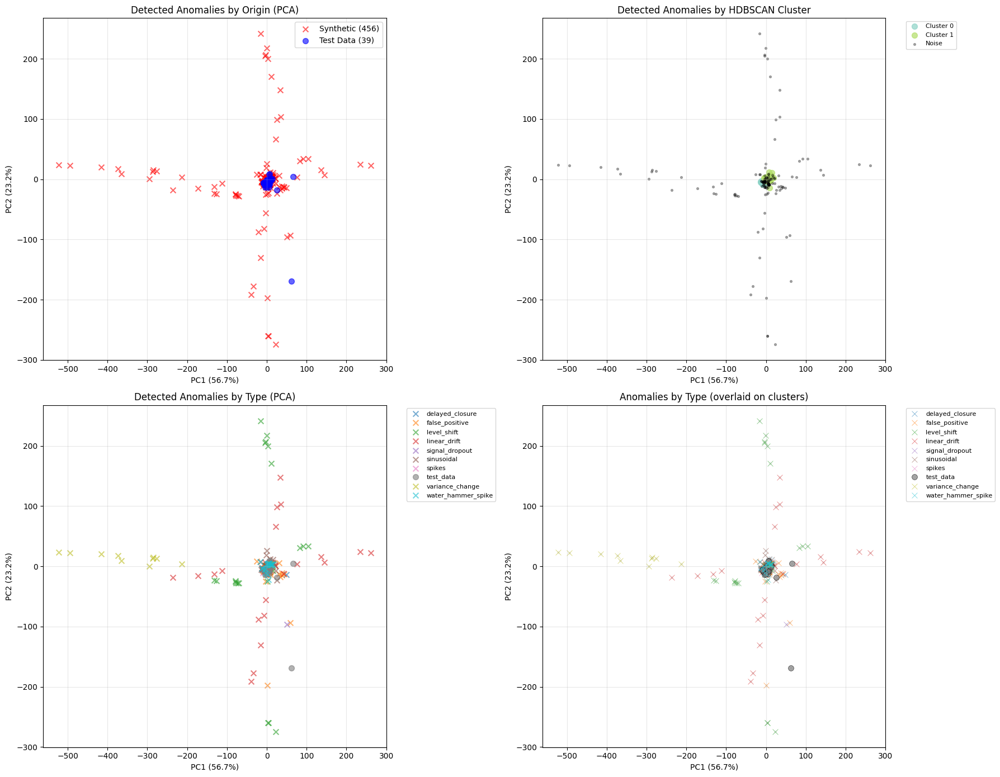


   6.2 Cluster composition by origin...


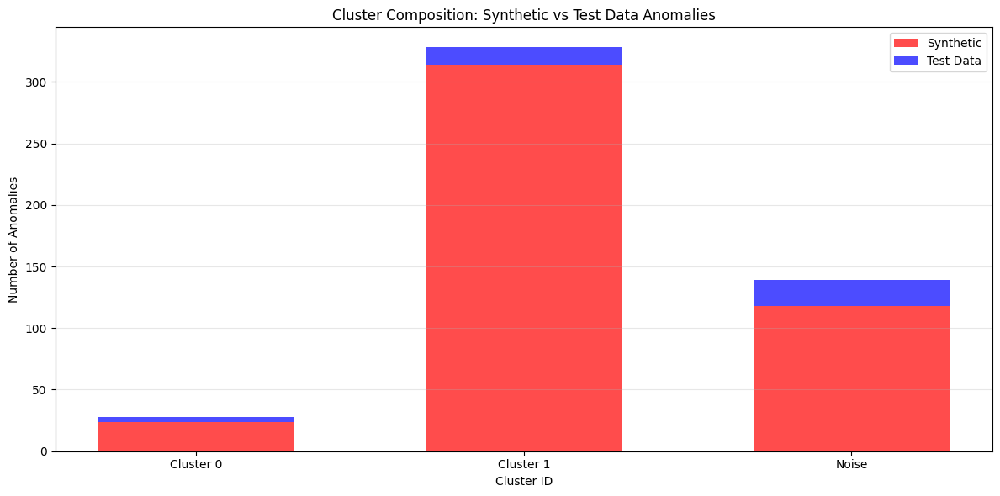


   6.2b Cluster composition by anomaly type (heatmap)...


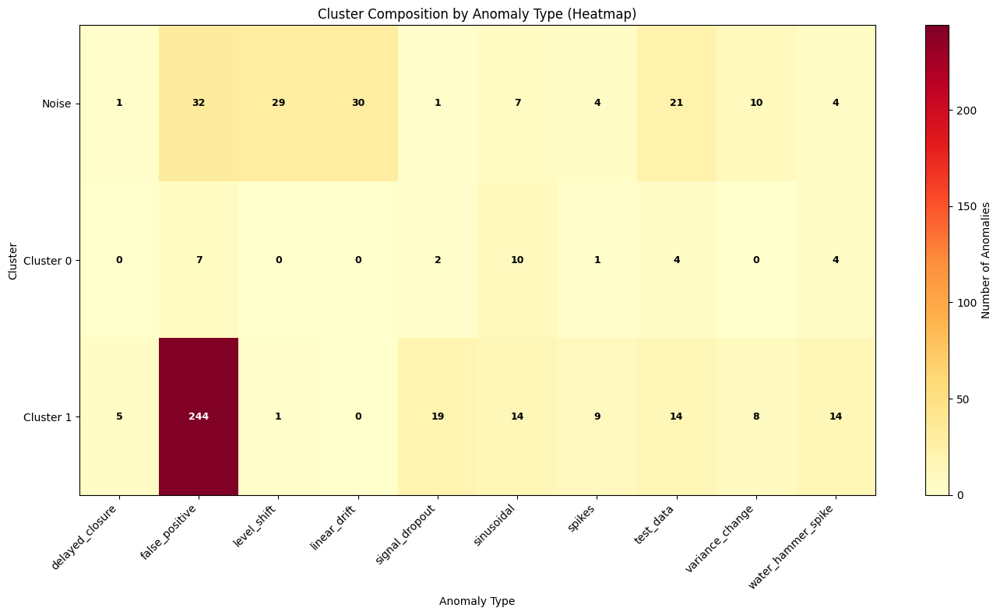


   6.3 Hierarchical clustering dendrogram...


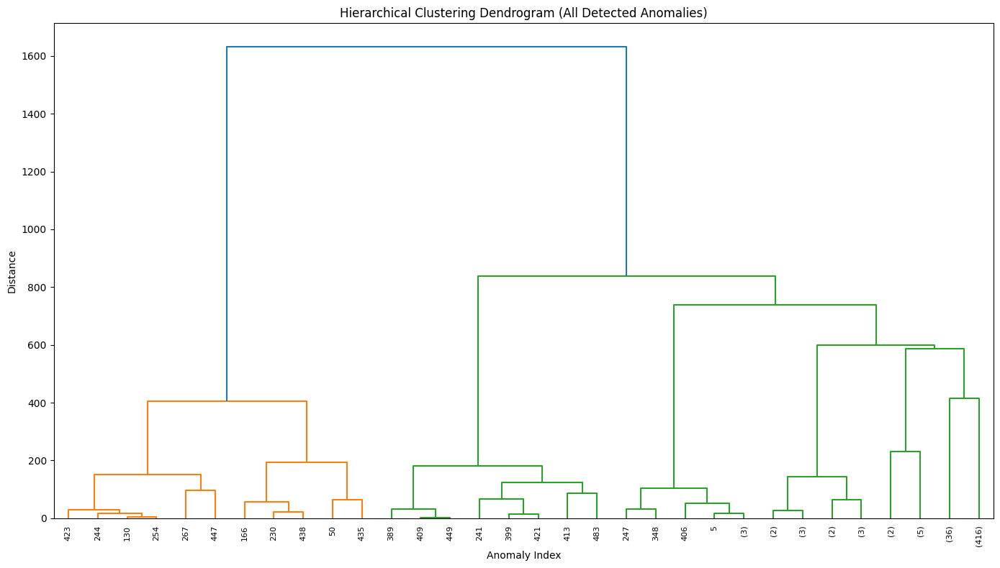


   6.4 Anomaly scores by cluster...


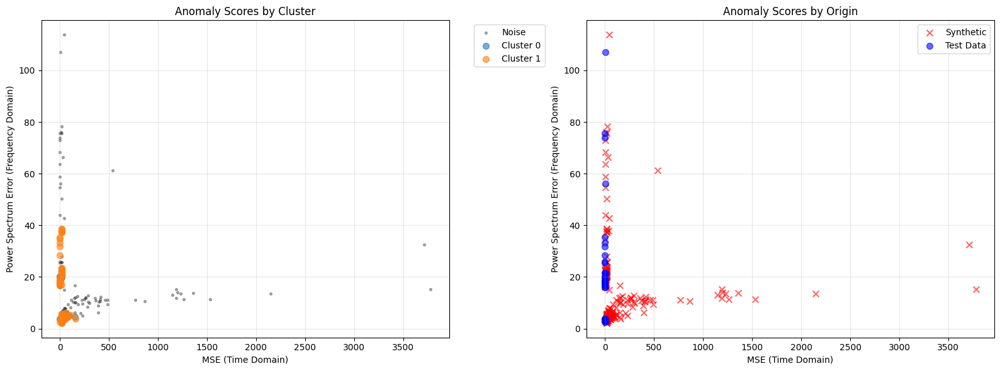


   6.5 Comparing clustering configurations...


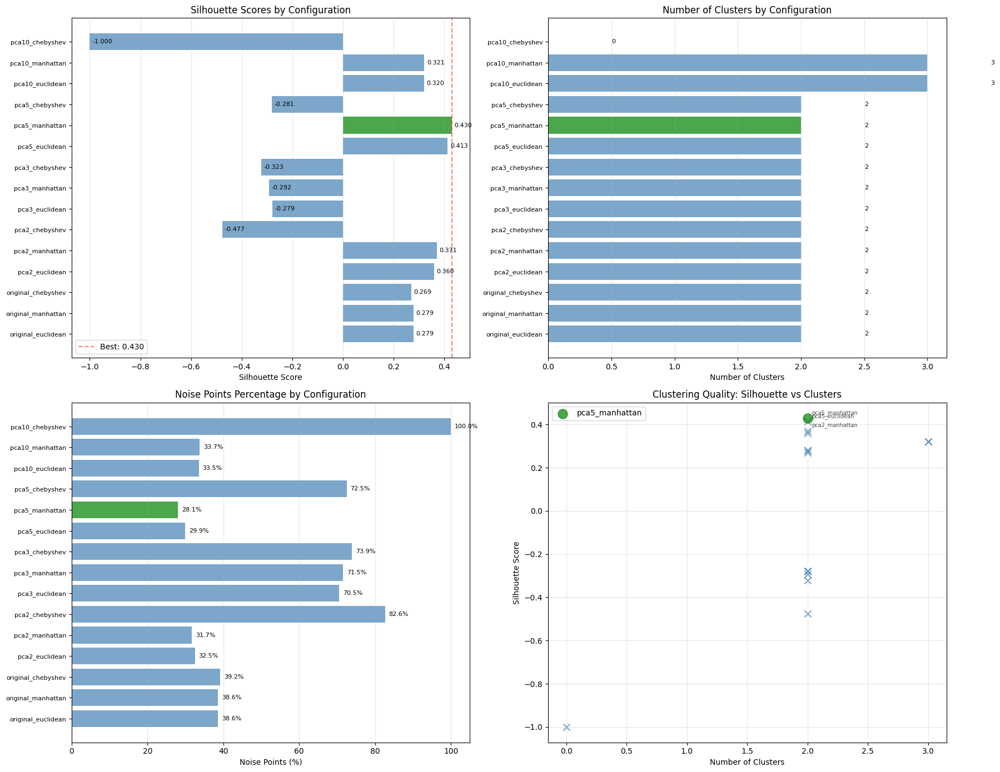


   6.6 Visualizing top 3 clustering configurations...


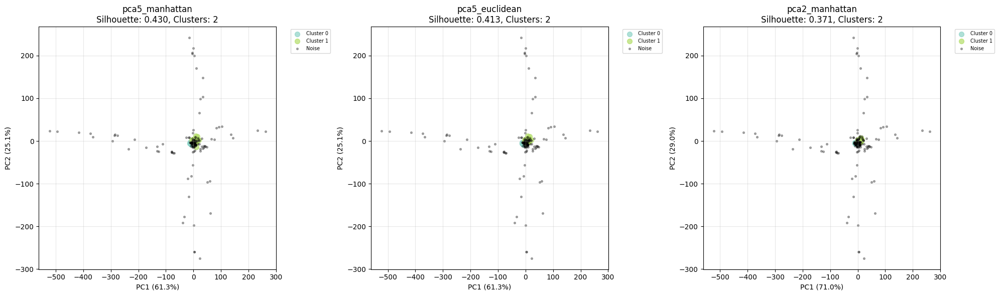


SUMMARY

Total Anomalies Detected:
  - Synthetic: 456
  - Test Data: 39
  - Total: 495

Clustering Results (HDBSCAN - Best Configuration):
  - Best configuration: pca5_manhattan
  - PCA dimension: 5
  - Distance metric: manhattan
  - Explained variance: 92.4%
  - Clusters: 2
  - Noise points: 139
  - Silhouette score: 0.430

  Total configurations tested: 15
  PCA dimensions tested: [2, 3, 5, 10]
  Distance metrics tested: ['euclidean', 'manhattan', 'cosine', 'chebyshev']

Cluster Composition (by Origin):
  Cluster 0: 28 anomalies (24 synthetic, 4 test)
  Cluster 1: 328 anomalies (314 synthetic, 14 test)

Cluster Composition (by Anomaly Type):
  Noise (-1): 139 anomalies [delayed_closure:1, false_positive:32, level_shift:29, linear_drift:30, signal_dropout:1, sinusoidal:7, spikes:4, test_data:21, variance_change:10, water_hammer_spike:4]
  Cluster 0: 28 anomalies [false_positive:7, signal_dropout:2, sinusoidal:10, spikes:1, test_data:4, water_hammer_spike:4]
  Cluster 1: 328 anomalies

In [18]:
# ==============================================================================
# UNIFIED ANOMALY DETECTION & CLUSTERING
# ==============================================================================
# This cell:
# 1. Loads test data windows
# 2. Applies the SAME detection logic (simple MSE + power spectrum with OR) to test data
# 3. Combines detected anomalies from both test data and synthetic anomalies
# 4. Clusters all detected anomalies together to find common patterns
#
# Requirements:
# - Run cell 21 first to train the combined autoencoder (model_combined, scaler_combined)
# - Run cell 28 first to get synthetic anomaly detection results
# ==============================================================================

import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import hdbscan

# Define SIGNALS (should match training cell)
# If SIGNALS is already defined from cell 21, this will just reassign it (no harm)
SIGNALS = ['active_power', 'ball_valve_closed', 'ball_valve_open',
           'guide_vane_position', 'water_pressure_downstream', 'water_pressure_upstream']
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist, squareform
import torch

print("="*70)
print("UNIFIED ANOMALY DETECTION & CLUSTERING")
print("="*70)
print("Assembling anomalies from both test data and synthetic anomalies")
print("Using IDENTICAL detection logic: Simple MSE + Power Spectrum (OR logic)")
print("="*70)

# ==============================================================================
# 1. LOAD TEST DATA
# ==============================================================================
print("\n1. Loading test data windows...")

# Use the same function as in training cell to load test windows
X_test_combined = load_combined_windows(split='testing')
print(f"   Test windows loaded: {len(X_test_combined) if X_test_combined is not None else 0}")

if X_test_combined is None or len(X_test_combined) == 0:
    print("   ⚠️  No test data available. Skipping unified detection.")
    raise ValueError("Test data not available. Please run the data loading cells first.")

# ==============================================================================
# 2. APPLY DETECTION TO TEST DATA (SAME LOGIC AS SYNTHETIC ANOMALIES)
# ==============================================================================
print("\n2. Applying detection to test data (using IDENTICAL logic as synthetic anomalies)...")

# Reuse the same compute_power_spectrum_error function from cell 28
from scipy.fft import fft
from scipy import signal as scipy_signal

def compute_power_spectrum_error(model, scaler, X_time, signal_names):
    """Compute power spectrum error - IDENTICAL to training cell."""
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    X_scaled = scaler.transform(X_time)
    model.eval()
    with torch.no_grad():
        recon_scaled, _ = model(torch.FloatTensor(X_scaled).to(device))
        recon_time = scaler.inverse_transform(recon_scaled.cpu().numpy())
    N = len(X_time)
    n_signals = len(signal_names)
    n_samples = 360
    X_3d = X_time.reshape(N, 360, n_signals)
    recon_3d = recon_time.reshape(N, 360, n_signals)
    power_spectrum_mse = np.zeros(N)
    for i in range(N):
        power_spectrum_errors = []
        for sig_idx in range(n_signals):
            sig_orig = X_3d[i, :, sig_idx]
            sig_orig_centered = sig_orig - np.mean(sig_orig)
            windowed_orig = sig_orig_centered * scipy_signal.windows.hann(len(sig_orig_centered))
            fft_orig = fft(windowed_orig)
            power_orig = np.abs(fft_orig) ** 2
            sig_recon = recon_3d[i, :, sig_idx]
            sig_recon_centered = sig_recon - np.mean(sig_recon)
            windowed_recon = sig_recon_centered * scipy_signal.windows.hann(len(sig_recon_centered))
            fft_recon = fft(windowed_recon)
            power_recon = np.abs(fft_recon) ** 2
            log_power_orig = np.log10(power_orig + 1e-10)
            log_power_recon = np.log10(power_recon + 1e-10)
            power_spectrum_errors.append(np.mean((log_power_orig - log_power_recon) ** 2))
        power_spectrum_mse[i] = np.mean(power_spectrum_errors)
    return power_spectrum_mse

# Use training data (from synthetic anomaly cell) as reference for thresholds
# We already computed thresholds in cell 28, so reuse them
# Use X_train_combined which was loaded earlier in the notebook
if 'X_train_combined' not in globals() or X_train_combined is None:
    raise ValueError("X_train_combined is not defined. Please run the cell that loads training windows first.")
X_train_for_threshold = X_train_combined  # Normal windows from training data

device = 'cuda' if torch.cuda.is_available() else 'cpu'
n_test = len(X_test_combined)

# Time domain detection (simple MSE - IDENTICAL)
print("\n   Computing time domain MSE for test data...")
X_train_scaled = scaler_combined.transform(X_train_for_threshold)
X_test_scaled = scaler_combined.transform(X_test_combined)
model_combined.eval()
with torch.no_grad():
    recon_train, _ = model_combined(torch.FloatTensor(X_train_scaled).to(device))
    mse_train = ((recon_train.cpu().numpy() - X_train_scaled) ** 2).mean(axis=1)
    recon_test, _ = model_combined(torch.FloatTensor(X_test_scaled).to(device))
    mse_test = ((recon_test.cpu().numpy() - X_test_scaled) ** 2).mean(axis=1)

mse_percentile = 95
mse_threshold = np.percentile(mse_train, mse_percentile)
time_domain_anomaly_test = mse_test > mse_threshold

# Frequency domain detection (power spectrum - IDENTICAL)
print("   Computing frequency domain power spectrum error for test data...")
power_spectrum_train_test = compute_power_spectrum_error(model_combined, scaler_combined, X_train_for_threshold, SIGNALS)
power_spectrum_test_data = compute_power_spectrum_error(model_combined, scaler_combined, X_test_combined, SIGNALS)
power_spectrum_percentile = 95
power_spectrum_threshold = np.percentile(power_spectrum_train_test, power_spectrum_percentile)
freq_domain_anomaly_test = power_spectrum_test_data > power_spectrum_threshold

# OR logic combination - IDENTICAL
is_anomaly_test = time_domain_anomaly_test | freq_domain_anomaly_test

print(f"\n   Test Data Detection Results:")
print(f"     Total test samples: {n_test}")
print(f"     Anomalies detected: {sum(is_anomaly_test)} ({100*sum(is_anomaly_test)/n_test:.1f}%)")
print(f"     - Time domain only: {sum(time_domain_anomaly_test & ~freq_domain_anomaly_test)}")
print(f"     - Frequency domain only: {sum(freq_domain_anomaly_test & ~time_domain_anomaly_test)}")
print(f"     - Both methods: {sum(time_domain_anomaly_test & freq_domain_anomaly_test)}")

# Get latent representations for test data
print("\n   Extracting latent representations for test data...")
model_combined.eval()
with torch.no_grad():
    _, latent_test = model_combined(torch.FloatTensor(X_test_scaled).to(device))
    latent_test = latent_test.cpu().numpy()

# ==============================================================================
# 3. COMBINE DETECTED ANOMALIES FROM BOTH SOURCES
# ==============================================================================
print("\n3. Combining detected anomalies from both sources...")

# Get detected anomalies from synthetic data (from cell 28)
# We already have is_anomaly from synthetic anomaly detection
# Extract only the detected ones
synthetic_anomaly_indices = np.where(is_anomaly)[0]  # From cell 28
synthetic_anomaly_latent = latent_anomalous[synthetic_anomaly_indices]  # From cell 28
synthetic_anomaly_mse = mse_anomalous[synthetic_anomaly_indices]  # From cell 28
# Note: power_spectrum_test from cell 28 is for X_anomalous_analog (all windows)
# We need to index it with synthetic_anomaly_indices
synthetic_anomaly_power_spectrum = power_spectrum_test[synthetic_anomaly_indices]  # From cell 28

# Map synthetic anomalies to their types using anomaly_metadata from cell 28
print("\n   Mapping synthetic anomalies to their types...")
# Create a mapping from window_idx to anomaly_type
window_to_anomaly_type = {}
window_to_signal = {}
for meta in anomaly_metadata:  # From cell 28
    win_idx = meta['window_idx']
    window_to_anomaly_type[win_idx] = meta.get('anomaly_type', 'unknown')
    window_to_signal[win_idx] = meta.get('signal', 'unknown')

# Get anomaly types for detected synthetic anomalies
# Note: is_anomalous (from cell 28) is the ground truth - windows that actually had anomalies injected
# If a window is flagged as anomaly but not in metadata, it's either:
# 1. A normal window incorrectly flagged (false positive) - is_anomalous[idx] == False
# 2. A bug - is_anomalous[idx] == True but no metadata (shouldn't happen)
synthetic_anomaly_types = []
synthetic_anomaly_signals = []
false_positives = 0
missing_metadata = 0

for idx in synthetic_anomaly_indices:
    if idx in window_to_anomaly_type:
        # Window has metadata - it's a real injected anomaly
        anomaly_type = window_to_anomaly_type[idx]
        signal = window_to_signal[idx]
    else:
        # Window doesn't have metadata - check if it's a false positive
        if idx < len(is_anomalous) and not is_anomalous[idx]:
            # This is a normal window that was incorrectly flagged (false positive)
            anomaly_type = 'false_positive'
            signal = 'unknown'
            false_positives += 1
        else:
            # This shouldn't happen - window marked as anomalous but no metadata
            anomaly_type = 'missing_metadata'
            signal = 'unknown'
            missing_metadata += 1
    
    synthetic_anomaly_types.append(anomaly_type)
    synthetic_anomaly_signals.append(signal)

synthetic_anomaly_types = np.array(synthetic_anomaly_types)
synthetic_anomaly_signals = np.array(synthetic_anomaly_signals)

print(f"   Synthetic anomaly types distribution:")
unique_types, type_counts = np.unique(synthetic_anomaly_types, return_counts=True)
for anom_type, count in zip(unique_types, type_counts):
    print(f"     {anom_type}: {count}")

if false_positives > 0:
    print(f"\n   ⚠️  Found {false_positives} false positives (normal windows incorrectly flagged as anomalies)")
if missing_metadata > 0:
    print(f"   ⚠️  Found {missing_metadata} windows with missing metadata (shouldn't happen)")

# Get detected anomalies from test data
test_anomaly_indices = np.where(is_anomaly_test)[0]
test_anomaly_latent = latent_test[test_anomaly_indices]
test_anomaly_mse = mse_test[test_anomaly_indices]
test_anomaly_power_spectrum = power_spectrum_test_data[test_anomaly_indices]

print(f"   Synthetic anomalies detected: {len(synthetic_anomaly_indices)}")
print(f"   Test data anomalies detected: {len(test_anomaly_indices)}")
print(f"   Total anomalies to cluster: {len(synthetic_anomaly_indices) + len(test_anomaly_indices)}")

# Combine latent representations
all_anomaly_latent = np.vstack([synthetic_anomaly_latent, test_anomaly_latent])

# Create origin labels (0 = synthetic, 1 = test)
anomaly_origins = np.concatenate([
    np.zeros(len(synthetic_anomaly_indices), dtype=int),  # Synthetic
    np.ones(len(test_anomaly_indices), dtype=int)  # Test
])

# Create anomaly type labels (for synthetic: actual type, for test: 'test_data')
all_anomaly_types = np.concatenate([
    synthetic_anomaly_types,  # Synthetic anomaly types
    np.array(['test_data'] * len(test_anomaly_indices))  # Test data labeled as 'test_data'
])

# Create signal labels (for synthetic: actual signal, for test: 'test_data')
all_anomaly_signals = np.concatenate([
    synthetic_anomaly_signals,  # Synthetic anomaly signals
    np.array(['test_data'] * len(test_anomaly_indices))  # Test data labeled as 'test_data'
])

# Combine metadata
all_anomaly_mse = np.concatenate([synthetic_anomaly_mse, test_anomaly_mse])
all_anomaly_power_spectrum = np.concatenate([synthetic_anomaly_power_spectrum, test_anomaly_power_spectrum])

print(f"   Combined latent space shape: {all_anomaly_latent.shape}")
print(f"   Total anomaly types: {len(np.unique(all_anomaly_types))}")
print(f"     Synthetic types: {len(np.unique(synthetic_anomaly_types))}")
print(f"     Test data: 1 type ('test_data')")

# ==============================================================================
# 4. CLUSTERING ALL DETECTED ANOMALIES
# ==============================================================================
# Test multiple PCA dimensions and distance metrics
print("\n4. Clustering all detected anomalies...")
print("   Testing multiple PCA dimensions and distance metrics...")

# Test different PCA dimensions
pca_dimensions_to_test = [2, 3, 5, 10, None]  # None = use full latent space
distance_metrics = ['euclidean', 'manhattan', 'cosine', 'chebyshev']

# Store results for comparison
clustering_results = {}

# Original latent space (for comparison)
print("\n   Using original latent space (no PCA)...")
min_cluster_size = max(5, int(len(all_anomaly_latent) * 0.05))

# Test each distance metric on original space
for metric in distance_metrics:
    print(f"\n     Testing HDBSCAN with {metric} distance...")
    try:
        clusterer = hdbscan.HDBSCAN(
            min_cluster_size=min_cluster_size,
            metric=metric,
            cluster_selection_method='eom'
        )
        labels = clusterer.fit_predict(all_anomaly_latent)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = sum(labels == -1)
        sil_score = silhouette_score(all_anomaly_latent, labels) if n_clusters > 1 else -1
        clustering_results[f'original_{metric}'] = {
            'labels': labels,
            'n_clusters': n_clusters,
            'n_noise': n_noise,
            'silhouette': sil_score,
            'pca_dim': None,
            'metric': metric
        }
        print(f"       Clusters: {n_clusters}, Noise: {n_noise}, Silhouette: {sil_score:.3f}")
    except Exception as e:
        print(f"       Error with {metric}: {e}")

# Test different PCA dimensions
for pca_dim in pca_dimensions_to_test:
    if pca_dim is None:
        continue  # Already tested above
    
    print(f"\n   Testing with PCA dimension = {pca_dim}...")
    pca = PCA(n_components=min(pca_dim, all_anomaly_latent.shape[1]))
    latent_pca_reduced = pca.fit_transform(all_anomaly_latent)
    explained_var = pca.explained_variance_ratio_.sum()
    print(f"     Explained variance: {explained_var*100:.1f}%")
    
    # Test each distance metric on PCA-reduced space
    for metric in distance_metrics:
        print(f"     Testing HDBSCAN with {metric} distance on {pca_dim}D PCA...")
        try:
            clusterer = hdbscan.HDBSCAN(
                min_cluster_size=min_cluster_size,
                metric=metric,
                cluster_selection_method='eom'
            )
            labels = clusterer.fit_predict(latent_pca_reduced)
            n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
            n_noise = sum(labels == -1)
            sil_score = silhouette_score(latent_pca_reduced, labels) if n_clusters > 1 else -1
            clustering_results[f'pca{pca_dim}_{metric}'] = {
                'labels': labels,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'silhouette': sil_score,
                'pca_dim': pca_dim,
                'metric': metric,
                'latent_pca': latent_pca_reduced,
                'explained_var': explained_var
            }
            print(f"       Clusters: {n_clusters}, Noise: {n_noise}, Silhouette: {sil_score:.3f}")
        except Exception as e:
            print(f"       Error with {metric}: {e}")

# Find best configuration
print("\n   Finding best clustering configuration...")
best_config = max(clustering_results.items(), key=lambda x: x[1]['silhouette'])
best_name, best_result = best_config
print(f"\n   Best configuration: {best_name}")
print(f"     Silhouette score: {best_result['silhouette']:.3f}")
print(f"     Clusters: {best_result['n_clusters']}")
print(f"     Noise points: {best_result['n_noise']}")
print(f"     PCA dimension: {best_result['pca_dim']}")
print(f"     Distance metric: {best_result['metric']}")

# Use best configuration for further analysis
hdbscan_labels = best_result['labels']
n_clusters_hdbscan = best_result['n_clusters']
n_noise_hdbscan = best_result['n_noise']
silhouette_hdbscan = best_result['silhouette']

# Also compute KMeans on best space
print(f"\n   Computing KMeans on best space ({best_name})...")
if best_result['pca_dim'] is not None:
    best_latent = best_result['latent_pca']
else:
    best_latent = all_anomaly_latent

n_clusters_kmeans = min(10, max(3, n_clusters_hdbscan if n_clusters_hdbscan > 0 else 5))
kmeans = KMeans(n_clusters=n_clusters_kmeans, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(best_latent)
silhouette_kmeans = silhouette_score(best_latent, kmeans_labels) if n_clusters_kmeans > 1 else -1
print(f"     KMeans: {n_clusters_kmeans} clusters, Silhouette: {silhouette_kmeans:.3f}")

# Hierarchical clustering on best space
print(f"\n   Computing Hierarchical clustering on best space...")
linkage_matrix = linkage(best_latent, method='ward')
print(f"     Linkage matrix computed")

print(f"\n   Final Silhouette Scores:")
print(f"     HDBSCAN ({best_name}): {silhouette_hdbscan:.3f}")
print(f"     KMeans: {silhouette_kmeans:.3f}")

# Create comparison table
print("\n   Clustering Results Comparison:")
print(f"   {'Configuration':<25} | {'Clusters':>8} | {'Noise':>8} | {'Silhouette':>10}")
print("   " + "-"*60)
for name, result in sorted(clustering_results.items(), key=lambda x: x[1]['silhouette'], reverse=True):
    print(f"   {name:<25} | {result['n_clusters']:>8} | {result['n_noise']:>8} | {result['silhouette']:>10.3f}")

# ==============================================================================
# 5. ANALYZE CLUSTER COMPOSITION
# ==============================================================================
print("\n5. Analyzing cluster composition...")

# Analyze HDBSCAN clusters by origin
print("\n   HDBSCAN Cluster Composition (by Origin):")
for cluster_id in sorted(set(hdbscan_labels)):
    if cluster_id == -1:
        continue
    cluster_mask = hdbscan_labels == cluster_id
    n_synthetic = sum(anomaly_origins[cluster_mask] == 0)
    n_test = sum(anomaly_origins[cluster_mask] == 1)
    print(f"     Cluster {cluster_id}: {sum(cluster_mask)} anomalies ({n_synthetic} synthetic, {n_test} test)")

# Analyze noise points
noise_mask = hdbscan_labels == -1
if sum(noise_mask) > 0:
    n_synthetic_noise = sum(anomaly_origins[noise_mask] == 0)
    n_test_noise = sum(anomaly_origins[noise_mask] == 1)
    print(f"     Noise (-1): {sum(noise_mask)} anomalies ({n_synthetic_noise} synthetic, {n_test_noise} test)")

# Analyze HDBSCAN clusters by anomaly type
print("\n   HDBSCAN Cluster Composition (by Anomaly Type):")
for cluster_id in sorted(set(hdbscan_labels)):
    if cluster_id == -1:
        continue
    cluster_mask = hdbscan_labels == cluster_id
    cluster_types = all_anomaly_types[cluster_mask]
    unique_types, type_counts = np.unique(cluster_types, return_counts=True)
    type_str = ", ".join([f"{t}:{c}" for t, c in zip(unique_types, type_counts)])
    print(f"     Cluster {cluster_id}: {sum(cluster_mask)} anomalies [{type_str}]")

# Analyze noise points by type
if sum(noise_mask) > 0:
    noise_types = all_anomaly_types[noise_mask]
    unique_noise_types, noise_type_counts = np.unique(noise_types, return_counts=True)
    noise_type_str = ", ".join([f"{t}:{c}" for t, c in zip(unique_noise_types, noise_type_counts)])
    print(f"     Noise (-1): {sum(noise_mask)} anomalies [{noise_type_str}]")

# Cross-tabulation: Cluster vs Anomaly Type
print("\n   Cross-tabulation: Cluster × Anomaly Type")
print("     " + " " * 20, end="")
all_unique_types = np.unique(all_anomaly_types)
for anom_type in sorted(all_unique_types):
    print(f"{anom_type:>15}", end="")
print()
for cluster_id in sorted(set(hdbscan_labels)):
    cluster_mask = hdbscan_labels == cluster_id
    cluster_label = f"Cluster {cluster_id}" if cluster_id != -1 else "Noise (-1)"
    print(f"     {cluster_label:<20}", end="")
    for anom_type in sorted(all_unique_types):
        count = sum((cluster_mask) & (all_anomaly_types == anom_type))
        print(f"{count:>15}", end="")
    print(f"  (Total: {sum(cluster_mask)})")

# ==============================================================================
# 6. VISUALIZATIONS
# ==============================================================================
print("\n6. Generating visualizations...")

# 6.1 PCA Visualization by Origin, Cluster, and Anomaly Type
print("\n   6.1 PCA visualization...")
# Use 2D PCA for visualization (regardless of best configuration)
pca_2d = PCA(n_components=2)
latent_pca = pca_2d.fit_transform(all_anomaly_latent)

fig, axes = plt.subplots(2, 2, figsize=(18, 14))

# Plot by origin
ax = axes[0, 0]
synthetic_mask = anomaly_origins == 0
test_mask = anomaly_origins == 1
ax.scatter(latent_pca[synthetic_mask, 0], latent_pca[synthetic_mask, 1], 
           c='red', alpha=0.6, s=50, label=f'Synthetic ({sum(synthetic_mask)})', marker='x')
ax.scatter(latent_pca[test_mask, 0], latent_pca[test_mask, 1], 
           c='blue', alpha=0.6, s=50, label=f'Test Data ({sum(test_mask)})', marker='o')
ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)')
ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)')
ax.set_title('Detected Anomalies by Origin (PCA)')
ax.legend()
ax.grid(True, alpha=0.3)

# Plot by HDBSCAN cluster
ax = axes[0, 1]
unique_labels = set(hdbscan_labels)
colors = plt.cm.Set3(np.linspace(0, 1, len(unique_labels)))
for label, color in zip(unique_labels, colors):
    if label == -1:
        mask = hdbscan_labels == label
        ax.scatter(latent_pca[mask, 0], latent_pca[mask, 1], 
                  c='black', alpha=0.3, s=30, label='Noise', marker='.')
    else:
        mask = hdbscan_labels == label
        ax.scatter(latent_pca[mask, 0], latent_pca[mask, 1], 
                  c=[color], alpha=0.7, s=50, label=f'Cluster {label}')
ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)')
ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)')
ax.set_title('Detected Anomalies by HDBSCAN Cluster')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
ax.grid(True, alpha=0.3)

# Plot by anomaly type (synthetic types + test_data)
ax = axes[1, 0]
unique_types = np.unique(all_anomaly_types)
type_colors = plt.cm.tab10(np.linspace(0, 1, len(unique_types)))
for anom_type, color in zip(unique_types, type_colors):
    mask = all_anomaly_types == anom_type
    marker = 'x' if anom_type != 'test_data' else 'o'
    ax.scatter(latent_pca[mask, 0], latent_pca[mask, 1], 
              c=[color], alpha=0.6, s=50, label=anom_type, marker=marker)
ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)')
ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)')
ax.set_title('Detected Anomalies by Type (PCA)')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
ax.grid(True, alpha=0.3)

# Plot by cluster with type colors (overlay)
ax = axes[1, 1]
# First plot clusters as background
for label in unique_labels:
    if label == -1:
        mask = hdbscan_labels == label
        ax.scatter(latent_pca[mask, 0], latent_pca[mask, 1], 
                  c='lightgray', alpha=0.3, s=30, marker='.')
    else:
        mask = hdbscan_labels == label
        ax.scatter(latent_pca[mask, 0], latent_pca[mask, 1], 
                  c='lightblue', alpha=0.2, s=50, marker='o')
# Then overlay by type
for anom_type, color in zip(unique_types, type_colors):
    mask = all_anomaly_types == anom_type
    marker = 'x' if anom_type != 'test_data' else 'o'
    ax.scatter(latent_pca[mask, 0], latent_pca[mask, 1], 
              c=[color], alpha=0.7, s=50, label=anom_type, marker=marker, edgecolors='black', linewidths=0.5)
ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)')
ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)')
ax.set_title('Anomalies by Type (overlaid on clusters)')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('anomalies_added/unified_clustering_by_origin_and_type.png', dpi=150, bbox_inches='tight')
plt.show()

# 6.2 Stacked Bar Chart: Cluster Composition by Origin
print("\n   6.2 Cluster composition by origin...")
fig, ax = plt.subplots(figsize=(12, 6))

cluster_ids = sorted([c for c in set(hdbscan_labels) if c != -1])
if len(cluster_ids) > 0:
    synthetic_counts = [sum((hdbscan_labels == c) & (anomaly_origins == 0)) for c in cluster_ids]
    test_counts = [sum((hdbscan_labels == c) & (anomaly_origins == 1)) for c in cluster_ids]
    
    x = np.arange(len(cluster_ids))
    width = 0.6
    
    ax.bar(x, synthetic_counts, width, label='Synthetic', color='red', alpha=0.7)
    ax.bar(x, test_counts, width, bottom=synthetic_counts, label='Test Data', color='blue', alpha=0.7)
    
    ax.set_xlabel('Cluster ID')
    ax.set_ylabel('Number of Anomalies')
    ax.set_title('Cluster Composition: Synthetic vs Test Data Anomalies')
    ax.set_xticks(x)
    ax.set_xticklabels([f'Cluster {c}' for c in cluster_ids])
    ax.legend()
    ax.grid(True, alpha=0.3, axis='y')
    
    # Add noise bar
    if -1 in hdbscan_labels:
        noise_synthetic = sum((hdbscan_labels == -1) & (anomaly_origins == 0))
        noise_test = sum((hdbscan_labels == -1) & (anomaly_origins == 1))
        ax.bar(len(cluster_ids), noise_synthetic, width, color='red', alpha=0.7)
        ax.bar(len(cluster_ids), noise_test, width, bottom=noise_synthetic, color='blue', alpha=0.7)
        ax.set_xticks(list(x) + [len(cluster_ids)])
        ax.set_xticklabels([f'Cluster {c}' for c in cluster_ids] + ['Noise'])

plt.tight_layout()
plt.savefig('anomalies_added/unified_cluster_composition_by_origin.png', dpi=150, bbox_inches='tight')
plt.show()

# 6.2b Heatmap: Cluster × Anomaly Type
print("\n   6.2b Cluster composition by anomaly type (heatmap)...")
fig, ax = plt.subplots(figsize=(14, 8))

# Create cross-tabulation matrix
all_cluster_ids = sorted(set(hdbscan_labels))
cluster_labels = [f'Cluster {c}' if c != -1 else 'Noise' for c in all_cluster_ids]
unique_types_sorted = sorted(np.unique(all_anomaly_types))

# Build matrix
heatmap_data = []
for cluster_id in all_cluster_ids:
    cluster_mask = hdbscan_labels == cluster_id
    row = []
    for anom_type in unique_types_sorted:
        count = sum((cluster_mask) & (all_anomaly_types == anom_type))
        row.append(count)
    heatmap_data.append(row)

heatmap_data = np.array(heatmap_data)

# Plot heatmap
im = ax.imshow(heatmap_data, cmap='YlOrRd', aspect='auto')
ax.set_xticks(np.arange(len(unique_types_sorted)))
ax.set_yticks(np.arange(len(cluster_labels)))
ax.set_xticklabels(unique_types_sorted, rotation=45, ha='right')
ax.set_yticklabels(cluster_labels)
ax.set_xlabel('Anomaly Type')
ax.set_ylabel('Cluster')
ax.set_title('Cluster Composition by Anomaly Type (Heatmap)')

# Add text annotations
for i in range(len(cluster_labels)):
    for j in range(len(unique_types_sorted)):
        text = ax.text(j, i, heatmap_data[i, j],
                      ha="center", va="center", color="black" if heatmap_data[i, j] < heatmap_data.max()/2 else "white",
                      fontsize=9, fontweight='bold')

plt.colorbar(im, ax=ax, label='Number of Anomalies')
plt.tight_layout()
plt.savefig('anomalies_added/unified_cluster_composition_by_type_heatmap.png', dpi=150, bbox_inches='tight')
plt.show()

# 6.3 Dendrogram
print("\n   6.3 Hierarchical clustering dendrogram...")
fig, ax = plt.subplots(figsize=(14, 8))
dendrogram(linkage_matrix, ax=ax, truncate_mode='level', p=5, leaf_rotation=90, leaf_font_size=8)
ax.set_xlabel('Anomaly Index')
ax.set_ylabel('Distance')
ax.set_title('Hierarchical Clustering Dendrogram (All Detected Anomalies)')
plt.tight_layout()
plt.savefig('anomalies_added/unified_dendrogram.png', dpi=150, bbox_inches='tight')
plt.show()

# 6.4 MSE and Power Spectrum by Cluster
print("\n   6.4 Anomaly scores by cluster...")
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# MSE by cluster
ax = axes[0]
for cluster_id in sorted(set(hdbscan_labels)):
    if cluster_id == -1:
        mask = hdbscan_labels == cluster_id
        ax.scatter(all_anomaly_mse[mask], all_anomaly_power_spectrum[mask], 
                  c='black', alpha=0.3, s=30, label='Noise', marker='.')
    else:
        mask = hdbscan_labels == cluster_id
        ax.scatter(all_anomaly_mse[mask], all_anomaly_power_spectrum[mask], 
                  alpha=0.6, s=50, label=f'Cluster {cluster_id}')
ax.set_xlabel('MSE (Time Domain)')
ax.set_ylabel('Power Spectrum Error (Frequency Domain)')
ax.set_title('Anomaly Scores by Cluster')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(True, alpha=0.3)

# MSE by origin
ax = axes[1]
ax.scatter(all_anomaly_mse[synthetic_mask], all_anomaly_power_spectrum[synthetic_mask], 
          c='red', alpha=0.6, s=50, label='Synthetic', marker='x')
ax.scatter(all_anomaly_mse[test_mask], all_anomaly_power_spectrum[test_mask], 
          c='blue', alpha=0.6, s=50, label='Test Data', marker='o')
ax.set_xlabel('MSE (Time Domain)')
ax.set_ylabel('Power Spectrum Error (Frequency Domain)')
ax.set_title('Anomaly Scores by Origin')
ax.legend()
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('anomalies_added/unified_anomaly_scores.png', dpi=150, bbox_inches='tight')
plt.show()

# 6.5 Comparison of Clustering Configurations
print("\n   6.5 Comparing clustering configurations...")
fig, axes = plt.subplots(2, 2, figsize=(18, 14))

# Plot 1: Silhouette scores by configuration
ax = axes[0, 0]
config_names = list(clustering_results.keys())
silhouette_scores = [r['silhouette'] for r in clustering_results.values()]
colors_sil = ['green' if name == best_name else 'steelblue' for name in config_names]
bars = ax.barh(range(len(config_names)), silhouette_scores, color=colors_sil, alpha=0.7)
ax.set_yticks(range(len(config_names)))
ax.set_yticklabels(config_names, fontsize=8)
ax.set_xlabel('Silhouette Score')
ax.set_title('Silhouette Scores by Configuration')
ax.axvline(silhouette_hdbscan, color='red', linestyle='--', alpha=0.5, label=f'Best: {silhouette_hdbscan:.3f}')
ax.legend()
ax.grid(True, alpha=0.3, axis='x')
# Add value labels
for i, (bar, score) in enumerate(zip(bars, silhouette_scores)):
    ax.text(score + 0.01, i, f'{score:.3f}', va='center', fontsize=8)

# Plot 2: Number of clusters by configuration
ax = axes[0, 1]
n_clusters_list = [r['n_clusters'] for r in clustering_results.values()]
colors_clust = ['green' if name == best_name else 'steelblue' for name in config_names]
bars = ax.barh(range(len(config_names)), n_clusters_list, color=colors_clust, alpha=0.7)
ax.set_yticks(range(len(config_names)))
ax.set_yticklabels(config_names, fontsize=8)
ax.set_xlabel('Number of Clusters')
ax.set_title('Number of Clusters by Configuration')
ax.grid(True, alpha=0.3, axis='x')
# Add value labels
for i, (bar, n_clust) in enumerate(zip(bars, n_clusters_list)):
    ax.text(n_clust + 0.5, i, f'{n_clust}', va='center', fontsize=8)

# Plot 3: Noise points percentage by configuration
ax = axes[1, 0]
n_noise_list = [r['n_noise'] for r in clustering_results.values()]
noise_pct_list = [100 * n / len(all_anomaly_latent) for n in n_noise_list]
colors_noise = ['green' if name == best_name else 'steelblue' for name in config_names]
bars = ax.barh(range(len(config_names)), noise_pct_list, color=colors_noise, alpha=0.7)
ax.set_yticks(range(len(config_names)))
ax.set_yticklabels(config_names, fontsize=8)
ax.set_xlabel('Noise Points (%)')
ax.set_title('Noise Points Percentage by Configuration')
ax.grid(True, alpha=0.3, axis='x')
# Add value labels
for i, (bar, pct) in enumerate(zip(bars, noise_pct_list)):
    ax.text(pct + 1, i, f'{pct:.1f}%', va='center', fontsize=8)

# Plot 4: Scatter: Silhouette vs Clusters
ax = axes[1, 1]
for name, result in clustering_results.items():
    color = 'green' if name == best_name else 'steelblue'
    marker = 'o' if name == best_name else 'x'
    size = 150 if name == best_name else 80
    ax.scatter(result['n_clusters'], result['silhouette'], 
              c=color, marker=marker, s=size, alpha=0.7, label=name if name == best_name else None)
ax.set_xlabel('Number of Clusters')
ax.set_ylabel('Silhouette Score')
ax.set_title('Clustering Quality: Silhouette vs Clusters')
ax.legend()
ax.grid(True, alpha=0.3)
# Add labels for top 3 configurations
top_3 = sorted(clustering_results.items(), key=lambda x: x[1]['silhouette'], reverse=True)[:3]
for name, result in top_3:
    ax.annotate(name, (result['n_clusters'], result['silhouette']), 
               fontsize=7, alpha=0.7, xytext=(5, 5), textcoords='offset points')

plt.tight_layout()
plt.savefig('anomalies_added/unified_clustering_config_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

# 6.6 Visualize top 3 configurations side by side
print("\n   6.6 Visualizing top 3 clustering configurations...")
top_3_configs = sorted(clustering_results.items(), key=lambda x: x[1]['silhouette'], reverse=True)[:3]

fig, axes = plt.subplots(1, 3, figsize=(20, 6))

for idx, (name, result) in enumerate(top_3_configs):
    ax = axes[idx]
    
    # Get 2D PCA for visualization
    if result['pca_dim'] is not None and result['pca_dim'] >= 2:
        # Use stored PCA if available
        if 'latent_pca' in result:
            pca_viz = PCA(n_components=2)
            latent_viz = pca_viz.fit_transform(result['latent_pca'])
        else:
            pca_viz = PCA(n_components=2)
            latent_viz = pca_viz.fit_transform(all_anomaly_latent)
    else:
        # Use full space, compute 2D PCA for viz
        pca_viz = PCA(n_components=2)
        latent_viz = pca_viz.fit_transform(all_anomaly_latent)
    
    labels = result['labels']
    unique_labels = set(labels)
    colors = plt.cm.Set3(np.linspace(0, 1, len(unique_labels)))
    
    for label, color in zip(unique_labels, colors):
        if label == -1:
            mask = labels == label
            ax.scatter(latent_viz[mask, 0], latent_viz[mask, 1], 
                      c='black', alpha=0.3, s=30, label='Noise', marker='.')
        else:
            mask = labels == label
            ax.scatter(latent_viz[mask, 0], latent_viz[mask, 1], 
                      c=[color], alpha=0.7, s=50, label=f'Cluster {label}')
    
    ax.set_xlabel(f'PC1 ({pca_viz.explained_variance_ratio_[0]*100:.1f}%)')
    ax.set_ylabel(f'PC2 ({pca_viz.explained_variance_ratio_[1]*100:.1f}%)')
    ax.set_title(f'{name}\nSilhouette: {result["silhouette"]:.3f}, Clusters: {result["n_clusters"]}')
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=7)
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('anomalies_added/unified_clustering_top3_configs.png', dpi=150, bbox_inches='tight')
plt.show()

# ==============================================================================
# 7. SUMMARY
# ==============================================================================
print("\n" + "="*70)
print("SUMMARY")
print("="*70)
print(f"\nTotal Anomalies Detected:")
print(f"  - Synthetic: {len(synthetic_anomaly_indices)}")
print(f"  - Test Data: {len(test_anomaly_indices)}")
print(f"  - Total: {len(all_anomaly_latent)}")

print(f"\nClustering Results (HDBSCAN - Best Configuration):")
print(f"  - Best configuration: {best_name}")
print(f"  - PCA dimension: {best_result['pca_dim'] if best_result['pca_dim'] is not None else 'Full latent space'}")
print(f"  - Distance metric: {best_result['metric']}")
if best_result['pca_dim'] is not None:
    print(f"  - Explained variance: {best_result['explained_var']*100:.1f}%")
print(f"  - Clusters: {n_clusters_hdbscan}")
print(f"  - Noise points: {n_noise_hdbscan}")
print(f"  - Silhouette score: {silhouette_hdbscan:.3f}")
print(f"\n  Total configurations tested: {len(clustering_results)}")
print(f"  PCA dimensions tested: {[d for d in pca_dimensions_to_test if d is not None]}")
print(f"  Distance metrics tested: {distance_metrics}")

print(f"\nCluster Composition (by Origin):")
for cluster_id in sorted(set(hdbscan_labels)):
    if cluster_id == -1:
        continue
    cluster_mask = hdbscan_labels == cluster_id
    n_synthetic = sum(anomaly_origins[cluster_mask] == 0)
    n_test = sum(anomaly_origins[cluster_mask] == 1)
    print(f"  Cluster {cluster_id}: {sum(cluster_mask)} anomalies ({n_synthetic} synthetic, {n_test} test)")

print(f"\nCluster Composition (by Anomaly Type):")
for cluster_id in sorted(set(hdbscan_labels)):
    if cluster_id == -1:
        cluster_label = "Noise (-1)"
    else:
        cluster_label = f"Cluster {cluster_id}"
    cluster_mask = hdbscan_labels == cluster_id
    cluster_types = all_anomaly_types[cluster_mask]
    unique_types, type_counts = np.unique(cluster_types, return_counts=True)
    type_str = ", ".join([f"{t}:{c}" for t, c in zip(unique_types, type_counts)])
    print(f"  {cluster_label}: {sum(cluster_mask)} anomalies [{type_str}]")

print("\n✅ All visualizations saved to 'anomalies_added/' folder")
print("="*70)


# Two encoders - One binary and one for analog signals

DUAL ENCODER: SYNTHETIC ANOMALY TESTING + CLUSTERING
Using dual encoder models: ['boolean', 'analog']

1. LOADING SYNTHETIC ANOMALIES
   Loading from anomalies_added/anomalous_training_windows.pkl...
   Loaded 1564 synthetic anomalous windows
   Anomaly metadata entries: 312

2. SEPARATING SYNTHETIC WINDOWS
   Synthetic Boolean: (1564, 720)
   Synthetic Analog: (1564, 1440)

3. DETECTING ANOMALIES IN SYNTHETIC DATA (DUAL ENCODER)

   Synthetic Anomaly Detection (Dual Encoder):
     Total synthetic windows: 1564
     Detected as anomaly: 1564 (100.0%)
     Time domain only: 1469
     Frequency domain only: 0
     Both methods: 95

4. EXTRACTING LATENT REPRESENTATIONS
   Synthetic latent shape: (1564, 96)
   Test latent shape: (358, 96)

5. CLUSTERING ALL DETECTED ANOMALIES
   Synthetic anomalies to cluster: 1564
   Test anomalies to cluster: 32

   Combined latent shape: (1596, 96)
   Unique anomaly types: 10

   Running HDBSCAN clustering...
   PCA: 96 -> 32 dimensions
   Explained var

/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/gs/Library/CloudStorage/OneDrive-Personal/EPFL/MA3/MachineLearningForPredictiveMaintenance/MLPM2025/.venv/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(



   HDBSCAN Results:
     Clusters found: 2
     Noise points: 138
     Silhouette score: 0.799

   Cluster Composition:
     Noise: 138 anomalies (120 synthetic, 18 test)
       Types: ['synthetic', 'delayed_closure', 'water_hammer_spike', 'linear_drift', 'variance_change']...
     Cluster 0: 918 anomalies (908 synthetic, 10 test)
       Types: ['synthetic', 'delayed_closure', 'water_hammer_spike', 'linear_drift', 'variance_change']...
     Cluster 1: 540 anomalies (536 synthetic, 4 test)
       Types: ['synthetic', 'test_data']

6. VISUALIZING RESULTS


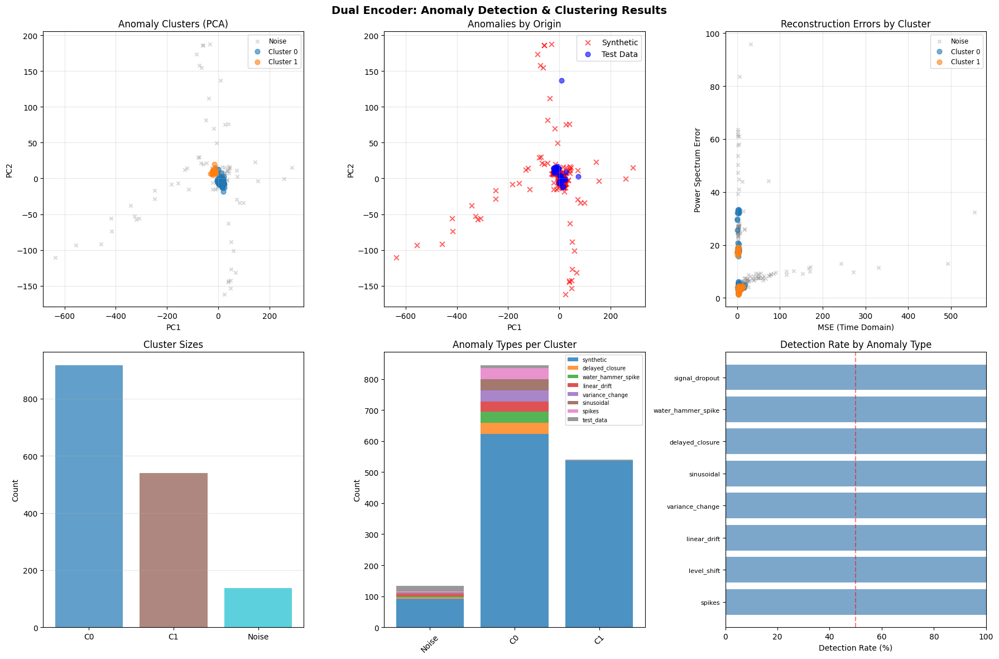


✅ Results saved to 'anomalies_added/dual_encoder_clustering.png'

DUAL ENCODER TESTING + CLUSTERING COMPLETE!


In [24]:
# ==============================================================================
# DUAL ENCODER: TESTING ON SYNTHETIC ANOMALIES + TEST SET + CLUSTERING
# ==============================================================================
# This cell:
# 1. Tests the dual encoder on synthetic anomalies (from previous cells)
# 2. Tests on real test data
# 3. Combines and clusters all detected anomalies
# 4. Visualizes the clustering results
#
# Requirements: Run the dual encoder training cell first (cell 22)
# ==============================================================================

import hdbscan
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import linkage, dendrogram
import pickle

print("="*70)
print("DUAL ENCODER: SYNTHETIC ANOMALY TESTING + CLUSTERING")
print("="*70)

# Check if dual encoder models are available
if 'models_dual' not in globals() or models_dual is None or len(models_dual) == 0:
    raise RuntimeError("Dual encoder models not found. Run the dual encoder training cell first.")

print(f"Using dual encoder models: {list(models_dual.keys())}")

# ==============================================================================
# 1. LOAD SYNTHETIC ANOMALIES
# ==============================================================================
print("\n" + "="*70)
print("1. LOADING SYNTHETIC ANOMALIES")
print("="*70)

# Try to load from pickle file or use from globals
X_anomalous = None
anomaly_metadata = None
X_original = None

synthetic_path = 'anomalies_added/anomalous_training_windows.pkl'
if os.path.exists(synthetic_path):
    print(f"   Loading from {synthetic_path}...")
    with open(synthetic_path, 'rb') as f:
        synthetic_data = pickle.load(f)
    
    if 'X_anomalous' in synthetic_data:
        X_anomalous = synthetic_data['X_anomalous']
        anomaly_metadata = synthetic_data.get('anomaly_metadata', [])
        X_original = synthetic_data.get('X_original', None)
        print(f"   Loaded {len(X_anomalous)} synthetic anomalous windows")
        print(f"   Anomaly metadata entries: {len(anomaly_metadata)}")
else:
    print("   ⚠️  No synthetic anomalies file found at 'anomalies_added/anomalous_training_windows.pkl'")
    print("   Run the synthetic anomaly generation cell first!")

# ==============================================================================
# 2. SEPARATE SYNTHETIC WINDOWS INTO BOOLEAN AND ANALOG
# ==============================================================================
if X_anomalous is not None:
    print("\n" + "="*70)
    print("2. SEPARATING SYNTHETIC WINDOWS")
    print("="*70)
    
    X_anomalous_boolean = []
    X_anomalous_analog = []
    
    for window in X_anomalous:
        # Window shape: (2160,) = 6 signals × 360 timesteps
        window_2d = window.reshape(360, len(SIGNALS))
        
        bool_window = []
        analog_window = []
        for sig in SIGNALS:
            sig_idx = SIGNALS.index(sig)
            sig_data = window_2d[:, sig_idx]
            if sig in BOOLEAN_SIGNALS:
                bool_window.append(sig_data)
            elif sig in ANALOG_SIGNALS:
                analog_window.append(sig_data)
        
        X_anomalous_boolean.append(np.array(bool_window).T.flatten())
        X_anomalous_analog.append(np.array(analog_window).T.flatten())
    
    X_anomalous_boolean = np.array(X_anomalous_boolean)
    X_anomalous_analog = np.array(X_anomalous_analog)
    
    print(f"   Synthetic Boolean: {X_anomalous_boolean.shape}")
    print(f"   Synthetic Analog: {X_anomalous_analog.shape}")

# ==============================================================================
# 3. DETECT ANOMALIES IN SYNTHETIC DATA
# ==============================================================================
if X_anomalous is not None:
    print("\n" + "="*70)
    print("3. DETECTING ANOMALIES IN SYNTHETIC DATA (DUAL ENCODER)")
    print("="*70)
    
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    # Compute MSE for synthetic data (using both encoders)
    mse_synthetic_list = []
    
    if 'boolean' in models_dual and X_anomalous_boolean is not None:
        X_bool_scaled = scalers_dual['boolean'].transform(X_anomalous_boolean)
        models_dual['boolean'].eval()
        with torch.no_grad():
            recon_bool, _ = models_dual['boolean'](torch.FloatTensor(X_bool_scaled).to(device))
            mse_bool = ((recon_bool.cpu().numpy() - X_bool_scaled) ** 2).mean(axis=1)
            mse_synthetic_list.append(mse_bool)
    
    if 'analog' in models_dual and X_anomalous_analog is not None:
        X_analog_scaled = scalers_dual['analog'].transform(X_anomalous_analog)
        models_dual['analog'].eval()
        with torch.no_grad():
            recon_analog, _ = models_dual['analog'](torch.FloatTensor(X_analog_scaled).to(device))
            mse_analog = ((recon_analog.cpu().numpy() - X_analog_scaled) ** 2).mean(axis=1)
            mse_synthetic_list.append(mse_analog)
    
    mse_synthetic = np.mean(mse_synthetic_list, axis=0) if mse_synthetic_list else None
    
    # Compute power spectrum error for synthetic data
    ps_synthetic_list = []
    
    if 'boolean' in models_dual and X_anomalous_boolean is not None:
        X_bool_scaled = scalers_dual['boolean'].transform(X_anomalous_boolean)
        models_dual['boolean'].eval()
        with torch.no_grad():
            recon_bool, _ = models_dual['boolean'](torch.FloatTensor(X_bool_scaled).to(device))
            recon_bool_inv = scalers_dual['boolean'].inverse_transform(recon_bool.cpu().numpy())
        
        # Compute power spectrum
        bool_3d = X_anomalous_boolean.reshape(len(X_anomalous_boolean), 360, len(BOOLEAN_SIGNALS))
        recon_bool_3d = recon_bool_inv.reshape(len(X_anomalous_boolean), 360, len(BOOLEAN_SIGNALS))
        ps_errors = []
        for i in range(len(X_anomalous_boolean)):
            for sig_idx in range(len(BOOLEAN_SIGNALS)):
                sig_orig = bool_3d[i, :, sig_idx]
                sig_recon = recon_bool_3d[i, :, sig_idx]
                sig_orig_centered = sig_orig - np.mean(sig_orig)
                sig_recon_centered = sig_recon - np.mean(sig_recon)
                windowed_orig = sig_orig_centered * scipy_signal.windows.hann(len(sig_orig_centered))
                windowed_recon = sig_recon_centered * scipy_signal.windows.hann(len(sig_recon_centered))
                fft_orig = fft(windowed_orig)
                fft_recon = fft(windowed_recon)
                power_orig = np.abs(fft_orig) ** 2
                power_recon = np.abs(fft_recon) ** 2
                log_power_orig = np.log10(power_orig + 1e-10)
                log_power_recon = np.log10(power_recon + 1e-10)
                ps_errors.append(np.mean((log_power_orig - log_power_recon) ** 2))
        ps_synthetic_list.append(np.array(ps_errors).reshape(len(X_anomalous_boolean), len(BOOLEAN_SIGNALS)).mean(axis=1))
    
    if 'analog' in models_dual and X_anomalous_analog is not None:
        ps_synthetic_list.append(compute_power_spectrum_error(
            models_dual['analog'], scalers_dual['analog'], X_anomalous_analog, ANALOG_SIGNALS
        ))
    
    ps_synthetic = np.mean(ps_synthetic_list, axis=0) if ps_synthetic_list else None
    
    # Use thresholds from training (flags_dual)
    if flags_dual is not None:
        mse_threshold = flags_dual['mse_threshold']
        ps_threshold = flags_dual['power_spectrum_threshold']
    else:
        # Compute from training data
        mse_train_combined = np.concatenate([
            ((scalers_dual['boolean'].transform(X_boolean_train) - 
              models_dual['boolean'](torch.FloatTensor(scalers_dual['boolean'].transform(X_boolean_train)).to(device))[0].cpu().detach().numpy()) ** 2).mean(axis=1),
            ((scalers_dual['analog'].transform(X_analog_train) - 
              models_dual['analog'](torch.FloatTensor(scalers_dual['analog'].transform(X_analog_train)).to(device))[0].cpu().detach().numpy()) ** 2).mean(axis=1)
        ])
        mse_threshold = np.percentile(mse_train_combined, 95)
        ps_threshold = np.percentile(ps_synthetic, 95)
    
    # Detect anomalies
    synthetic_time_anomaly = mse_synthetic > mse_threshold if mse_synthetic is not None else np.zeros(len(X_anomalous), dtype=bool)
    synthetic_freq_anomaly = ps_synthetic > ps_threshold if ps_synthetic is not None else np.zeros(len(X_anomalous), dtype=bool)
    synthetic_is_anomaly = synthetic_time_anomaly | synthetic_freq_anomaly
    
    print(f"\n   Synthetic Anomaly Detection (Dual Encoder):")
    print(f"     Total synthetic windows: {len(synthetic_is_anomaly)}")
    print(f"     Detected as anomaly: {sum(synthetic_is_anomaly)} ({100*sum(synthetic_is_anomaly)/len(synthetic_is_anomaly):.1f}%)")
    print(f"     Time domain only: {sum(synthetic_time_anomaly & ~synthetic_freq_anomaly)}")
    print(f"     Frequency domain only: {sum(synthetic_freq_anomaly & ~synthetic_time_anomaly)}")
    print(f"     Both methods: {sum(synthetic_time_anomaly & synthetic_freq_anomaly)}")

# ==============================================================================
# 4. EXTRACT LATENT REPRESENTATIONS
# ==============================================================================
if X_anomalous is not None and 'latent_test_dual' in globals():
    print("\n" + "="*70)
    print("4. EXTRACTING LATENT REPRESENTATIONS")
    print("="*70)
    
    # Synthetic latent
    latent_synthetic = extract_dual_latent(models_dual, scalers_dual, X_anomalous_boolean, X_anomalous_analog)
    print(f"   Synthetic latent shape: {latent_synthetic.shape if latent_synthetic is not None else 'None'}")
    print(f"   Test latent shape: {latent_test_dual.shape if latent_test_dual is not None else 'None'}")

# ==============================================================================
# 5. COMBINE AND CLUSTER ALL ANOMALIES
# ==============================================================================
if X_anomalous is not None and 'flags_dual' in globals() and flags_dual is not None:
    print("\n" + "="*70)
    print("5. CLUSTERING ALL DETECTED ANOMALIES")
    print("="*70)
    
    # Get indices of detected anomalies
    synthetic_anomaly_indices = np.where(synthetic_is_anomaly)[0]
    test_anomaly_indices = np.where(flags_dual['is_anomaly'])[0]
    
    print(f"   Synthetic anomalies to cluster: {len(synthetic_anomaly_indices)}")
    print(f"   Test anomalies to cluster: {len(test_anomaly_indices)}")
    
    if len(synthetic_anomaly_indices) > 0 or len(test_anomaly_indices) > 0:
        # Combine latent representations of detected anomalies
        all_latent = []
        all_origins = []  # 0 = synthetic, 1 = test
        all_types = []
        all_mse = []
        all_ps = []
        
        # Add synthetic anomalies
        if len(synthetic_anomaly_indices) > 0 and latent_synthetic is not None:
            all_latent.append(latent_synthetic[synthetic_anomaly_indices])
            all_origins.extend([0] * len(synthetic_anomaly_indices))
            
            # Get anomaly types from metadata
            for idx in synthetic_anomaly_indices:
                if anomaly_metadata and idx < len(anomaly_metadata):
                    anom_type = anomaly_metadata[idx].get('anomaly_type', 'unknown')
                else:
                    anom_type = 'synthetic'
                all_types.append(anom_type)
            
            all_mse.extend(mse_synthetic[synthetic_anomaly_indices].tolist())
            all_ps.extend(ps_synthetic[synthetic_anomaly_indices].tolist())
        
        # Add test anomalies
        if len(test_anomaly_indices) > 0 and latent_test_dual is not None:
            all_latent.append(latent_test_dual[test_anomaly_indices])
            all_origins.extend([1] * len(test_anomaly_indices))
            all_types.extend(['test_data'] * len(test_anomaly_indices))
            all_mse.extend(flags_dual['mse'][test_anomaly_indices].tolist())
            all_ps.extend(flags_dual['power_spectrum_error'][test_anomaly_indices].tolist())
        
        if all_latent:
            all_latent = np.vstack(all_latent)
            all_origins = np.array(all_origins)
            all_mse = np.array(all_mse)
            all_ps = np.array(all_ps)
            
            print(f"\n   Combined latent shape: {all_latent.shape}")
            print(f"   Unique anomaly types: {len(set(all_types))}")
            
            # ==============================================================================
            # 5.1 HDBSCAN CLUSTERING
            # ==============================================================================
            print("\n   Running HDBSCAN clustering...")
            
            # PCA reduction for better clustering
            n_components = min(32, all_latent.shape[1], all_latent.shape[0] - 1)
            pca = PCA(n_components=n_components)
            latent_pca = pca.fit_transform(all_latent)
            print(f"   PCA: {all_latent.shape[1]} -> {n_components} dimensions")
            print(f"   Explained variance: {sum(pca.explained_variance_ratio_)*100:.1f}%")
            
            # HDBSCAN
            min_cluster_size = max(3, len(all_latent) // 20)
            clusterer = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size, metric='euclidean', prediction_data=True)
            cluster_labels = clusterer.fit_predict(latent_pca)
            
            n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)
            n_noise = sum(cluster_labels == -1)
            
            print(f"\n   HDBSCAN Results:")
            print(f"     Clusters found: {n_clusters}")
            print(f"     Noise points: {n_noise}")
            
            # Silhouette score
            if n_clusters >= 2 and n_noise < len(cluster_labels) - 1:
                non_noise = cluster_labels >= 0
                if sum(non_noise) >= 2:
                    silhouette = silhouette_score(latent_pca[non_noise], cluster_labels[non_noise])
                    print(f"     Silhouette score: {silhouette:.3f}")
            
            # ==============================================================================
            # 5.2 CLUSTER COMPOSITION
            # ==============================================================================
            print("\n   Cluster Composition:")
            for cluster_id in sorted(set(cluster_labels)):
                mask = cluster_labels == cluster_id
                n_synthetic = sum((all_origins == 0) & mask)
                n_test = sum((all_origins == 1) & mask)
                cluster_types = [all_types[i] for i in range(len(mask)) if mask[i]]
                unique_types = list(set(cluster_types))
                
                label = f"Cluster {cluster_id}" if cluster_id >= 0 else "Noise"
                print(f"     {label}: {sum(mask)} anomalies ({n_synthetic} synthetic, {n_test} test)")
                print(f"       Types: {unique_types[:5]}{'...' if len(unique_types) > 5 else ''}")
            
            # ==============================================================================
            # 6. VISUALIZATION
            # ==============================================================================
            print("\n" + "="*70)
            print("6. VISUALIZING RESULTS")
            print("="*70)
            
            fig, axes = plt.subplots(2, 3, figsize=(18, 12))
            
            # 6.1 PCA plot colored by cluster
            ax = axes[0, 0]
            for cluster_id in sorted(set(cluster_labels)):
                mask = cluster_labels == cluster_id
                if cluster_id == -1:
                    ax.scatter(latent_pca[mask, 0], latent_pca[mask, 1], c='gray', alpha=0.3, s=20, label='Noise', marker='x')
                else:
                    ax.scatter(latent_pca[mask, 0], latent_pca[mask, 1], alpha=0.6, s=40, label=f'Cluster {cluster_id}')
            ax.set_xlabel('PC1')
            ax.set_ylabel('PC2')
            ax.set_title('Anomaly Clusters (PCA)')
            ax.legend(fontsize='small', loc='best')
            ax.grid(True, alpha=0.3)
            
            # 6.2 PCA plot colored by origin
            ax = axes[0, 1]
            ax.scatter(latent_pca[all_origins == 0, 0], latent_pca[all_origins == 0, 1], 
                      c='red', alpha=0.6, s=40, label='Synthetic', marker='x')
            ax.scatter(latent_pca[all_origins == 1, 0], latent_pca[all_origins == 1, 1], 
                      c='blue', alpha=0.6, s=40, label='Test Data', marker='o')
            ax.set_xlabel('PC1')
            ax.set_ylabel('PC2')
            ax.set_title('Anomalies by Origin')
            ax.legend()
            ax.grid(True, alpha=0.3)
            
            # 6.3 MSE vs Power Spectrum by cluster
            ax = axes[0, 2]
            for cluster_id in sorted(set(cluster_labels)):
                mask = cluster_labels == cluster_id
                if cluster_id == -1:
                    ax.scatter(all_mse[mask], all_ps[mask], c='gray', alpha=0.3, s=20, label='Noise', marker='x')
                else:
                    ax.scatter(all_mse[mask], all_ps[mask], alpha=0.6, s=40, label=f'Cluster {cluster_id}')
            ax.set_xlabel('MSE (Time Domain)')
            ax.set_ylabel('Power Spectrum Error')
            ax.set_title('Reconstruction Errors by Cluster')
            ax.legend(fontsize='small', loc='best')
            ax.grid(True, alpha=0.3)
            
            # 6.4 Cluster size distribution
            ax = axes[1, 0]
            cluster_ids = sorted([c for c in set(cluster_labels) if c >= 0])
            cluster_sizes = [sum(cluster_labels == c) for c in cluster_ids]
            noise_size = sum(cluster_labels == -1)
            labels = [f'C{c}' for c in cluster_ids] + ['Noise']
            sizes = cluster_sizes + [noise_size]
            colors = plt.cm.tab10(np.linspace(0, 1, len(labels)))
            ax.bar(labels, sizes, color=colors, alpha=0.7)
            ax.set_ylabel('Count')
            ax.set_title('Cluster Sizes')
            ax.grid(True, alpha=0.3, axis='y')
            
            # 6.5 Anomaly type distribution per cluster
            ax = axes[1, 1]
            unique_types_all = list(set(all_types))
            type_counts_per_cluster = {}
            for cluster_id in sorted(set(cluster_labels)):
                mask = cluster_labels == cluster_id
                cluster_types = [all_types[i] for i in range(len(mask)) if mask[i]]
                type_counts = {t: cluster_types.count(t) for t in unique_types_all}
                type_counts_per_cluster[cluster_id] = type_counts
            
            # Stacked bar chart
            x = np.arange(len(sorted(set(cluster_labels))))
            bottom = np.zeros(len(x))
            for t in unique_types_all[:8]:  # Limit to 8 types for readability
                heights = [type_counts_per_cluster.get(c, {}).get(t, 0) for c in sorted(set(cluster_labels))]
                ax.bar(x, heights, bottom=bottom, label=t, alpha=0.8)
                bottom += heights
            ax.set_xticks(x)
            ax.set_xticklabels([f'C{c}' if c >= 0 else 'Noise' for c in sorted(set(cluster_labels))], rotation=45)
            ax.set_ylabel('Count')
            ax.set_title('Anomaly Types per Cluster')
            ax.legend(fontsize='x-small', loc='best')
            
            # 6.6 Detection accuracy by anomaly type
            ax = axes[1, 2]
            if anomaly_metadata:
                type_detection = {}
                for idx, is_det in enumerate(synthetic_is_anomaly):
                    if idx < len(anomaly_metadata):
                        t = anomaly_metadata[idx].get('anomaly_type', 'unknown')
                        if t not in type_detection:
                            type_detection[t] = {'total': 0, 'detected': 0}
                        type_detection[t]['total'] += 1
                        if is_det:
                            type_detection[t]['detected'] += 1
                
                types = list(type_detection.keys())
                rates = [type_detection[t]['detected'] / type_detection[t]['total'] * 100 for t in types]
                
                y_pos = np.arange(len(types))
                ax.barh(y_pos, rates, color='steelblue', alpha=0.7)
                ax.set_yticks(y_pos)
                ax.set_yticklabels(types, fontsize=8)
                ax.set_xlabel('Detection Rate (%)')
                ax.set_title('Detection Rate by Anomaly Type')
                ax.axvline(x=50, color='red', linestyle='--', alpha=0.5)
                ax.set_xlim(0, 100)
            
            plt.suptitle('Dual Encoder: Anomaly Detection & Clustering Results', fontsize=14, fontweight='bold')
            plt.tight_layout()
            plt.savefig('anomalies_added/dual_encoder_clustering.png', dpi=150, bbox_inches='tight')
            plt.show()
            
            print("\n✅ Results saved to 'anomalies_added/dual_encoder_clustering.png'")

print("\n" + "="*70)
print("DUAL ENCODER TESTING + CLUSTERING COMPLETE!")
print("="*70)
